# UH-WRRC- ASPA  FloPy model of Tutuila Island

NOTE This model is UNDER DEVELOPMENT and is by no means a finished producct!
### Created by Chris Shuler with support from Katrina Mariner (ASPA) and Aly El-Kadi (UHWRRC). 

basic information about the model and a description of how to run components, modify parameters, and substitute new data.  

### Notebook Set Up. Specify modules and paths. hopefully all modules are installed, if not may need to 
- explore the environment.yml file and see if anything is missing from the environment
- explore the local environments to address any issues
- rebuild the environment with environment.yml or manually 

In [1]:
from IPython.display import display, HTML      # wide screen
display(HTML(data=""" <style>     div#notebook-container { width: 95%;} div#menubar-container { width: 85%; } div#maintoolbar-container { width: 99%; } </style> """))

import os
import sys
import platform
import math
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import flopy
import flopy.utils.binaryfile as bf
from flopy.export.shapefile_utils import shp2recarray
from rasterio import Affine
from flopy.utils.reference import SpatialReference
import shapefile    # not used directly here but for some reason flopy needs this to do shapefile stuff and BTW its not import pyshp as you would think its import shapefile, dumb...
import pandas as pd
import fiona
from rasterio.features import rasterize
import rasterio
import rasterio.mask
import geopandas
from osgeo import gdal

import simplekml
import ogr
from shapely.wkb import loads

from scipy.interpolate import interp2d
import scipy.optimize as opt

GIS_files = os.path.join(".", 'GIS_Data')       # path to the GIS data folder

print(sys.version)
print('numpy version: {}'.format(np.__version__))
print('matplotlib version: {}'.format(mpl.__version__))
print('flopy version: {}'.format(flopy.__version__))
print('fiona version: {}'.format(fiona.__version__))
print('rasterio version: {}'.format(rasterio.__version__))
print('geopandas version: {}'.format(geopandas.__version__))
print('gdal version: {}'.format(gdal.__version__))

#Set name of MODFLOW exe
#  assumes executable is in users path statement
exe_name = 'mf2005'
if platform.system() == 'Windows':
    exe_name = 'mf2005.exe'

workspace = os.path.join('Flo_py_wrkspace')
#make sure workspace directory exists
if not os.path.exists(workspace):
    os.makedirs(workspace)
    
figurespace = os.path.join(workspace, "Figures")
if not os.path.exists(figurespace):
    os.makedirs(figurespace)

# define some spatial reference objects
WGS84UTM2S_string = 'PROJCS["WGS_1984_UTM_Zone_2S",GEOGCS["GCS_WGS_1984",DATUM["D_WGS_1984",SPHEROID["WGS_1984",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-171],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["Meter",1]]'
model_epsg = 32702   # epsg code specifying coordinate reference system: in this case, UTM zone 2S, WGS 84, A proj4 string has also been fetched from <spatialreference.org> using the supplied epsg code.


flopy is installed in C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\flopy
3.7.3 | packaged by conda-forge | (default, Jul  1 2019, 22:01:29) [MSC v.1900 64 bit (AMD64)]
numpy version: 1.16.4
matplotlib version: 3.1.1
flopy version: 3.2.12
fiona version: 1.8.6
rasterio version: 1.0.24
geopandas version: 0.5.1
gdal version: 2.4.1


### Toggles: different options that can be changed

In [2]:
# in line plotting and saving options. Change these to plot or not to plot inline
Plotnsave_plot = True
Plotnsave_save = True

# flag for either using manually entered values for HK or optomized values. once the optimizer is run the flag will change to true and will use the optimiezd set in memory, run this cell to reset 
optimized_flag = False

# toggle this for interactive plots
%matplotlib notebook 
# toggle this for simple plots (nneded for optimization plots)
#%matplotlib inline   

pd.set_option('display.max_rows', 100)    # change number of rows to display if want
np.set_printoptions(suppress=True)       # does anyone else find scientific notation to be annoying?

# Modifieable Groundwater Model Prameters: 
### These can be modified by the user by replacing any number to simuate different conditions 
please note that some parameters or combinations of parameters may create errors or cause the model to not converge. 

In [3]:
# grid size 
ncol = 200       # number of model columns default is 200
nrow = 100       # number of model rows default is 100
nlay = 1         # number of model layers default is 1               ###### Note I need to make t he model able to handle miltiple layers, set up for one right now  #####

# model run times and stress period data
Number_of_years = 400                           # number of years to run the model, other inputs below are scaled off of this number (since default MODFLOW time unit is in days)
nper = 1                                        # Number of model stress periods default is 1
perlen = [365.25*Number_of_years]               # array of the stress period lengths in days separated by commas
nstp = [Number_of_years]                        # Number of time steps in each stress period (default is 1 per year).           
tsmult = 1                                      # Time step multiplier, can be used to make more timesetps at beginning of run, and less at end (use a number just a bit more than 1 like 1.05)
steady = True

# output control parameters
Save_every_how_many_steps = 20                  # essentially used for SWI to save the elevation of the interface every x time steps, defaut is 20
spd = {}
for istp in range(Save_every_how_many_steps-1, nstp[0]+1, Save_every_how_many_steps):   # format the above for modflow 
    spd[(0, istp)] = ['save head', 'print budget']
    spd[(0, istp+1)] = []

# Input Datasets
This cell defines all paths to external input datasets, and thereby provides a list of all model inputs 

In [4]:
# Tutuila coastline polygon Source: AS-DOC GIS portal  (http://portal.gis.doc.as/)  (site currently down) 
TUT_POLY_SHP = os.path.join(GIS_files, 'tut_poly.shp')

# 10 m resolution DEM Source: NOAA (https://data.noaa.gov/dataset/dataset/pago-pago-american-samoa-3-arc-second-mhw-coastal-digital-elevation-model)
DEM10MPRJ1_TIF = os.path.join("..", "..",  'Static_Data_Storage', 'GIS', 'dem10mprj1.tif')

# -50 m bathymetry contour line from DEM. Produced in Arc MAp 
IBOUND_SHP = os.path.join(GIS_files, 'ibound.shp')

# Tutuila coastline polygon Source: AS-DOC GIS portal  (http://portal.gis.doc.as/)  (site currently down) 
TUT_POLY_FOR_GHB_SHP = os.path.join(GIS_files, 'Tut_poly_for_GHB.shp')

# Pre-development water levels spreadsheet. Compiled from drillers logs and pump tests
PREDEVELOP_WLS_2_CSV = os.path.join("..", "..", 'Static_Data_Storage', 'GIS','Predevelop_WLs_2.csv')

# Simplified geologic units. Originally from Stearns, (1944)
SIMPLE_2  = os.path.join(GIS_files, "Simple_2")

# From SWB2 model module in this integrated framework. 
NET_INFILTRATION_ANNUAL_ASC = os.path.join("..", "..", "..", 'ASPA-UH-SWB2_REPO\\output\\post_prcessed_with_MFR\\net_infiltration_annual.asc')  

# monitoring well data from this  integrated framework. 
MON_WELL_MEASUREMENT_SHEET = os.path.join("..", "..", "..",  "ASPA-UH_MonWells", "workspace", "Ave_WL_MSL_m_mon_wells.csv")

### Model geometry definition based on a user supplied shapefile

Shapefile Boundaries: (516771.84375001956, 8410923.999999458, 547311.6875000503, 8425832.999999477)
wrote Flo_py_wrkspace\Model_polyarea.shp
wrote Flo_py_wrkspace\Model_grid.shp


<IPython.core.display.Javascript object>


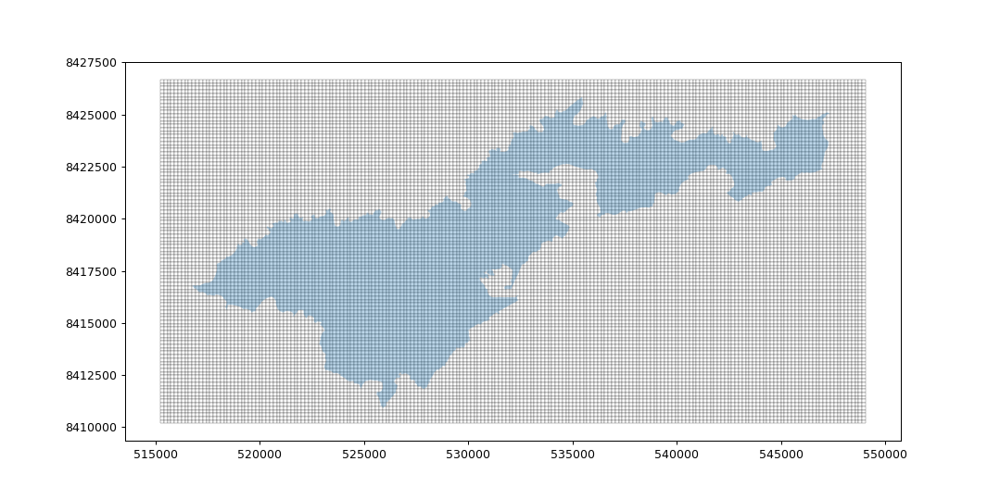

In [5]:
# this inports the boundary shapefile to make the model around
ra = shp2recarray(TUT_POLY_SHP)
# these are the bondaries of the shapefile
shp_xmin = ra.geometry[0].bounds[0]
shp_ymin = ra.geometry[0].bounds[1]
shp_xmax = ra.geometry[0].bounds[2]
shp_ymax = ra.geometry[0].bounds[3]
print("Shapefile Boundaries: {}".format(ra.geometry[0].bounds))   
#ra.geometry[0].plot() 

xll = int(shp_xmin-(shp_xmax-shp_xmin)*.05)  # Lower left corner of model grid  (note 5% buffer around boundary)
yll = int(shp_ymin-(shp_ymax-shp_ymin)*.05)   # Lower left corner of model grid  (note 5% buffer around boundary)

# grid spacing as a percentage of model x domain (in model units) note 10% buffer around boundary
delr = abs(int((shp_xmax-shp_xmin)*(1/(ncol*.9))))   # the width of each cell
delc = abs(int((shp_ymax-shp_ymin)*(1/(nrow*.9))))   # the height of eech cell

delr_4_sr  = np.ones(ncol, dtype=float) * delr    # This just puts the above into an array for the sr object 
delc_4_sr = np.ones(nrow, dtype=float) * delc    

rotation = 0      # rotation (positive counterclockwise)


# create the model boundary area polygon
sr = SpatialReference(delr=[delr_4_sr.sum()], delc=[delc_4_sr.sum()], xll=xll, yll=yll, rotation=rotation, proj4_str=WGS84UTM2S_string, lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_polyarea.shp'))          # write a shapefile of the model area for later use
prj = open(os.path.join(workspace, 'Model_polyarea.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()     # write the .prj file manually
#print("corners are at {}".format(sr.get_extent()))

# create the model boundary grid polygon   (NOTE THIS MUST OVERWRITE THe PREVIOUS sr. definition!)
sr = SpatialReference(delr=delr_4_sr, delc=delc_4_sr, xll=xll, yll=yll, rotation=rotation, proj4_str= '+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs' , lenuni=2) #  # model length units (1 for feet, 2 for meters (default)) (also calculeted uper left corner of model) 
sr.write_shapefile(os.path.join(workspace, 'Model_grid.shp'))          # write a shapefile of the model grid for later use
prj = open(os.path.join(workspace, 'Model_grid.prj'), "w"); prj.write(WGS84UTM2S_string) ; prj.close()   # write the .prj file manually


if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize=(12,6))
    Tutuila = geopandas.read_file(TUT_POLY_SHP)
    Grid = geopandas.read_file(os.path.join(workspace, 'Model_grid.shp'))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2)
    Tutuila.plot(ax=ax, linewidth=2, alpha = .3)
    plt.savefig(os.path.join(figurespace, "Model_grid.png"))

### Assign Layer elevations all fancy like

<IPython.core.display.Javascript object>


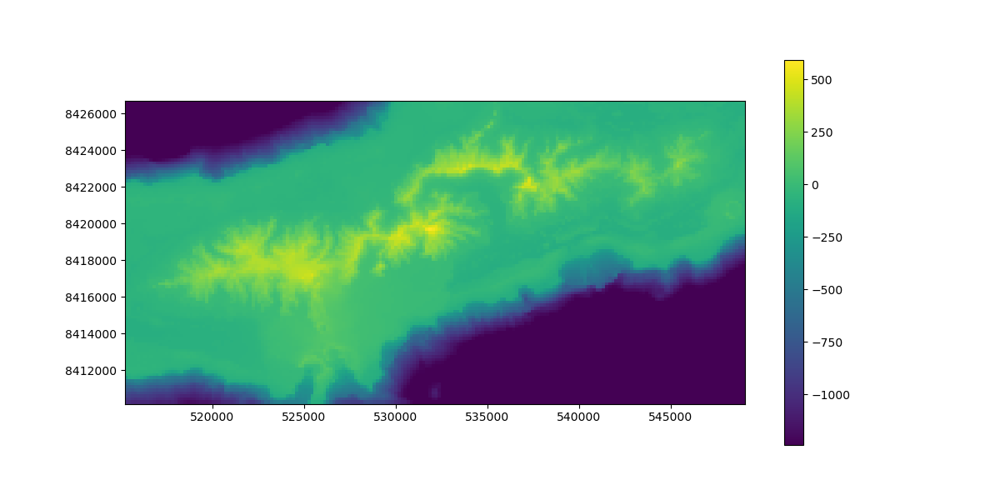

In [6]:
#Set model top to DEM
# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)
Raster_2_Clip = DEM10MPRJ1_TIF
Clipped_raster = os.path.join(workspace, "DEM_10m_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features,
                                                        crop=True)
out_meta = src.meta.copy()

out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})
with rasterio.open(Clipped_raster, "w", **out_meta) as dest:
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
Top_raw = np.loadtxt(Clipped_raster, skiprows=7)   # the 7th row was a no data row for some reason not sure why, if another DEM is used might need to skiprows back to 6

y = np.linspace(0, np.shape(Top_raw)[0]-1, np.shape(Top_raw)[0])   
x = np.linspace(0, np.shape(Top_raw)[1]-1, np.shape(Top_raw)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, Top_raw, kind='cubic')
top = f(x2, y2)

botm = -1250    # this will clearly need to change to accomadate the Tutuila bathymetry
top = np.where(top <= botm+10, botm+10, top) # force top elevations to always be higher than bottom elevations

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(top, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)
    plt.savefig(os.path.join(figurespace, "Top_elevations.png"))

## Set up an ibound array with land as active, shelf as specified head and offshore as inactive 

<IPython.core.display.Javascript object>


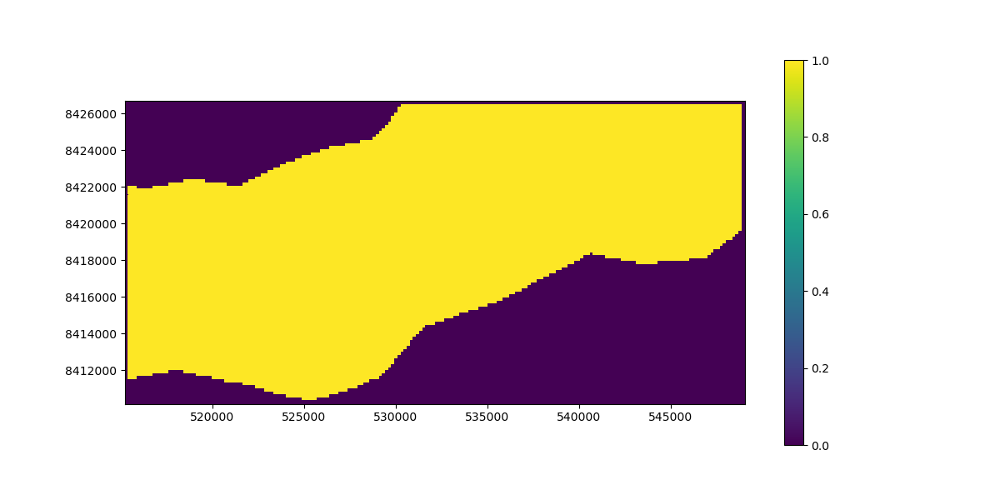

In [7]:
#### Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells

with fiona.open(IBOUND_SHP) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['spec_hed'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
ibound = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

# specify initial head 
ihead = np.ones((nlay, nrow, ncol), dtype=np.float)   # ncol
ihead = ihead -.9

#### Use a Tutuila polygon to define the model active area as the island the shelf as specified head, and the offshore as inactive

with fiona.open(TUT_POLY_FOR_GHB_SHP) as src:   #    read in Tutuila shapefile 
    records = [r for r in src]   
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['spec_hed']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

Spec_hed_map = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 


# final_ibound = Spec_hed_map + ibound                              # include a specified head boundary condition in addition to GHB  #seems to make the output messy if HK in ocean is high
final_ibound = ibound
final_ibound =  np.where(ibound == -1, 1, final_ibound)           # GHB condition only no specified head

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(final_ibound, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)
    plt.savefig(os.path.join(figurespace, "Ibound.png"))

### GHB boundary condtion definition

This is the general head boundary condition, Little to no user modification needs to be done to this, except for that fact that I dont exactly know how this works, and why it is not keeping the heads in the GHB area consistent at zero or 1 or whatever.  I think I need to do more research into how to use this module and it may need to be modified somewhat. 

<IPython.core.display.Javascript object>


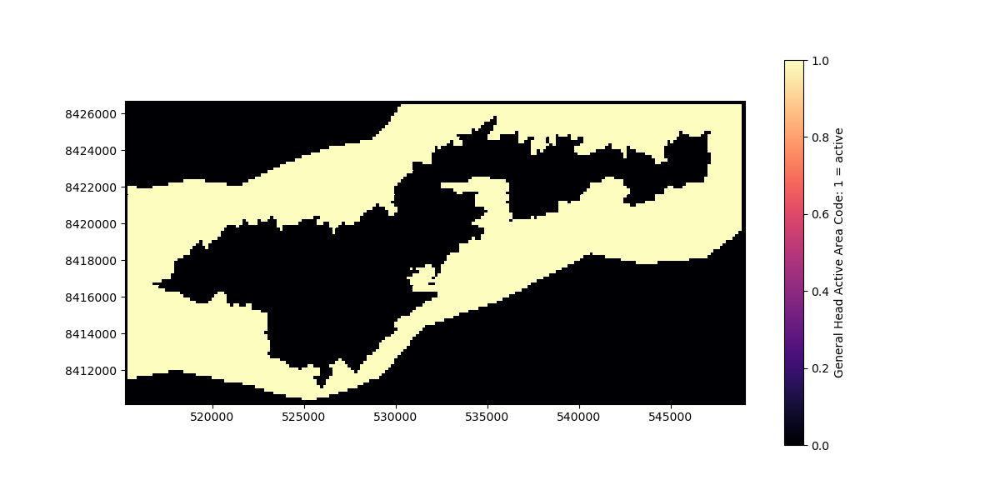

In [8]:
#### Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells
with fiona.open(IBOUND_SHP) as src:   #    read in Tutuila shapefile
    records = [r for r in src] 
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['Ibound'])for i, g in enumerate(geoms) ]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

GHB_bound = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 

####Now seting the GHB area  Use a Tutuila polygon to define the model active area as the island and the ghb cells as the offshore cells
with fiona.open(TUT_POLY_FOR_GHB_SHP) as src:   #    read in Tutuila shapefile
    records = [r for r in src]   
geoms = [r['geometry'] for r in records]       # shapefile shape
attr = [r['properties'] for r in records]      # shapefile attributes
geoms = [(g, attr[i]['Ibound']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
# affine: work with the geometry to change from raster to grid reference frame 
trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)

Inverse_GHBmap = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 
neg_array = np.ones((nrow, ncol), dtype=np.int)    # this is the shape array
ghb_geometry = (Inverse_GHBmap+neg_array)*GHB_bound

nghb = np.sum(ghb_geometry)     # this is the total number of General head cells in the model

colcell, rowcell = np.meshgrid(np.arange(0, ncol), np.arange(0, nrow))  # make mesh grid lists of all the dell indexes 

lrchc = np.zeros((nghb, 5))       # layer(int), row(int), column(int), stage(float), conductance(float) array pile this is what ghb package needs
lrchc[:, 0] = 0                                    # give it layer 1
lrchc[:, 1] = rowcell[ghb_geometry == 1]           # assign the specific row numbers for the active ghb cells
lrchc[:, 2] = colcell[ghb_geometry == 1]           # assign the specific col numbers for the active ghb cells
lrchc[:, 3] = .01                                  # this is the starting head value, maybe change to 1?
lrchc[:, 4] = 62.5                   # this is conductance values, probably change later
# create ghb dictionary
ghb_data = {0:lrchc}

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(ghb_geometry, ax=ax, cmap = 'magma')
    ax.set_aspect(1)
    plt.colorbar(qm, label = "General Head Active Area Code: 1 = active")
    plt.savefig(os.path.join(figurespace, "GHB.png"))

### Water level Observations
These observations are from a text file in the array inputs folder. New water level observations can simply be added to this text file. 
It would be idea for the user to save the new text file to a new name when adding obaservations, in this case the line below: 
    
    "Unique_frame = pd.read_csv(os.path.join('.',  "Array_inputs", 'Observation_data.txt'))"
    
will need to change to reflect tne new observation file name

<IPython.core.display.Javascript object>


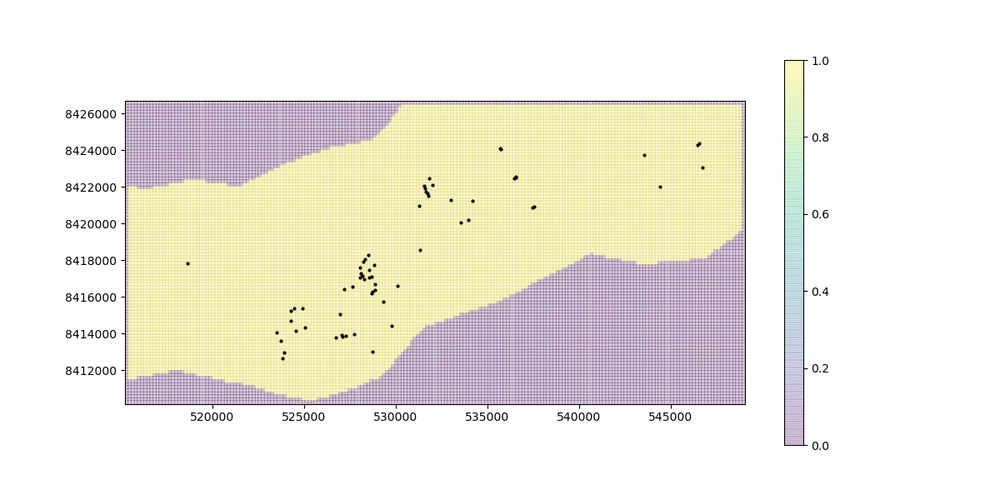

In [9]:
Pdevel_WLs = pd.read_csv(PREDEVELOP_WLS_2_CSV)

# Just stick on the data from the measured monitoring wells (it will average both values if repeated)
Mon_well_WLs = pd.read_csv(MON_WELL_MEASUREMENT_SHEET) 
del Mon_well_WLs['Well_num']
Pdevel_WLs = Pdevel_WLs.append(Mon_well_WLs, sort=False)

Pdevel_WLs['row_num'] = Pdevel_WLs['x_utm'].apply(lambda x_utm_val: math.ceil((x_utm_val-xll)/delr) )          # this formula calculates the column number based on the x coordinate 
Pdevel_WLs['col_num'] = Pdevel_WLs['y_utm'].apply(lambda y_utm_val: (1+nrow)-math.ceil((y_utm_val-yll)/delc) )   # this formula calculates the row number based on the y coordinate 
Pdevel_WLs['rowcol']  = list(zip(Pdevel_WLs.row_num, Pdevel_WLs.col_num))                                      # just make a tuplel of the row and col

# This takes obs wells that occupy the same cell and averages them! 
Unique_WLs = Pdevel_WLs.groupby('rowcol', as_index=False).mean()                                               # Average the duplicate WLs that fall into a single cell, to get one "observed" water level for that cell 

# make new unique names for each obs point
Unique_WLs["name"] = "Obs_"+Unique_WLs.index.map(str)

nobs = len(Unique_WLs['WL_m_MSL']) 
layervals = [0] * nobs
rowvals = list(Unique_WLs['col_num'].astype(int))
colvals = list(Unique_WLs['row_num'].astype(int))
obsvals = list(Unique_WLs['WL_m_MSL'])
obsnames = list(Unique_WLs["name"])

if Plotnsave_plot: 
    gdf = geopandas.GeoDataFrame(Unique_WLs, geometry=geopandas.points_from_xy(Unique_WLs.x_utm, Unique_WLs.y_utm))
    fig, ax = plt.subplots(figsize = (12,6))
    Grid.plot(ax=ax, facecolor="white", edgecolor="Black", linewidth=.2, alpha = .2)
    qm = sr.plot_array(final_ibound, ax=ax, alpha = .2)
    ax.set_aspect(1); plt.colorbar(qm)
    gdf.plot(ax=ax, color='black', markersize=4)
    plt.savefig(os.path.join(figurespace, "Obs_dots.png"))

### Hydraulic condictivty assigned based on zones as defined by shapefiles in a folder

The values at the top of this cell can be modified to change the conductivity in each zone

In [10]:
optimized_flag =False

In [20]:
# this cell either uses the below values or the optimized values for the forward run depending on if the optimizer has been run
Manual_values = [20.60906857, 100.89860934,   50.63843596,   0.04151735,   0.76703913,  0.07640442]
Manual_values = [    6.90595015, 17.5,      20.86986068,      1.42980804,   1.35841084,      20.18638169]
Manual_values = [   6.91181193, 10.0,    3.87141975,    0.43064608, 0.3584904 ,    1.19389606]

if optimized_flag == True:
    HK_values = results.x
    print("Using: optimized values {}".format(HK_values))
    
else:
    HK_values = Manual_values
    print("Using: manual HK values")

Using: manual HK values


In [21]:
# Function to rasterize the HK zones: 
def rastah_zone(shp):
    with fiona.open(shp) as src:   #    read in Tutuila shapefile
            records = [r for r in src]   
    geoms = [r['geometry'] for r in records]       # shapefile shape
    attr = [r['properties'] for r in records]      # shapefile attributes
    geoms = [(g, attr[i]['par_code']) for i, g in enumerate(geoms)]              # select the attribute to map onto the raster grid
    # affine: work with the geometry to change from raster to grid reference frame 
    trans = Affine(delr, rotation, sr.xul, sr.rotation, -delc, sr.yul)
    Outrastah = rasterize(geoms, out_shape=(nrow, ncol), transform=trans) # the actual rasterization 
    return Outrastah

# path to the location of shapefiles
HK_Zone_path = SIMPLE_2

# Rasterize the desired zones
Leone = rastah_zone(os.path.join(HK_Zone_path, 'Leone.shp'))
Tafuna = rastah_zone(os.path.join(HK_Zone_path, 'tafuna.shp'))
Pyro = rastah_zone(os.path.join(HK_Zone_path, 'pyro.shp'))
OldV_tapu = rastah_zone(os.path.join(HK_Zone_path, 'OldV_tapu.shp'))
OldV_Pago = rastah_zone(os.path.join(HK_Zone_path, 'OldV_Pago.shp'))
Malaeimi = rastah_zone(os.path.join(HK_Zone_path, 'Malaeimi.shp'))

HK_raster  = Leone + Tafuna + Pyro + OldV_tapu + OldV_Pago + Malaeimi  # merge all zones together

<IPython.core.display.Javascript object>


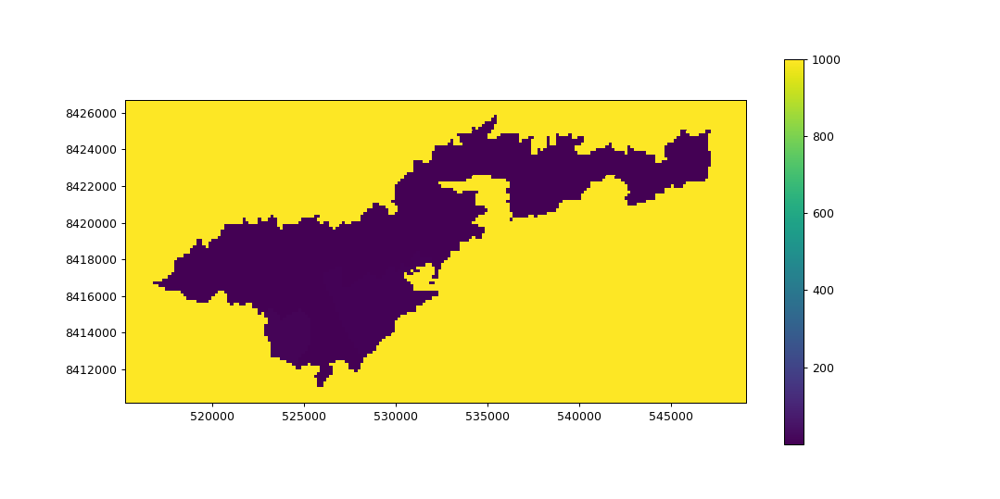

In [22]:
# set the  values

Taf_HK = HK_values[0]
Leo_HK = HK_values[1]
Pyro_HK = HK_values[2]
OVtap_HK = HK_values[3] 
OVpag_HK = HK_values[4]
Malaeimi_HK = HK_values[5]

# replace codes with actual HK values 
HK_raster = np.where(HK_raster== -10, Taf_HK, HK_raster) 
HK_raster = np.where(HK_raster== -20, Leo_HK, HK_raster)
HK_raster = np.where(HK_raster== -30, Pyro_HK, HK_raster)
HK_raster = np.where(HK_raster== -60, OVtap_HK, HK_raster)
HK_raster = np.where(HK_raster== -80, OVpag_HK, HK_raster)
HK_raster = np.where(HK_raster== -40, Malaeimi_HK, HK_raster)

HK_raster = np.where(HK_raster== 0, 1000, HK_raster)   # this is for the areas not covered by HK zones, Should not actually maatter at all!

HK_raster = np.where(HK_raster== -90, 1, HK_raster) # this is for the areas that get messed up somehow
HK_raster = np.where(HK_raster== -70, 1, HK_raster) # this is for the areas that get messed up somehow

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(HK_raster, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)
    plt.savefig(os.path.join(figurespace, "HK_Zones.png"))

'''Define the layers to be confined and define the horizontal and vertical 
hydraulic conductivity of the aquifer for the LPF package.'''

# lpf data
laytyp = 0
vka = 10

### Import Recharge .asc from SWB output into MODFLOW rech array
(note I am not sure what happens when the model area is bigger then the raster....)

<IPython.core.display.Javascript object>


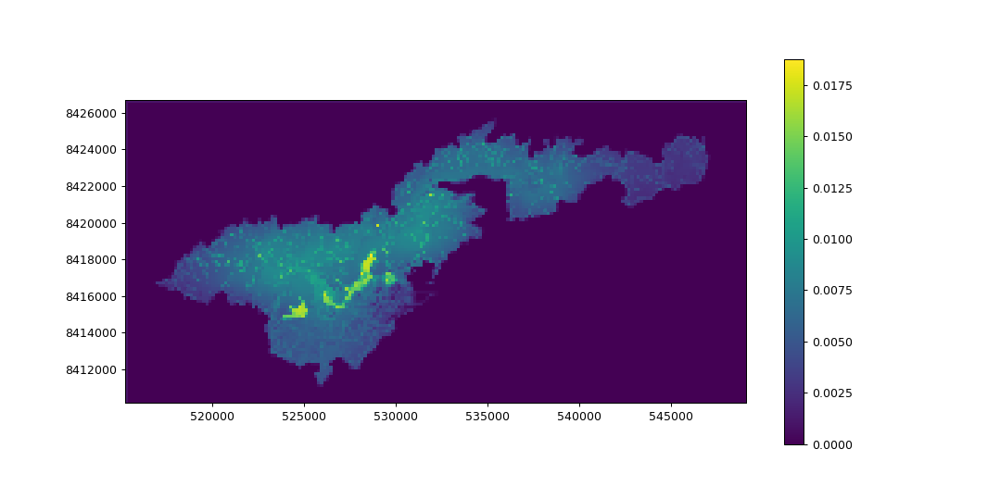

In [23]:
SWB_output_recharge = NET_INFILTRATION_ANNUAL_ASC

# Needed to clip the raster to appropriate dimensions, () https://rasterio.readthedocs.io/en/stable/topics/masking-by-shapefile.html)   
Raster_2_Clip = os.path.join(SWB_output_recharge)
Clipped_raster = os.path.join(workspace, "raw_net_infiltration_clip.asc")

with fiona.open(os.path.join(workspace, 'Model_polyarea.shp'), "r") as shapefile:
    features = [feature["geometry"] for feature in shapefile]
    
with rasterio.open(Raster_2_Clip) as src:
    out_image, out_transform = rasterio.mask.mask(src, features, crop=True)
    
out_meta = src.meta.copy()
out_meta.update({"driver": "AAIGrid",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

with rasterio.open(Clipped_raster, "w", **out_meta) as dest:          # create the new clipped .asc file
    dest.write(out_image)
    
# Now disect the clipped .asc into a 
recharge_raw_SWB = np.loadtxt(Clipped_raster, skiprows=6)

y = np.linspace(0, np.shape(recharge_raw_SWB)[0]-1, np.shape(recharge_raw_SWB)[0])   
x = np.linspace(0, np.shape(recharge_raw_SWB)[1]-1, np.shape(recharge_raw_SWB)[1])

y2 = np.linspace(0, np.shape(y)[0], nrow)   # this defines the number of cells to resample to on the y direction, first number is the original height of the SWB2 recharge map, second number is going to be new height in # of cells
x2 = np.linspace(0, np.shape(x)[0], ncol)   # this defines the number of cells to resample to on the x direction, first number is the original width of the SWB2 recharge map, second number is going to be new width in # of cells

f = interp2d(x, y, recharge_raw_SWB, kind='linear')
recharge_resampled = f(x2, y2)
recharge_converted =  recharge_resampled* (0.0254/365)   # recharge comes out of SWB in inches/year and needs to be converted to m/day

recharge_converted = np.where(recharge_converted < 0, 0.001, recharge_converted)   # Interpolation made some negative values, fix that issue by setting them to a positive value

rch_data = {0: recharge_converted}   # dictionary form to specify that it is only on first layer

if Plotnsave_plot: 
    fig, ax = plt.subplots(figsize = (12,6))
    qm = sr.plot_array(recharge_converted, ax=ax)
    ax.set_aspect(1); plt.colorbar(qm)
    plt.savefig(os.path.join(figurespace, "recharge_downsampled.png"))

### SWI saltwater intruction package, basic parameters
References:
- Docs = https://modflowpy.github.io/flopydoc/mfswi2.html?highlight=modflowswi2
- Publication = https://pubs.usgs.gov/tm/6a46/tm6-a46.pdf
- Example notebook 1 = https://github.com/modflowpy/flopy/blob/develop/examples/Notebooks/flopy3_swi2package_ex1.ipynb
- Example notebook 4 = https://github.com/modflowpy/flopy/blob/develop/examples/Notebooks/flopy3_swi2package_ex4.ipynb


<IPython.core.display.Javascript object>


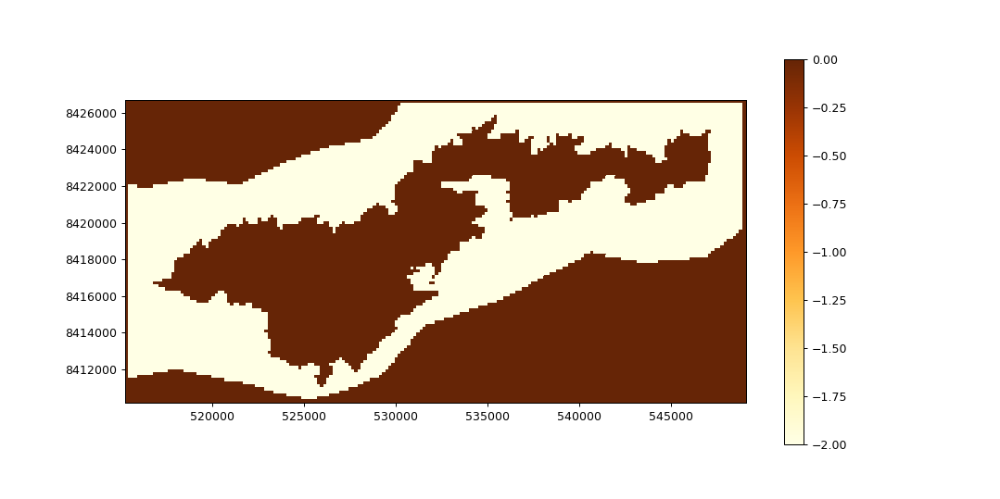

In [24]:
### SWI saltwater intruction package, basic parameters

Make_iso_tricky = Spec_hed_map + ibound

# swi2 data
nadptmx = 10       # user-defined maximum number of SWI2 time steps in any MODFLOW time step.
nadptmn = 1        # the user-defined minimum number of SWI2 time steps in any MODFLOW time step
nu = [0, 0.025]    # dimensionless density at the top of zone 1 and the dimensionless densities of the surface
numult = 5.0                              #Default from example was 5?
toeslope = nu[1] / numult  #0.005
tipslope = nu[1] / numult  #0.005
z1 = 0 * np.ones((nrow, ncol))
z1[final_ibound == 1] = -.5
z = np.array([[z1]])
iso = np.zeros((nlay, nrow, ncol), dtype=np.int)
iso[0][Make_iso_tricky == -1] = -2

ssz=0.02            # effectve porosity

nsrf = 1  # one freshwater zone and one seawater zone, separated by a single (nsrf = 1) active ZETA surface between the zones

istrat = 1   # Represent Fluid density using the stratified option

fig, ax = plt.subplots(figsize = (12,6))
qm = sr.plot_array(iso[0], ax=ax, cmap = 'YlOrBr')
ax.set_aspect(1); plt.colorbar(qm)

## Build model object - pre-prcess all files 

In [25]:
modelname = 'modelface'

ml = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)

discret = flopy.modflow.ModflowDis(ml, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                   delr=delr, delc=delc, top=top, botm=botm,
                                   nper=nper, perlen=perlen, nstp=nstp, tsmult=tsmult)

bas = flopy.modflow.ModflowBas(ml, ibound=final_ibound, strt=ihead)

lpf = flopy.modflow.ModflowLpf(ml, laytyp=laytyp, hk=HK_raster, vka=vka)

rch = flopy.modflow.ModflowRch(ml, rech=rch_data)

oc = flopy.modflow.ModflowOc(ml, stress_period_data=spd)

pcg = flopy.modflow.ModflowPcg(ml, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)

ghb = flopy.modflow.ModflowGhb(ml, stress_period_data=ghb_data)

#SWI package
swi = flopy.modflow.ModflowSwi2(ml, nsrf=nsrf, istrat=istrat , toeslope=toeslope, tipslope=tipslope, 
                                nu=nu,zeta=z, ssz=ssz, isource=iso, nsolver=1,
                                nadptmx=nadptmx, nadptmn=nadptmn, iswizt=55)

# water level observations
obs_data= []
for i in range(0,nobs):
    obs = flopy.modflow.HeadObservation(ml, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
    obs_data.append(obs)
hob = flopy.modflow.ModflowHob(ml, iuhobsv = 7, hobdry=-999, obs_data = obs_data)

In [26]:
ml.check()


modelface MODEL DATA VALIDATION SUMMARY:
  2 Warnings:
    OC package: action(s) defined in OC stress_period_data ignored as they are not part the stress periods defined by DIS
    RCH package: Mean R/T ratio < checker warning threshold of 2e-08 for 1 stress periods

  Checks that passed:
    Compatible solver package
    Unit number conflicts
    DIS package: zero or negative thickness
    DIS package: thin cells (less than checker threshold of 1.0)
    DIS package: nan values in top array
    DIS package: nan values in bottom array
    BAS6 package: isolated cells in ibound array
    BAS6 package: Not a number
    LPF package: zero or negative horizontal hydraulic conductivity values
    LPF package: zero or negative vertical hydraulic conductivity values
    LPF package: negative horizontal anisotropy values
    LPF package: horizontal hydraulic conductivity values below checker threshold of 1e-11
    LPF package: horizontal hydraulic conductivity values above checker threshold of 

### Run MODFLOW

In [27]:
ml.write_input()
ml.run_model(silent=False)

FloPy is using the following  executable to run the model: .\mf2005.exe

                                  MODFLOW-2005     
    U.S. GEOLOGICAL SURVEY MODULAR FINITE-DIFFERENCE GROUND-WATER FLOW MODEL
                             Version 1.12.00 2/3/2017                        

 Using NAME file: modelface.nam 
 Run start date and time (yyyy/mm/dd hh:mm:ss): 2019/09/11 17:38:18

 Solving:  Stress period:     1    Time step:     1    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     2    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     3    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     4    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     5    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     6    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     7    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:     8    Ground-Water Flo

 Solving:  Stress period:     1    Time step:   125    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   126    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   127    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   128    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   129    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   130    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   131    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   132    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   133    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   134    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   135    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   136    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   137    Ground-Wa

 Solving:  Stress period:     1    Time step:   230    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   231    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   232    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   233    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   234    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   235    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   236    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   237    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   238    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   239    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   240    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   241    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   242    Ground-Wa

 Solving:  Stress period:     1    Time step:   362    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   363    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   364    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   365    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   366    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   367    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   368    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   369    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   370    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   371    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   372    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   373    Ground-Water Flow Eqn.
 Solving:  Stress period:     1    Time step:   374    Ground-Wa

(True, [])

<IPython.core.display.Javascript object>


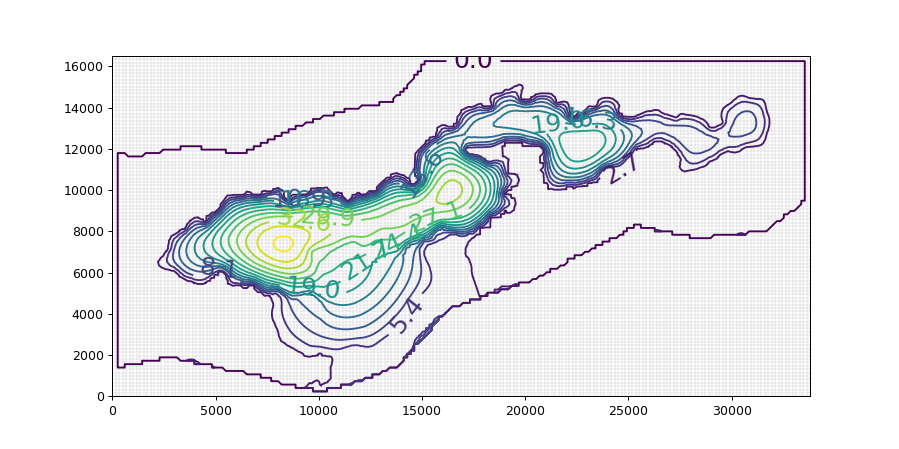

C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\flopy\plot\map.py:1356: PendingDeprecationWarning: ModelMap will be replaced by PlotMapView(); Calling PlotMapView()
  warnings.warn(err_msg, PendingDeprecationWarning)


Max head: 38.55m,  min min head 1.01m.


In [28]:
# Post process to graph the results

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 1, 1, aspect='equal')

#FV grid extent: (delr/2., Lx - delr/2., delc/2., Ly - delc/2.)
#wpt = ((wcol+0.5)*delr, Lx - ((wrow + 0.5)*delc)) # origing at low upper.. b

hds = bf.HeadFile(os.path.join(workspace, '{}.hds'.format(modelname)))
times = hds.get_times() # simulation time, steady state
head = hds.get_data(totim=times[-1])

##cbb = bf.CellBudgetFile(os.path.join(workspace, '{}.cbc'.format(modelname))) # read budget file
#kstpkper_list = cbb.get_kstpkper()
# cbb.textlist to get a list of data texts
##frf = cbb.get_data(text='FLOW RIGHT FACE', totim=times[-1])[0]
##fff = cbb.get_data(text='FLOW FRONT FACE', totim=times[-1])[0]

# flopy plot object
modelmap = flopy.plot.ModelMap(model=ml, layer=0)
# plot grid
lc = modelmap.plot_grid(alpha=.1) # grid
# plot contour
cs = modelmap.contour_array(head, levels=np.linspace(0, int(head.max()), 15)) # head contour
plt.clabel(cs, fontsize=20, fmt='%1.1f') # contour label
# plot discharge quiver
##quiver = modelmap.plot_discharge(frf, fff, head=head, alpha=.4)
plt.savefig(os.path.join(figurespace, "Head_countours.png"))

plt.show()

print('Max head: {0:1.2f}m,  min min head {1:1.2f}m.'.format(head.max(), (head[head != -999.99]).min()))   # print ma and min head values, and mask out no data values


## Observed vs Simulated plot

<IPython.core.display.Javascript object>


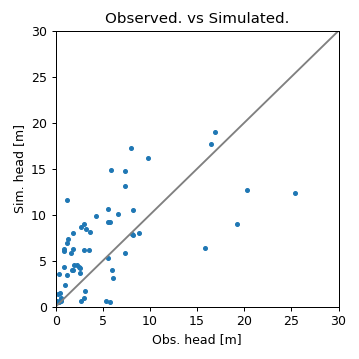

Mean Error: 0.17
Mean Absolute Error: 5.07
RMS Error: 8.48


In [29]:
# plot observations 
observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

# note positive residuals means model is calculating too high negative is model calculates too low 
residuals = []
for idx, i in enumerate(observations):   
    r = observations[idx][0]-observations[idx][1]
    residuals.append(r)

Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})

fig = plt.figure(figsize=(4,4))
plt.title('Observed. vs Simulated.')
plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
#plt.axis('equal')
#plt.axis('square')
plt.xlabel("Obs. head [m]")
plt.ylabel('Sim. head [m]')
plt.ylim(0,30)
plt.xlim(0,30)

plt.plot([0,20,30],[0,20,30], color= "grey")
plt.tight_layout()
plt.savefig(os.path.join(figurespace, "calibration_result.pdf"))

plt.show()

me = np.mean(Howd_we_do.Residual_m)
mea = np.mean(np.abs(Howd_we_do.Residual_m))
rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
print ('Mean Error: {:.2f}\nMean Absolute Error: {:.2f}\nRMS Error: {:.2f}'.format(me, mea, rmse))

# plot SWI

In [ ]:
# read base model zeta
zfile = flopy.utils.CellBudgetFile(os.path.join(ml.model_ws, modelname+'.zta'))   # read the raw data file produced by MODFLOW SWI2
kstpkper = zfile.get_kstpkper()                                                   # Get a list of unique stress periods and time steps in the file (timestep, stress period) 
zeta = []
for kk in kstpkper:
    zeta.append(zfile.get_data(kstpkper=kk, text='ZETASRF  1')[0])                # turn each surface into an array  Actually a Time x Layer x Col x Row array
zeta = np.array(zeta)

### Plot  E-W cross section

<IPython.core.display.Javascript object>


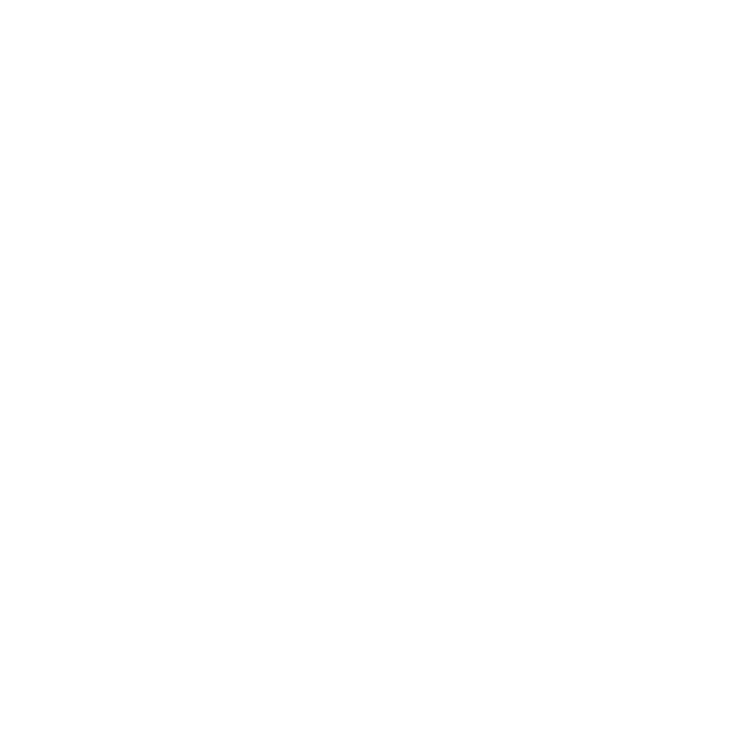

NameError: name 'kstpkper' is not defined

In [16]:
slicerow = 50

plt.rcParams.update({'legend.fontsize': 6, 'legend.frameon' : False})
fig = plt.figure(figsize=(10, 10), facecolor='w')
flft, frgt, fbot, ftop = 0.125, 0.95, 0.125, 0.925
fig.subplots_adjust(wspace=0.25, hspace=0.25, left=flft, right=frgt, bottom=fbot, top=ftop)

# Create arrays for cross section plotting the x-coordinates and the output years
xcell = np.linspace(0,ncol*delr,ncol)    

# extract years from the zeta array
years=[]                                      # as long as the time step is a 365.25 multiple of the stress period length otherwise this gets arbitrary!
for idx,val in enumerate(kstpkper):
    printyear = round(kstpkper[idx][0] ,1)
    years.append(printyear)
    
# line color definition  (tricky way to cycle through the colorramp)
icolor = len(years)
colormap = plt.cm.jet  #winter
cc = []
cr = np.linspace(0.9, 0.0, icolor)
for idx in cr:
    cc.append(colormap(idx))

# plot cross section
ax = plt.subplot2grid((2, 5), (0, 0), colspan=4)       # have to set up many subplot grid spots then span each plot different ammount cuz the colorbar makes it so the bottom plot doesnt line up (this took 1.5 hours of my life)
# axes limits
ax.set_xlim(0, ncol*delr)
ax.set_ylim(-1300, 10)
for idx in range(len(years)):
    ax.plot(xcell, zeta[idx, 0, slicerow, : ], drawstyle='steps-mid',                                # zeta[idx, 0, 50, :] means idx = timestep,  0 is layer 1 , # is row number to plot along, and : is plot all columns 
            linewidth=0.5, color=cc[idx], label='{:2d} years'.format(years[idx]))
# legend
plt.legend(loc='lower left')
# axes labels and text
ax.set_xlabel('Horizontal distance from model west edge, in meters')
ax.set_ylabel('Elevation, in meters')


# plan view figure 
ax2 = plt.subplot2grid((2, 5), (1, 0), colspan=5)
qm = sr.plot_array(zeta[-1][0], ax=ax2, alpha = .3)

ax2.set_aspect(1); plt.colorbar(qm)
ax2.set_xlabel("in m from lower left corner")
ax2.set_ylabel("in m from lower left corner")
ax2.set_xlim(sr.get_extent()[0], sr.get_extent()[1])
ax2.set_ylim(sr.get_extent()[2], sr.get_extent()[3])


x = np.linspace(0, ncol*delr, ncol)+sr.get_extent()[0]
y = np.ones(ncol)*np.linspace(nrow*delc,0, nrow)[slicerow]+sr.get_extent()[2]

# Scale the axes to have same units as the cross section plot
xtic_vals = ax2.get_xticks()
scale_ax2x = ax2.set_xticklabels(['{:1.0f}'.format(x -516771) for x in xtic_vals])
ytic_vals = ax2.get_yticks()
scale_ax2y = ax2.set_yticklabels(['{:1.0f}'.format(x -8410924) for x in ytic_vals])

if Plotnsave_plot: 
    ax2.plot(x,y, color = 'r')
    plt.show()
    plt.savefig(os.path.join(figurespace, "Horizontal_SWB2.png"))

### Plot  N-S cross section


<IPython.core.display.Javascript object>


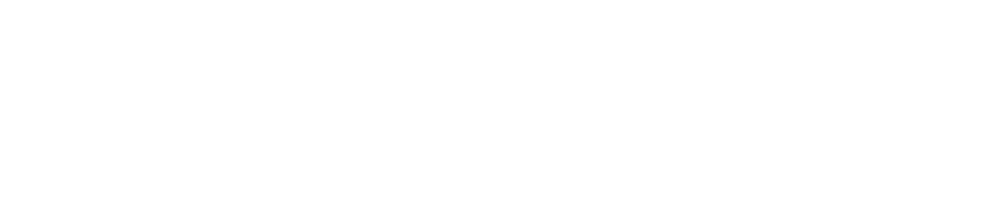

NameError: name 'kstpkper' is not defined

In [17]:
slicecol = 60

plt.rcParams.update({'legend.fontsize': 6, 'legend.frameon' : False})
fig = plt.figure(figsize=(20, 4), facecolor='w')

# Create arrays for cross section plotting the y-coordinates and the output years
#xcell = np.linspace(0,ncol*delr,200)    
xcell = np.linspace(0,nrow*delc,nrow)     

# extract years from the zeta array
years=[]                                      # as long as the time step is a 365.25 multiple of the stress period length otherwise this gets arbitrary!
for idx,val in enumerate(kstpkper):
    printyear = round(kstpkper[idx][0] ,1)
    years.append(printyear)
    
# line color definition  (tricky way to cycle through the colorramp)
icolor = len(years)
colormap = plt.cm.jet  #winter
cc = []
cr = np.linspace(0.9, 0.0, icolor)
for idx in cr:
    cc.append(colormap(idx))

# plot cross section
ax = plt.subplot2grid((1, 9), (0, 0), colspan=3) 
ax.set_xlim(0, nrow*delc)
ax.set_ylim(-1250, 10)
for idx in range(len(years)):
    ax.plot(xcell, zeta[idx, 0, :, slicecol ], drawstyle='steps-mid',                                # zeta[idx, 0, 50, :] means idx = timestep,  0 is layer 1 , # is row number to plot along, and : is plot all columns 
            linewidth=0.5, color=cc[idx], label='{:2d} years'.format(years[idx]))
# legend
plt.legend(loc='lower left')
# axes labels and text
ax.set_xlabel('Horizontal distance from model south edge, in meters')
ax.set_ylabel('Elevation, in meters')


# plan view figure 
ax2 = plt.subplot2grid((1, 9), (0, 3), colspan=5)
qm = sr.plot_array(zeta[-1][0], ax=ax2, alpha = .3)

ax2.set_aspect(1); plt.colorbar(qm)
ax2.set_xlabel("in m from lower left corner")
ax2.set_ylabel("in m from lower left corner")
ax2.set_xlim(sr.get_extent()[0], sr.get_extent()[1])
ax2.set_ylim(sr.get_extent()[2], sr.get_extent()[3])

y = (np.linspace(0, nrow*delc, nrow) )+ sr.get_extent()[2]
x = np.ones(nrow)*np.linspace(0, ncol*delr,ncol)[slicecol]+sr.get_extent()[0]

# Scale the axes to have same units as the cross section plot
xtic_vals = ax2.get_xticks()
scale_ax2x = ax2.set_xticklabels(['{:1.0f}'.format(x -516771) for x in xtic_vals])
ytic_vals = ax2.get_yticks()
scale_ax2y = ax2.set_yticklabels(['{:1.0f}'.format(abs(x -sr.get_extent()[3])) for x in ytic_vals])

if Plotnsave_plot: 
    ax2.plot(x,y, color = 'r')
    plt.show()
    plt.savefig(os.path.join(figurespace, "vertical_SWB2.png"))

<IPython.core.display.Javascript object>


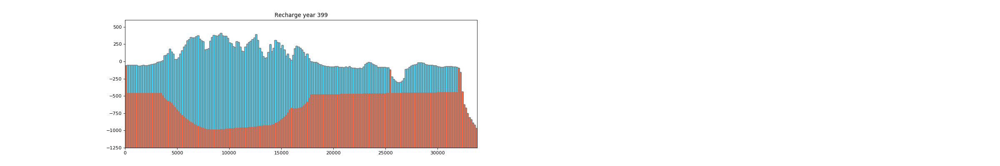

C:\Users\cshuler\Anaconda3\envs\ASPA_Framework\lib\site-packages\flopy\plot\crosssection.py:764: PendingDeprecationWarning: ModelCrossSection will be replaced by PlotCrossSection(), Calling PlotCrossSection()
  warnings.warn(err_msg, PendingDeprecationWarning)


In [34]:
fig = plt.figure(figsize=(30, 5))
colors = ['#40d3f7', '#F76541']

ax = fig.add_subplot(1, 2, 1)
modelxsect = flopy.plot.ModelCrossSection(model=ml, line={'Row': slicerow}, extent=(0, (delr*ncol), -1250, 600))
modelxsect.plot_fill_between(zeta[(np.shape(zeta)[0]-1), :, :, :], colors=colors, ax=ax, edgecolors='none')  
linecollection = modelxsect.plot_grid(ax=ax)
ax.set_title('Recharge year {}'.format(years[np.shape(zeta)[0]-1]));

# Optimization Function

In [89]:
def calibrateo(params):
    Taf_HK, Leo_HK, Pyro_HK, OVtap_HK, OVpag_HK, Malaeimi_HK = params   
    
#    Taf_HK = 1000;    Leo_HK = 500;  Pyro_HK = 200;   OVtap_HK = .1;  OVpag_HK = .1
    Ocean_HK_Val  = 1000

    # path to the location of shapefiles
    HK_Zone_path = SIMPLE_2

    # Rasterize the desired zones
    Leone = rastah_zone(os.path.join(HK_Zone_path, 'Leone.shp'))
    Tafuna = rastah_zone(os.path.join(HK_Zone_path, 'tafuna.shp'))
    Pyro = rastah_zone(os.path.join(HK_Zone_path, 'pyro.shp'))
    OldV_tapu = rastah_zone(os.path.join(HK_Zone_path, 'OldV_tapu.shp'))
    OldV_Pago = rastah_zone(os.path.join(HK_Zone_path, 'OldV_Pago.shp'))
    Malaeimi = rastah_zone(os.path.join(HK_Zone_path, 'Malaeimi.shp'))

    HK_raster  = Leone + Tafuna + Pyro + OldV_tapu + OldV_Pago + Malaeimi  # merge all zones together   
    
    
    # replace codes with actual HK values 
    HK_raster = np.where(HK_raster== -10, Taf_HK, HK_raster) 
    HK_raster = np.where(HK_raster== -20, Leo_HK, HK_raster)
    HK_raster = np.where(HK_raster== -30, Pyro_HK, HK_raster)
    HK_raster = np.where(HK_raster== -60, OVtap_HK, HK_raster)
    HK_raster = np.where(HK_raster== -80, OVpag_HK, HK_raster)
    HK_raster = np.where(HK_raster== -40, Malaeimi_HK, HK_raster)

    HK_raster = np.where(HK_raster== 0, Ocean_HK_Val, HK_raster)   # this is for the areas not covered by HK zones, 

    HK_raster = np.where(HK_raster== -90, 1, HK_raster) # this is for the areas that get messed up somehow
    
    
    # create new FloPy instance of the model ( but using the variables from above)
    
    modelname = 'modelface_OPT'

    ml_OPT = flopy.modflow.Modflow(modelname, version='mf2005', exe_name=exe_name, model_ws=workspace, verbose=False)
    
    # steady state model run times
    nper = 1                     # Number of model stress periods (the default is 1)
    perlen = [3650]              # An array of the stress period lengths in days separated by commas
    nstp = [1]      # Number of time steps in each stress period (default is 1).
    save_head = [3650]
    steady = True


    discret = flopy.modflow.ModflowDis(ml_OPT, nlay=nlay, nrow=nrow, ncol=ncol, laycbd=0,
                                       delr=delr, delc=delc, top=top, botm=botm,
                                       nper=nper, perlen=perlen, nstp=nstp, tsmult=tsmult)
    bas = flopy.modflow.ModflowBas(ml_OPT, ibound=final_ibound, strt=ihead)
    lpf = flopy.modflow.ModflowLpf(ml_OPT, laytyp=laytyp, hk=HK_raster, vka=vka)
    rch = flopy.modflow.ModflowRch(ml_OPT, rech=rch_data)
    oc = flopy.modflow.ModflowOc(ml_OPT, stress_period_data=spd)
    pcg = flopy.modflow.ModflowPcg(ml_OPT, hclose=1.0e-6, rclose=3.0e-3, mxiter=100, iter1=50)
    ghb = flopy.modflow.ModflowGhb(ml_OPT, stress_period_data=ghb_data)
    
    # water level observations
    obs_data= []
    for i in range(0,nobs):
        obs = flopy.modflow.HeadObservation(ml_OPT, obsname=obsnames[i], layer=layervals[i], row=rowvals[i], column=colvals[i], time_series_data=[[0,obsvals[i]]])
        obs_data.append(obs)
    hob = flopy.modflow.ModflowHob(ml_OPT, iuhobsv = 7, hobdry=-999, obs_data = obs_data)

    # Run da model 

    ml_OPT.write_input()
    ml_OPT.run_model(silent=True)


    # post process observations 
    observations = np.loadtxt(os.path.join(workspace, '{}.hob.out'.format(modelname)), skiprows=1, usecols=[0,1])      # this block extracts observation data at each well field and determines what the maximum residual at any of the given points is
    comp_obs = np.ravel(np.split(observations, 2, 1)[0]) # the computed hed values at the obspts
    obs_obs = np.ravel(np.split(observations, 2, 1)[1]) # the observed hed values at the obspts

    # note positive residuals means model is calculating too high negative is model calculates too low 
    residuals = []
    for idx, i in enumerate(observations):   
        r = observations[idx][0]-observations[idx][1]
        residuals.append(r)

    Howd_we_do = pd.DataFrame({"Obs_hed_m":obs_obs,"Comp_hed_m":comp_obs,"Residual_m":residuals})
    # error metrics
    me = np.mean(Howd_we_do.Residual_m)
    mea = np.mean(np.abs(Howd_we_do.Residual_m))
    rmse = np.sqrt(np.mean(Howd_we_do.Residual_m**2))
    
#############  Plot the OBS plot if want This can be moved down to utilities when not in use
    fig = plt.figure(figsize=(4,4))
    plt.title('Observed. vs Simulated.')
    plt.plot(Howd_we_do["Obs_hed_m"], Howd_we_do["Comp_hed_m"], '.')
    #plt.axis('equal')
    #plt.axis('square')
    plt.xlabel("Obs. head [m]")
    plt.ylabel('Sim. head [m]')
    plt.ylim(0,30)
    plt.xlim(0,30)
    plt.plot([0,20,30],[0,20,30], color= "grey")
    plt.tight_layout()
    plt.show()
############    

    print("Error is - {}".format(rmse))
    print("Params are - {}".format(params))
    return rmse

In [136]:
last_results  = results['x']

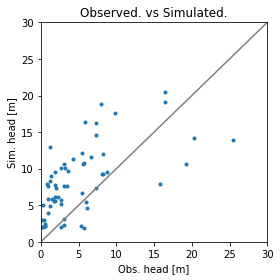

Error is - 8.655754306340327
Params are - [ 6.91181193 10.          3.87141975  0.43064608  0.3584904   1.19389606]


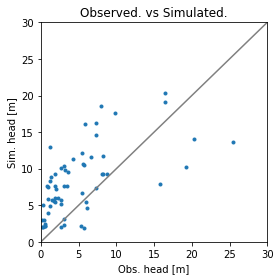

Error is - 8.648596884538179
Params are - [ 7.25740253 10.          3.87141975  0.43064608  0.3584904   1.19389606]


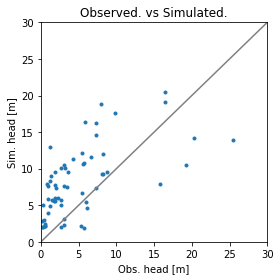

Error is - 8.6491157073826
Params are - [ 6.91181193 10.5         3.87141975  0.43064608  0.3584904   1.19389606]


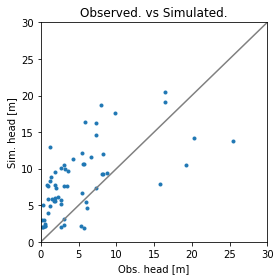

Error is - 8.653827403960625
Params are - [ 6.91181193 10.          4.06499074  0.43064608  0.3584904   1.19389606]


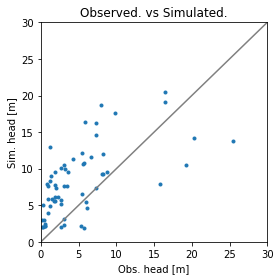

Error is - 8.653862796864678
Params are - [ 6.91181193 10.          3.87141975  0.45217838  0.3584904   1.19389606]


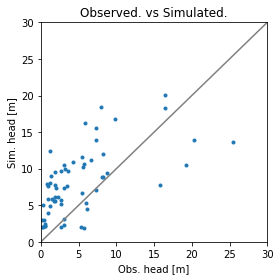

Error is - 8.658002095561475
Params are - [ 6.91181193 10.          3.87141975  0.43064608  0.37641492  1.19389606]


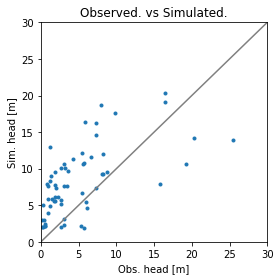

Error is - 8.655621036625371
Params are - [ 6.91181193 10.          3.87141975  0.43064608  0.3584904   1.25359086]


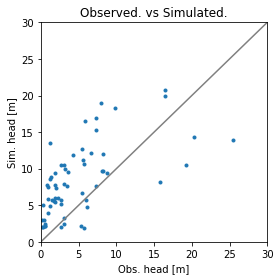

Error is - 8.657625288474565
Params are - [ 7.0270088  10.16666667  3.93594341  0.43782351  0.34056588  1.21379433]


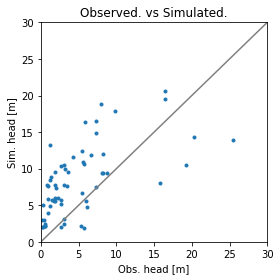

Error is - 8.653581192937802
Params are - [ 6.99820958 10.125       3.9198125   0.43602916  0.34952814  1.20881976]


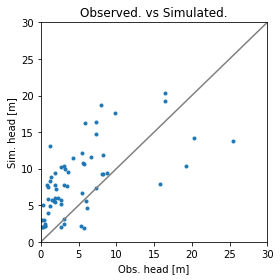

Error is - 8.648638973840159
Params are - [ 7.05580801 10.20833333  3.95207433  0.43961787  0.35550298  1.21876889]


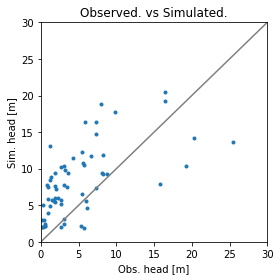

Error is - 8.646842191669451
Params are - [ 7.10380671 10.27777778  3.97895919  0.44260847  0.35450717  1.14746677]


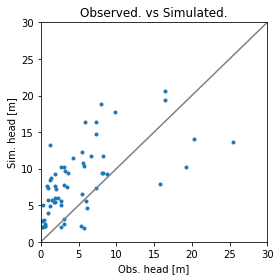

Error is - 8.643492205522028
Params are - [ 7.19980409 10.41666667  4.03272891  0.44858967  0.35251556  1.09440472]


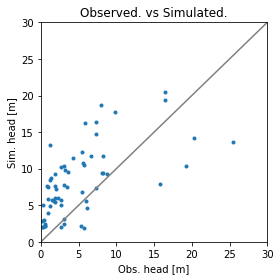

Error is - 8.645154827069067
Params are - [ 7.19980409 10.41666667  4.03272891  0.41987993  0.35251556  1.17399779]


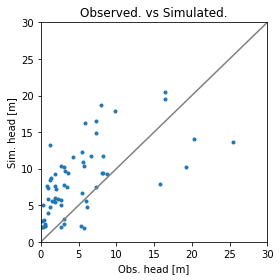

Error is - 8.642649077452099
Params are - [ 7.29580148 10.55555556  3.82840398  0.43782351  0.35052395  1.16736504]


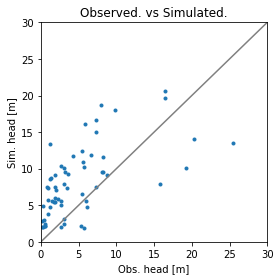

Error is - 8.63892120911715
Params are - [ 7.48779626 10.83333333  3.71011059  0.44141223  0.34654072  1.15409952]


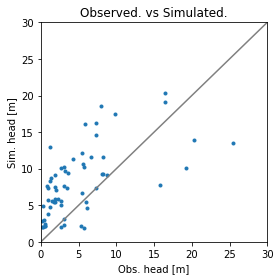

Error is - 8.63835549208211
Params are - [ 7.37259939 10.66666667  3.90368158  0.4342348   0.3584904   1.13420126]


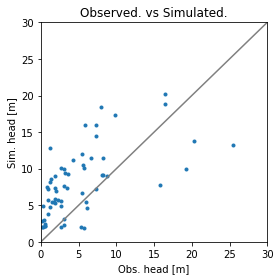

Error is - 8.633583382132757
Params are - [ 7.5597943  10.9375      3.89561612  0.43333762  0.36297153  1.09689201]


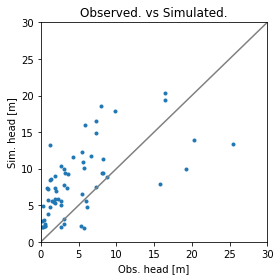

Error is - 8.63831936003145
Params are - [ 7.67499116 10.4375      3.96013979  0.44051505  0.35102185  1.11679027]


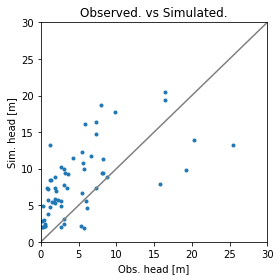

Error is - 8.634610905570455
Params are - [ 7.73738947 10.80555556  3.88217369  0.43184232  0.35251556  1.05792456]


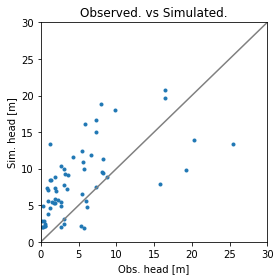

Error is - 8.631144669494864
Params are - [ 7.6957906  11.28240741  3.96641292  0.44121286  0.34753653  1.03747357]


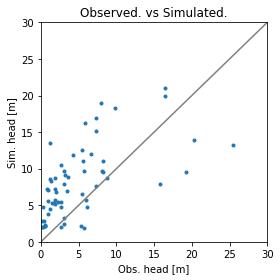

Error is - 8.627656214252966
Params are - [ 7.91498463 11.92361111  4.0139095   0.44649625  0.34205959  0.95926232]


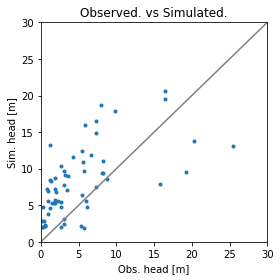

Error is - 8.627963822483462
Params are - [ 7.99178254 11.36805556  3.79883063  0.46085112  0.35002604  0.98579334]


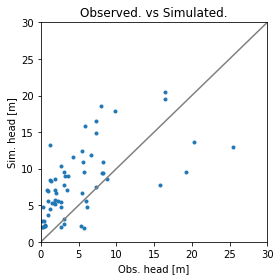

Error is - 8.625136824140625
Params are - [ 8.25577536 11.68518519  3.72086454  0.43622853  0.3491962   1.02918262]


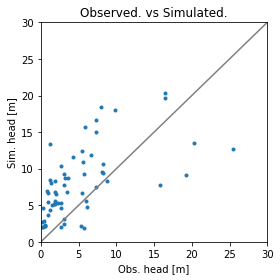

Error is - 8.62180097202519
Params are - [ 8.78376099 12.31944444  3.56493235  0.43004796  0.34753653  0.99657157]


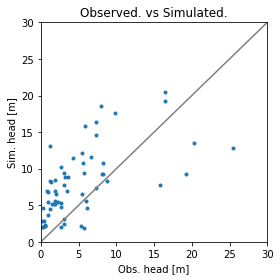

Error is - 8.624231160750465
Params are - [ 8.39977144 11.76388889  3.9950901   0.43961787  0.35550298  0.9169785 ]


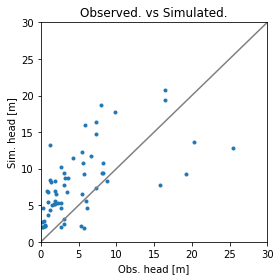

Error is - 8.619094401408777
Params are - [ 8.45416996 12.60185185  3.75671102  0.44021599  0.35251556  0.88768383]


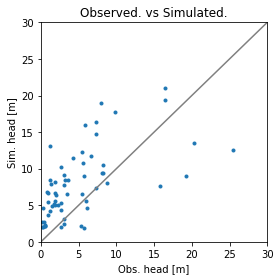

Error is - 8.616599433136955
Params are - [ 8.84375936 13.68402778  3.65499663  0.44006646  0.35326241  0.77313061]


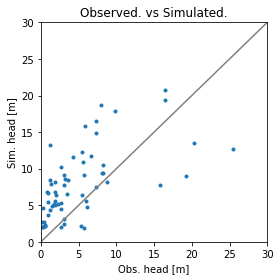

Error is - 8.616863844759004
Params are - [ 8.76056163 13.19328704  3.75895142  0.45163011  0.3512708   0.85161822]


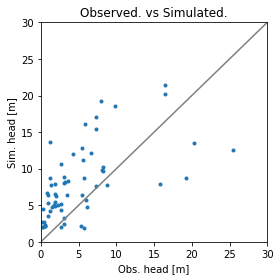

Error is - 8.628292703203597
Params are - [ 9.33841257 13.8132716   3.69995409  0.45623231  0.33691459  0.73089285]


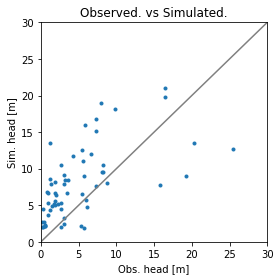

Error is - 8.621870736969056
Params are - [ 8.893758   13.0943287   3.7488696   0.45050863  0.34342882  0.82239264]


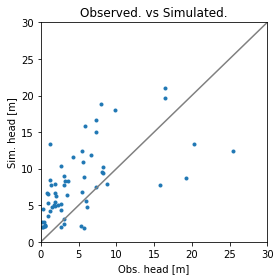

Error is - 8.618448479034106
Params are - [ 9.20708281 13.95814043  3.78008591  0.42527131  0.347661    0.78752461]


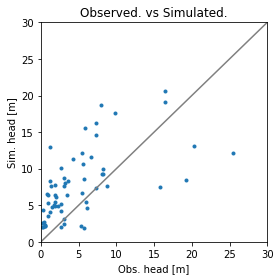

Error is - 8.621017015886869
Params are - [ 9.71458011 14.08076132  3.48706583  0.4325512   0.35749459  0.75680973]


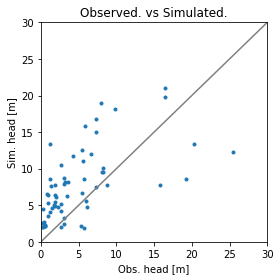

Error is - 8.618723171049615
Params are - [ 9.66806286 15.01277435  3.33654381  0.43707402  0.34471507  0.74570396]


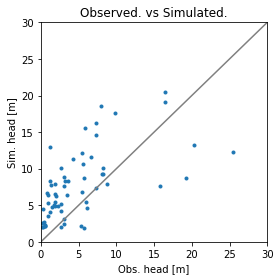

Error is - 8.615412285285771
Params are - [ 9.43217792 14.32181642  3.44532239  0.42170505  0.35721798  0.81472693]


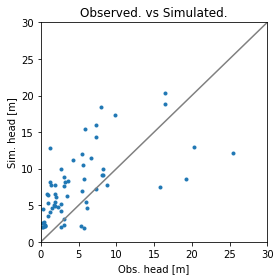

Error is - 8.616059587602422
Params are - [ 9.70138788 14.93556027  3.29354878  0.40730326  0.36411256  0.81089407]


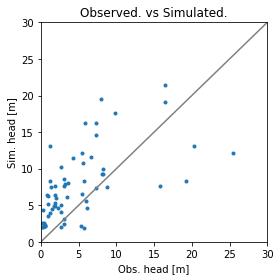

Error is - 8.624680698426086
Params are - [ 9.7583139  15.764158    3.58938965  0.43938476  0.35633743  0.57993311]


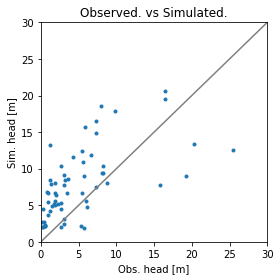

Error is - 8.61790445888139
Params are - [ 9.02739922 13.18062283  3.57104668  0.43238216  0.34973675  0.89241196]


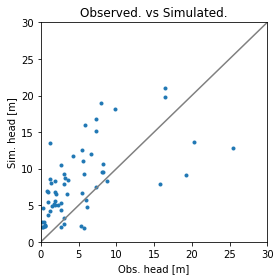

Error is - 8.616004816175098
Params are - [ 8.59843449 13.70279496  3.69524978  0.43682517  0.34379342  0.8648957 ]


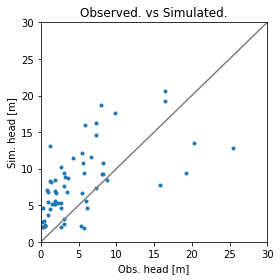

Error is - 8.619901512312884
Params are - [ 8.28840895 12.33412214  3.96534046  0.4322194   0.35626571  0.91573205]


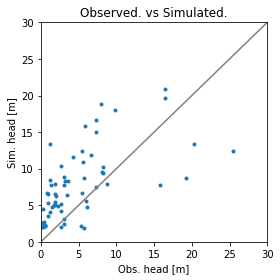

Error is - 8.616604362213018
Params are - [ 9.32314938 14.3431113   3.49374297  0.43586037  0.34760273  0.78821098]


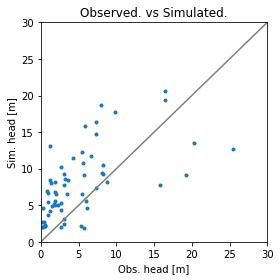

Error is - 8.6140588914572
Params are - [ 8.78807786 13.51707968  3.42635072  0.4475518   0.35330036  0.87414019]


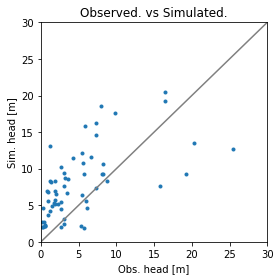

Error is - 8.613582253411746
Params are - [ 8.57857538 13.2965493   3.24948312  0.45869204  0.35612004  0.91744798]


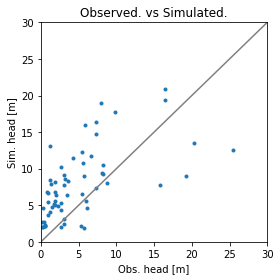

Error is - 8.612429151885816
Params are - [ 8.8181535  14.33323943  3.52820209  0.44921091  0.35335238  0.77759818]


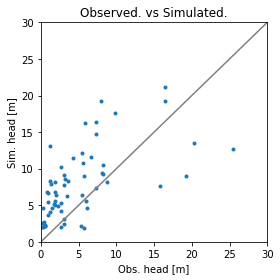

Error is - 8.611193882194046
Params are - [ 8.71353064 14.90954773  3.5067798   0.45762528  0.35516019  0.72019129]


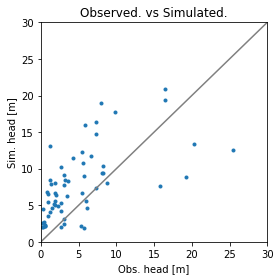

Error is - 8.61117441488226
Params are - [ 9.0693141  14.89266212  3.25624014  0.43196135  0.35311479  0.77458294]


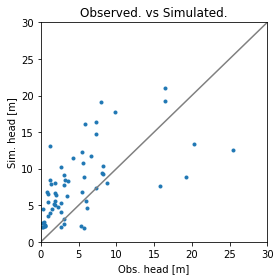

Error is - 8.609791062564623
Params are - [ 9.22369033 15.74234967  3.0048845   0.42212697  0.35403679  0.7360653 ]


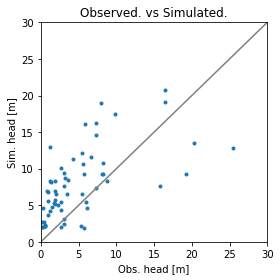

Error is - 8.610214254746825
Params are - [ 8.47357332 14.20925065  3.35849577  0.44315329  0.35892754  0.82060828]


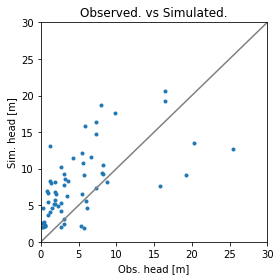

Error is - 8.60630308245272
Params are - [ 8.829568   15.04340846  3.09840849  0.43997614  0.35515624  0.85151455]


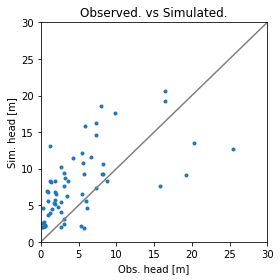

Error is - 8.602213338665301
Params are - [ 8.82247231 15.72309881  2.82011442  0.43993098  0.35610315  0.89070652]


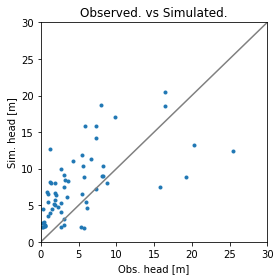

Error is - 8.60924681000758
Params are - [ 9.14957215 15.69807589  2.76644355  0.4442527   0.36872848  0.76835307]


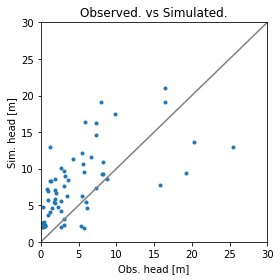

Error is - 8.604362754461166
Params are - [ 8.22162679 15.5378076   2.790078    0.4668887   0.35914075  0.80306389]


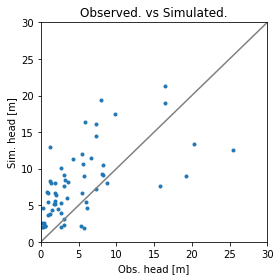

Error is - 8.605686076309096
Params are - [ 8.95624647 17.31016082  2.83278223  0.43263393  0.36124559  0.66221481]


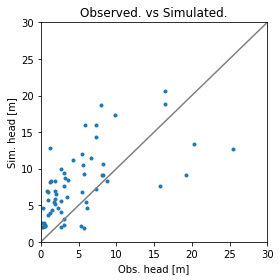

Error is - 8.60212603096258
Params are - [ 8.90219649 16.49736675  2.35081969  0.42537024  0.36423391  0.840146  ]


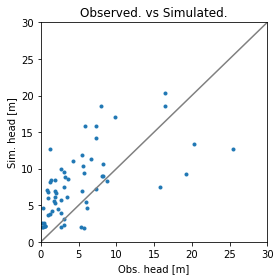

Error is - 8.602757950993624
Params are - [ 8.99652942 17.29127626  1.77283963  0.40924272  0.36877077  0.90012335]


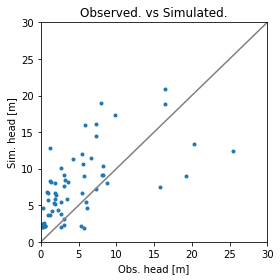

Error is - 8.60173619221878
Params are - [ 9.28502819 17.96036919  2.1632117   0.43391455  0.36223535  0.74624157]


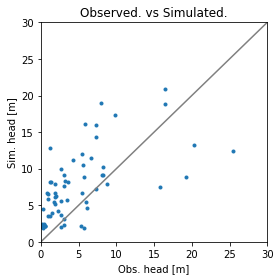

Error is - 8.604357279635641
Params are - [ 9.69075562 19.83592846  1.56556966  0.42929517  0.36388925  0.70905822]


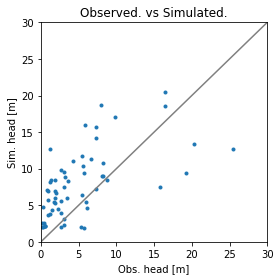

Error is - 8.599822741230915
Params are - [ 8.55535713 17.16661002  2.23626536  0.45887006  0.36985896  0.83417665]


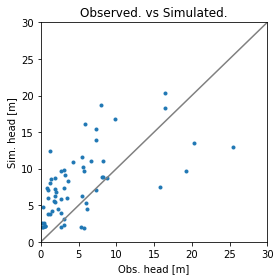

Error is - 8.601688834299926
Params are - [ 8.22119054 17.87874019  1.85195579  0.47724161  0.37777005  0.88323233]


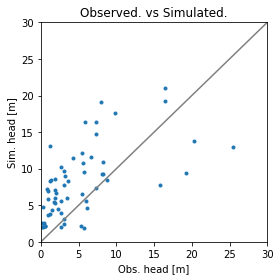

Error is - 8.597029994280037
Params are - [ 8.43140365 17.70039517  2.29798024  0.44161679  0.35554409  0.82383008]


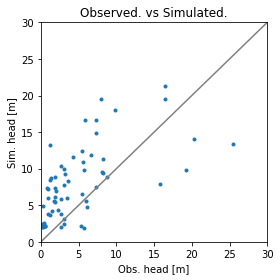

Error is - 8.598192030029786
Params are - [ 8.0723194  18.70155481  2.06374859  0.44029883  0.34895189  0.85156858]


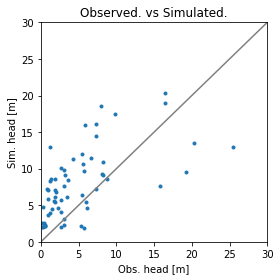

Error is - 8.600533275847052
Params are - [ 8.44978172 16.21838836  2.05337424  0.45622984  0.36112648  0.9838401 ]


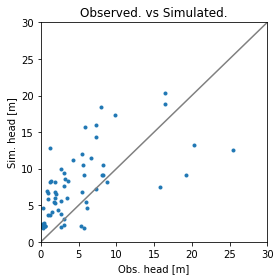

Error is - 8.598259146499908
Params are - [ 9.26045304 18.21760183  1.85051055  0.41842212  0.36389323  0.90324975]


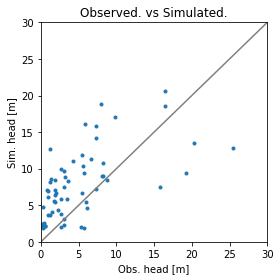

Error is - 8.601114068337822
Params are - [ 8.80560109 18.86381163  1.49727284  0.43821022  0.36952752  0.8197882 ]


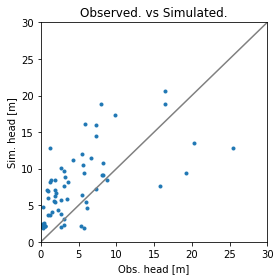

Error is - 8.595610920728568
Params are - [ 8.69367845 18.87835865  1.68205195  0.45705095  0.3631613   0.86356278]


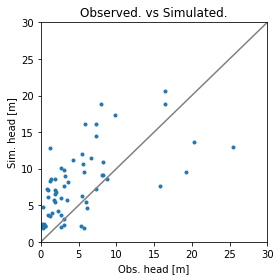

Error is - 8.596057577356317
Params are - [ 8.58941944 20.0688546   1.34766808  0.4728913   0.36262499  0.87527118]


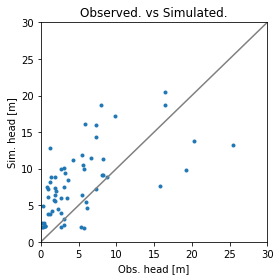

Error is - 8.599127881463115
Params are - [ 8.11373017 17.7213527   1.70927336  0.45621878  0.36546851  0.99657428]


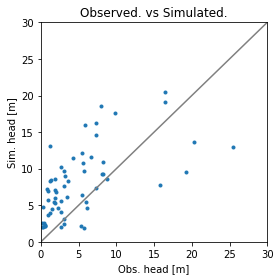

Error is - 8.597232990440157
Params are - [ 8.36253363 16.43709061  2.44587906  0.45792595  0.35682333  0.98195635]


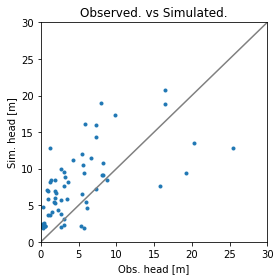

Error is - 8.593643891815
Params are - [ 8.68927031 19.15541463  2.0206126   0.44047171  0.36378999  0.81727654]


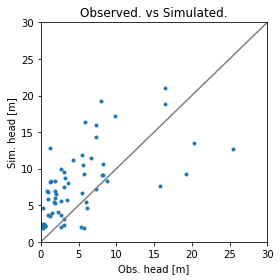

Error is - 8.59353263466075
Params are - [ 8.8090146  20.62392777  2.00423179  0.43259265  0.36512175  0.73399476]


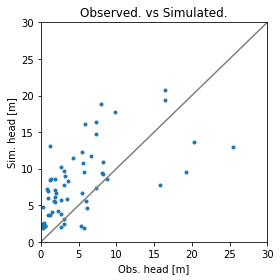

Error is - 8.592689001376842
Params are - [ 8.66824738 19.35963222  1.76037696  0.42907235  0.35347844  0.93354602]


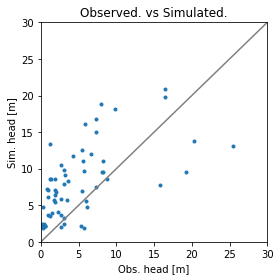

Error is - 8.594790823557767
Params are - [ 8.7246925  20.45614333  1.52243276  0.4141735   0.34528818  0.9832307 ]


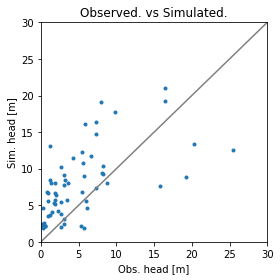

Error is - 8.597271142314428
Params are - [ 9.29471341 19.35098272  2.30440349  0.42267482  0.3538722   0.75013897]


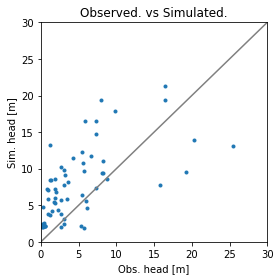

Error is - 8.593814577734166
Params are - [ 8.15941067 19.23252722  2.31446395  0.46188905  0.35210714  0.79242656]


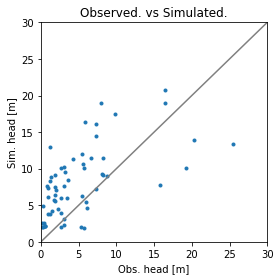

Error is - 8.59874415312752
Params are - [ 7.74671605 18.05966116  1.8639245   0.47070776  0.36153981  0.95963322]


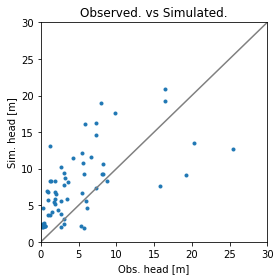

Error is - 8.594141384905098
Params are - [ 8.90771407 19.02815233  2.19428374  0.43468306  0.35578911  0.80251253]


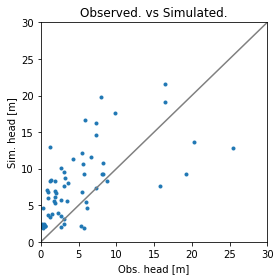

Error is - 8.598271715864477
Params are - [ 8.86062264 21.83724051  1.63858382  0.42770899  0.35824394  0.66800123]


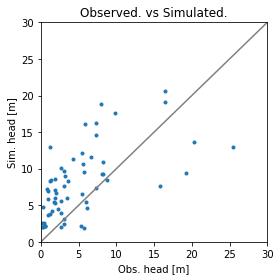

Error is - 8.594102717469028
Params are - [ 8.48705588 17.78712808  2.24405525  0.45037171  0.35717849  0.90346757]


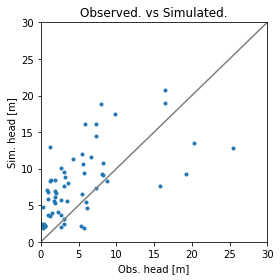

Error is - 8.590007443159541
Params are - [ 8.81030337 20.60284692  1.76850764  0.44693647  0.36006798  0.85267333]


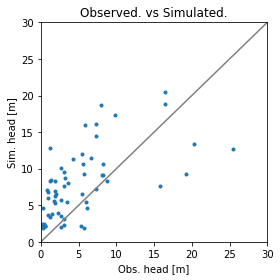

Error is - 8.58952331236794
Params are - [ 8.99975323 22.0540728   1.50377133  0.44959632  0.36232993  0.86709496]


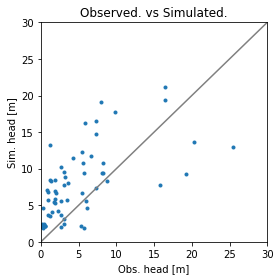

Error is - 8.589259697955912
Params are - [ 8.65005349 20.48345482  2.32500905  0.42901743  0.35217365  0.81411801]


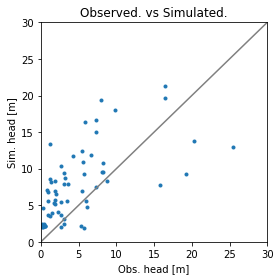

Error is - 8.58974529569556
Params are - [ 8.62824101 21.28600291  2.6464876   0.41500067  0.34667983  0.78939563]


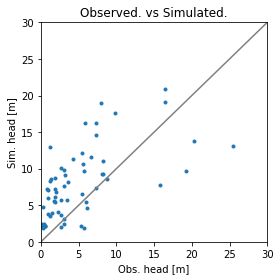

Error is - 8.588066368625011
Params are - [ 8.35013101 20.81876198  1.85635237  0.44949678  0.3583407   0.87903676]


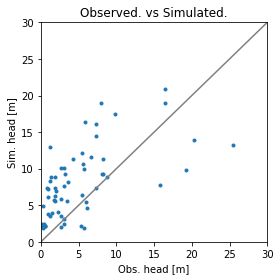

Error is - 8.587833398332203
Params are - [ 8.07133949 21.7140668   1.68738668  0.45690364  0.35961649  0.91729888]


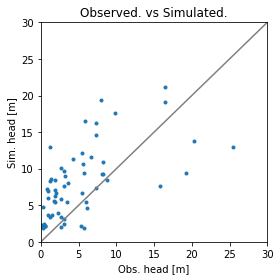

Error is - 8.588117953246114
Params are - [ 8.63221707 23.36876579  1.62102467  0.43598543  0.35776398  0.78269216]


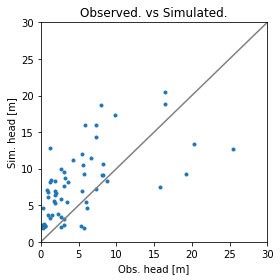

Error is - 8.590697011044218
Params are - [ 9.11746442 23.30211285  1.31946955  0.41583356  0.36472094  0.89048836]


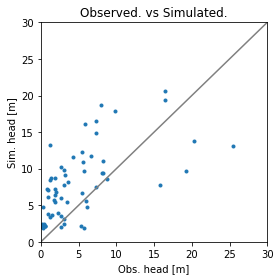

Error is - 8.58748525044083
Params are - [ 8.57067709 22.80344066  1.40144763  0.43954359  0.35157273  1.0010847 ]


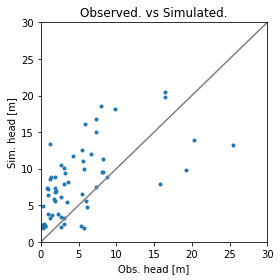

Error is - 8.593819367732051
Params are - [ 8.45150834 23.89319711  1.10005555  0.44301906  0.34479822  1.13462968]


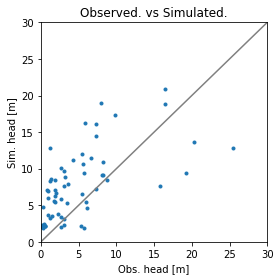

Error is - 8.583801401668852
Params are - [ 8.67892088 25.21567235  1.52565935  0.44655431  0.3625808   0.82404634]


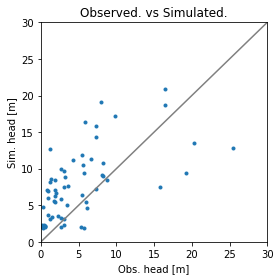

Error is - 8.583708067183268
Params are - [ 8.68425763 28.14369242  1.40830054  0.45529529  0.36713198  0.7692965 ]


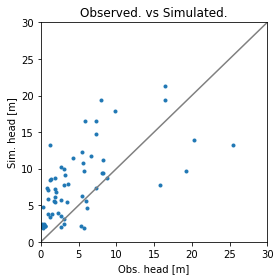

Error is - 8.584938062998136
Params are - [ 8.08530158 22.88705158  1.99617709  0.47294701  0.35214198  0.82670671]


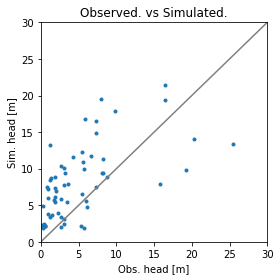

Error is - 8.58451294538952
Params are - [ 7.89819555 24.41275122  1.97601056  0.44696782  0.35113701  0.83663736]


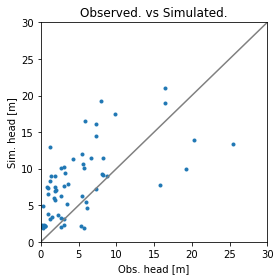

Error is - 8.592225216287947
Params are - [ 7.99727598 27.29313467  1.03844001  0.47353016  0.36094774  0.89712076]


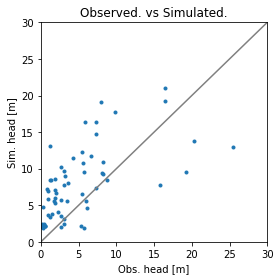

Error is - 8.58527193675789
Params are - [ 8.48685911 22.18587478  2.00336679  0.44014562  0.35436718  0.8348687 ]


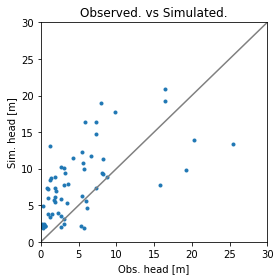

Error is - 8.580566940686555
Params are - [ 7.96665975 24.0135267   1.86987176  0.46794889  0.35422514  0.94593879]


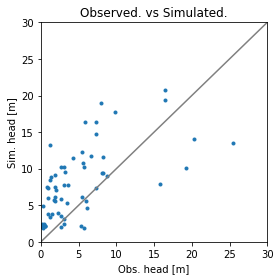

Error is - 8.579777254986364
Params are - [ 7.63388109 24.33590715  1.9942953   0.48393061  0.35245572  1.02756211]


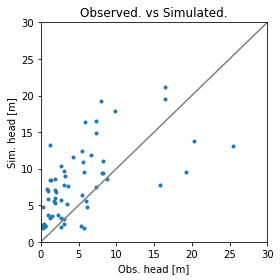

Error is - 8.57829494291292
Params are - [ 8.38171787 26.54217247  1.90581262  0.45603967  0.34998571  0.84808648]


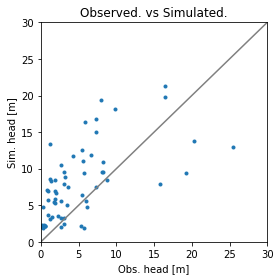

Error is - 8.577527823136682
Params are - [ 8.53690706 28.95622531  2.01502559  0.45560768  0.34517032  0.81348029]


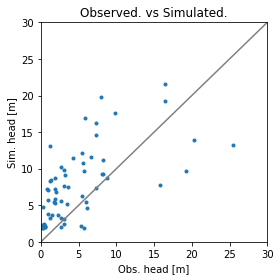

Error is - 8.579754784984289
Params are - [ 7.87112358 27.50372682  2.39627766  0.47875442  0.35589533  0.70176585]


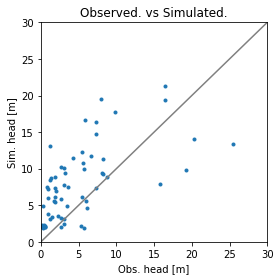

Error is - 8.57543807319449
Params are - [ 7.74969639 29.89391005  1.92532879  0.49102199  0.35361028  0.82361424]


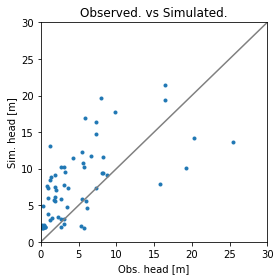

Error is - 8.57541573995643
Params are - [ 7.38111502 33.74792768  1.88630979  0.51646018  0.35323183  0.81798702]


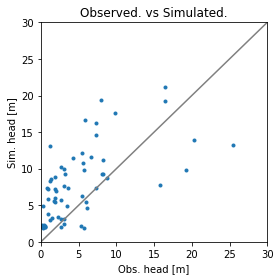

Error is - 8.571036986311883
Params are - [ 7.91652506 32.81302529  1.89589605  0.47272499  0.35619875  0.82886967]


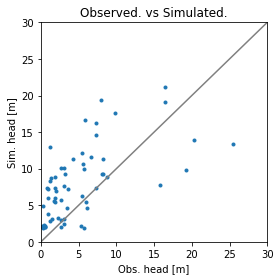

Error is - 8.567684205919662
Params are - [ 7.83213681 37.77601215  1.84575554  0.47261398  0.35822713  0.82995115]


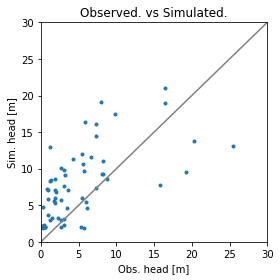

Error is - 8.56744391573399
Params are - [ 8.08161151 35.74174595  1.87264425  0.5072529   0.35956709  0.81671028]


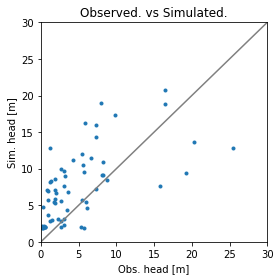

Error is - 8.564893502109493
Params are - [ 8.17331949 41.40624332  1.82096109  0.53739544  0.36378214  0.80674673]


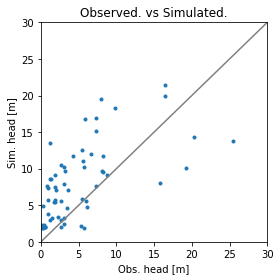

Error is - 8.570854150728518
Params are - [ 7.12523672 36.43165506  2.57790778  0.52629215  0.34245551  0.89653455]


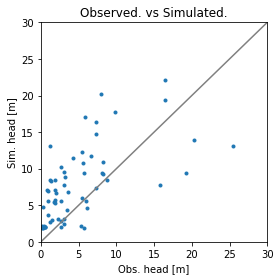

Error is - 8.575674402421349
Params are - [ 8.00606514 44.2713563   2.18645051  0.51177734  0.35379837  0.59459309]


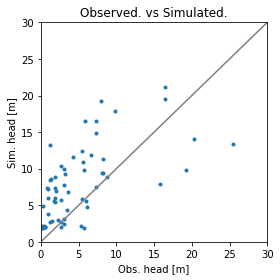

Error is - 8.563801447168139
Params are - [ 7.81380316 46.69274645  1.71452577  0.52796118  0.34965976  0.88466509]


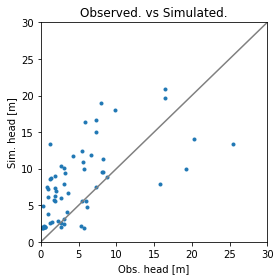

Error is - 8.56558839876278
Params are - [ 7.78514295 56.28725626  1.37364983  0.55256456  0.34654198  0.97611471]


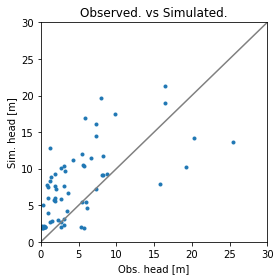

Error is - 8.56712691735947
Params are - [ 6.90698506 51.15242167  1.99561124  0.57522574  0.36188125  0.79667892]


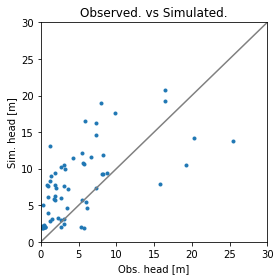

Error is - 8.570568042898303
Params are - [ 7.07146695 38.13097914  1.76057322  0.54020555  0.35594751  1.08292807]


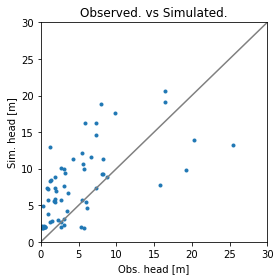

Error is - 8.55653015732791
Params are - [ 7.59320104 50.11542491  2.01880176  0.54343783  0.35741927  0.94784782]


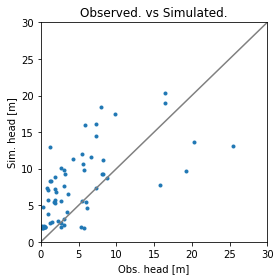

Error is - 8.552571633783693
Params are - [ 7.69924405 58.29917353  2.08504775  0.55692666  0.35951299  1.01277823]


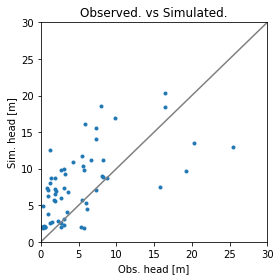

Error is - 8.570579814456718
Params are - [ 8.04041512 54.72087036  1.16291709  0.54381736  0.37388142  0.90804818]


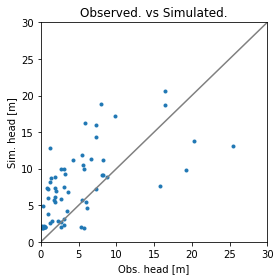

Error is - 8.563192534144614
Params are - [ 7.81162052 50.14856653  1.51666476  0.53943606  0.36602494  0.90516977]


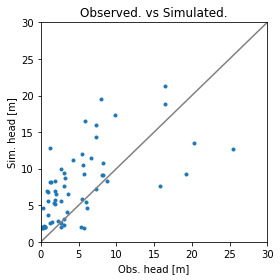

Error is - 8.566148289706632
Params are - [ 8.34090274 57.02740874  1.89894883  0.52964746  0.36374857  0.6624019 ]


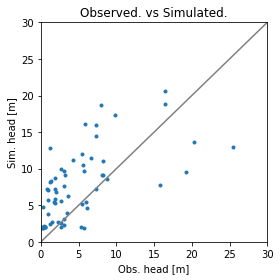

Error is - 8.557136532503234
Params are - [ 7.74982153 63.79950793  1.83149761  0.6162502   0.36330942  0.85952906]


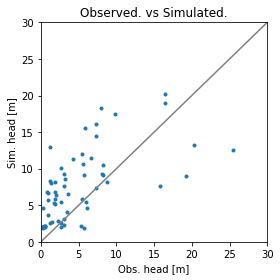

Error is - 8.563346558180486
Params are - [ 8.95591878 54.63879382  1.62693736  0.52731326  0.36013136  0.91375134]


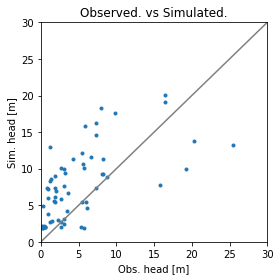

Error is - 8.559861085388974
Params are - [ 7.72700643 47.96760179  1.63292929  0.57211347  0.3570583   1.13181151]


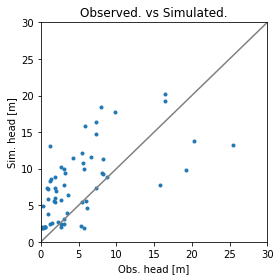

Error is - 8.555314814206398
Params are - [ 7.74581867 65.7758867   1.64823975  0.57593817  0.35478346  1.0958216 ]


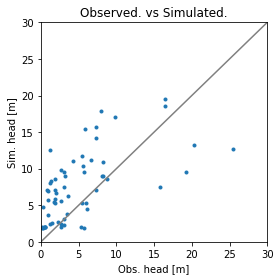

Error is - 8.558634660169062
Params are - [ 8.0826735  66.85043032  1.73257974  0.60136476  0.37061373  1.08828874]


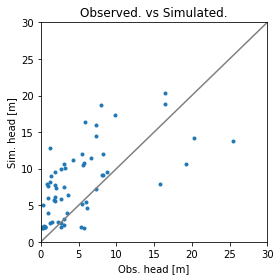

Error is - 8.563022185221092
Params are - [ 6.64947612 62.97492844  1.85538227  0.62669651  0.36363626  1.11738163]


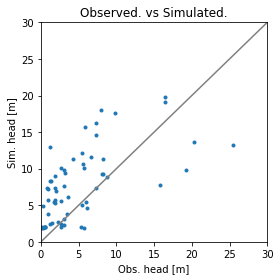

Error is - 8.551940925811893
Params are - [ 7.40639292 71.7406097   2.07856071  0.64366053  0.35694645  1.19670048]


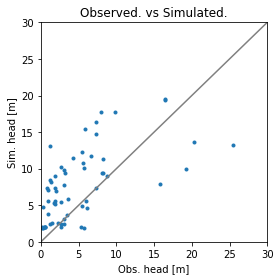

Error is - 8.552115069116496
Params are - [ 7.20377911 82.53663129  2.35950868  0.69577276  0.3524072   1.34246584]


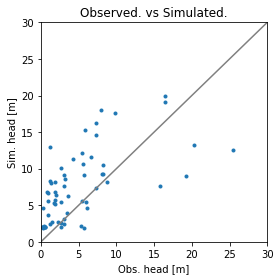

Error is - 8.560010016422076
Params are - [ 8.82084291 61.83614155  1.81423601  0.56205475  0.35710519  1.01092824]


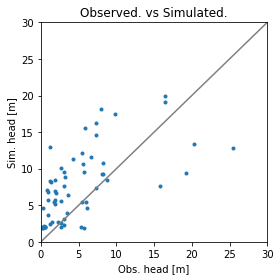

Error is - 8.555853792337828
Params are - [ 8.27800121 62.12083827  1.82452257  0.57821519  0.35873796  1.03754159]


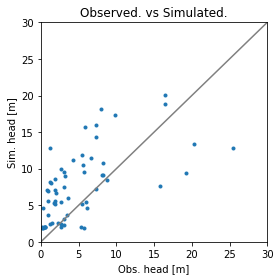

Error is - 8.552504371383876
Params are - [ 7.92697752 81.5612137   2.10055342  0.6186717   0.36424303  0.96507506]


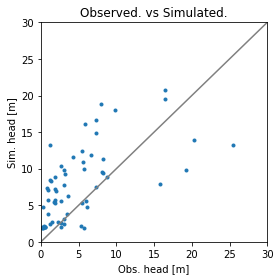

Error is - 8.553612581088203
Params are - [ 7.5194118  67.58197962  2.12356087  0.59518939  0.34856404  0.96752659]


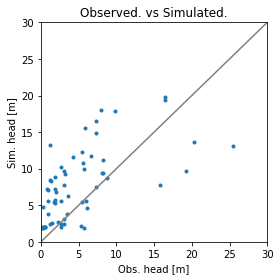

Error is - 8.550789047192243
Params are - [ 7.77546052 71.89372591  2.12199741  0.57328367  0.35095322  1.23228545]


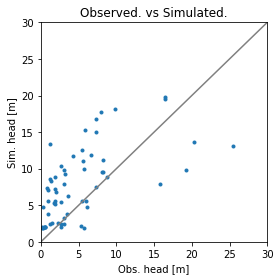

Error is - 8.552235462357345
Params are - [ 7.78828002 75.9408349   2.26724732  0.55180041  0.34477512  1.41866365]


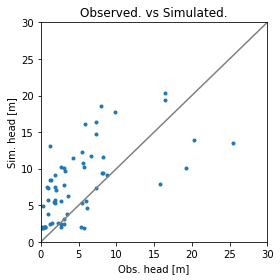

Error is - 8.55084014152178
Params are - [ 7.07976728 76.83002478  2.22813073  0.60967485  0.35292977  1.11918755]


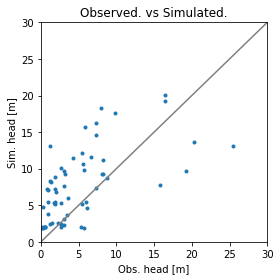

Error is - 8.547955866788842
Params are - [ 7.3899327  76.85968905  2.59771054  0.62319743  0.35626638  1.06869619]


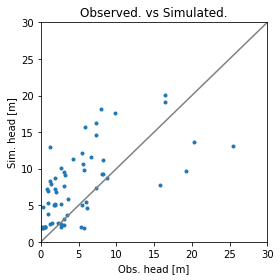

Error is - 8.546953347086756
Params are - [ 7.21198971 82.40159022  3.07244594  0.64682706  0.35700784  1.05513349]


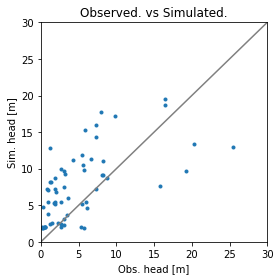

Error is - 8.55023336340112
Params are - [ 7.51386553 79.99346633  2.43868445  0.62115877  0.36530039  1.22619349]


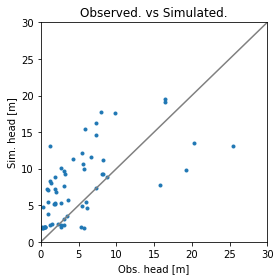

Error is - 8.548726584179128
Params are - [ 7.27224045 96.50770335  2.59507647  0.6808322   0.35628057  1.25208028]


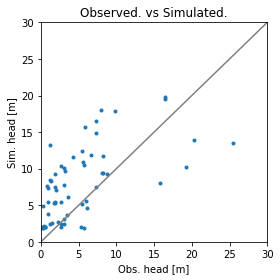

Error is - 8.551085924883514
Params are - [ 6.82626128 78.2278264   2.74441182  0.63980733  0.34889638  1.39545186]


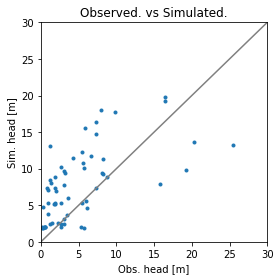

Error is - 8.545538727550806
Params are - [ 7.15346868 90.21083596  2.9883549   0.6135341   0.35350962  1.23007689]


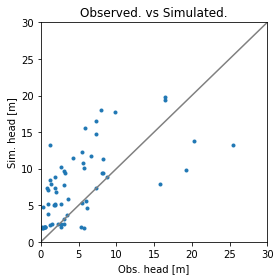

Error is - 8.544123470712156
Params are - [ 7.02700656 99.44594909  3.44325199  0.59847088  0.3517912   1.2467651 ]


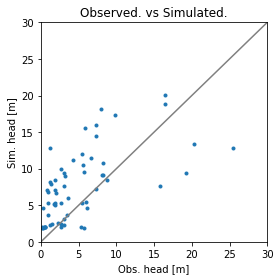

Error is - 8.548815817051386
Params are - [ 7.80051541 90.79632683  2.55545052  0.60360848  0.36252462  0.98176326]


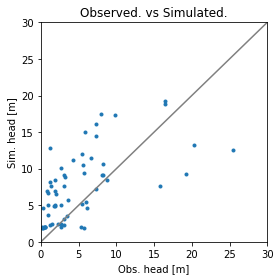

Error is - 8.551635520064739
Params are - [ 7.78725878 96.84956246  3.1808382   0.63171885  0.36168951  1.21221948]


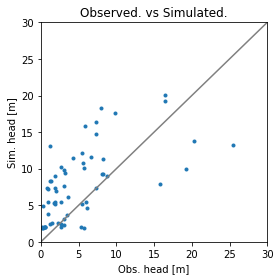

Error is - 8.54759214222705
Params are - [ 7.25664016 81.8349092   2.4663076   0.61518585  0.35511971  1.14244553]


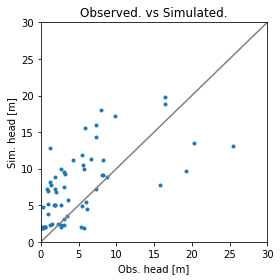

Error is - 8.546637511179876
Params are - [  6.91862542 105.0995891    3.40174157   0.68207741   0.36505489
   1.06917493]


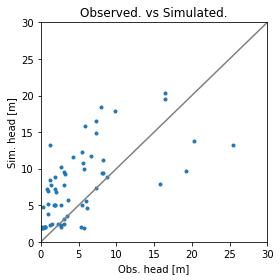

Error is - 8.545739272060194
Params are - [  6.98180703 105.36855627   3.40607358   0.65450853   0.35062588
   1.02292737]


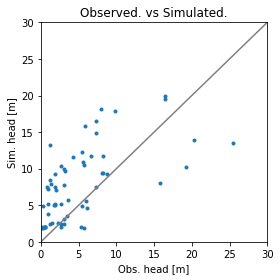

Error is - 8.548359807363752
Params are - [ 6.42225437 99.42310558  3.57284853  0.68902549  0.34943541  1.28107897]


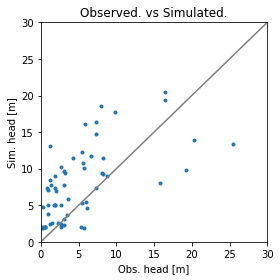

Error is - 8.544609124883513
Params are - [ 6.66720063 94.6835298   3.8591466   0.61453287  0.35339774  1.02042818]


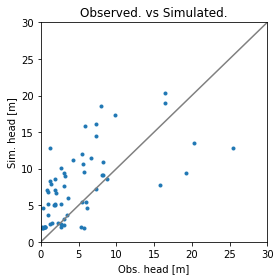

Error is - 8.547185663868046
Params are - [ 7.59883547 90.18826898  2.97680723  0.58150871  0.36156367  0.90454589]


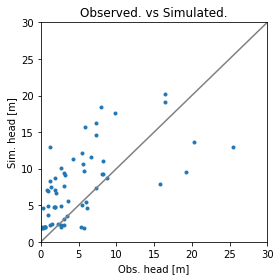

Error is - 8.545566553659992
Params are - [  6.87851479 110.56091862   4.25351471   0.64412264   0.35802737
   0.96387945]


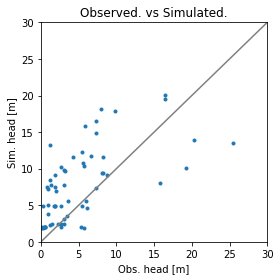

Error is - 8.54741475472104
Params are - [  6.29621258 108.99844206   4.16858424   0.69867109   0.35040463
   1.22155694]


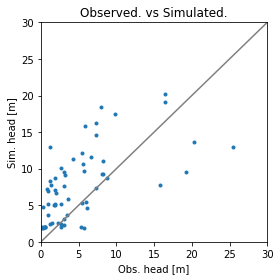

Error is - 8.545201474186268
Params are - [ 7.27317975 94.89081225  3.27475148  0.6107993   0.35877391  0.98379866]


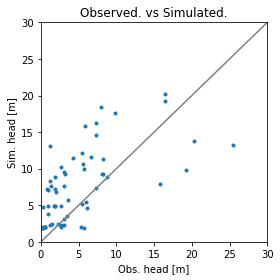

Error is - 8.542927205705178
Params are - [  6.70345501 120.94819482   4.14038071   0.62134348   0.35554915
   1.04719107]


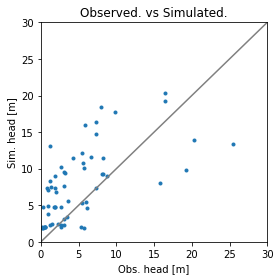

Error is - 8.542537765411335
Params are - [  6.44918766 140.22149712   4.67434809   0.60860169   0.35481981
   1.04321987]


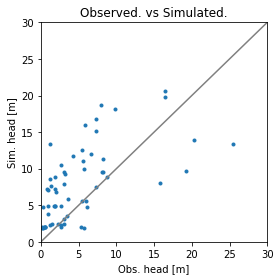

Error is - 8.545661264538976
Params are - [  6.84034006 109.95749862   4.23528724   0.56160123   0.34409041
   1.02449795]


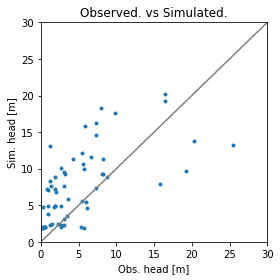

Error is - 8.541966534623429
Params are - [  6.73000278 111.21817889   4.50735979   0.55820101   0.35634093
   1.07126903]


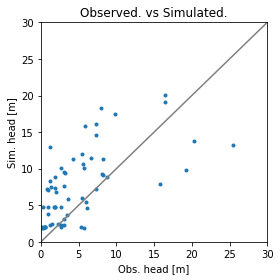

Error is - 8.541586961737256
Params are - [  6.60410065 114.1429902    5.0580029    0.51004726   0.35919845
   1.09543986]


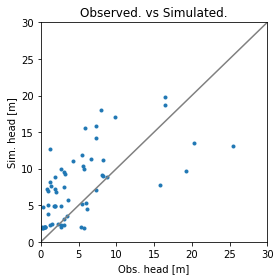

Error is - 8.545594766156503
Params are - [  6.79272329 108.02440041   3.95238468   0.63392365   0.36791241
   1.09334576]


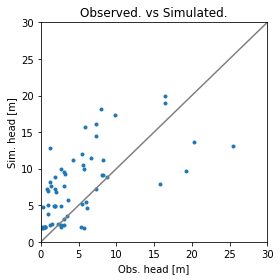

Error is - 8.543566440054082
Params are - [  6.80462748 108.50767496   4.02311032   0.61584305   0.36195691
   1.07613381]


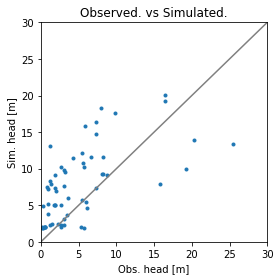

Error is - 8.541186941961474
Params are - [  6.72991946 106.73656586   3.85735576   0.54197571   0.35528531
   1.19138237]


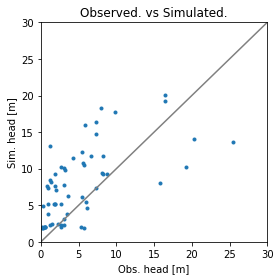

Error is - 8.54191165314787
Params are - [  6.65562179 104.82438948   3.65927628   0.49090224   0.35391428
   1.30513382]


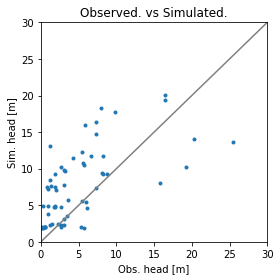

Error is - 8.543049286266866
Params are - [  6.15416773 126.35525676   5.03032041   0.55235785   0.3533759
   1.24065773]


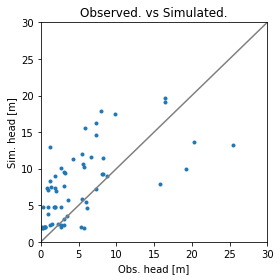

Error is - 8.54099645601125
Params are - [  6.58913588 137.11978153   4.83631656   0.52789928   0.35874479
   1.27743807]


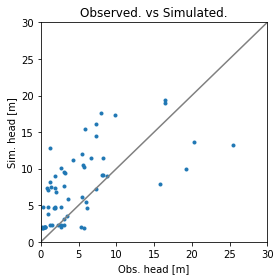

Error is - 8.54215694346498
Params are - [  6.5501035  158.33790739   5.32490154   0.48458248   0.36141832
   1.40594301]


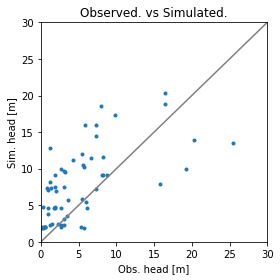

Error is - 8.542650503090968
Params are - [  6.08337306 144.91530639   5.71656602   0.52043739   0.36266919
   1.06132547]


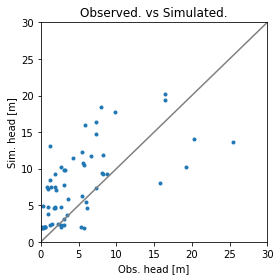

Error is - 8.542679230187098
Params are - [  6.065334   147.98945766   5.70119292   0.47126334   0.35274091
   1.22702065]


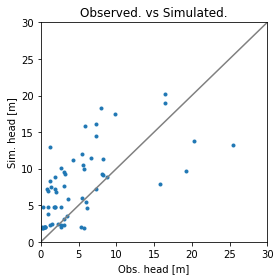

Error is - 8.540564172220307
Params are - [  6.6861825  137.35327616   4.91760701   0.50771704   0.36111026
   1.05795103]


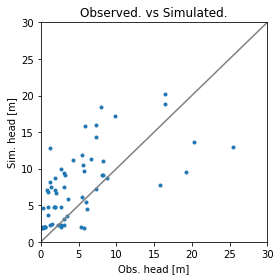

Error is - 8.542090118912482
Params are - [  6.95218989 142.85228585   4.86125031   0.48539664   0.36497744
   0.96659767]


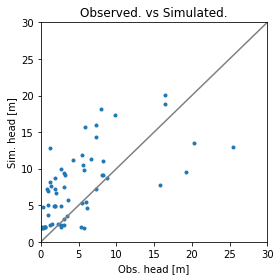

Error is - 8.544112743132827
Params are - [  6.98196574 112.17368142   3.98553919   0.60096278   0.36453503
   1.01523157]


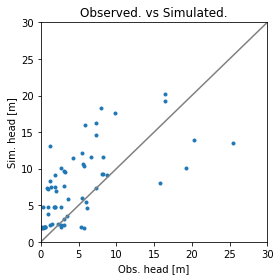

Error is - 8.540978350653997
Params are - [  6.29449193 139.0355136    5.27227949   0.5036882    0.35568944
   1.17407338]


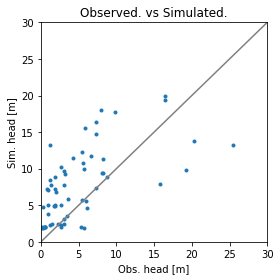

Error is - 8.54160440971736
Params are - [  7.03429963 113.28790177   3.82207058   0.54620567   0.35228016
   1.21850938]


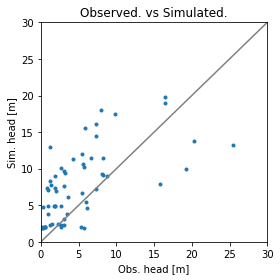

Error is - 8.540566477446644
Params are - [  6.86352236 109.00384592   4.580196     0.43724269   0.35928299
   1.29504482]


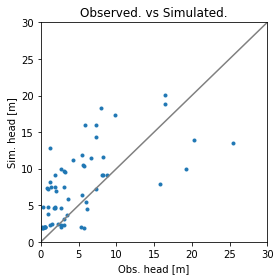

Error is - 8.541973029680802
Params are - [  6.22148463 134.50942266   5.68518199   0.46331773   0.36415692
   1.14526712]


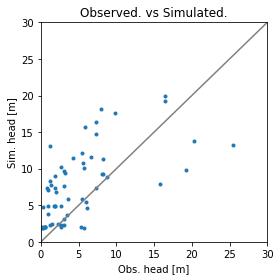

Error is - 8.54052689215689
Params are - [  6.83109588 118.59328199   4.28784844   0.52548368   0.35524935
   1.20019882]


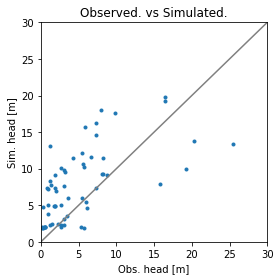

Error is - 8.53949601882484
Params are - [  6.72734869 135.13776481   4.19253152   0.50462161   0.35592226
   1.3032563 ]


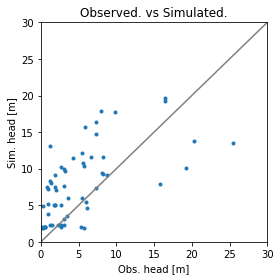

Error is - 8.539866296205403
Params are - [  6.7889727  145.63515212   3.75979583   0.50190879   0.35428416
   1.40716452]


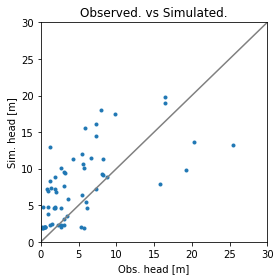

Error is - 8.541040262230606
Params are - [  6.60067296 152.01125548   5.50490392   0.46024179   0.36004772
   1.24460511]


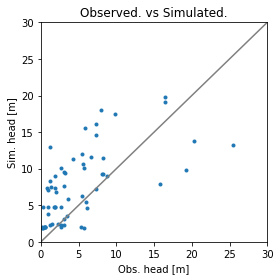

Error is - 8.540223378810584
Params are - [  6.63298458 140.69258307   5.09301688   0.48067527   0.35885712
   1.23129942]


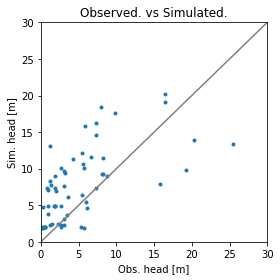

Error is - 8.539433738570798
Params are - [  6.75607277 122.81897365   4.61150988   0.45857689   0.35662568
   1.14316986]


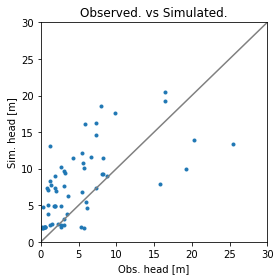

Error is - 8.54015862327883
Params are - [  6.83954122 115.66856972   4.49910655   0.4239157    0.35556613
   1.07603576]


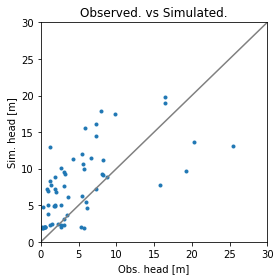

Error is - 8.540151137243331
Params are - [  7.20457699 115.49772827   3.95529042   0.46775086   0.35999312
   1.23623337]


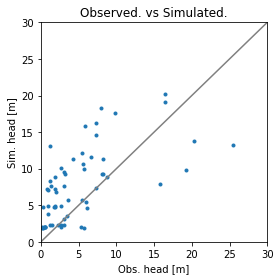

Error is - 8.53993143841239
Params are - [  6.74923144 147.6940234    4.43907204   0.54436576   0.35663627
   1.09565811]


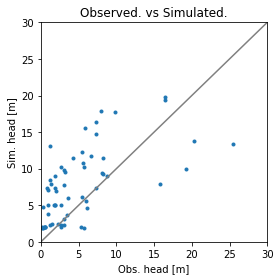

Error is - 8.54010367201168
Params are - [  6.94758762 122.79150891   3.94214938   0.48610765   0.35331767
   1.34532093]


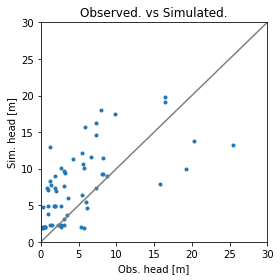

Error is - 8.53856040662895
Params are - [  6.84150482 142.95091205   4.45667494   0.45521566   0.35853469
   1.25144718]


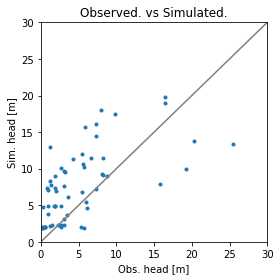

Error is - 8.53837597158611
Params are - [  6.84670928 155.12972708   4.54108819   0.42008166   0.36017736
   1.27707136]


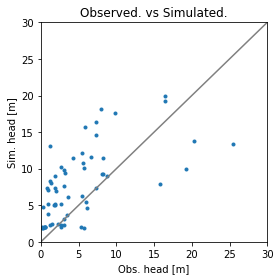

Error is - 8.539138506516904
Params are - [  7.11085768 125.6639923    3.46753027   0.4798262    0.355367
   1.23560389]


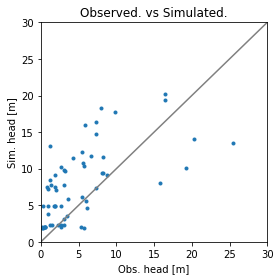

Error is - 8.53931865416139
Params are - [  6.5080255  154.24760178   4.44267001   0.49677573   0.35268896
   1.23046011]


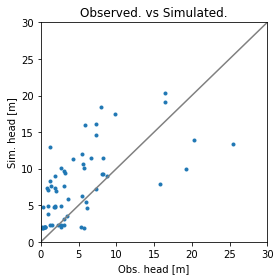

Error is - 8.53847853083635
Params are - [  6.61849417 157.43918543   4.62265126   0.48197497   0.35915484
   1.08308561]


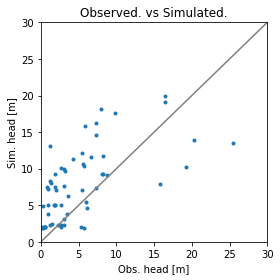

Error is - 8.539257998113554
Params are - [  6.77327125 135.78505829   4.18692167   0.40291993   0.35667576
   1.3285576 ]


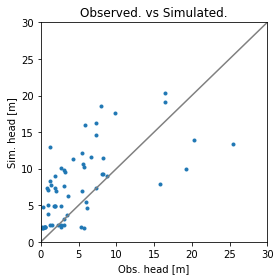

Error is - 8.538382495852128
Params are - [  6.81046153 148.55708137   4.43159224   0.40876352   0.35764094
   1.12939317]


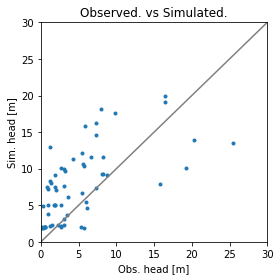

Error is - 8.53744255832176
Params are - [  6.79986704 169.45524176   3.95264133   0.43820378   0.35727594
   1.28488739]


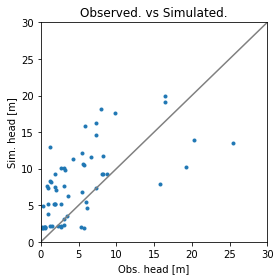

Error is - 8.537745895682162
Params are - [  6.82176417 192.77337582   3.62320706   0.42801722   0.35760107
   1.35574615]


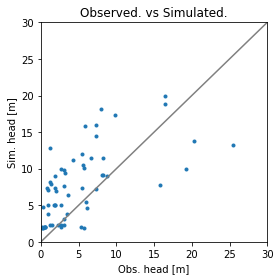

Error is - 8.539095975678242
Params are - [  7.14519482 143.09582696   3.95813831   0.38048095   0.36274165
   1.21573956]


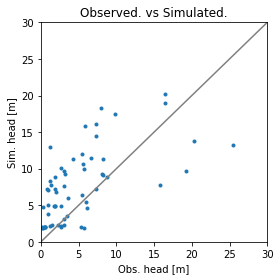

Error is - 8.537897338482063
Params are - [  7.00392359 163.99529334   4.13762553   0.4668571    0.36077681
   1.08003606]


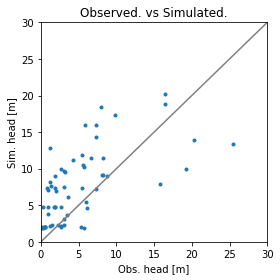

Error is - 8.539306129859305
Params are - [  6.63069246 186.89345968   5.08038202   0.38562779   0.36388884
   1.12113383]


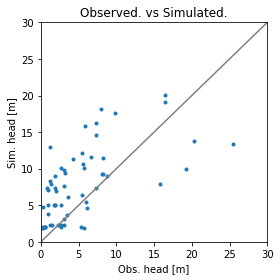

Error is - 8.53795220106325
Params are - [  6.99081638 140.97135915   3.87074321   0.4562766    0.35749746
   1.20698637]


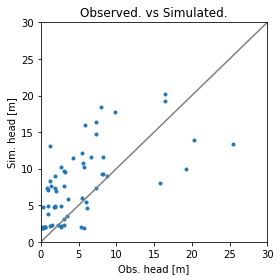

Error is - 8.53871953828384
Params are - [  6.54489584 168.75346908   4.56064228   0.51023825   0.35476613
   1.13808043]


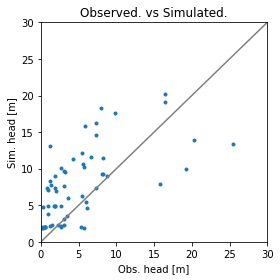

Error is - 8.537873000823698
Params are - [  6.69497059 162.33905855   4.41001629   0.47779893   0.35676001
   1.15749521]


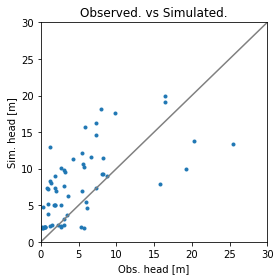

Error is - 8.537891275876312
Params are - [  7.09708863 156.04340165   3.82525101   0.40735222   0.35755467
   1.29553758]


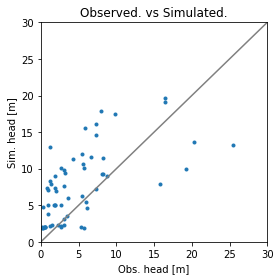

Error is - 8.538016921039766
Params are - [  7.00066364 167.42094581   3.81419628   0.48009324   0.35903981
   1.30461148]


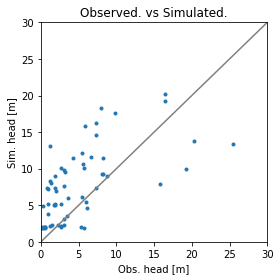

Error is - 8.537782117373906
Params are - [  7.015734   164.94537301   3.46240302   0.48877897   0.35612421
   1.16611334]


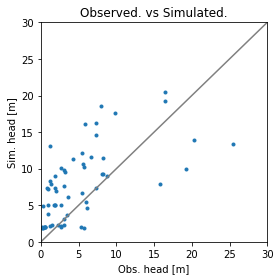

Error is - 8.538060680554494
Params are - [  6.86680311 151.82896334   4.07203052   0.43166262   0.35628989
   1.09240717]


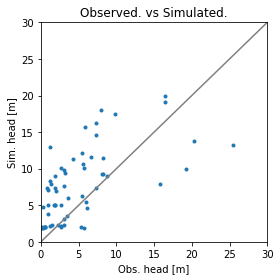

Error is - 8.537529048748091
Params are - [  6.9671985  163.52295019   3.87865484   0.46798559   0.35835233
   1.2515604 ]


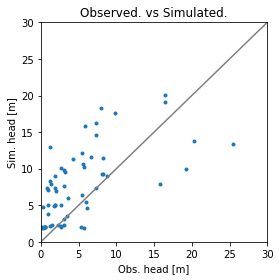

Error is - 8.53678310016962
Params are - [  6.86877774 185.79574703   4.0181208    0.45938226   0.35811719
   1.20489029]


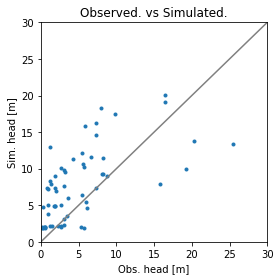

Error is - 8.536438358847981
Params are - [  6.80775842 208.20794097   4.09180959   0.46093509   0.35842706
   1.20384224]


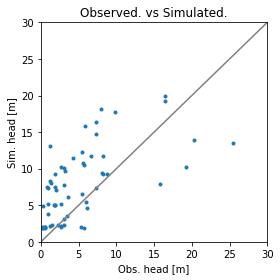

Error is - 8.538267740958032
Params are - [  6.79028214 177.50936204   3.73596649   0.44682776   0.3540546
   1.37310933]


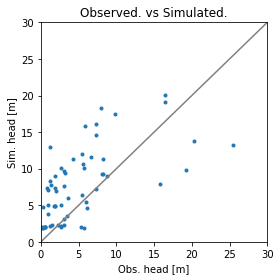

Error is - 8.537260106017973
Params are - [  6.95051323 167.37381052   4.03721077   0.46184976   0.35909626
   1.15330438]


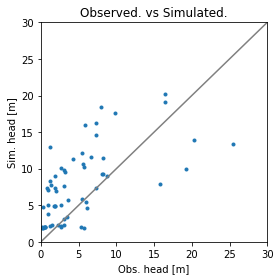

Error is - 8.537878315103622
Params are - [  6.64825863 189.23805668   4.11899427   0.52449848   0.3577906
   1.11019674]


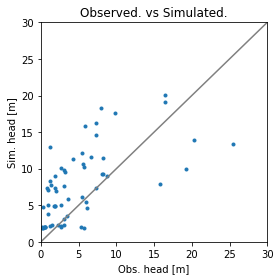

Error is - 8.537333047108882
Params are - [  6.76046613 180.93939293   4.04555846   0.49521192   0.35773162
   1.15653195]


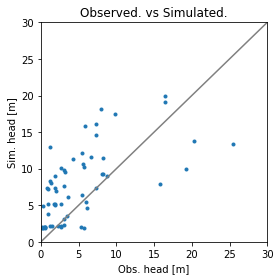

Error is - 8.537071408064797
Params are - [  7.07220852 189.14251124   3.41274305   0.45985611   0.35890913
   1.24791802]


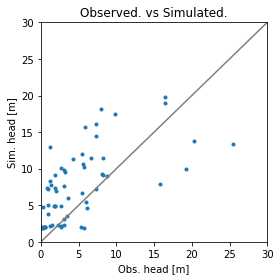

Error is - 8.537036443963796
Params are - [  6.77026994 194.60190953   4.34380299   0.43923512   0.36047323
   1.26656812]


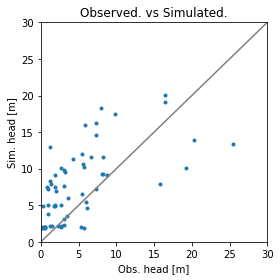

Error is - 8.536448483431956
Params are - [  6.75316259 206.38398545   4.08260056   0.450445     0.35895208
   1.18612363]


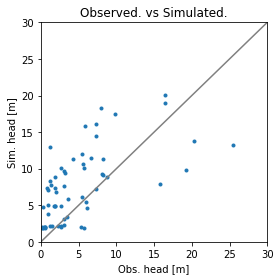

Error is - 8.53682483033766
Params are - [  6.90492591 212.76127511   4.05193381   0.48430722   0.36058719
   1.11987539]


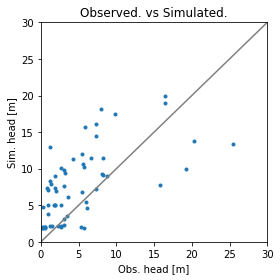

Error is - 8.5364696104055
Params are - [  6.99248007 211.88441801   3.9611418    0.42366418   0.36108337
   1.23601198]


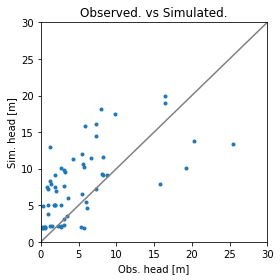

Error is - 8.536122690691055
Params are - [  6.81642193 240.28686959   3.94413317   0.44429781   0.3603811
   1.26680875]


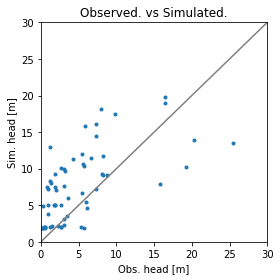

Error is - 8.536202139513746
Params are - [  6.74937628 276.74339912   3.89759436   0.43552184   0.36102352
   1.32356094]


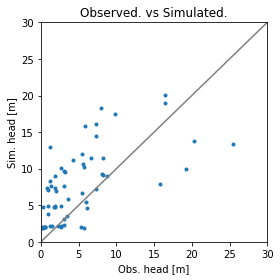

Error is - 8.536824094654461
Params are - [  6.60946443 235.56628831   4.74573093   0.44110537   0.36105888
   1.17849202]


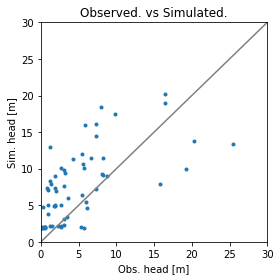

Error is - 8.535953527152948
Params are - [  6.85780117 243.76168295   3.94864696   0.46234978   0.35968999
   1.13048322]


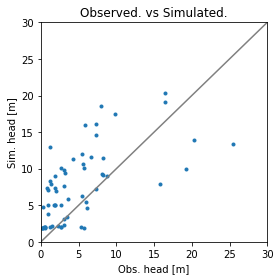

Error is - 8.536118741976779
Params are - [  6.90156679 268.34156967   3.75106895   0.47390711   0.35929837
   1.06244076]


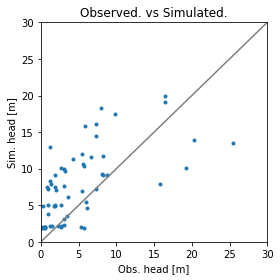

Error is - 8.536573918293959
Params are - [  6.70743697 235.93578665   4.20608719   0.40995852   0.35927697
   1.28071189]


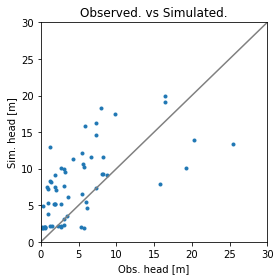

Error is - 8.536833929163514
Params are - [  7.03555595 213.25393956   3.33240884   0.4427781    0.35821131
   1.25616855]


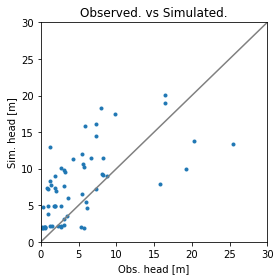

Error is - 8.536330823135238
Params are - [  6.71598731 229.98820112   4.3924004    0.44152355   0.36034699
   1.19791115]


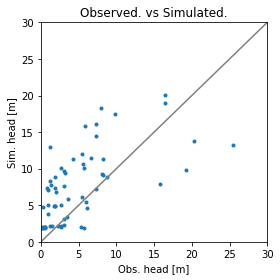

Error is - 8.536765981445626
Params are - [  6.94043353 210.90191272   3.93415697   0.48444662   0.36034989
   1.12634844]


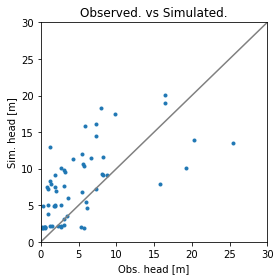

Error is - 8.536212183272125
Params are - [  6.76568611 229.67731817   4.13810464   0.42858055   0.3595452
   1.24212102]


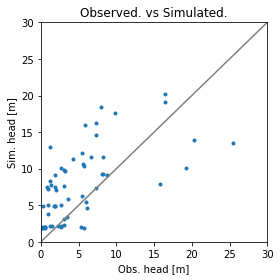

Error is - 8.53644890592337
Params are - [  6.57979244 240.88424807   4.23808997   0.47237974   0.35803077
   1.17308469]


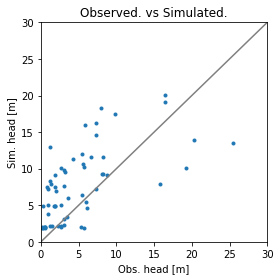

Error is - 8.5362060223927
Params are - [  6.68296435 233.63429056   4.16885293   0.46020085   0.35879392
   1.18881651]


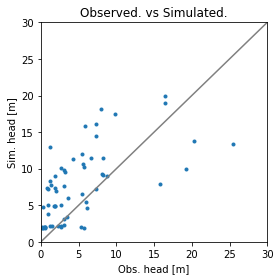

Error is - 8.535879655463741
Params are - [  6.79571051 255.46811567   4.145382     0.44885087   0.36010934
   1.22387067]


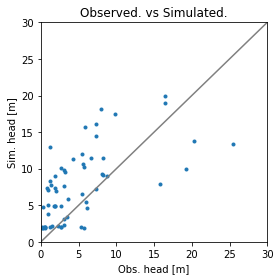

Error is - 8.535797128811298
Params are - [  6.81698447 280.01018077   4.17677272   0.44805381   0.36068797
   1.24274419]


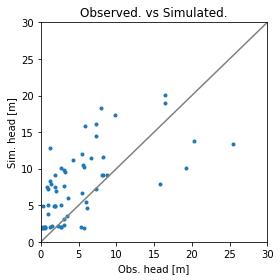

Error is - 8.535746444866195
Params are - [  6.74419002 277.57824009   4.16449401   0.43406702   0.36138799
   1.21911937]


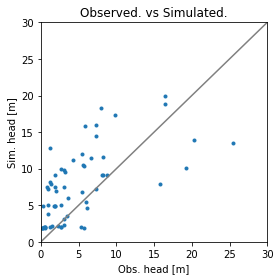

Error is - 8.535760472735442
Params are - [  6.71240582 312.26338965   4.20083622   0.42063299   0.36286846
   1.22675794]


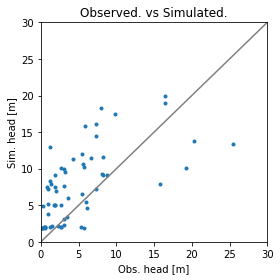

Error is - 8.535699482081467
Params are - [  6.84536203 271.66132625   3.78793441   0.45099306   0.35981507
   1.23211987]


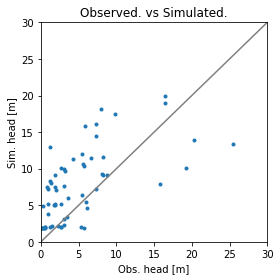

Error is - 8.535862813415635
Params are - [  6.9100494  292.49788881   3.48570141   0.45572781   0.35954911
   1.24922423]


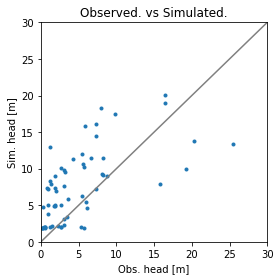

Error is - 8.535687183769753
Params are - [  6.82222188 285.96687857   3.92550676   0.4714069    0.36070681
   1.18457628]


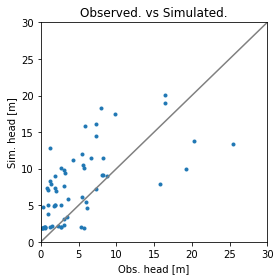

Error is - 8.53585275263994
Params are - [  6.85048977 314.11165877   3.81920782   0.49282007   0.36128762
   1.15580391]


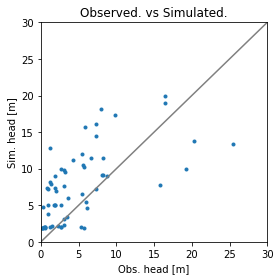

Error is - 8.535618109287114
Params are - [  6.95136282 299.45410218   3.81364308   0.44352194   0.36209572
   1.23646738]


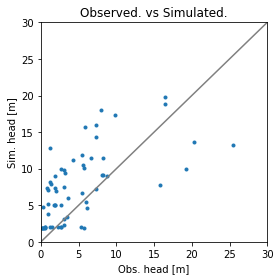

Error is - 8.535889704245278
Params are - [  7.08556206 332.364008     3.63603815   0.43518248   0.36374662
   1.26029281]


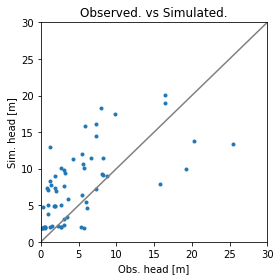

Error is - 8.535411870118395
Params are - [  6.86288554 312.52393402   3.99486615   0.45916636   0.36108009
   1.14836135]


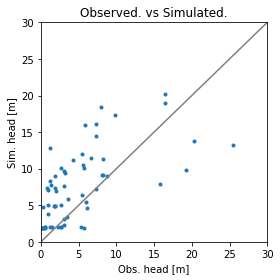

Error is - 8.535489898107349
Params are - [  6.88611735 348.64246624   4.02023264   0.46660063   0.36142958
   1.08913765]


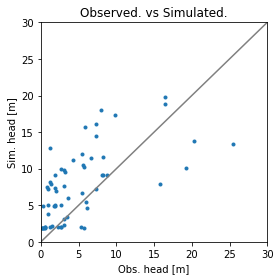

Error is - 8.535646216901524
Params are - [  6.82320108 331.96987101   4.00575875   0.44005325   0.36223456
   1.29064627]


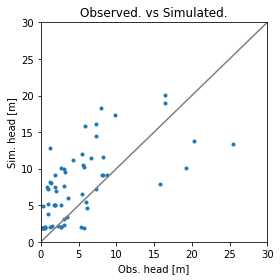

Error is - 8.535462695887754
Params are - [  6.86608999 313.04126993   3.72062833   0.45168237   0.36175211
   1.19435265]


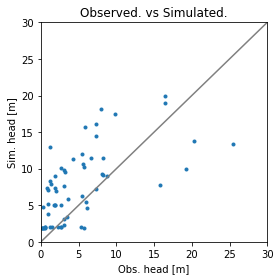

Error is - 8.535601073741063
Params are - [  6.97951776 327.29422057   3.58495181   0.47154093   0.36117346
   1.2097219 ]


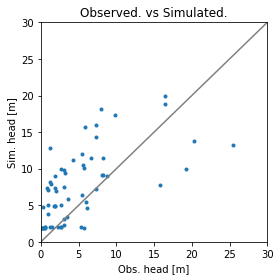

Error is - 8.53552741088647
Params are - [  6.92306432 351.75543251   3.89385055   0.46146419   0.36319918
   1.1892554 ]


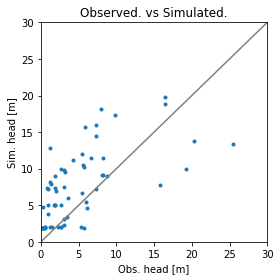

Error is - 8.53540393251727
Params are - [  6.97981863 359.37939817   3.74572613   0.43773611   0.36313823
   1.2383587 ]


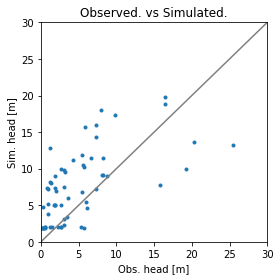

Error is - 8.535636642697206
Params are - [  7.058617   396.08565797   3.65583581   0.42090072   0.36435394
   1.26524991]


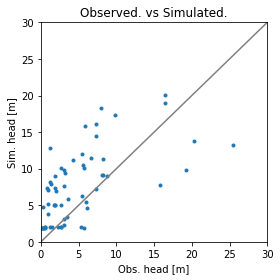

Error is - 8.535672159541623
Params are - [  7.03104528 322.51291479   3.5787966    0.46831738   0.3619117
   1.11485953]


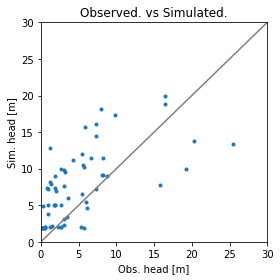

Error is - 8.535461810660143
Params are - [  6.87516213 329.60563195   3.89901821   0.44711928   0.36215384
   1.24669958]


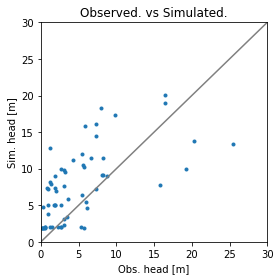

Error is - 8.53525240755086
Params are - [  6.8774833  365.07919353   3.79937065   0.46604781   0.36206992
   1.17244915]


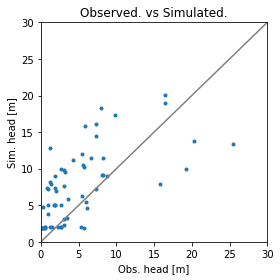

Error is - 8.535249359415616
Params are - [  6.84054355 397.89173921   3.79223443   0.47731074   0.36205702
   1.14044003]


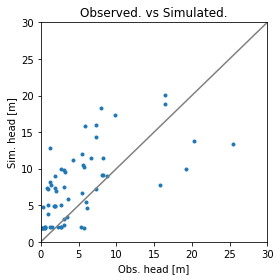

Error is - 8.53529712186738
Params are - [  6.80300362 360.77158136   4.09715612   0.43995209   0.3632867
   1.17610068]


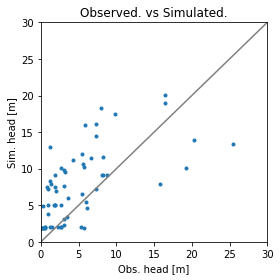

Error is - 8.535197757485857
Params are - [  6.81943683 339.31575237   3.8560259    0.44285813   0.36129015
   1.19218226]


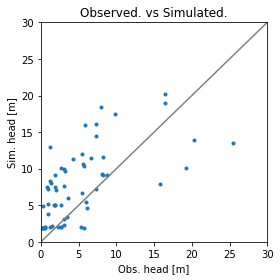

Error is - 8.535364660763713
Params are - [  6.76762308 333.0959123    3.83711358   0.43355509   0.36033563
   1.19364569]


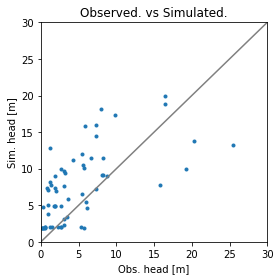

Error is - 8.53518378780445
Params are - [  6.8608601  386.78807576   4.07438065   0.44969854   0.36258323
   1.18636155]


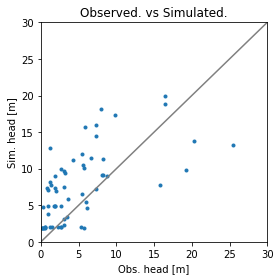

Error is - 8.535345409179696
Params are - [  6.85824516 423.66147868   4.25125681   0.44870662   0.36299879
   1.182366  ]


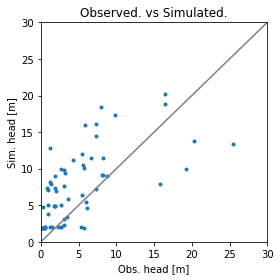

Error is - 8.535129050576918
Params are - [  6.84702063 389.28452835   3.95444492   0.45512137   0.36232463
   1.11390195]


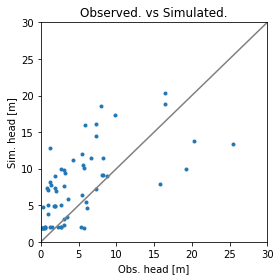

Error is - 8.535387375742848
Params are - [  6.83294988 419.12397654   3.98215827   0.45912242   0.36241002
   1.04750313]


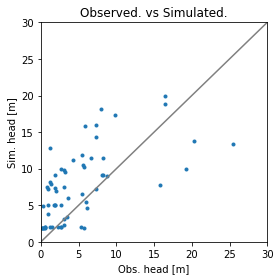

Error is - 8.53506425531761
Params are - [  6.85400891 431.95309105   3.84512324   0.44172597   0.36381323
   1.20075371]


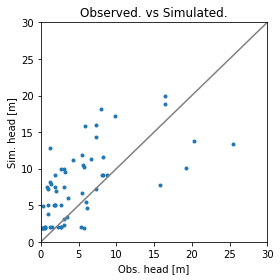

Error is - 8.535214569176565
Params are - [  6.8495706  491.66766957   3.77025178   0.43300578   0.3651798
   1.22694989]


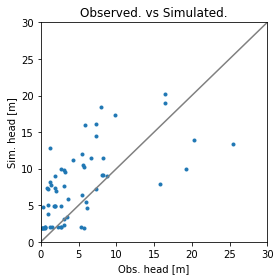

Error is - 8.535247482284317
Params are - [  6.69513925 409.28885786   4.12739563   0.46448616   0.36198009
   1.09822136]


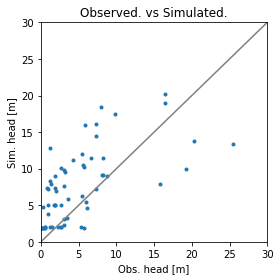

Error is - 8.535014257214822
Params are - [  6.83599947 424.06910017   3.78604547   0.47044822   0.36139608
   1.13451961]


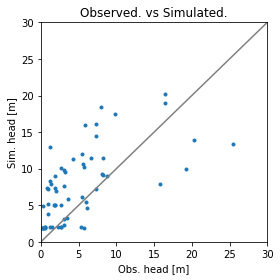

Error is - 8.535174775228093
Params are - [  6.85249739 455.71785958   3.63049014   0.48569628   0.36045077
   1.11372907]


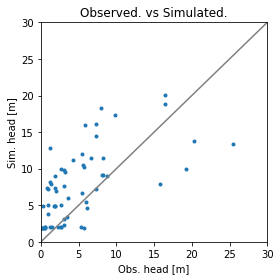

Error is - 8.53501466200547
Params are - [  6.79694485 395.67472932   4.08890417   0.43080205   0.36240545
   1.16820678]


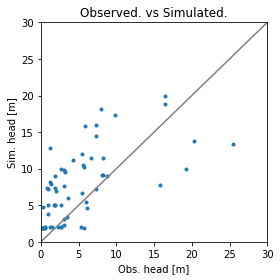

Error is - 8.535191343574455
Params are - [  6.97628434 379.73956781   3.74091249   0.43239859   0.36262417
   1.23375393]


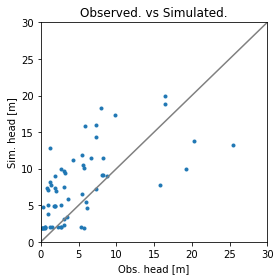

Error is - 8.535047706550612
Params are - [  6.90426927 463.18727845   3.97391107   0.45054012   0.36375878
   1.15365024]


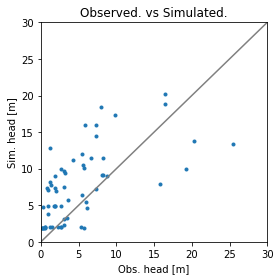

Error is - 8.535260337410545
Params are - [  6.72341674 450.57936656   4.16669068   0.46704683   0.36280296
   1.08537735]


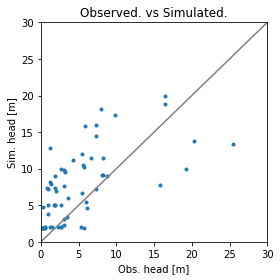

Error is - 8.535019921190127
Params are - [  6.91306744 397.4495175    3.84735704   0.44106065   0.36266887
   1.19665978]


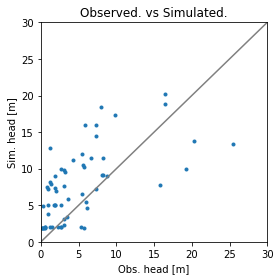

Error is - 8.534936296395614
Params are - [  6.85624342 447.08467252   3.75754798   0.44686759   0.36287245
   1.13620247]


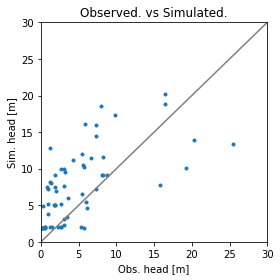

Error is - 8.535156413023223
Params are - [  6.85393508 477.23297089   3.59913165   0.44545212   0.36301705
   1.11112293]


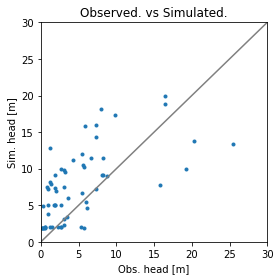

Error is - 8.53490785207024
Params are - [  6.87315716 463.85493465   3.8118514    0.4386935    0.36331366
   1.21609558]


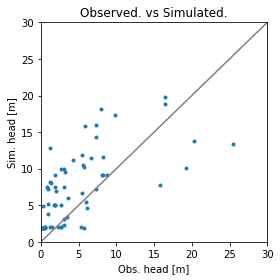

Error is - 8.535077942010385
Params are - [  6.88622543 501.14013781   3.74055465   0.43047956   0.36380817
   1.2671924 ]


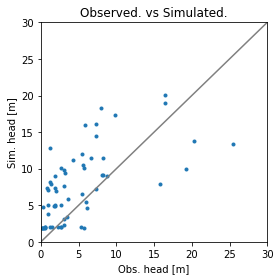

Error is - 8.534821863629263
Params are - [  6.87255162 431.82031981   3.91008247   0.45107807   0.36165853
   1.13435778]


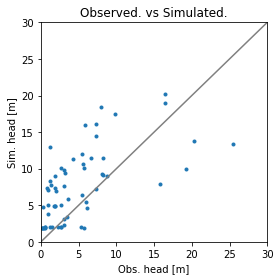

Error is - 8.534877258847834
Params are - [  6.88182298 431.7539342    3.94256209   0.45575413   0.36058118
   1.10115981]


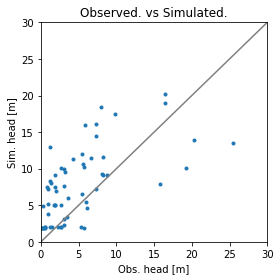

Error is - 8.535023276026452
Params are - [  6.81171872 390.13047954   3.76001844   0.44244324   0.3610129
   1.17503042]


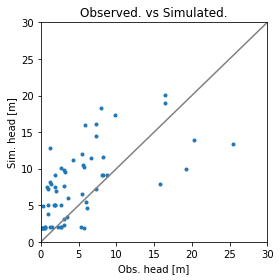

Error is - 8.534899255244355
Params are - [  6.83485635 408.39467927   3.8134916    0.44446746   0.36169937
   1.16968538]


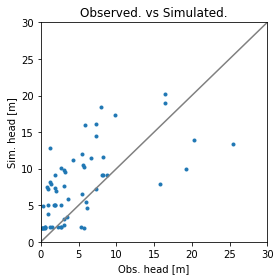

Error is - 8.534858002986219
Params are - [  6.77685019 459.51662775   3.87528399   0.45305831   0.36177964
   1.12302941]


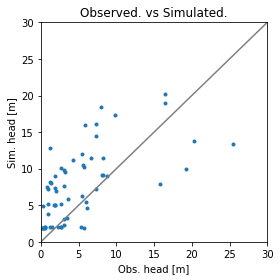

Error is - 8.535018268977437
Params are - [  6.88627455 482.57204874   3.56253014   0.47073567   0.36183446
   1.1364233 ]


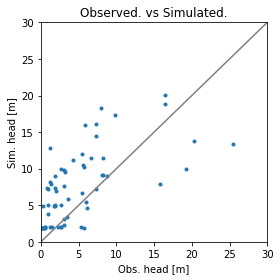

Error is - 8.53488023485954
Params are - [  6.81927728 417.39905917   3.95731066   0.44078546   0.3622627
   1.16026091]


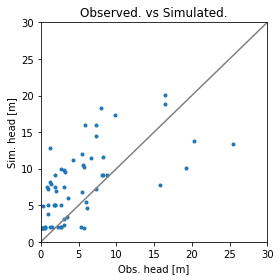

Error is - 8.534911344534676
Params are - [  6.84164587 451.95433089   3.92247724   0.42120191   0.3631327
   1.1786909 ]


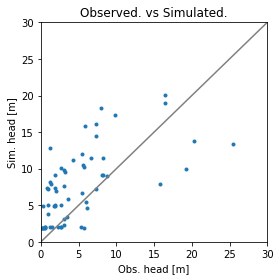

Error is - 8.534782334256958
Params are - [  6.81653607 430.561978     4.00595114   0.43622731   0.36174309
   1.19117085]


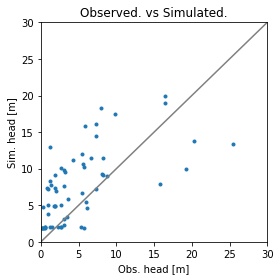

Error is - 8.53485191357566
Params are - [  6.7966824  422.30063074   4.13015272   0.43090717   0.36117841
   1.21865504]


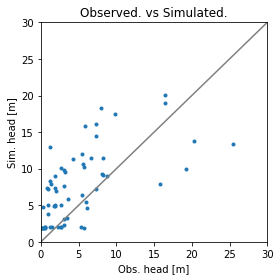

Error is - 8.53493159884661
Params are - [  6.82276368 418.56153533   3.86884652   0.46690146   0.36101963
   1.1528424 ]


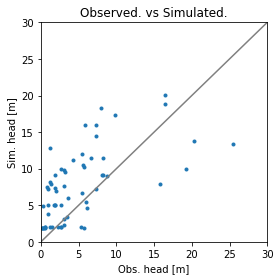

Error is - 8.534821240654225
Params are - [  6.83692533 443.606132     3.90906956   0.4326268    0.36260443
   1.17222878]


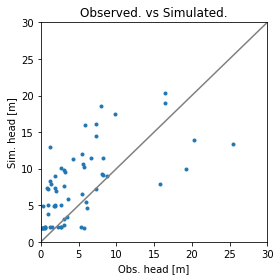

Error is - 8.535023268359565
Params are - [  6.77917512 399.91133068   4.0118784    0.44738764   0.36060227
   1.10081545]


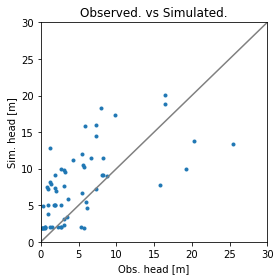

Error is - 8.534816836117402
Params are - [  6.84966165 447.86903366   3.86185815   0.44086703   0.36263581
   1.18727555]


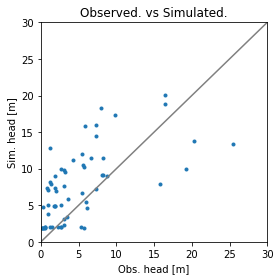

Error is - 8.534750435582607
Params are - [  6.82241102 468.5297042    4.0263604    0.44041353   0.3625287
   1.15308905]


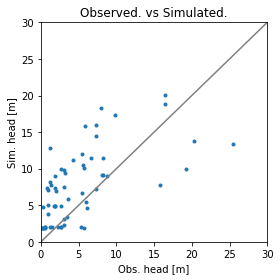

Error is - 8.534780135776312
Params are - [  6.81618836 498.59721666   4.1327948    0.43838657   0.36294337
   1.14479088]


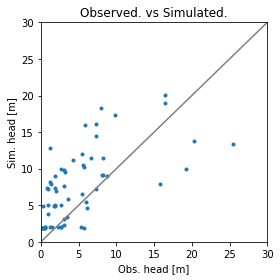

Error is - 8.534661902346532
Params are - [  6.83903468 476.56887263   3.90555791   0.44397157   0.36205403
   1.1601229 ]


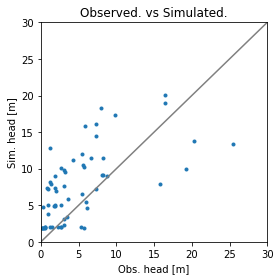

Error is - 8.534575147754264
Params are - [  6.84891339 506.15377937   3.87968154   0.44556462   0.3619497
   1.16005389]


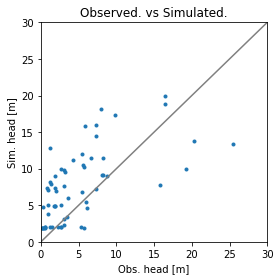

Error is - 8.53485705141252
Params are - [  6.90548284 449.99702126   3.98905043   0.42920081   0.36259378
   1.20969588]


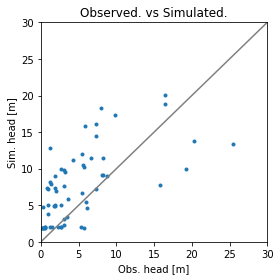

Error is - 8.534762327953631
Params are - [  6.87332468 452.37692288   3.96060882   0.43516519   0.36239024
   1.18802927]


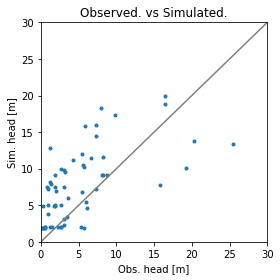

Error is - 8.53480843521374
Params are - [  6.81003909 484.54553022   3.97109406   0.42587676   0.36295879
   1.21625802]


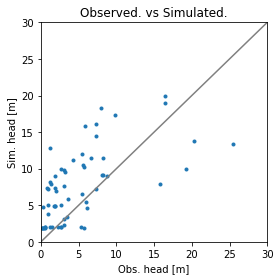

Error is - 8.53466126770612
Params are - [  6.83670331 486.40618411   3.99278181   0.44207802   0.36213101
   1.19306343]


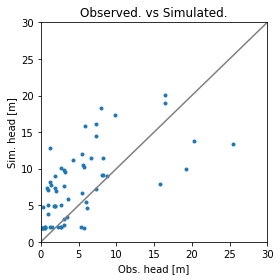

Error is - 8.534618347712874
Params are - [  6.81964754 494.98899927   4.08363443   0.43424144   0.36193137
   1.17994595]


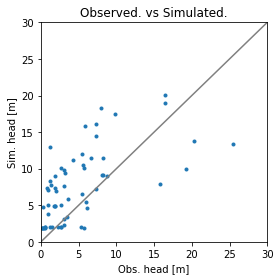

Error is - 8.534726928667974
Params are - [  6.86247291 461.79365905   4.01191198   0.45201995   0.36126591
   1.13885946]


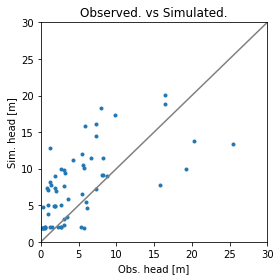

Error is - 8.534608152603505
Params are - [  6.87128821 526.18777163   3.97904185   0.44693361   0.36232256
   1.1465095 ]


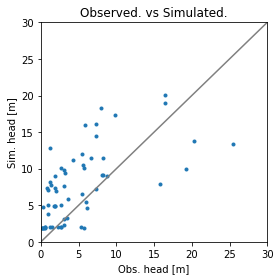

Error is - 8.534577936553449
Params are - [  6.81382078 528.97644299   4.03052852   0.45191854   0.36165284
   1.13581116]


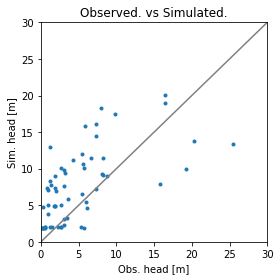

Error is - 8.534485891223566
Params are - [  6.86187102 532.97257461   3.96616632   0.45050519   0.36122243
   1.16499209]


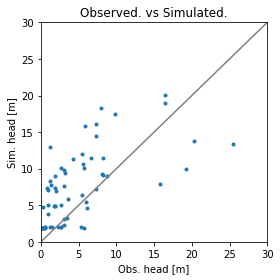

Error is - 8.53441506447727
Params are - [  6.88160102 565.19400981   3.93606928   0.45555102   0.36056929
   1.17094361]


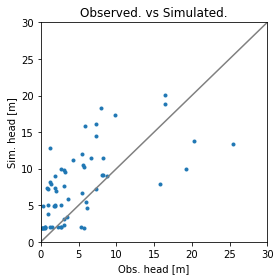

Error is - 8.534447472026233
Params are - [  6.82818517 574.17540334   3.95533383   0.4400758    0.36225301
   1.18991639]


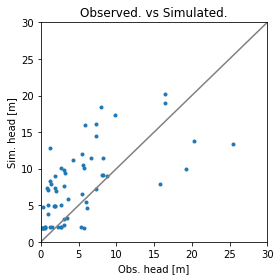

Error is - 8.534419405979417
Params are - [  6.85111539 578.81928469   3.96198134   0.44935032   0.36142858
   1.13466341]


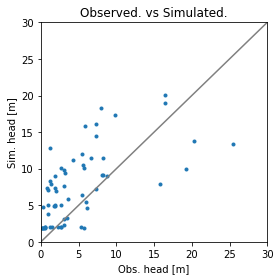

Error is - 8.534485302670037
Params are - [  6.87866045 598.17989801   3.83057768   0.46222319   0.36146062
   1.1326867 ]


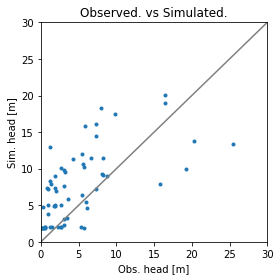

Error is - 8.534346826973302
Params are - [  6.82947719 590.97850111   3.88568221   0.45462756   0.36078213
   1.16151555]


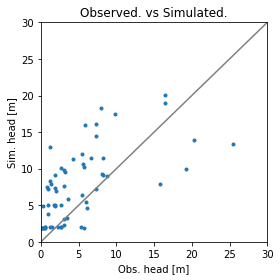

Error is - 8.53430093701128
Params are - [  6.80857168 623.37386585   3.83900238   0.45847453   0.36001191
   1.16901858]


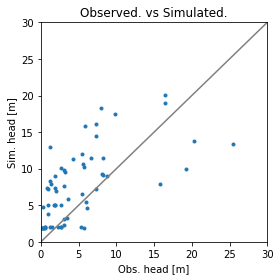

Error is - 8.534297476586412
Params are - [  6.88519492 619.65563736   3.77035349   0.45182796   0.36090487
   1.18328303]


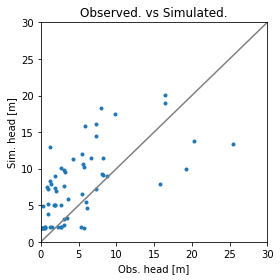

Error is - 8.534290347204324
Params are - [  6.92088199 664.99523455   3.64026598   0.45178267   0.36053088
   1.20701896]


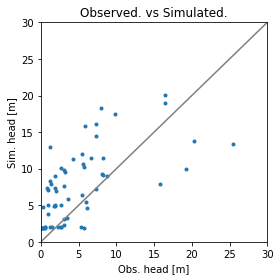

Error is - 8.534194456449478
Params are - [  6.87409185 695.42545271   3.84139529   0.46025455   0.36013507
   1.17469532]


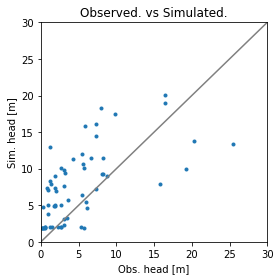

Error is - 8.534147603392384
Params are - [  6.88668107 790.06128939   3.82225217   0.46759952   0.35922775
   1.18201603]


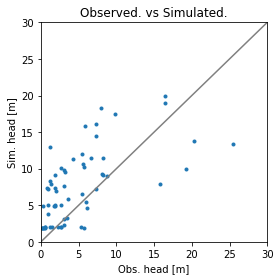

Error is - 8.534153428906304
Params are - [  6.84701832 667.35979787   3.88772397   0.4453881    0.35987985
   1.21850563]


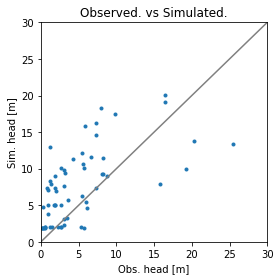

Error is - 8.534233924290447
Params are - [  6.90377133 722.42575738   3.74043121   0.46930626   0.35829641
   1.17080568]


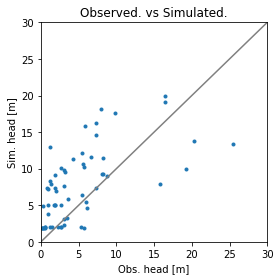

Error is - 8.53429394613554
Params are - [  6.89839308 765.65070026   3.65993366   0.46668371   0.35807679
   1.23810609]


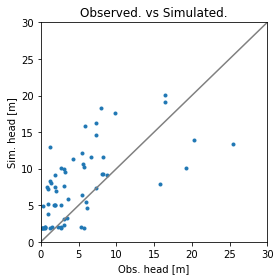

Error is - 8.534223998095351
Params are - [  6.8735048  846.09487195   3.59380052   0.46419391   0.35810524
   1.22421338]


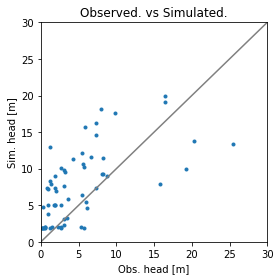

Error is - 8.534214954729357
Params are - [  6.96817852 862.15535128   3.60913346   0.46317685   0.35802706
   1.24453668]


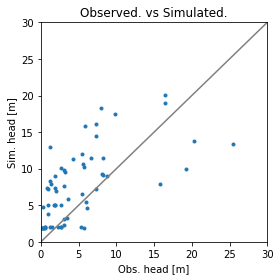

Error is - 8.534062460876058
Params are - [  6.90161893 752.04673388   3.77126878   0.45379873   0.35994561
   1.1775927 ]


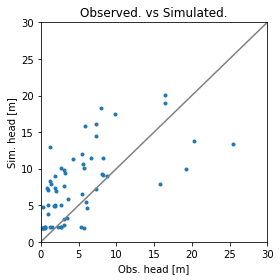

Error is - 8.534087215935052
Params are - [  6.90323186 745.24475069   3.82693633   0.44735624   0.36088002
   1.147336  ]


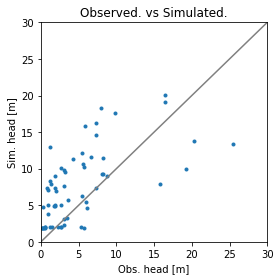

Error is - 8.534098611765511
Params are - [  6.872709   881.71936603   3.83460406   0.46937179   0.35729643
   1.19887107]


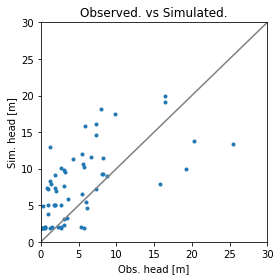

Error is - 8.534017845085055
Params are - [  6.87946556 877.38671275   3.76582977   0.45187004   0.35919757
   1.24443948]


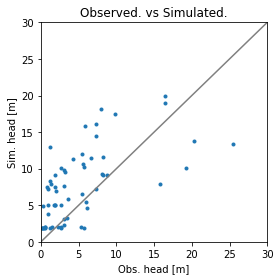

Error is - 8.534057519801276
Params are - [  6.86731268 954.86719044   3.77852905   0.44315193   0.35964815
   1.28125638]


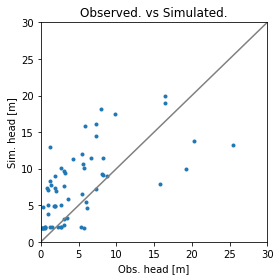

Error is - 8.534136981233383
Params are - [  6.911719   764.14821178   3.96980355   0.45287443   0.35975285
   1.19777382]


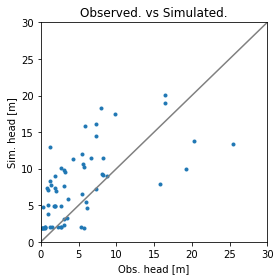

Error is - 8.534149174415719
Params are - [  6.79822545 715.41868595   4.07469397   0.45045735   0.36040629
   1.1618629 ]


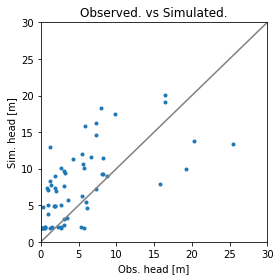

Error is - 8.534070897599628
Params are - [  6.90312135 926.23386873   3.85842679   0.46993586   0.35872898
   1.16901304]


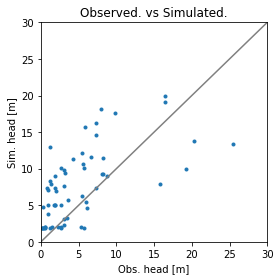

Error is - 8.53423578494371
Params are - [  6.98687953 948.44670824   3.59936773   0.47135944   0.35764344
   1.22803915]


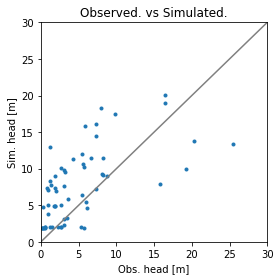

Error is - 8.53404996715839
Params are - [  6.84538897 773.67569152   3.95586241   0.45568287   0.35971558
   1.17840696]


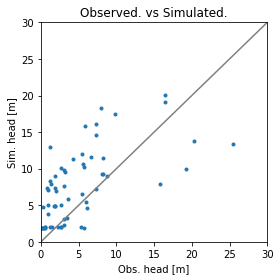

Error is - 8.533910917626908
Params are - [  6.88465987 868.34223885   3.89634628   0.45024505   0.35898459
   1.20668299]


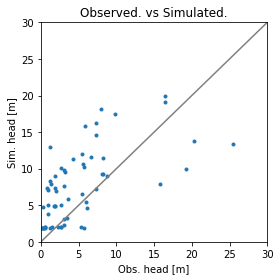

Error is - 8.533844544731869
Params are - [  6.88364926 907.48271358   3.93339334   0.44156782   0.35886301
   1.21901646]


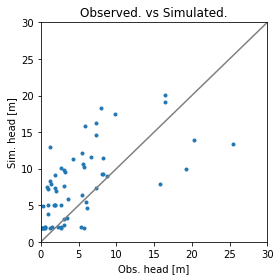

Error is - 8.533962201369599
Params are - [  6.85026536 942.03348371   3.73665817   0.46120127   0.35816287
   1.19800609]


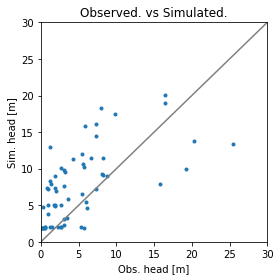

Error is - 8.533953243849831
Params are - [  6.88179414 844.56703536   3.83920903   0.44198041   0.36090812
   1.1966205 ]


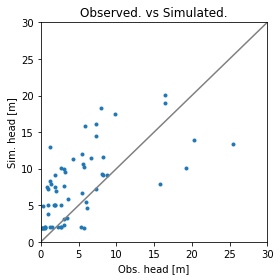

Error is - 8.534076378329148
Params are - [  6.84427272 772.83025487   3.80898037   0.43209785   0.36020194
   1.23568102]


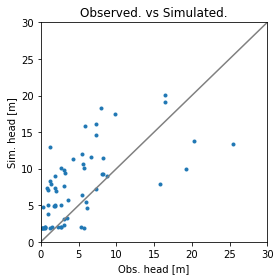

Error is - 8.53396718052095
Params are - [  6.88840919 887.88296526   3.84606519   0.46047636   0.35909722
   1.18568003]


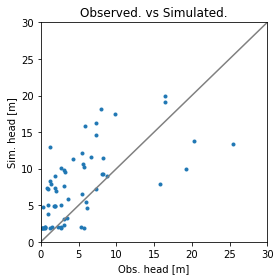

Error is - 8.533853169759425
Params are - [  6.84137189 992.29613352   3.92107052   0.45046086   0.35870251
   1.22979715]


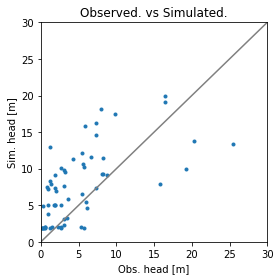

Error is - 8.533860017818352
Params are - [   6.89626283 1043.54065654    3.72487959    0.44683604    0.35859486
    1.24611295]


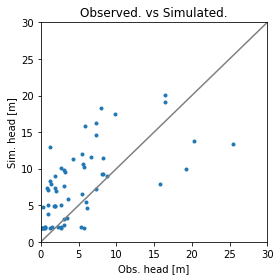

Error is - 8.533767593057133
Params are - [  6.86778533 995.21428324   3.90126218   0.44897088   0.35891196
   1.18063825]


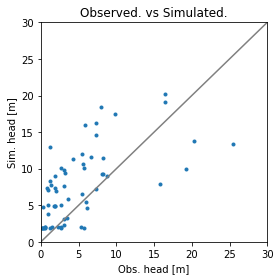

Error is - 8.533753621772542
Params are - [   6.86194522 1054.12806848    3.96897838    0.44752129    0.35876915
    1.14873763]


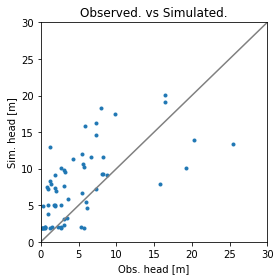

Error is - 8.533745726031112
Params are - [   6.85002037 1040.13306513    3.86199782    0.43604621    0.35890295
    1.22708356]


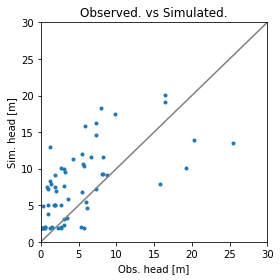

Error is - 8.533791485325818
Params are - [   6.83082596 1116.25811506    3.86996414    0.42383113    0.35880582
    1.24778532]


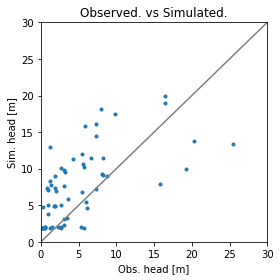

Error is - 8.53381628776366
Params are - [   6.88808255 1018.68240715    4.01318473    0.42693627    0.36008399
    1.22444999]


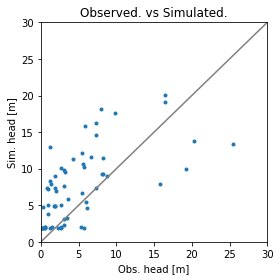

Error is - 8.533723269713702
Params are - [   6.8586499  1174.18731277    3.96862577    0.44114242    0.35706404
    1.23511207]


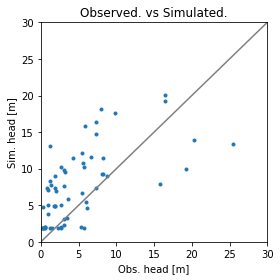

Error is - 8.533854862954486
Params are - [   6.84707778 1338.99745148    4.03333413    0.44072343    0.35514201
    1.25435786]


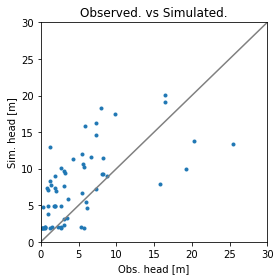

Error is - 8.533809051660871
Params are - [   6.83164357 1018.762577      4.16420393    0.43438891    0.35886703
    1.18195267]


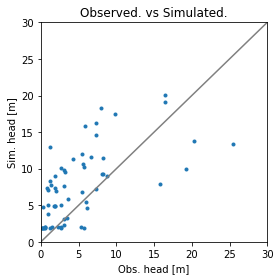

Error is - 8.53370126119695
Params are - [   6.88329173 1078.82924785    4.04905746    0.42540678    0.35881422
    1.18232032]


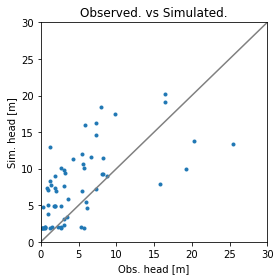

Error is - 8.533811099965753
Params are - [   6.90425165 1122.09580502    4.11305093    0.41287975    0.35887007
    1.1585819 ]


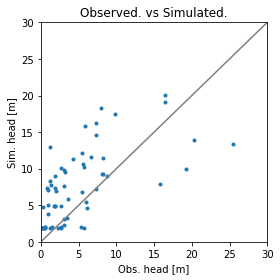

Error is - 8.5336238438492
Params are - [   6.84089519 1220.75817922    4.07528936    0.42891281    0.35863746
    1.18086895]


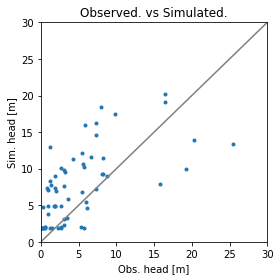

Error is - 8.533631038582435
Params are - [   6.81951815 1377.39591204    4.14623737    0.42258531    0.35852468
    1.1617952 ]


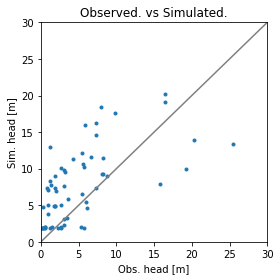

Error is - 8.533718221922907
Params are - [   6.82073278 1176.91707633    4.01619951    0.4442032     0.35693429
    1.16090841]


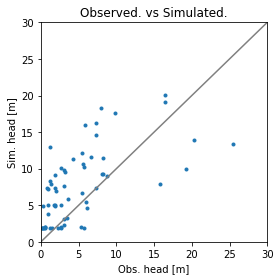

Error is - 8.533626211770649
Params are - [   6.87353483 1229.55507292    3.8158455     0.44002199    0.357507
    1.19639097]


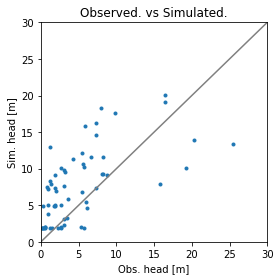

Error is - 8.533690685607596
Params are - [   6.84709638 1252.6652496     3.96002676    0.42438985    0.35718417
    1.24549046]


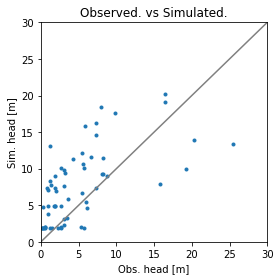

Error is - 8.533664154797655
Params are - [   6.85804656 1337.50431444    4.09968363    0.43197948    0.35647744
    1.17328017]


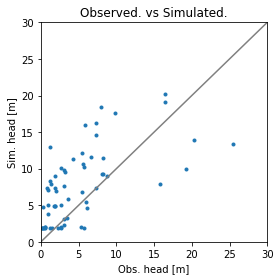

Error is - 8.533672049569848
Params are - [   6.84921592 1257.88906735    4.03674164    0.42382895    0.35812081
    1.14464102]


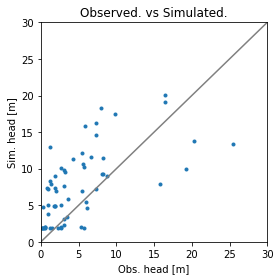

Error is - 8.533642454288424
Params are - [   6.89662743 1282.14996746    3.99601528    0.41397676    0.35864607
    1.21342222]


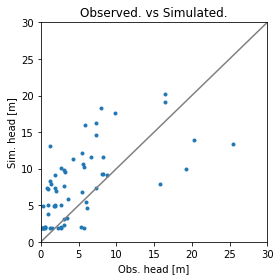

Error is - 8.5335759826975
Params are - [   6.8385137  1448.01136915    3.9454766     0.42896317    0.3567101
    1.20237762]


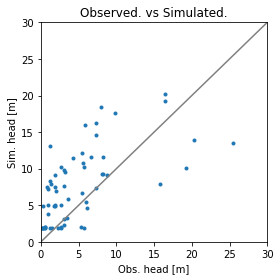

Error is - 8.533660708019438
Params are - [   6.81612469 1632.60242979    3.89368616    0.43074136    0.35565804
    1.21240627]


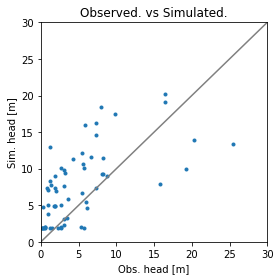

Error is - 8.533660739606274
Params are - [   6.87184816 1339.29074058    4.02965724    0.43150454    0.35818213
    1.12483652]


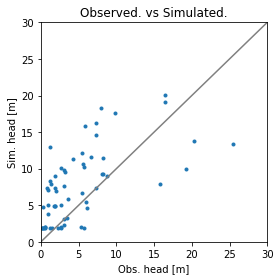

Error is - 8.533570703271911
Params are - [   6.8772727  1361.20081391    3.95058089    0.43462397    0.35726592
    1.21908447]


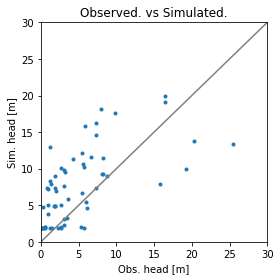

Error is - 8.533675731555016
Params are - [   6.8913011  1412.85668718    3.90750052    0.44002147    0.35683847
    1.25630619]


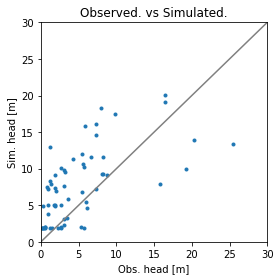

Error is - 8.533587779795383
Params are - [   6.87485077 1289.48439998    3.83793799    0.42735493    0.35917212
    1.20571341]


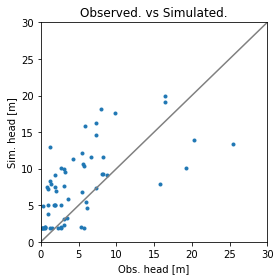

Error is - 8.533786958887962
Params are - [   6.86205005 1271.0958603     3.84405796    0.42644667    0.35779743
    1.28111603]


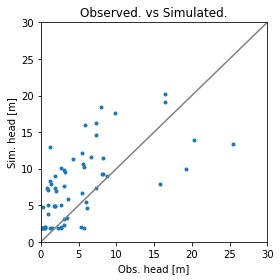

Error is - 8.533562494950743
Params are - [   6.86939863 1322.24202051    3.98325742    0.43024007    0.35808595
    1.1639064 ]


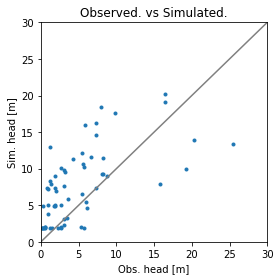

Error is - 8.533641059966126
Params are - [   6.82819452 1341.6006511     3.87344731    0.44939556    0.35714678
    1.17602505]


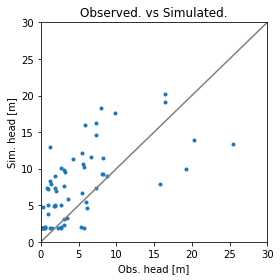

Error is - 8.533574476542821
Params are - [   6.84530274 1326.73798019    3.9040893     0.44054086    0.3575216
    1.18537434]


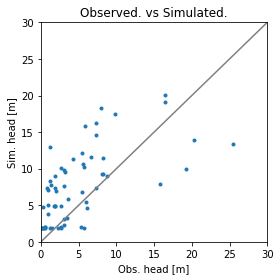

Error is - 8.533553287897426
Params are - [   6.84187642 1426.58984806    4.08303168    0.42352327    0.35829071
    1.18938409]


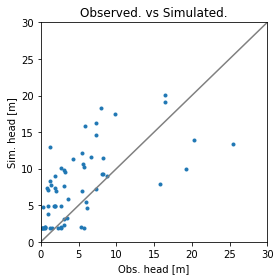

Error is - 8.53364853947948
Params are - [   6.82604721 1525.10723562    4.21662477    0.41527391    0.35868257
    1.18588065]


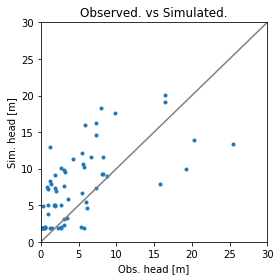

Error is - 8.533536557219742
Params are - [   6.87484314 1503.99729804    3.8261686     0.43283594    0.35704468
    1.20774449]


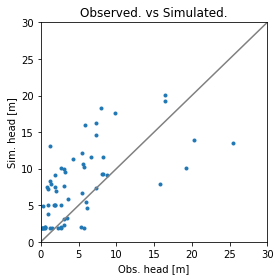

Error is - 8.533634445034636
Params are - [   6.89181712 1645.61685745    3.70160823    0.4347975     0.3562483
    1.22118226]


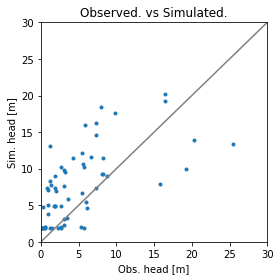

Error is - 8.533632547695307
Params are - [   6.84088501 1506.77537664    4.05959684    0.43622083    0.35580087
    1.18357706]


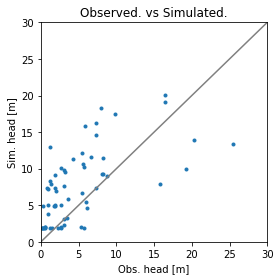

Error is - 8.533538574405393
Params are - [   6.86635933 1343.80714414    3.8933527     0.4295714     0.35832931
    1.20017932]


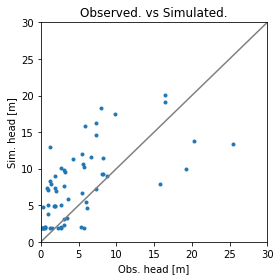

Error is - 8.533540368354341
Params are - [   6.88650395 1313.5136658     3.93468361    0.43481534    0.35880263
    1.18618009]


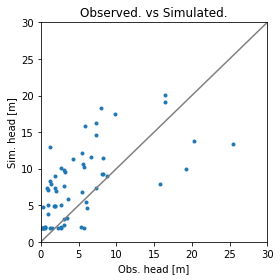

Error is - 8.533527510504014
Params are - [   6.89344865 1430.37894996    3.986269      0.42132914    0.35841813
    1.20345194]


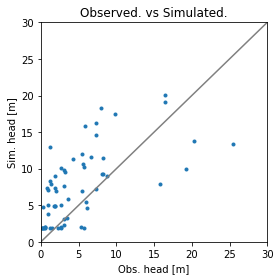

Error is - 8.533601168532941
Params are - [   6.9175216  1482.19943485    4.02735885    0.41172328    0.3588664
    1.21249074]


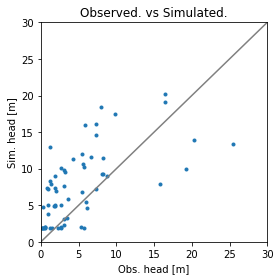

Error is - 8.533544872674401
Params are - [   6.86687067 1418.97549493    3.95167345    0.42281442    0.35905789
    1.16453098]


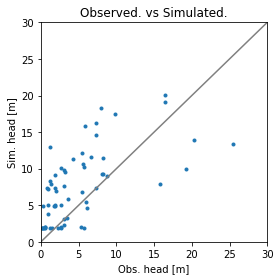

Error is - 8.53350775540273
Params are - [   6.87390209 1490.1787798     3.90846893    0.4247231     0.35856183
    1.21991724]


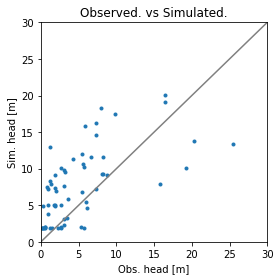

Error is - 8.533556654902474
Params are - [   6.87615382 1574.14715945    3.87107468    0.42196462    0.35879977
    1.24792266]


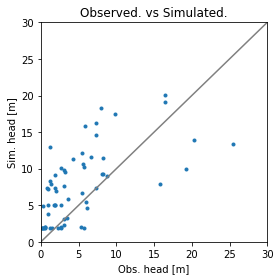

Error is - 8.533542549920321
Params are - [   6.91209953 1407.02726284    3.75050708    0.43183984    0.35844744
    1.20461726]


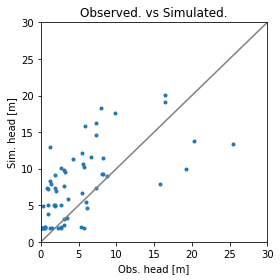

Error is - 8.533595372965648
Params are - [   6.90218156 1410.65887193    3.81480986    0.43555717    0.35747679
    1.24283247]


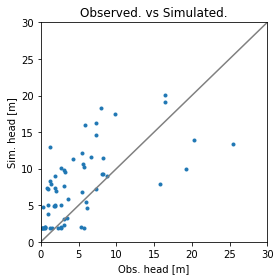

Error is - 8.53350874815562
Params are - [   6.87569839 1416.89633918    3.91745755    0.42600011    0.35866261
    1.18410635]


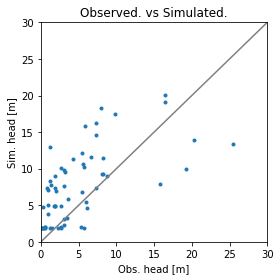

Error is - 8.533547139688203
Params are - [   6.84481899 1425.89679614    4.07162638    0.42458517    0.35815896
    1.19590922]


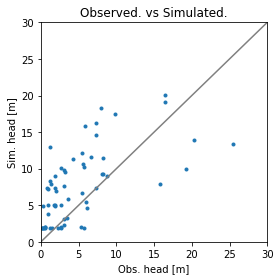

Error is - 8.5335126262513
Params are - [   6.89527939 1411.74464616    3.83078691    0.43002617    0.35837532
    1.20244025]


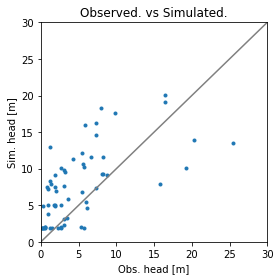

Error is - 8.533551632947322
Params are - [   6.87333971 1552.1540533     3.85281763    0.42001329    0.35766134
    1.21976645]


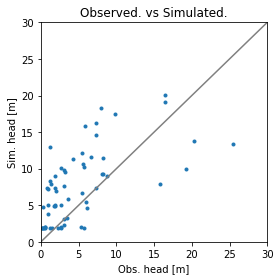

Error is - 8.533511721459687
Params are - [   6.88321289 1373.17376268    3.91421711    0.43111483    0.3585173
    1.19457668]


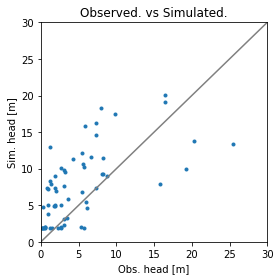

Error is - 8.533467870190224
Params are - [   6.89910219 1531.6494478     3.90110333    0.42577169    0.35819732
    1.20389966]


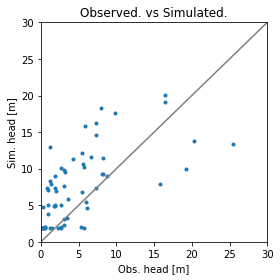

Error is - 8.533445414312055
Params are - [   6.91547361 1625.57059963    3.90497864    0.42387184    0.35813132
    1.20575983]


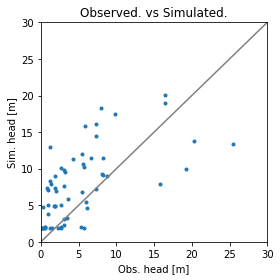

Error is - 8.533574677090305
Params are - [   6.90416187 1411.98372777    3.99455744    0.41951912    0.35984416
    1.19567294]


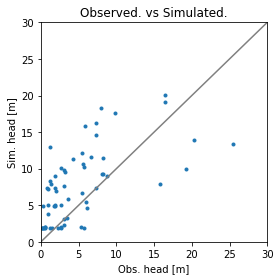

Error is - 8.533496923375075
Params are - [   6.88217282 1480.99390547    3.86826581    0.42950674    0.35774455
    1.2047266 ]


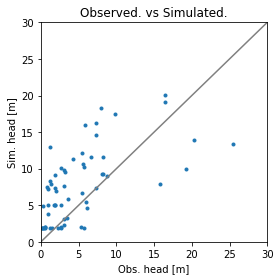

Error is - 8.53350223316345
Params are - [   6.88179775 1502.47372768    3.79512265    0.43375179    0.35824618
    1.20039037]


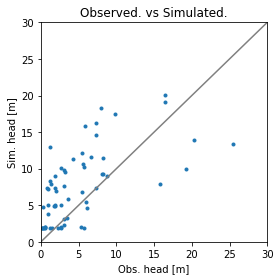

Error is - 8.53346359756706
Params are - [   6.87547313 1551.35105865    3.93871666    0.42629662    0.35824595
    1.20071877]


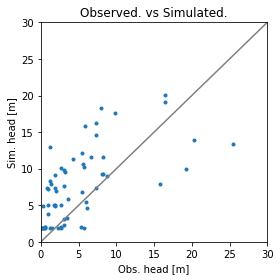

Error is - 8.533463202022824
Params are - [   6.88495971 1649.31437413    3.86345297    0.42360191    0.35801351
    1.21062971]


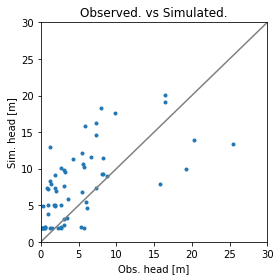

Error is - 8.533470521899437
Params are - [   6.89556131 1683.06447594    3.842211      0.42791722    0.35765184
    1.22994116]


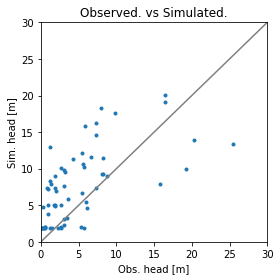

Error is - 8.533442767370035
Params are - [   6.90457736 1674.07726737    3.82911365    0.43025894    0.35744929
    1.19747158]


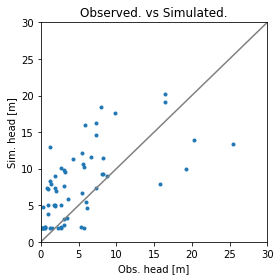

Error is - 8.533451178338726
Params are - [   6.91991499 1766.02651115    3.78943602    0.43302685    0.35689301
    1.18624875]


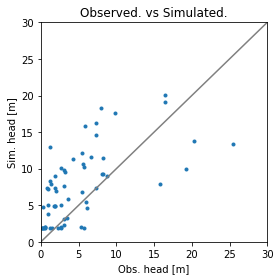

Error is - 8.53346236042238
Params are - [   6.90427489 1718.98349939    3.95379026    0.42006597    0.35749931
    1.21602551]


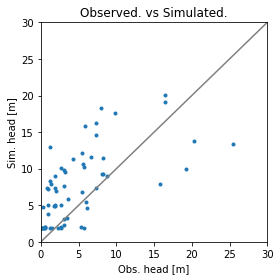

Error is - 8.533417127580424
Params are - [   6.91126718 1819.79318623    3.90915525    0.4211641     0.35791918
    1.21545559]


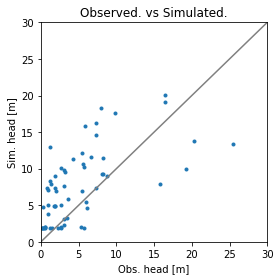

Error is - 8.533409771213014
Params are - [   6.92581436 1989.19282661    3.92959997    0.41699278    0.3580065
    1.22082008]


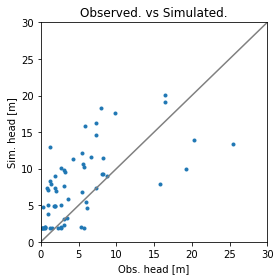

Error is - 8.53344384021266
Params are - [   6.90796304 1719.76539932    3.96433972    0.41911213    0.35813012
    1.18720067]


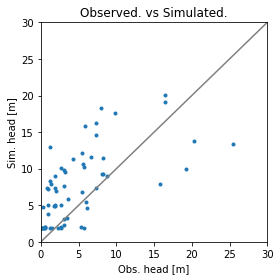

Error is - 8.53341717359778
Params are - [   6.9388812  1907.61693016    3.87637508    0.41833789    0.3574974
    1.21191702]


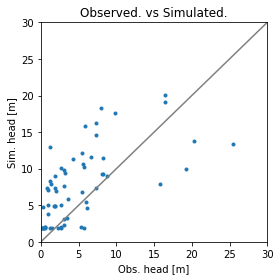

Error is - 8.533425401974691
Params are - [   6.94736845 1895.75446669    3.95594614    0.41927794    0.3575578
    1.20243518]


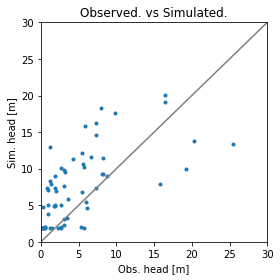

Error is - 8.533380941176627
Params are - [   6.94241778 1885.00899721    3.86632747    0.4225512     0.35809151
    1.19250927]


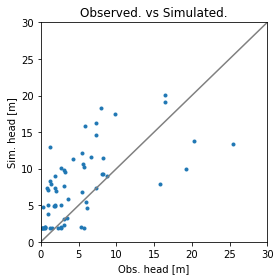

Error is - 8.53336455182682
Params are - [   6.96148922 1968.02174612    3.82259607    0.42379382    0.35838761
    1.18075115]


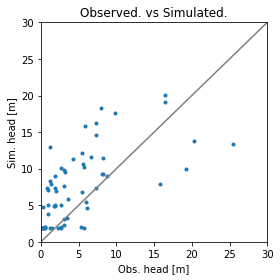

Error is - 8.53337058258543
Params are - [   6.94655759 2092.57227912    3.88767823    0.41871933    0.35754492
    1.19443873]


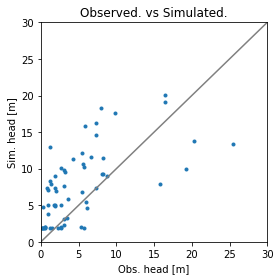

Error is - 8.533370061689263
Params are - [   6.96693301 2122.64643938    3.80276333    0.4233481     0.35735105
    1.21541058]


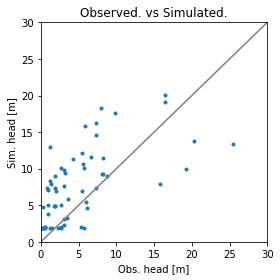

Error is - 8.533425510990071
Params are - [   6.99110392 2317.85762866    3.92920595    0.40989768    0.35799914
    1.21111933]


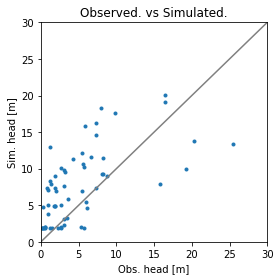

Error is - 8.533389061818147
Params are - [   6.96947228 2156.91253834    3.90418288    0.414988      0.35786168
    1.20770739]


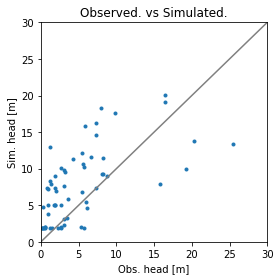

Error is - 8.533361182310184
Params are - [   6.95568077 2183.23311988    3.78511905    0.4194487     0.35799192
    1.20791313]


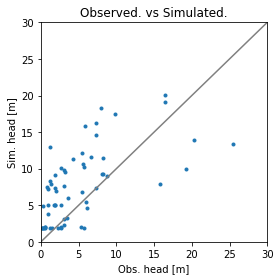

Error is - 8.533387631903187
Params are - [   6.95983694 2326.97244648    3.6997055     0.41953408    0.35820897
    1.21065211]


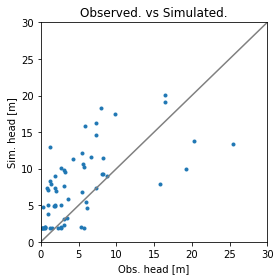

Error is - 8.53332450940476
Params are - [   6.96976788 2263.24271966    3.83427143    0.42075901    0.35821715
    1.19709667]


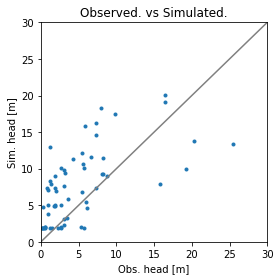

Error is - 8.53329990502936
Params are - [   6.98521123 2441.0556144     3.8132196     0.42196957    0.35857703
    1.18968649]


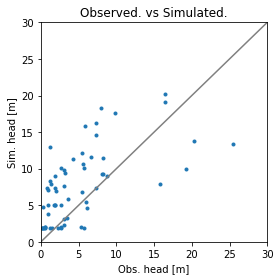

Error is - 8.53333481492189
Params are - [   7.00263368 2332.28775247    3.74225309    0.42376306    0.35789823
    1.17781575]


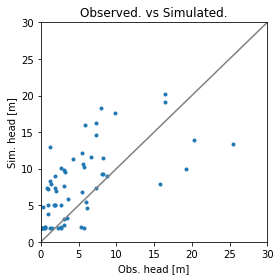

Error is - 8.53334517735729
Params are - [   6.97002956 2223.02644545    3.71369358    0.42869286    0.35805524
    1.18096455]


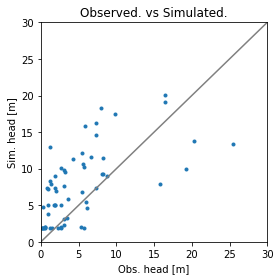

Error is - 8.533343871141499
Params are - [   7.00076823 2330.85142678    3.67220334    0.42828605    0.35854211
    1.18974182]


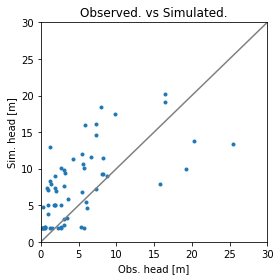

Error is - 8.533351679482331
Params are - [   6.99167121 2370.17892899    3.71359824    0.42530325    0.359133
    1.16021372]


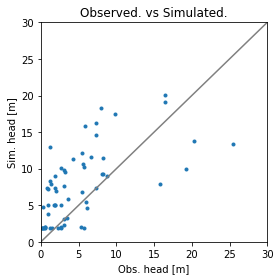

Error is - 8.533318104373661
Params are - [   7.00717567 2658.85601654    3.6574329     0.42536068    0.3583449
    1.18802734]


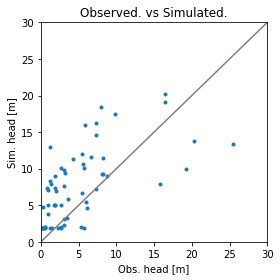

Error is - 8.533353806394052
Params are - [   7.03014908 2602.18560833    3.65234787    0.43167646    0.35885825
    1.15423676]


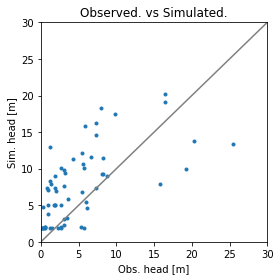

Error is - 8.533326936343391
Params are - [   7.01153201 2497.44748622    3.68554066    0.42861952    0.35864167
    1.16765585]


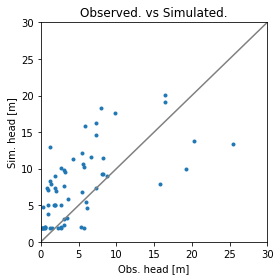

Error is - 8.533324879681293
Params are - [   7.00077891 2457.66265163    3.71451614    0.42692733    0.3575534
    1.20441688]


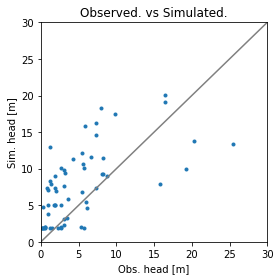

Error is - 8.53330491017842
Params are - [   7.03267035 2683.02720389    3.714695      0.42294921    0.35846387
    1.1914835 ]


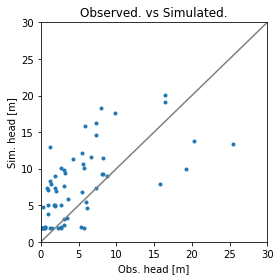

Error is - 8.533290108849695
Params are - [   7.01256572 2692.59414827    3.77034912    0.42157708    0.35795092
    1.18328678]


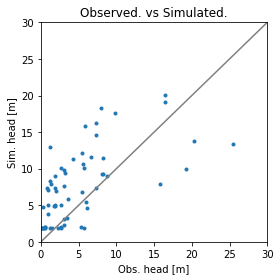

Error is - 8.533296415844408
Params are - [   7.01846446 2873.46550902    3.81942202    0.41822259    0.35765533
    1.18005926]


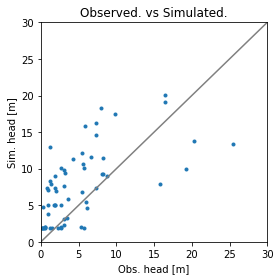

Error is - 8.533279539585697
Params are - [   7.01401095 2811.25995451    3.70966472    0.4253714     0.35861237
    1.19703653]


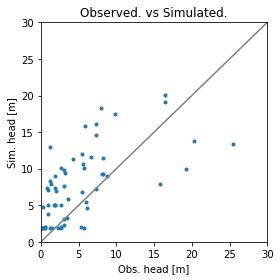

Error is - 8.533277864600475
Params are - [   7.01969959 3050.74605553    3.69337054    0.42617557    0.35896943
    1.20664692]


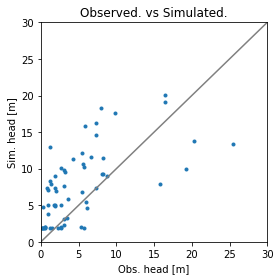

Error is - 8.53330011137378
Params are - [   7.00783515 2830.5330772     3.76898711    0.41970029    0.35797818
    1.22019345]


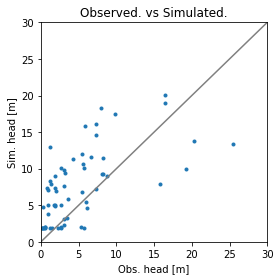

Error is - 8.5332840995573
Params are - [   7.02094033 2994.60805365    3.75816861    0.41898347    0.35920805
    1.18869128]


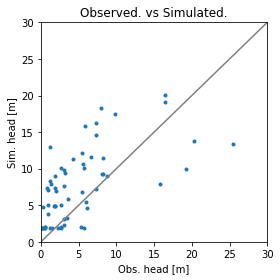

Error is - 8.533308481524442
Params are - [   7.01913178 2905.33203444    3.84883043    0.41842438    0.35870426
    1.20530214]


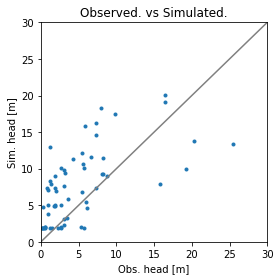

Error is - 8.533286212250431
Params are - [   7.01614276 2843.71302997    3.80098105    0.42015846    0.35861442
    1.20098344]


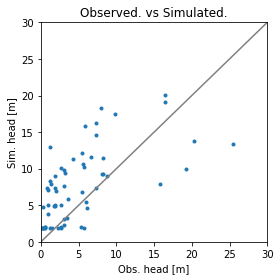

Error is - 8.53326071695593
Params are - [   6.98812791 2934.72278912    3.82033035    0.4199056     0.35863547
    1.20501263]


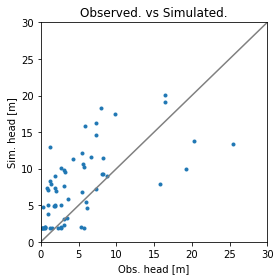

Error is - 8.533256402614542
Params are - [   6.96585668 3060.57058173    3.87314802    0.4183838     0.35872128
    1.21177719]


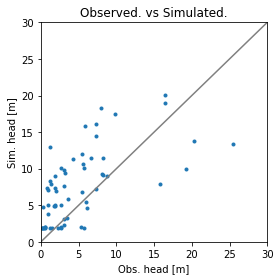

Error is - 8.53327627788762
Params are - [   6.99897028 2863.89608398    3.80075854    0.42271569    0.35936886
    1.17349725]


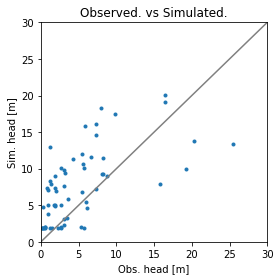

Error is - 8.533249684448982
Params are - [   7.02618056 3394.32036998    3.75237236    0.42069512    0.35903396
    1.1986078 ]


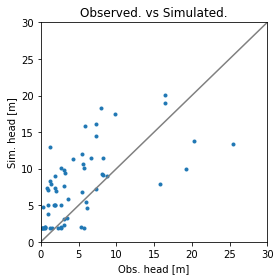

Error is - 8.533252236388822
Params are - [   7.04666523 3870.95274776    3.72194874    0.42005789    0.35926242
    1.20306845]


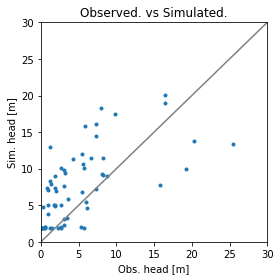

Error is - 8.533287965821685
Params are - [   7.00336435 3376.69057668    3.78925059    0.42079362    0.36002107
    1.21011451]


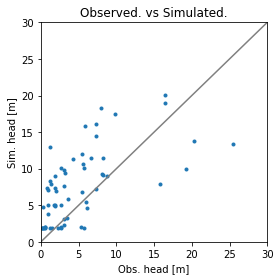

Error is - 8.533266947837282
Params are - [   7.00566469 3205.66646957    3.78452522    0.42098949    0.35950354
    1.20340758]


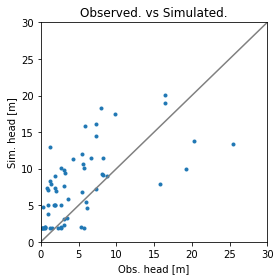

Error is - 8.533244700931647
Params are - [   6.99629462 3346.22284151    3.75313339    0.42248926    0.35965395
    1.1932259 ]


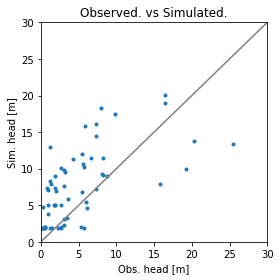

Error is - 8.533248700575275
Params are - [   6.98637056 3597.47774729    3.72920956    0.42365466    0.36017371
    1.18934714]


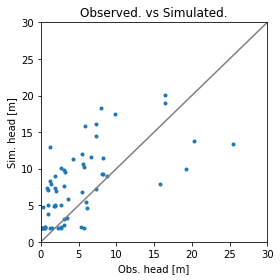

Error is - 8.53322894366666
Params are - [   6.98328182 3312.53274712    3.79426741    0.42483284    0.35920896
    1.2070296 ]


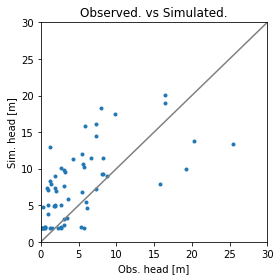

Error is - 8.533219709460173
Params are - [   6.96445256 3471.49509385    3.81231681    0.42775752    0.35920941
    1.21619876]


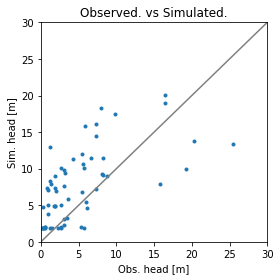

Error is - 8.533243945900644
Params are - [   6.96610687 3396.64442468    3.89871424    0.41816806    0.35952757
    1.1922579 ]


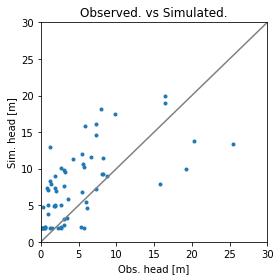

Error is - 8.533245290464693
Params are - [   6.97588171 3761.07717646    3.82397814    0.42011206    0.35918104
    1.23166113]


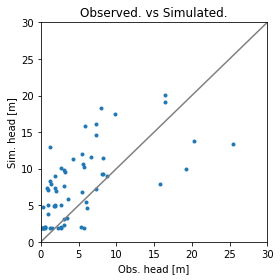

Error is - 8.53320070719928
Params are - [   6.95925965 3604.44369316    3.85336243    0.42154578    0.35893886
    1.21116865]


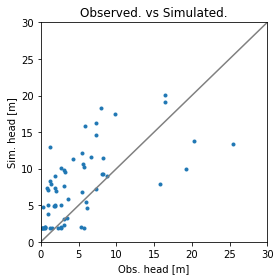

Error is - 8.533181599649499
Params are - [   6.93605713 3803.83230496    3.88778104    0.42182393    0.35865652
    1.21504918]


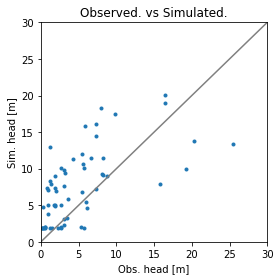

Error is - 8.533204327043896
Params are - [   6.98913447 3997.29348875    3.7696173     0.42529818    0.35969954
    1.2038897 ]


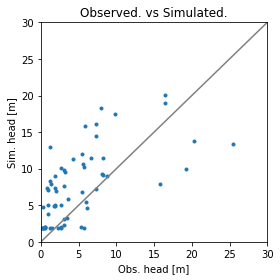

Error is - 8.53319956411605
Params are - [   6.9164619  3864.53474009    3.89614128    0.42452122    0.35960872
    1.21881973]


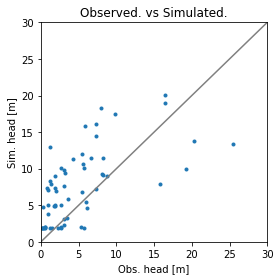

Error is - 8.533191895457074
Params are - [   6.94695414 3532.26378816    3.84858988    0.426574      0.3596042
    1.18148593]


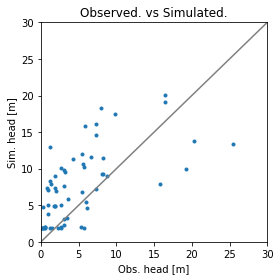

Error is - 8.53318358029457
Params are - [   6.9100944  4009.13177198    3.95125346    0.42555838    0.3591147
    1.21600783]


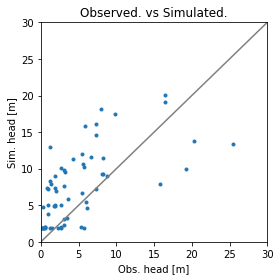

Error is - 8.533177850866464
Params are - [   6.92161132 4162.87263792    3.82318569    0.43234302    0.35910346
    1.22489247]


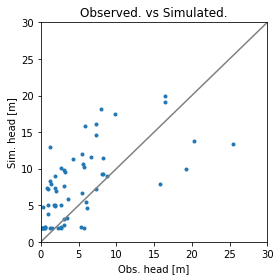

Error is - 8.53322170341775
Params are - [   6.89936354 4545.98674454    3.78542141    0.4394305     0.35889141
    1.24120975]


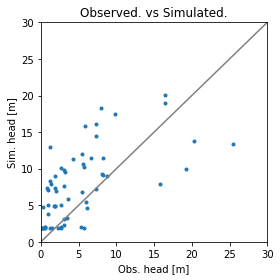

Error is - 8.533147079462115
Params are - [   6.90898522 4318.4811501     3.91320607    0.42428205    0.3593863
    1.20384952]


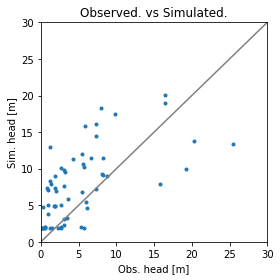

Error is - 8.5331356638799
Params are - [   6.88125155 4741.97417823    3.9636507     0.42254432    0.35947475
    1.1976749 ]


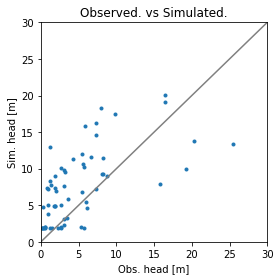

Error is - 8.533178199272708
Params are - [   6.84834234 4040.9096517     4.02058338    0.42582345    0.35882125
    1.21408698]


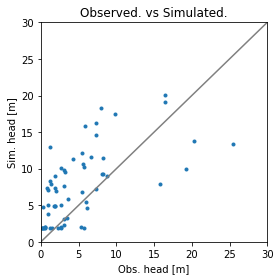

Error is - 8.533130211171766
Params are - [   6.89830839 4232.46003755    3.9355401     0.42703448    0.35864958
    1.19757937]


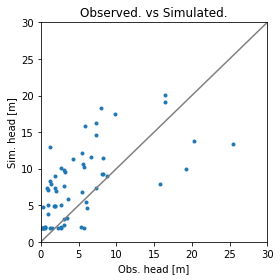

Error is - 8.533121650926173
Params are - [   6.88923164 4416.42268628    3.95523952    0.42829111    0.35817001
    1.18695919]


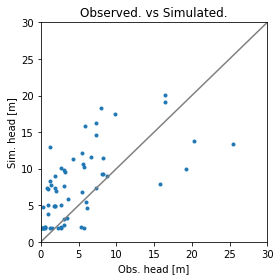

Error is - 8.533180065548146
Params are - [   6.84857532 4859.4506222     4.01864138    0.42555407    0.35817603
    1.23673759]


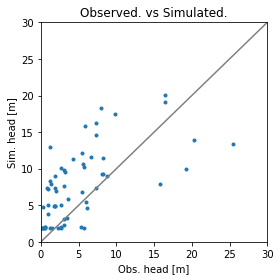

Error is - 8.533120412424157
Params are - [   6.8649287  4666.02225511    3.93844043    0.42656825    0.35835264
    1.20912561]


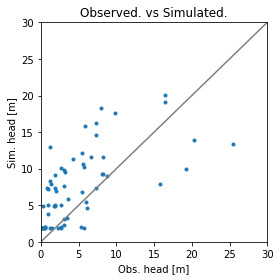

Error is - 8.533122055390521
Params are - [   6.84234585 4994.46749667    3.93203392    0.42707318    0.35797161
    1.2056845 ]


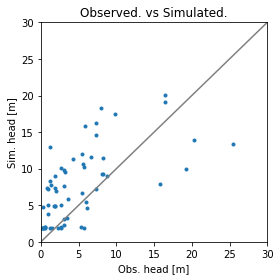

Error is - 8.533124289969761
Params are - [   6.8152565  5158.71837218    4.01879933    0.43188414    0.35870952
    1.20810974]


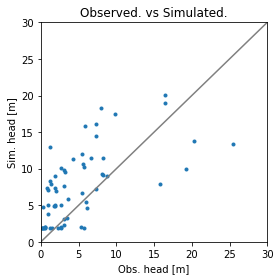

Error is - 8.533133040928698
Params are - [   6.89163203 4202.85597161    3.88799163    0.43026402    0.35936784
    1.17687871]


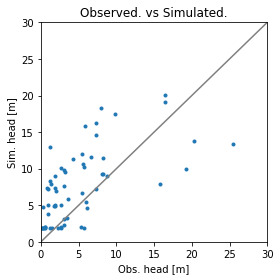

Error is - 8.533088397396131
Params are - [   6.90629491 5075.37904874    3.84185239    0.43147484    0.35890483
    1.18712656]


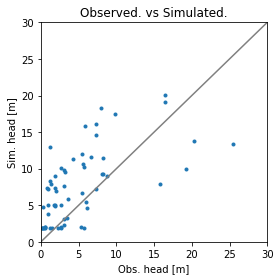

Error is - 8.533098669785494
Params are - [   6.9352712  5592.61374727    3.75248689    0.43430054    0.35894662
    1.17364634]


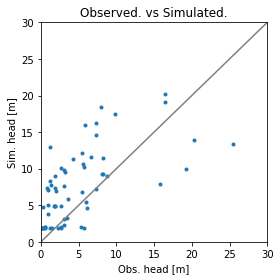

Error is - 8.533143703329209
Params are - [   6.82792046 5257.58486613    4.04547231    0.42466587    0.3585564
    1.16373243]


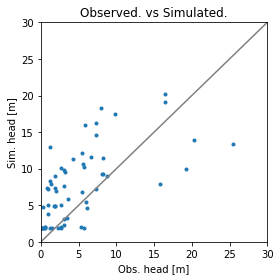

Error is - 8.53311054677734
Params are - [   6.85134317 4983.90680908    3.98990066    0.42658516    0.35869317
    1.17902244]


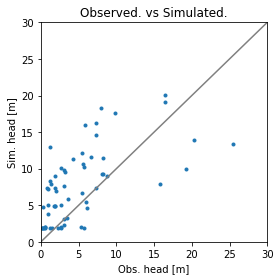

Error is - 8.533113357050329
Params are - [   6.85831077 4759.12753611    3.91375729    0.43581152    0.35792459
    1.18473251]


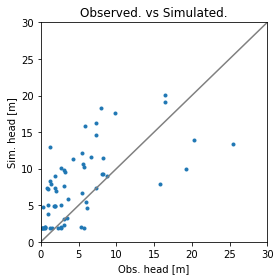

Error is - 8.533116848100633
Params are - [   6.8368232  5483.66959756    3.9980049     0.42994098    0.35755041
    1.20814664]


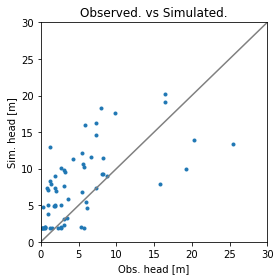

Error is - 8.533116842026267
Params are - [   6.92038763 4636.12427211    3.86026574    0.42767315    0.35782236
    1.17692792]


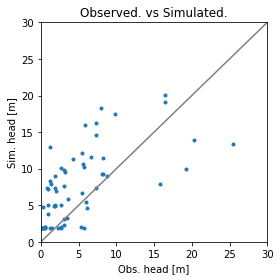

Error is - 8.53308652893991
Params are - [   6.85679782 5451.65381996    3.89216762    0.43106019    0.35824599
    1.1947347 ]


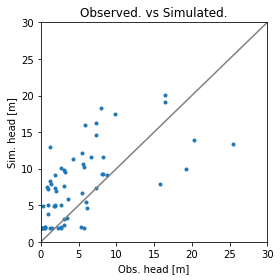

Error is - 8.533095189900711
Params are - [   6.84058091 5969.2693868     3.86063167    0.43244473    0.35828398
    1.19862246]


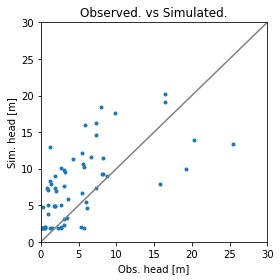

Error is - 8.533091557523031
Params are - [   6.87839047 5463.93143941    3.89354243    0.43428036    0.35802781
    1.16777131]


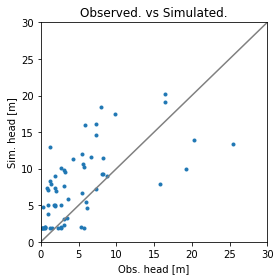

Error is - 8.533140612938704
Params are - [   6.92035172 4639.70471091    3.79915714    0.43235409    0.35898917
    1.15529184]


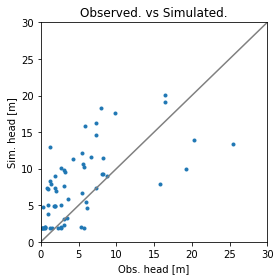

Error is - 8.533093497556147
Params are - [   6.85770533 5272.6783759     3.94829296    0.43054426    0.3579101
    1.19493294]


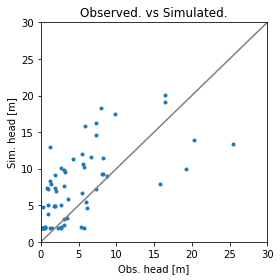

Error is - 8.533092962325284
Params are - [   6.81589319 5699.43473762    3.96623871    0.43557896    0.35874647
    1.19251224]


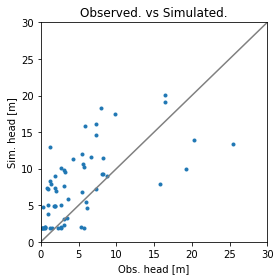

Error is - 8.53307015768565
Params are - [   6.86383086 5889.86720746    3.93024097    0.42736307    0.3589182
    1.18730088]


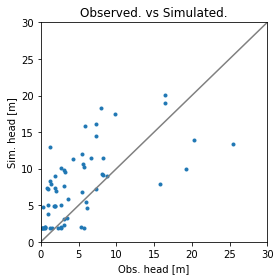

Error is - 8.53307644882166
Params are - [   6.86659091 6455.23704314    3.9384828     0.42313884    0.35941501
    1.18858507]


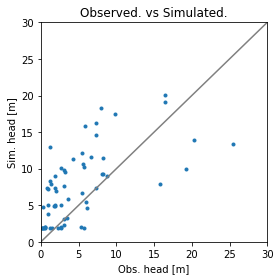

Error is - 8.533078229988522
Params are - [   6.87496102 5967.07473395    3.83421103    0.43684874    0.35822463
    1.19577044]


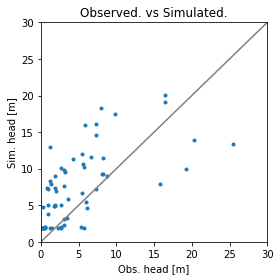

Error is - 8.533077557498668
Params are - [   6.87435076 5909.76861982    3.83779142    0.43499113    0.35911254
    1.1801391 ]


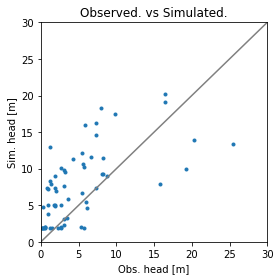

Error is - 8.53308792695796
Params are - [   6.93564876 5553.12355216    3.77702991    0.42976048    0.3583982
    1.17843543]


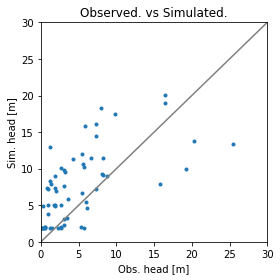

Error is - 8.53309323993332
Params are - [   6.89223758 5818.35755462    3.81088868    0.42955245    0.35924032
    1.20673106]


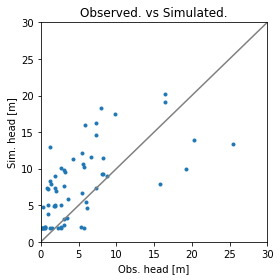

Error is - 8.533076127568723
Params are - [   6.88185224 5552.53796821    3.87287899    0.43309839    0.35833093
    1.17751125]


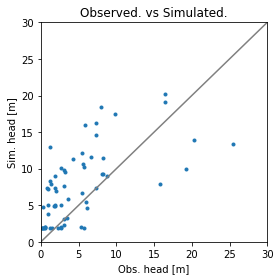

Error is - 8.533068421381504
Params are - [   6.85618558 6365.96291844    3.87292092    0.43289916    0.358172
    1.18417071]


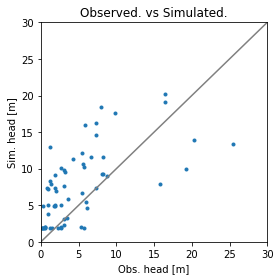

Error is - 8.533082994025898
Params are - [   6.83113091 7011.25485329    3.88845519    0.43361132    0.35780559
    1.18269278]


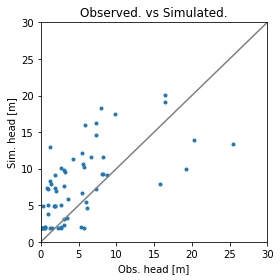

Error is - 8.5330925627848
Params are - [   6.80034401 6159.16487046    3.96970708    0.43565974    0.35860323
    1.1947736 ]


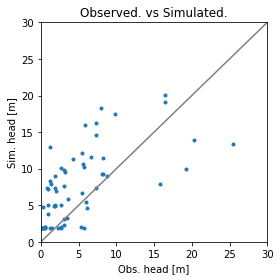

Error is - 8.533072826218476
Params are - [   6.90182257 5704.63388173    3.8251992     0.4312353     0.35844946
    1.18251997]


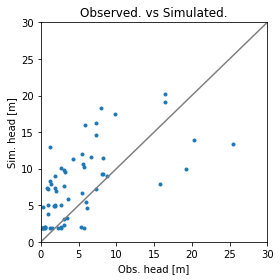

Error is - 8.533060443719032
Params are - [   6.89420319 6344.96128992    3.83224656    0.4344184     0.35882327
    1.17440275]


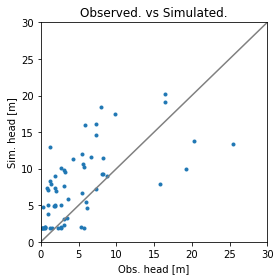

Error is - 8.533067999645832
Params are - [   6.91290588 6791.6150249     3.80228603    0.43609751    0.3591119
    1.16423677]


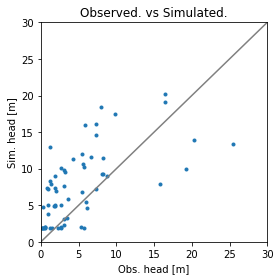

Error is - 8.533079278765792
Params are - [   6.88245405 5955.50256124    3.88954832    0.42781974    0.35904417
    1.16624445]


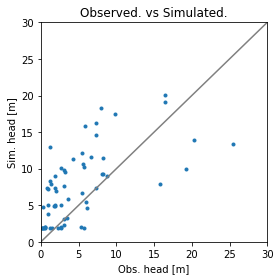

Error is - 8.533067862142278
Params are - [   6.87683428 5964.18169078    3.84804536    0.43459149    0.35842951
    1.18838894]


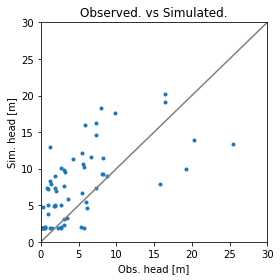

Error is - 8.533066010882592
Params are - [   6.88389215 6030.9463657     3.88938591    0.42954414    0.35792858
    1.18462573]


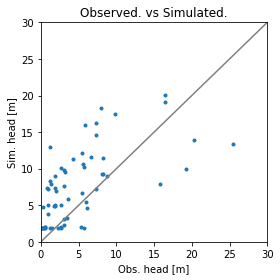

Error is - 8.533051950925936
Params are - [   6.87707063 6547.64648313    3.85980065    0.43025213    0.35857607
    1.18962508]


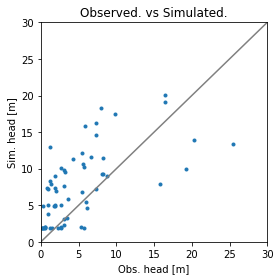

Error is - 8.53304808903781
Params are - [   6.87467982 7045.20074059    3.85326148    0.428829      0.35869864
    1.19568199]


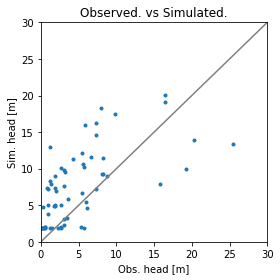

Error is - 8.533049162810515
Params are - [   6.84805273 6842.40618923    3.91683453    0.43131312    0.35854061
    1.1890037 ]


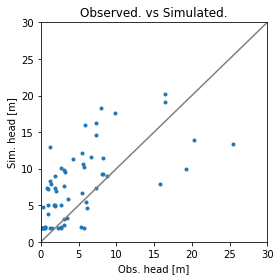

Error is - 8.533066948625944
Params are - [   6.88078505 6974.68585742    3.80732395    0.43650203    0.35794601
    1.18479039]


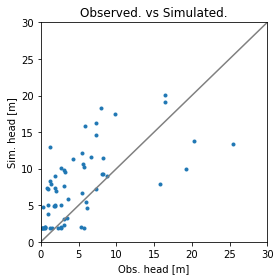

Error is - 8.533043857081118
Params are - [   6.89663016 6701.49779277    3.84277834    0.4321669     0.35861687
    1.18812713]


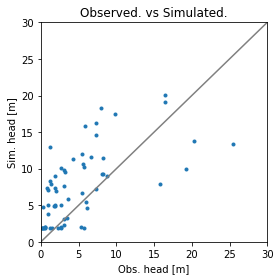

Error is - 8.533042694101946
Params are - [   6.91685245 6869.26522993    3.82770705    0.43180078    0.35883931
    1.19010533]


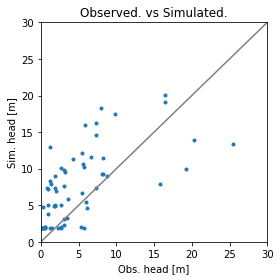

Error is - 8.533031606001286
Params are - [   6.88932085 7404.97353349    3.86087447    0.42954434    0.35849596
    1.18448103]


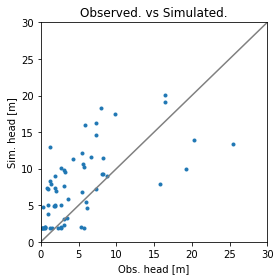

Error is - 8.533022571797357
Params are - [   6.89556414 8125.36945484    3.86728903    0.42702076    0.35852918
    1.18252707]


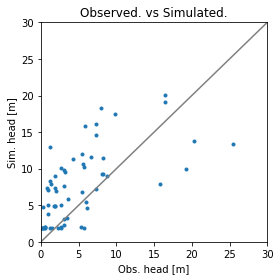

Error is - 8.533054710274417
Params are - [   6.89029644 6778.03056598    3.92158423    0.42447337    0.35917386
    1.18732514]


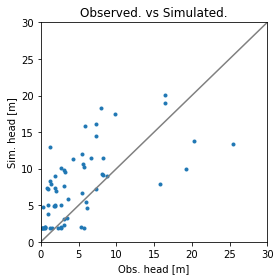

Error is - 8.533039319727457
Params are - [   6.88932411 7970.79812446    3.85025505    0.42974101    0.35960637
    1.1883896 ]


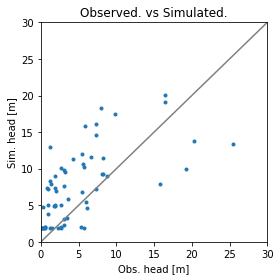

Error is - 8.5330375189522
Params are - [   6.87738671 8198.72881176    3.91339723    0.42330761    0.35897272
    1.20327486]


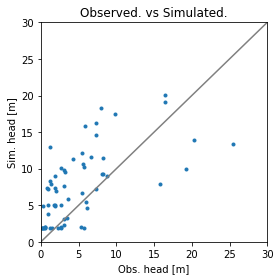

Error is - 8.533033166511958
Params are - [   6.87699021 8239.22561762    3.82133056    0.43286406    0.35855509
    1.19566905]


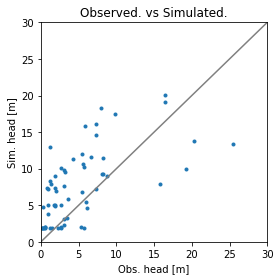

Error is - 8.533031869284068
Params are - [   6.92887976 8640.45647051    3.7942456     0.42654128    0.35919316
    1.19621227]


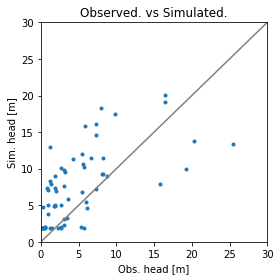

Error is - 8.533015646212666
Params are - [   6.9203193  8969.41382912    3.83814669    0.42826283    0.35919997
    1.18971073]


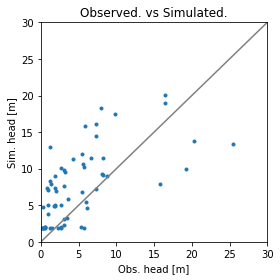

Error is - 8.533018329957516
Params are - [   6.94313904 9931.52037338    3.8305893     0.42797974    0.35945063
    1.1867251 ]


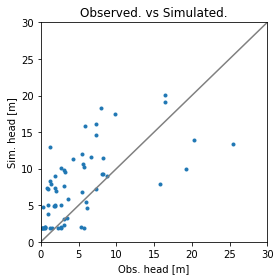

Error is - 8.53302068042307
Params are - [   6.87930229 9845.39887284    3.867181      0.42411174    0.35917952
    1.19515586]


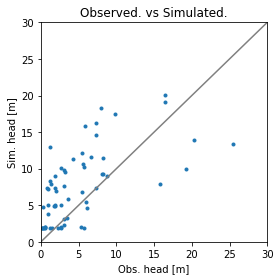

Error is - 8.533016283494181
Params are - [   6.90349003 9368.73289443    3.85027499    0.42429509    0.35827017
    1.19912702]


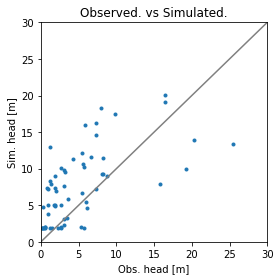

Error is - 8.533019621737964
Params are - [   6.92412854 9530.80356803    3.76609206    0.43105764    0.35866964
    1.18285914]


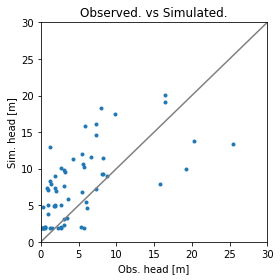

Error is - 8.533023935155418
Params are - [   6.94023781 9920.83274563    3.8397459     0.42089906    0.35912546
    1.18619498]


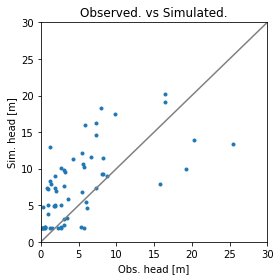

Error is - 8.533004652559582
Params are - [   6.89213428 9946.39398446    3.88199763    0.42534109    0.35846482
    1.18231266]


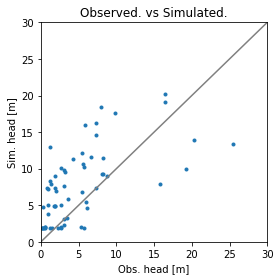

Error is - 8.533014007322151
Params are - [    6.87376154 10599.36274143     3.92587365     0.42474099
     0.35810065     1.17536286]


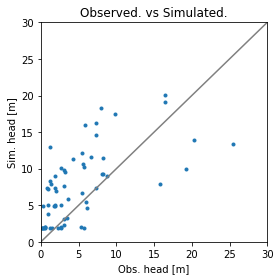

Error is - 8.533025862933405
Params are - [   6.86474172 8674.53812227    3.85058123    0.432464      0.35831231
    1.19103585]


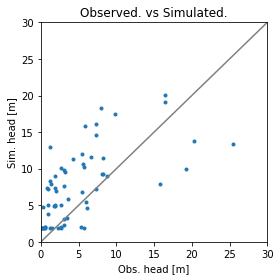

Error is - 8.53301219413625
Params are - [   6.92136379 9609.25908979    3.84245474    0.42379029    0.35892217
    1.18740519]


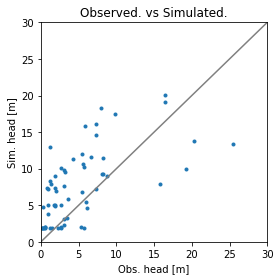

Error is - 8.53300390525598
Params are - [    6.91801527 10964.63129138     3.81476001     0.42526547
     0.35903959     1.1963298 ]


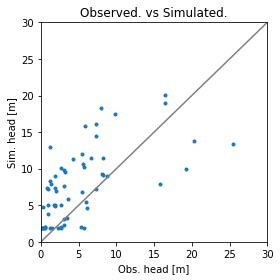

Error is - 8.533010979556984
Params are - [    6.92924083 12384.26220965     3.78849549     0.42438782
     0.35929479     1.20323116]


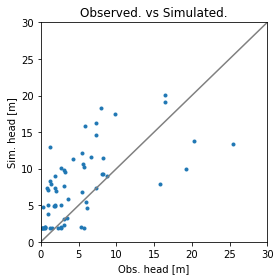

Error is - 8.53300852687177
Params are - [   6.94718144 9617.67934623    3.79739437    0.42855906    0.3583426
    1.18409232]


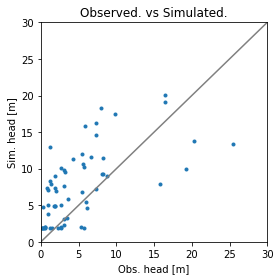

Error is - 8.533016657003602
Params are - [   6.9100395  9961.23324377    3.90891741    0.4207803     0.35874347
    1.1968001 ]


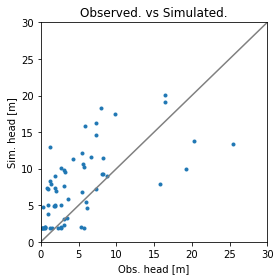

Error is - 8.533006756082502
Params are - [   6.91356176 9853.62582484    3.87321107    0.42334964    0.35872501
    1.19331486]


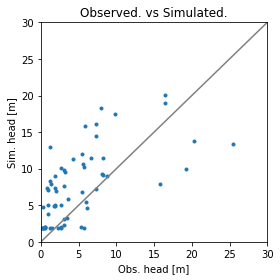

Error is - 8.533008222675182
Params are - [    6.93403525 10284.93489417     3.83237985     0.4272277
     0.35929454     1.17859484]


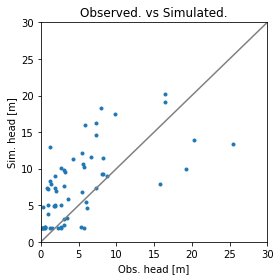

Error is - 8.53300163305228
Params are - [    6.92177796 11122.76098117     3.84258586     0.42291492
     0.35839627     1.18430583]


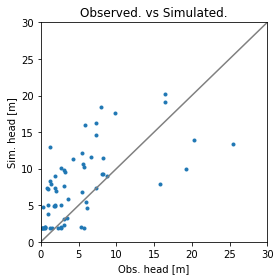

Error is - 8.53301500687195
Params are - [    6.92250728 12199.4345572      3.84480544     0.42024097
     0.35799443     1.18160337]


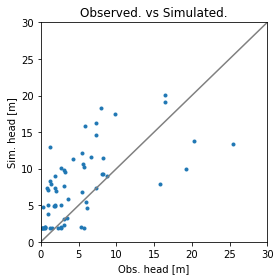

Error is - 8.532989441313173
Params are - [    6.92087153 10987.41635096     3.83832153     0.42709567
     0.35849877     1.18557824]


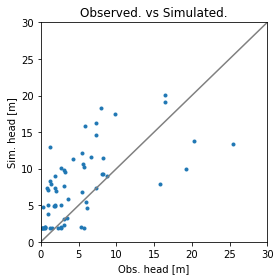

Error is - 8.532983422512332
Params are - [    6.92062541 11676.49498154     3.83625492     0.42874836
     0.35828708     1.18466476]


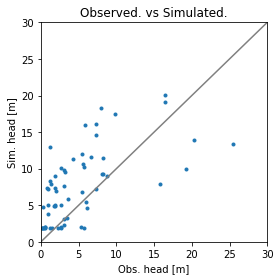

Error is - 8.533001362749264
Params are - [    6.88620186 11665.26797296     3.89633541     0.42239
     0.35905984     1.18908193]


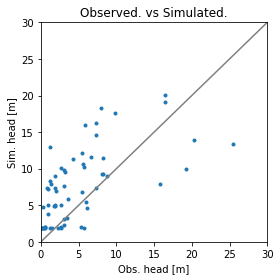

Error is - 8.533012354361981
Params are - [    6.88340359 11458.12345128     3.88266845     0.42210879
     0.35802966     1.19807511]


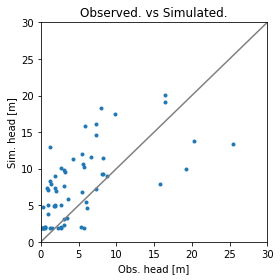

Error is - 8.53299785957353
Params are - [    6.92137734 10578.23203345     3.844952       0.42594797
     0.35897832     1.18346491]


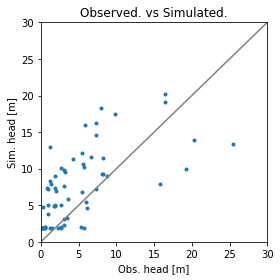

Error is - 8.532988176591509
Params are - [    6.90648228 12130.96792348     3.83241754     0.42685297
     0.35868363     1.18007177]


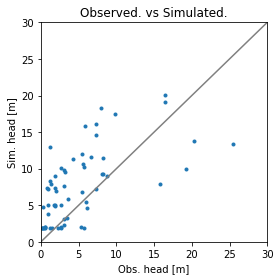

Error is - 8.532989101300872
Params are - [    6.93269242 12766.39107687     3.80710428     0.42536547
     0.35901676     1.190327  ]


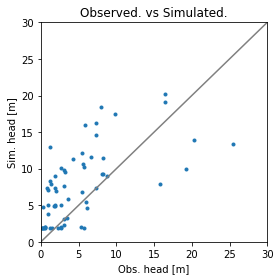

Error is - 8.532987030722069
Params are - [    6.91170382 12348.74036511     3.87179        0.42547443
     0.35843438     1.17430893]


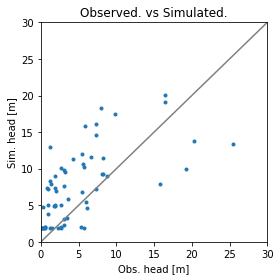

Error is - 8.532979620820424
Params are - [    6.90458309 12599.27046997     3.85369886     0.42867814
     0.35909039     1.18300061]


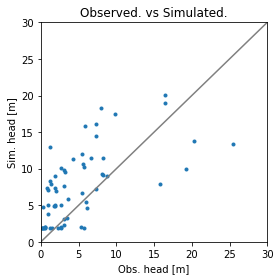

Error is - 8.532982135469869
Params are - [    6.89598565 13337.52521436     3.85925535     0.43155976
     0.35943745     1.182348  ]


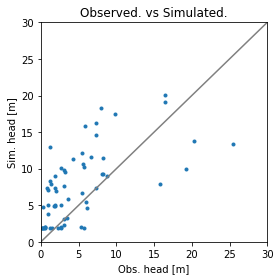

Error is - 8.53298988550821
Params are - [    6.94628625 12368.09764385     3.78573712     0.43129912
     0.35843702     1.1761974 ]


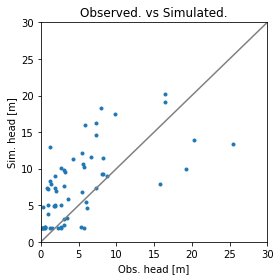

Error is - 8.532973579641252
Params are - [    6.91941375 14051.75545349     3.81738224     0.42952486
     0.35833809     1.17939192]


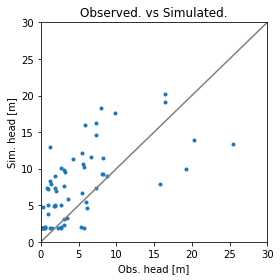

Error is - 8.532973999488306
Params are - [    6.91843196 15788.51716351     3.80359736     0.4313133
     0.35801798     1.17735542]


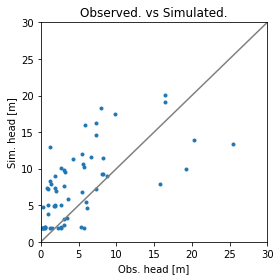

Error is - 8.532988174547604
Params are - [    6.88554734 12823.10911298     3.88714549     0.42358229
     0.35884643     1.18772427]


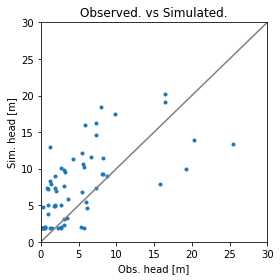

Error is - 8.532987009041703
Params are - [    6.88342614 12443.72169198     3.89245873     0.42892154
     0.35820991     1.17272708]


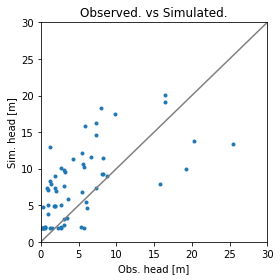

Error is - 8.532972193503916
Params are - [    6.9019509  13183.39610154     3.88715921     0.42812357
     0.35838513     1.18053409]


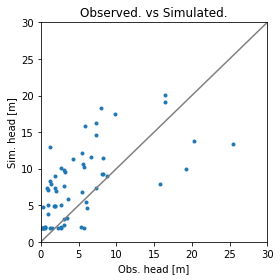

Error is - 8.532971506249474
Params are - [    6.89968521 13709.61019057     3.91453005     0.42875888
     0.35823588     1.18076525]


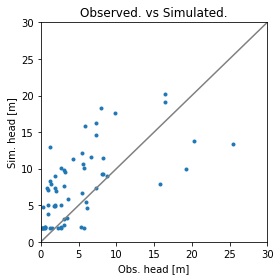

Error is - 8.53298748623425
Params are - [    6.92759847 12786.75527124     3.84155944     0.43311978
     0.35801882     1.17056192]


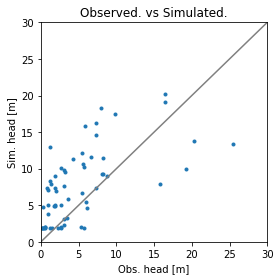

Error is - 8.532978305206484
Params are - [    6.91708568 12795.84373168     3.85295595     0.43073541
     0.35822572     1.17485251]


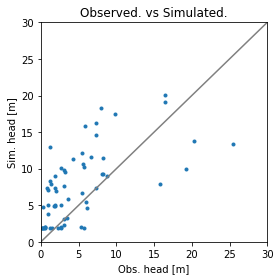

Error is - 8.532970443879904
Params are - [    6.90323594 13410.15847463     3.85063692     0.4329813
     0.35836131     1.18415844]


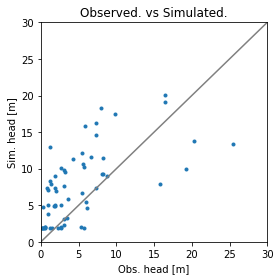

Error is - 8.5329757853169
Params are - [    6.899002   13940.86752939     3.84006038     0.43673474
     0.35832478     1.1890832 ]


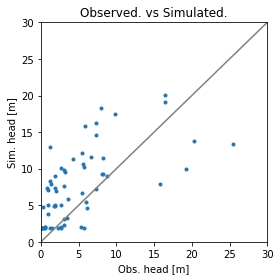

Error is - 8.532974515988942
Params are - [    6.93811689 13637.32274197     3.81602758     0.43088744
     0.35863625     1.18955075]


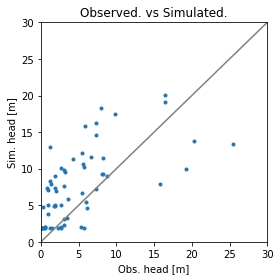

Error is - 8.532961881513694
Params are - [    6.90674811 15058.15870589     3.86548894     0.43177365
     0.35867548     1.17924173]


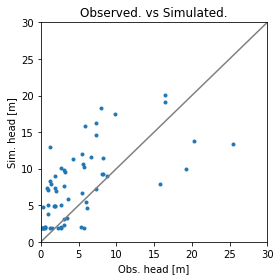

Error is - 8.532959066141236
Params are - [    6.89980947 16748.99056807     3.88010595     0.43328629
     0.35886967     1.17653021]


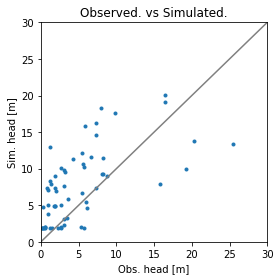

Error is - 8.53297160241187
Params are - [    6.92119923 15518.62325017     3.85684737     0.43337991
     0.35779859     1.17874908]


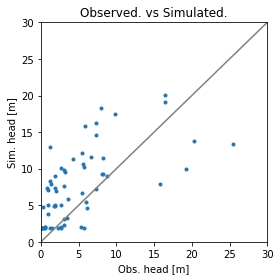

Error is - 8.532956173884742
Params are - [    6.91006781 16229.64316129     3.85888742     0.43220415
     0.35852088     1.18819604]


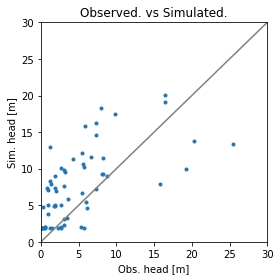

Error is - 8.532953950166627
Params are - [    6.90655887 17946.5428761      3.86185315     0.43293852
     0.35866846     1.19486781]


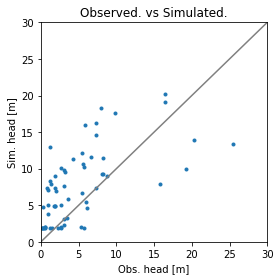

Error is - 8.532962251993615
Params are - [    6.87851727 16824.57086237     3.91109098     0.43273581
     0.35812109     1.17527016]


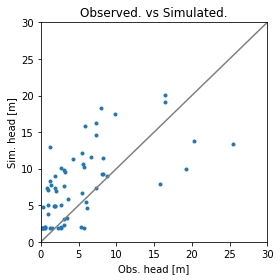

Error is - 8.532965494588428
Params are - [    6.88358824 17334.40995381     3.94097257     0.43516872
     0.35834691     1.18405507]


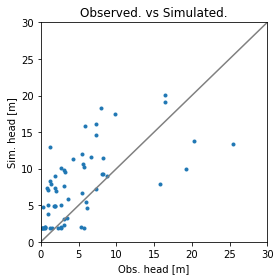

Error is - 8.532962364711466
Params are - [    6.86926577 16472.80439168     3.92954917     0.43190993
     0.35906919     1.18646657]


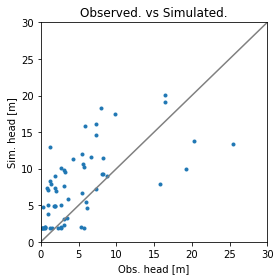

Error is - 8.532959035960786
Params are - [    6.88063998 19202.88218498     3.87687286     0.43758131
     0.35890966     1.18635083]


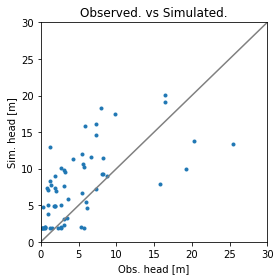

Error is - 8.532956172026893
Params are - [    6.86955727 21433.24180437     3.94951131     0.43489223
     0.35896701     1.18368844]


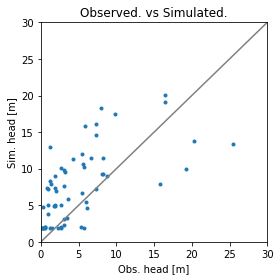

Error is - 8.532954825661433
Params are - [    6.88452796 18875.26760871     3.8620219      0.43261265
     0.35918812     1.1836696 ]


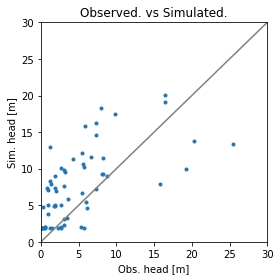

Error is - 8.532949993462553
Params are - [    6.90393783 20537.69424319     3.85093622     0.43610568
     0.35850548     1.18032579]


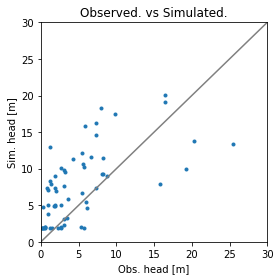

Error is - 8.532958514955718
Params are - [    6.92127386 22570.13916895     3.81162975     0.43820355
     0.35822363     1.1772554 ]


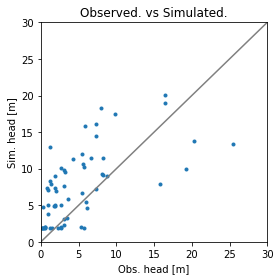

Error is - 8.532973586998715
Params are - [    6.90315986 21423.63556611     3.84934282     0.43640308
     0.35958171     1.1932074 ]


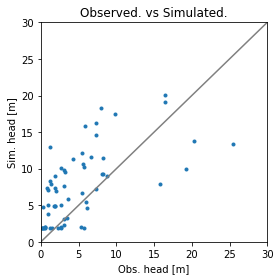

Error is - 8.532952201392172
Params are - [    6.88467792 17974.3370383      3.89565394     0.43365263
     0.35848624     1.17975447]


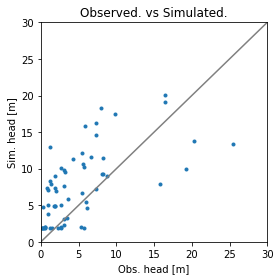

Error is - 8.532947770202867
Params are - [    6.87682381 21907.66468382     3.88551051     0.43597472
     0.35870532     1.19302211]


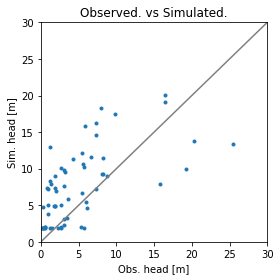

Error is - 8.532952417186722
Params are - [    6.86533098 24487.00174169     3.88821279     0.43731893
     0.35862314     1.20126806]


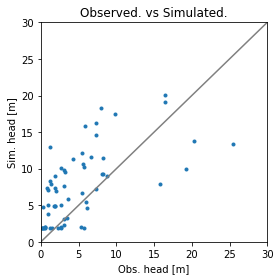

Error is - 8.532942216971005
Params are - [    6.89472124 20355.36723318     3.89162281     0.43114416
     0.35859722     1.18542524]


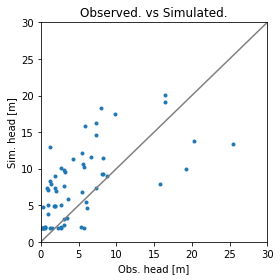

Error is - 8.532942483022454
Params are - [    6.90176188 20931.60975728     3.89899779     0.42792558
     0.358441       1.18496245]


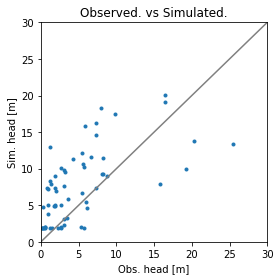

Error is - 8.532959500242995
Params are - [    6.91419195 17765.71609006     3.7996882      0.43258389
     0.3584166      1.18866657]


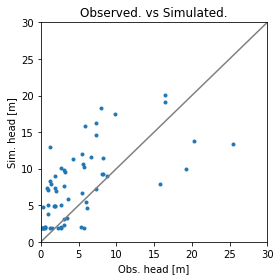

Error is - 8.532948570319675
Params are - [    6.88071594 20516.36037579     3.91205553     0.43431514
     0.35882941     1.18493297]


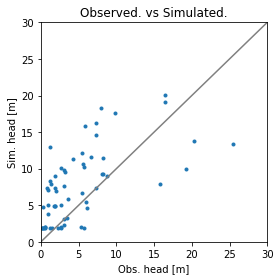

Error is - 8.532953709484882
Params are - [    6.89795057 20870.72120808     3.90385548     0.43543097
     0.35807592     1.18910653]


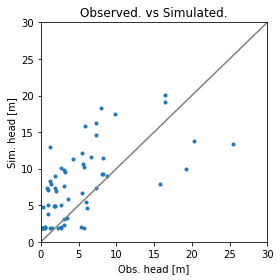

Error is - 8.532948107302264
Params are - [    6.87305023 22774.17205136     3.91802502     0.43593591
     0.35839807     1.17598789]


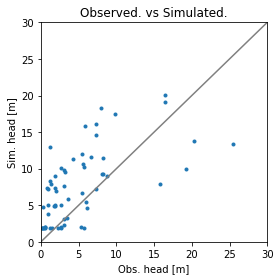

Error is - 8.5329517933915
Params are - [    6.87335842 20484.4773338      3.88074586     0.43361178
     0.35909799     1.1773763 ]


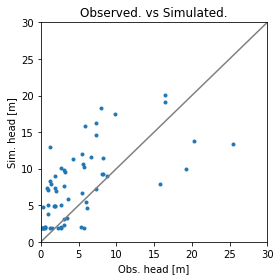

Error is - 8.532941658209472
Params are - [    6.88285791 24217.57493541     3.88397804     0.4353765
     0.35889159     1.18593563]


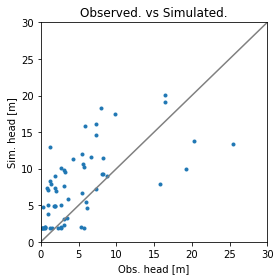

Error is - 8.532942782383689
Params are - [    6.8819479  27339.19388397     3.8781401      0.43623843
     0.35909426     1.18902621]


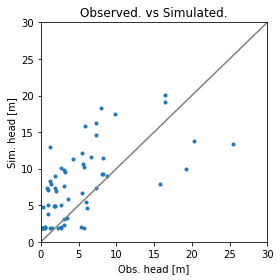

Error is - 8.532949973243323
Params are - [    6.8973439  22951.80050712     3.89996352     0.43600559
     0.35821104     1.19116691]


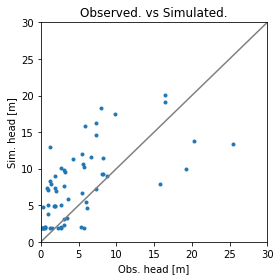

Error is - 8.532945194764658
Params are - [    6.86456651 23703.2856857      3.94611559     0.43347833
     0.3587054      1.19183113]


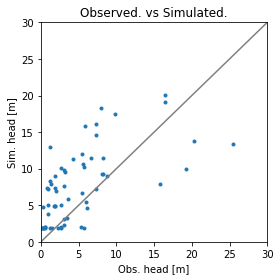

Error is - 8.532950132190237
Params are - [    6.86023464 21539.6744813      3.91247232     0.432736
     0.35916463     1.18121141]


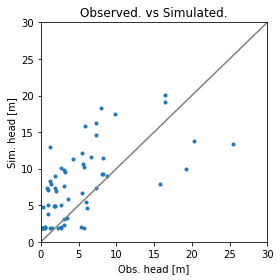

Error is - 8.532944593010939
Params are - [    6.88806659 22598.76900066     3.90309072     0.43518819
     0.35844943     1.18867804]


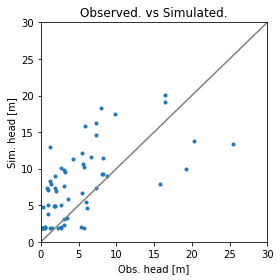

Error is - 8.532938030387097
Params are - [    6.87931282 24669.25082092     3.89739203     0.43471746
     0.3584196      1.18869371]


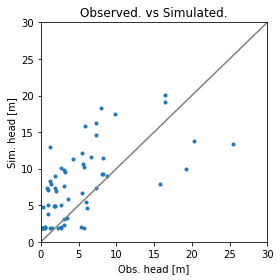

Error is - 8.532936471988888
Params are - [    6.87861127 26745.69604348     3.89006028     0.43491862
     0.3582147      1.19057407]


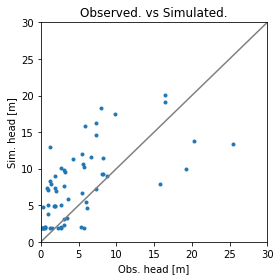

Error is - 8.532944928771265
Params are - [    6.88883221 23735.28047606     3.88210097     0.43275759
     0.35878981     1.20250085]


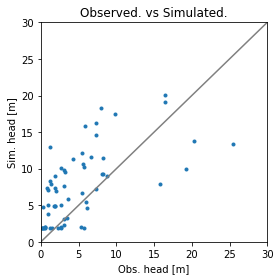

Error is - 8.532934626366835
Params are - [    6.88906143 25210.99310768     3.91347896     0.43164641
     0.35851073     1.18862621]


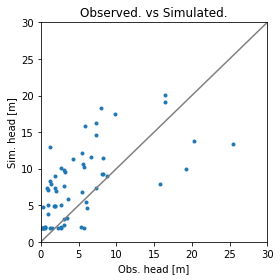

Error is - 8.532934167265118
Params are - [    6.89518025 26862.65731961     3.92746319     0.42948226
     0.35841344     1.18642826]


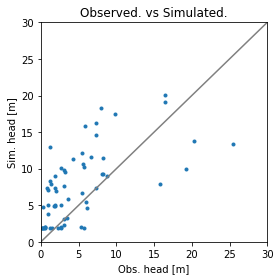

Error is - 8.532936082910693
Params are - [    6.91152331 24468.49598377     3.84665642     0.43281078
     0.35841333     1.18801624]


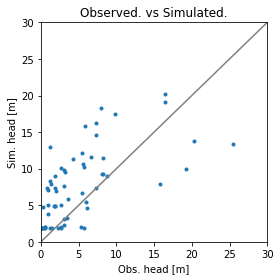

Error is - 8.532943009578583
Params are - [    6.89482131 24680.90636265     3.89885619     0.43354924
     0.35820342     1.17251831]


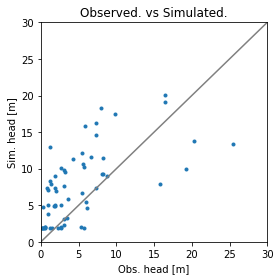

Error is - 8.532931001534415
Params are - [    6.89783851 26511.46362537     3.87645493     0.43057233
     0.35846179     1.18095455]


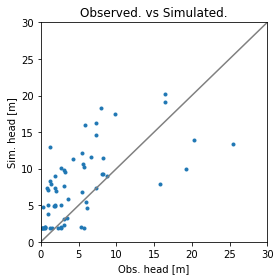

Error is - 8.532933126972212
Params are - [    6.90272447 28467.81093772     3.86313703     0.4282644
     0.35846797     1.1770928 ]


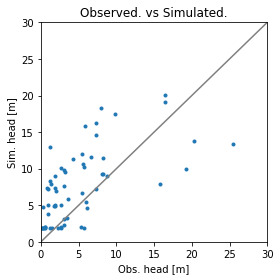

Error is - 8.53293846197339
Params are - [    6.89208952 25039.51201763     3.87322237     0.43121897
     0.35879393     1.19992635]


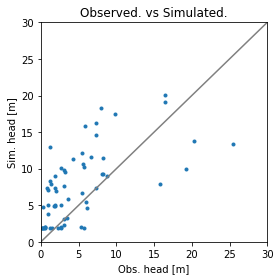

Error is - 8.532927451543253
Params are - [    6.89131234 30926.43274191     3.87432226     0.43364899
     0.35846571     1.19185312]


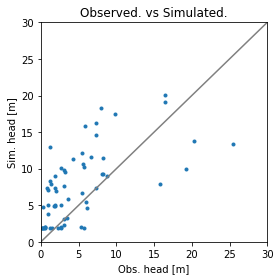

Error is - 8.532926230182534
Params are - [    6.88960789 36211.96549627     3.86567199     0.43490141
     0.35839995     1.19506707]


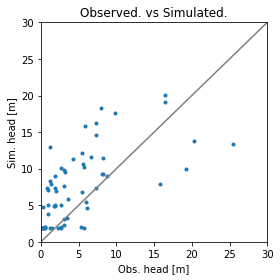

Error is - 8.532928669851833
Params are - [    6.90542568 31062.35522663     3.87586501     0.42925829
     0.35800746     1.19438655]


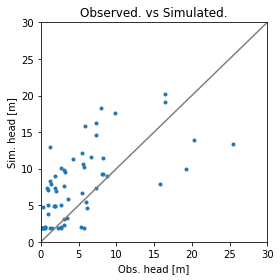

Error is - 8.532934134102701
Params are - [    6.90063945 32248.03254741     3.88750157     0.43276225
     0.35784296     1.17854923]


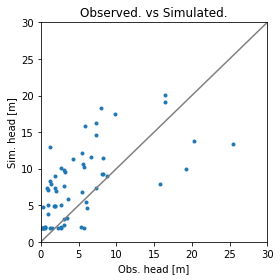

Error is - 8.53292595733467
Params are - [    6.92146043 32375.96068954     3.86981075     0.42834382
     0.35829828     1.18389322]


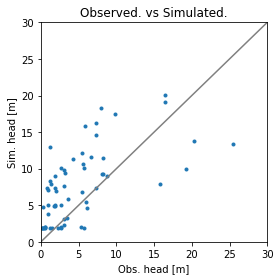

Error is - 8.532933279795325
Params are - [    6.942885   35191.09301257     3.85968599     0.42505643
     0.35834007     1.1805528 ]


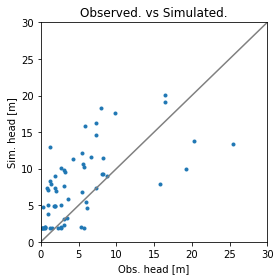

Error is - 8.532924646127602
Params are - [    6.89186075 37288.98231785     3.92093273     0.42896268
     0.3580613      1.18507672]


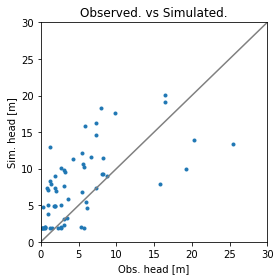

Error is - 8.532932149525616
Params are - [    6.88202947 43699.22548488     3.95807089     0.42703862
     0.35788528     1.18360697]


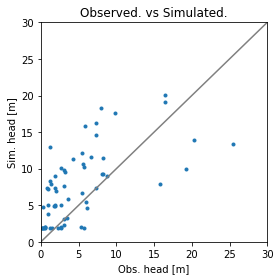

Error is - 8.532925982932772
Params are - [    6.90709732 38370.26264808     3.83794914     0.432118
     0.35794381     1.18621418]


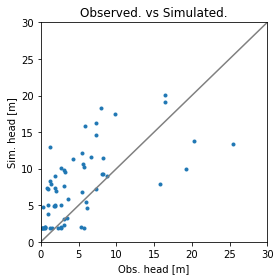

Error is - 8.532922871616604
Params are - [    6.90379074 35025.63078716     3.86139328     0.42862325
     0.35854791     1.1966482 ]


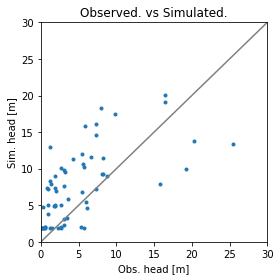

Error is - 8.532933953246255
Params are - [    6.90536639 36414.42990704     3.84833914     0.42655375
     0.35890038     1.20569769]


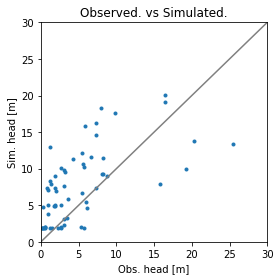

Error is - 8.53292183612655
Params are - [    6.90857576 43600.25542981     3.86741937     0.43016349
     0.35795777     1.1994741 ]


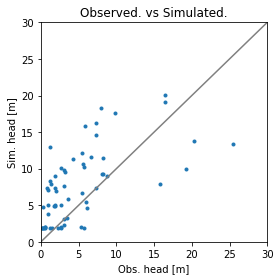

Error is - 8.532929878982031
Params are - [    6.91394439 52144.65133203     3.8629016      0.42995907
     0.35770576     1.20873388]


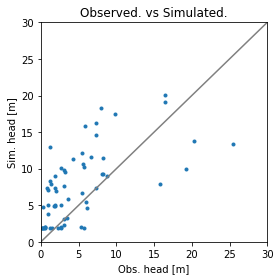

Error is - 8.53291511195367
Params are - [    6.90203862 43228.66389627     3.86519407     0.43177926
     0.35839555     1.18773795]


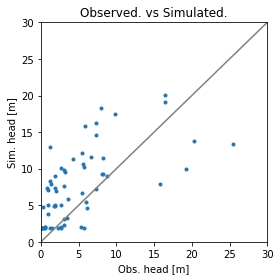

Error is - 8.532913401048493
Params are - [    6.9003451  49311.8182311      3.8598586      0.43303974
     0.35858959     1.18441365]


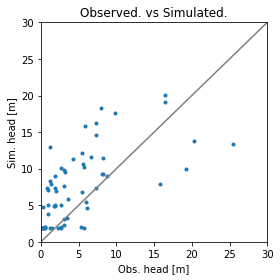

Error is - 8.532924891217647
Params are - [    6.92143548 42445.67120491     3.8734493      0.42551559
     0.35806627     1.18350629]


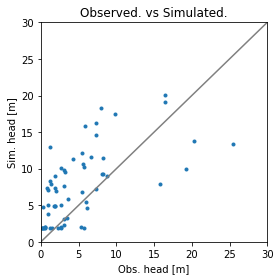

Error is - 8.532922661675446
Params are - [    6.90872543 41645.84357204     3.91300555     0.42609819
     0.35856323     1.19145655]


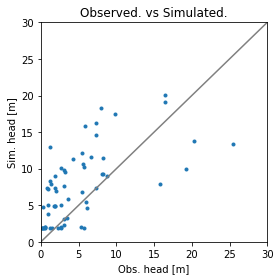

Error is - 8.532913471059695
Params are - [    6.89011733 50730.10649141     3.89554219     0.42912382
     0.35829707     1.19629862]


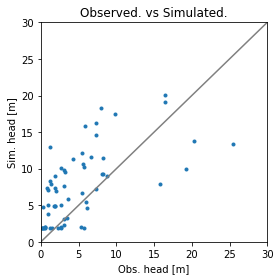

Error is - 8.532922983295931
Params are - [    6.8797029  43421.87440488     3.89926794     0.43315481
     0.35860602     1.20094965]


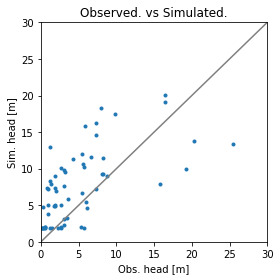

Error is - 8.532922453224613
Params are - [    6.905225   50622.86065429     3.84456292     0.43110509
     0.35879257     1.2046702 ]


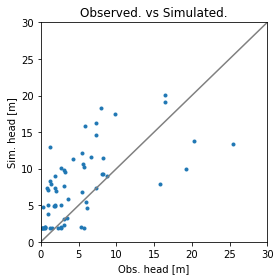

Error is - 8.532918220174457
Params are - [    6.92589023 46890.29731705     3.8479927      0.42622972
     0.35831002     1.19003745]


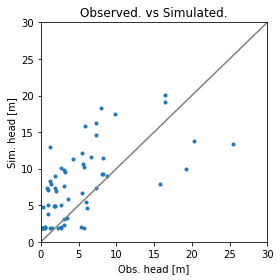

Error is - 8.53290967894755
Params are - [    6.90916887 59241.42977807     3.8814005      0.42996343
     0.35828885     1.19213532]


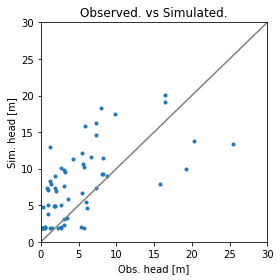

Error is - 8.53290943547351
Params are - [    6.91185794 71349.32927353     3.8914041      0.43063353
     0.35815932     1.18987888]


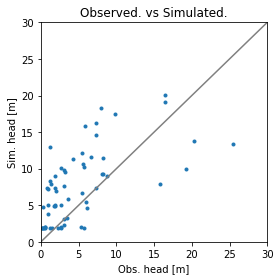

Error is - 8.532918107569593
Params are - [    6.90527835 62522.37889369     3.82258775     0.43400027
     0.35813888     1.19680109]


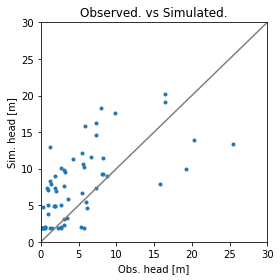

Error is - 8.532921297289972
Params are - [    6.90879657 57511.86789124     3.88370533     0.42995843
     0.35769165     1.18096439]


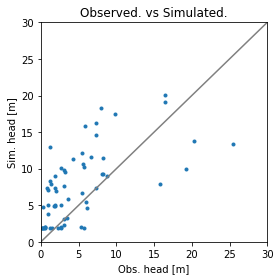

Error is - 8.532906647830803
Params are - [    6.90551941 69171.67726953     3.86627752     0.43083169
     0.35843774     1.17999059]


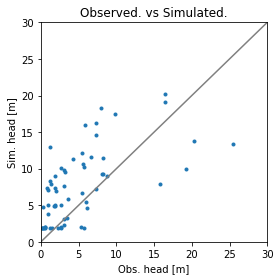

Error is - 8.532910599237384
Params are - [    6.90399123 81957.38818939     3.86570659     0.43116579
     0.35867772     1.17024884]


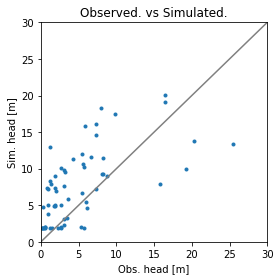

Error is - 8.532916435417187
Params are - [    6.90420622 59146.6679342      3.8441823      0.43132783
     0.35895255     1.1981757 ]


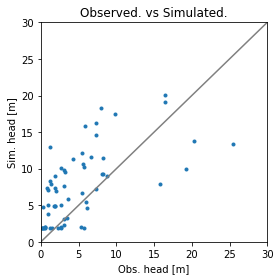

Error is - 8.53291467818653
Params are - [    6.87988456 73853.69538076     3.87862479     0.4367559
     0.35854836     1.19181539]


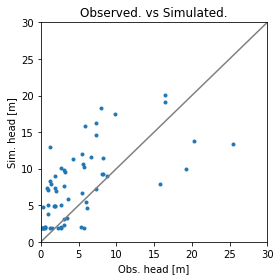

Error is - 8.532912754986441
Params are - [    6.89203183 61998.71929982     3.92270875     0.4299039
     0.35885599     1.18338986]


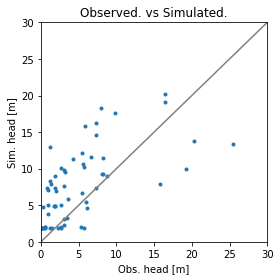

Error is - 8.532917639196588
Params are - [    6.88904584 66325.11404785     3.92728969     0.4321017
     0.35801014     1.17708663]


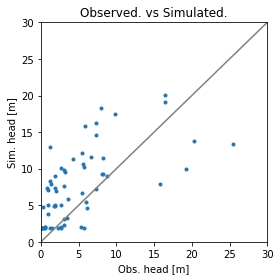

Error is - 8.532909447433578
Params are - [    6.90041612 60941.27946261     3.86495914     0.43152129
     0.35871695     1.19290343]


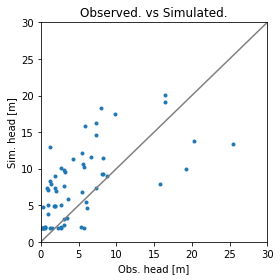

Error is - 8.532920564113248
Params are - [    6.92021135 47313.9479619      3.88829198     0.42492875
     0.35847053     1.18380962]


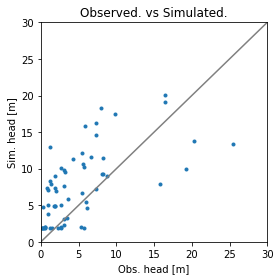

Error is - 8.532908659669259
Params are - [    6.88996626 67218.75852605     3.88104159     0.43379911
     0.3585289      1.18981395]


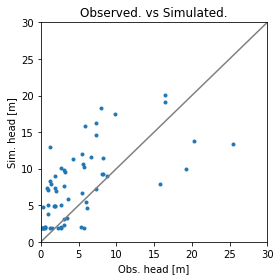

Error is - 8.532912206966905
Params are - [    6.90992822 75933.75419613     3.86654104     0.43411926
     0.35879909     1.17716484]


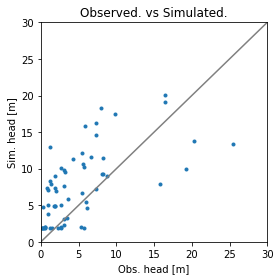

Error is - 8.532905252327874
Params are - [    6.90289483 86226.02111146     3.90445211     0.43056318
     0.35857641     1.18663353]


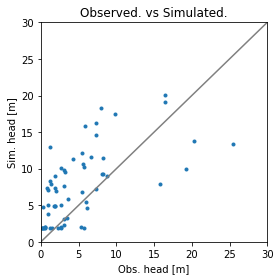

Error is - 8.532908023934668
Params are - [     6.90416969 104683.12255164      3.92674887      0.4293249
      0.35856982      1.18774348]


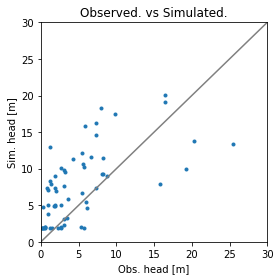

Error is - 8.53290927849766
Params are - [    6.9148291  81614.88731328     3.83551642     0.43391879
     0.35821681     1.18873855]


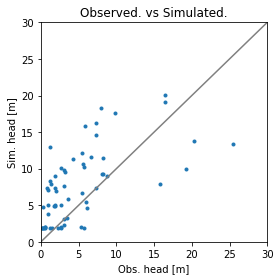

Error is - 8.532910235341156
Params are - [    6.89856633 69573.56345602     3.88134259     0.4296366
     0.35807962     1.19882148]


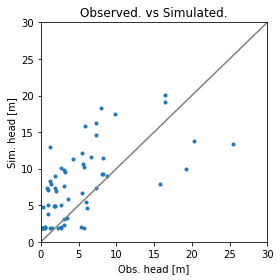

Error is - 8.532906324160777
Params are - [    6.9014068  71163.61114105     3.8776422      0.43075727
     0.35825949     1.19340732]


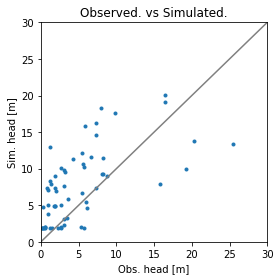

Error is - 8.532908382627598
Params are - [    6.90840865 87973.48208235     3.88715217     0.4319799
     0.35800927     1.18325084]


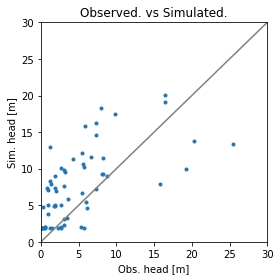

Error is - 8.532904817196481
Params are - [    6.89581707 83106.81654105     3.8592899      0.43331646
     0.35851689     1.18406604]


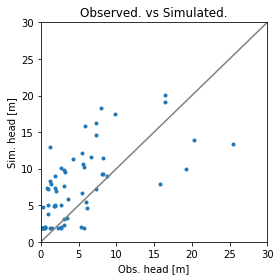

Error is - 8.532909458972075
Params are - [    6.88779664 88985.5601748      3.84323279     0.43465792
     0.35869568     1.18115963]


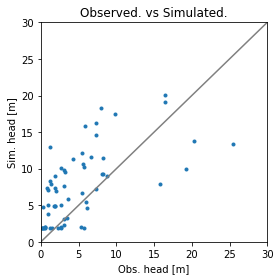

Error is - 8.532907215866386
Params are - [    6.88650858 73338.56824388     3.92310208     0.42983041
     0.35855942     1.18364888]


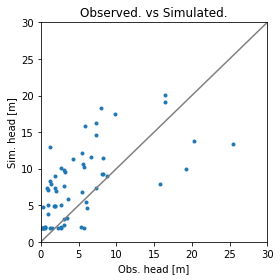

Error is - 8.532905766305783
Params are - [    6.91021886 89774.63360372     3.89159707     0.42862719
     0.3582575      1.18051845]


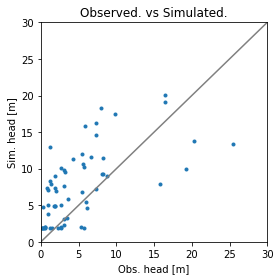

Error is - 8.532906804185883
Params are - [    6.89237986 69620.29388788     3.88696812     0.42932883
     0.35885988     1.18617076]


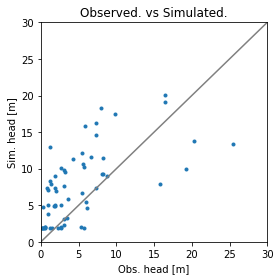

Error is - 8.532904774913357
Params are - [    6.91623703 83015.78294101     3.83897356     0.43131113
     0.35840988     1.18661336]


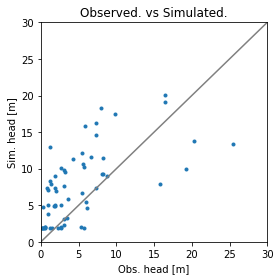

Error is - 8.532911481083453
Params are - [    6.93110126 87854.39028958     3.79690931     0.43205149
     0.35833511     1.1880956 ]


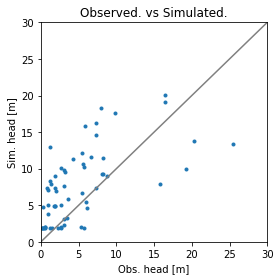

Error is - 8.532908996436749
Params are - [    6.91831814 91199.22031473     3.85910933     0.43247347
     0.35795942     1.184239  ]


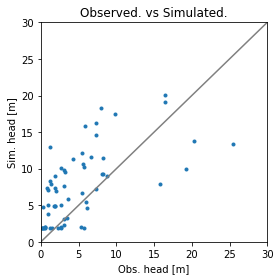

Error is - 8.532903817546282
Params are - [    6.89886443 75015.02549459     3.88000342     0.43011499
     0.35863477     1.18568782]


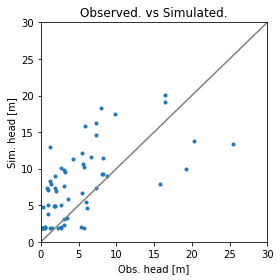

Error is - 8.53290236377415
Params are - [    6.90296026 93595.61967476     3.88437524     0.43073172
     0.35844724     1.19231825]


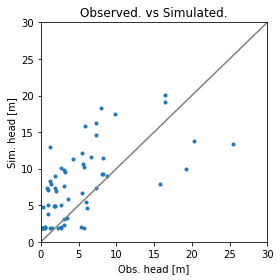

Error is - 8.532904851596298
Params are - [     6.90168069 105807.59087738      3.8934241       0.43068173
      0.35845199      1.19848208]


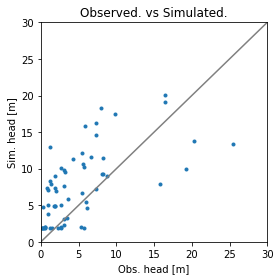

Error is - 8.532903057655066
Params are - [    6.90759069 99081.02198115     3.8752549      0.43079762
     0.35868808     1.17853851]


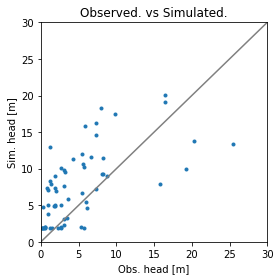

Error is - 8.532907875398552
Params are - [    6.89790258 83572.12897762     3.85585264     0.43365118
     0.35883358     1.19076739]


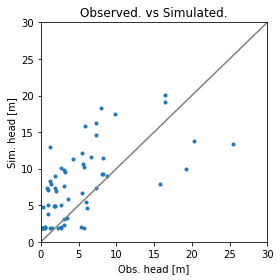

Error is - 8.532902898941972
Params are - [    6.90713979 88224.0074472      3.88266096     0.42988318
     0.35840152     1.18308069]


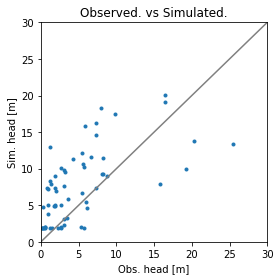

Error is - 8.532905061918347
Params are - [    6.9066416  87786.73691513     3.83573388     0.43148852
     0.35845638     1.18346802]


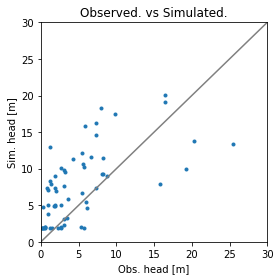

Error is - 8.53290288761334
Params are - [    6.90570491 87396.55796421     3.85291344     0.43125718
     0.35848639     1.1842594 ]


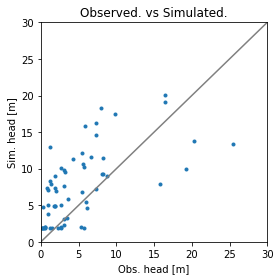

Error is - 8.532903655951461
Params are - [    6.9170153  92335.85529326     3.87877061     0.42804882
     0.35850573     1.18609997]


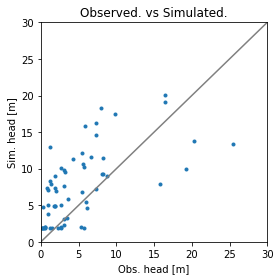

Error is - 8.53290372926269
Params are - [    6.89685476 95533.57967738     3.91235263     0.42896671
     0.3586447      1.18338152]


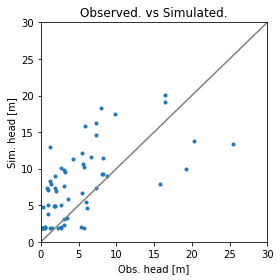

Error is - 8.532901345759688
Params are - [     6.91355748 110373.85518473      3.88210584      0.42978009
      0.35842312      1.18353829]


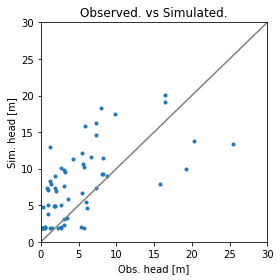

Error is - 8.532902728578831
Params are - [     6.920904   128053.2700298       3.88315704      0.42961263
      0.3583173       1.18246352]


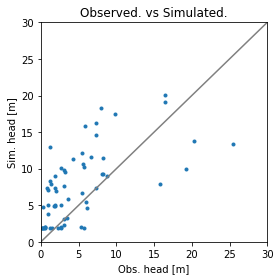

Error is - 8.532903736760073
Params are - [    6.92113471 94802.05950439     3.83967437     0.43119949
     0.35833933     1.18589685]


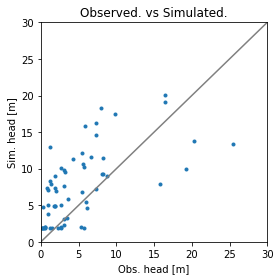

Error is - 8.53290209422496
Params are - [    6.90292475 95350.69963413     3.89418307     0.42952491
     0.35856836     1.18401035]


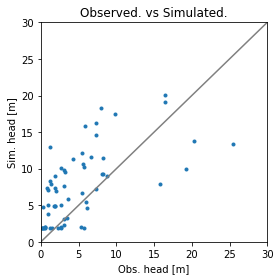

Error is - 8.532901891023906
Params are - [    6.89627733 99004.73200213     3.87839387     0.43260941
     0.35849917     1.18248186]


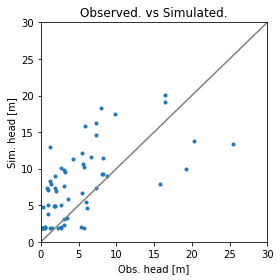

Error is - 8.532902587825486
Params are - [    6.90193081 92234.13532124     3.8829559      0.43046454
     0.35825386     1.19135777]


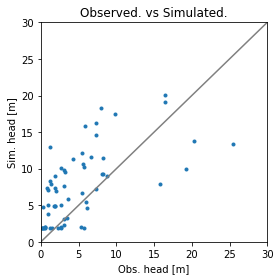

Error is - 8.532900337742245
Params are - [     6.90064539 104427.85914654      3.87564816      0.43157276
      0.35849118      1.18957462]


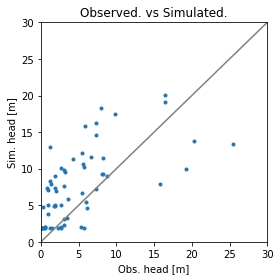

Error is - 8.532900990652056
Params are - [     6.89739819 112529.78499621      3.87214175      0.43241755
      0.35853601      1.19282159]


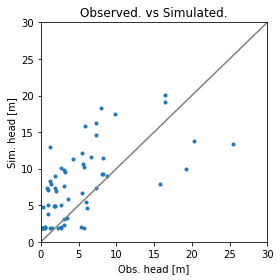

Error is - 8.532903466094732
Params are - [     6.90039377 110932.40902363      3.91297392      0.43030396
      0.35840792      1.19016765]


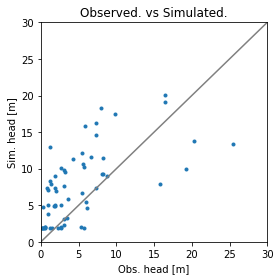

Error is - 8.53290117877116
Params are - [    6.90437712 93280.52072907     3.86792856     0.43101888
     0.35846677     1.18573646]


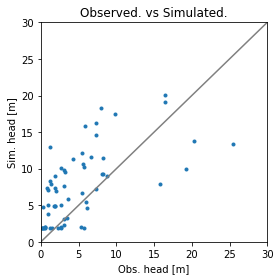

Error is - 8.532901620333122
Params are - [     6.9049833  106443.62680255      3.87792234      0.43128138
      0.35871142      1.18119551]


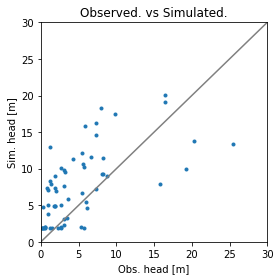

Error is - 8.532902431196723
Params are - [     6.90462819 109364.81149162      3.87435204      0.43119742
      0.3586061       1.17652745]


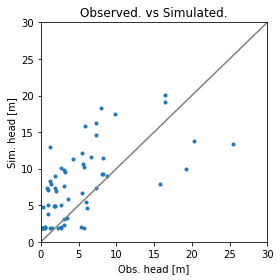

Error is - 8.532901051583478
Params are - [    6.90337725 97537.91762898     3.88186944     0.43084814
     0.35848695     1.18837055]


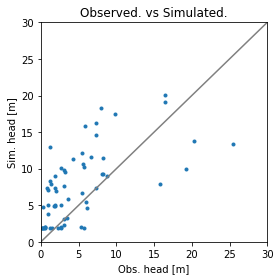

Error is - 8.532901376619044
Params are - [     6.90481454 108338.8041972       3.86043967      0.43284532
      0.35845785      1.18628875]


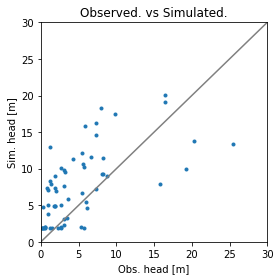

Error is - 8.53290076297769
Params are - [     6.9143077  107796.12922756      3.87024413      0.42983944
      0.35851327      1.1890862 ]


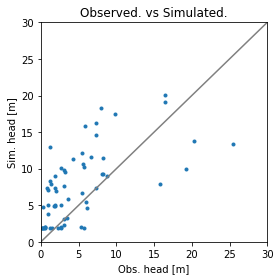

Error is - 8.532902218963175
Params are - [     6.90870986 100808.06856881      3.86815626      0.43068683
      0.35823496      1.19300278]


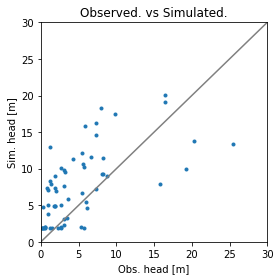

Error is - 8.532900670223594
Params are - [     6.90591494 105034.73724411      3.87548082      0.43113274
      0.35859231      1.18414732]


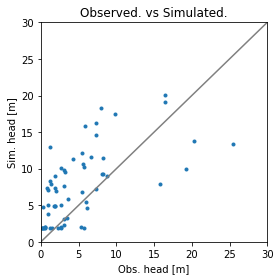

Error is - 8.532902273796875
Params are - [    6.90924542 97811.53552313     3.89065265     0.42855204
     0.35853335     1.18719574]


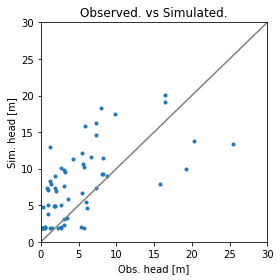

Error is - 8.532900512831992
Params are - [     6.90592226 105706.98702868      3.86799291      0.431772
      0.35847673      1.18651549]


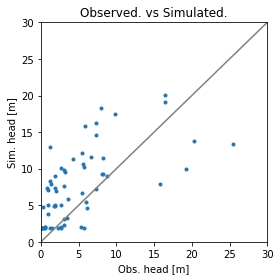

Error is - 8.53290239962419
Params are - [    6.89795741 94220.86181691     3.86428217     0.43228124
     0.35858595     1.1909386 ]


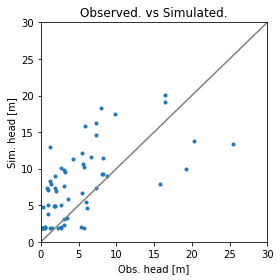

Error is - 8.532900451752363
Params are - [     6.90965746 106335.60684278      3.87764992      0.43040537
      0.35846383      1.18538836]


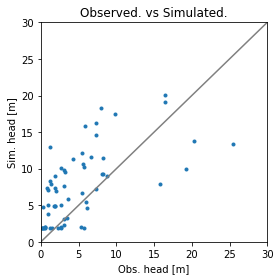

Error is - 8.532900547065605
Params are - [     6.90889787 115665.89164382      3.8816999       0.43083794
      0.35854132      1.18862439]


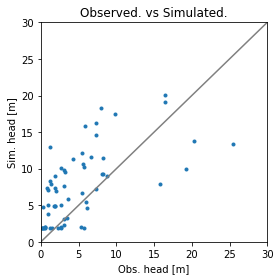

Error is - 8.532899727188767
Params are - [     6.91173796 117451.15274885      3.86770251      0.43100528
      0.35853926      1.18607491]


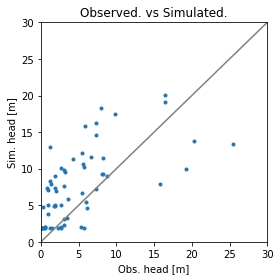

Error is - 8.532899853044238
Params are - [     6.91591832 127407.77030879      3.86061904      0.43108384
      0.35856541      1.18492709]


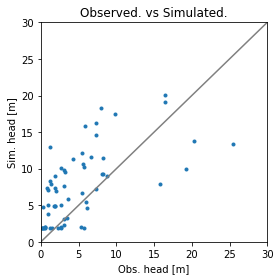

Error is - 8.532900611762873
Params are - [     6.89995093 110411.28232404      3.87848061      0.43240259
      0.35852161      1.18435551]


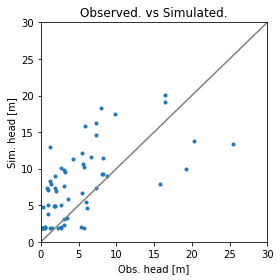

Error is - 8.53289996873504
Params are - [     6.90635569 114964.85600079      3.87424385      0.43153257
      0.358419        1.18936377]


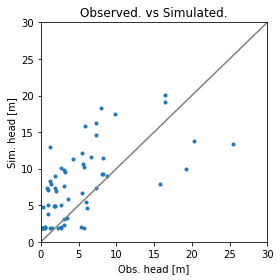

Error is - 8.532900622555895
Params are - [     6.91445461 111106.16881311      3.86983181      0.42997272
      0.3584555       1.19082501]


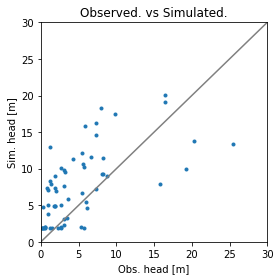

Error is - 8.532900033292176
Params are - [     6.90357685 110585.00394631      3.87631841      0.43179512
      0.35850508      1.18597288]


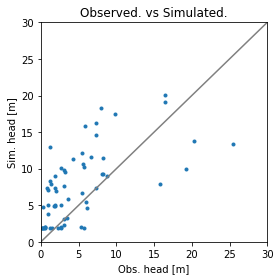

Error is - 8.53290054106881
Params are - [     6.90373399 104157.93026083      3.86481869      0.43185642
      0.35842371      1.18567229]


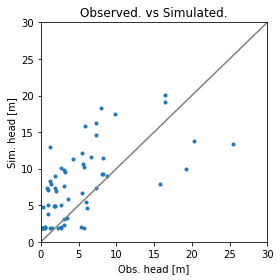

Error is - 8.532900071768937
Params are - [     6.90502496 107034.92060658      3.86903899      0.4316018
      0.35845311      1.18641032]


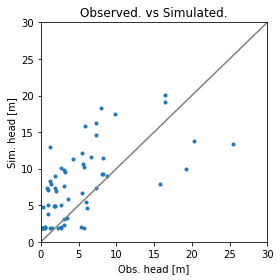

Error is - 8.53289971112379
Params are - [     6.90641051 114559.47940193      3.87887436      0.43086564
      0.35848043      1.18774613]


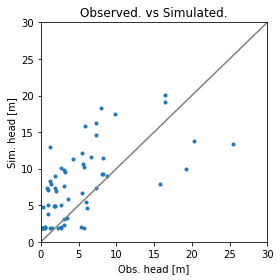

Error is - 8.53289956088515
Params are - [     6.90665464 118985.72558855      3.88431509      0.43041247
      0.35848227      1.18836145]


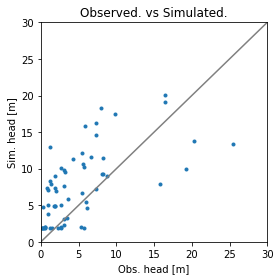

Error is - 8.532899939052033
Params are - [     6.90167437 118147.56583643      3.87143908      0.43223463
      0.35849947      1.18986429]


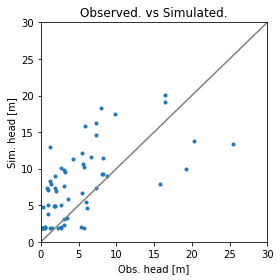

Error is - 8.532899512793211
Params are - [     6.91102943 124628.54909596      3.87203782      0.43128786
      0.35847488      1.18577458]


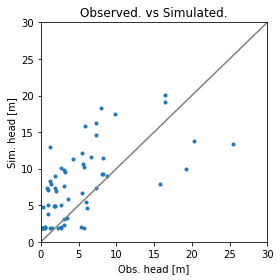

Error is - 8.532900040783264
Params are - [     6.91622145 134728.89407067      3.87023265      0.43114541
      0.35846673      1.18387456]


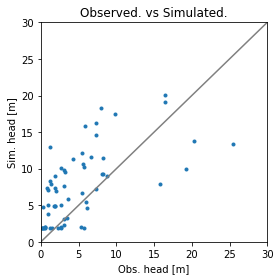

Error is - 8.532899718146686
Params are - [     6.90865135 127886.03046572      3.87964659      0.43115417
      0.35852021      1.18872698]


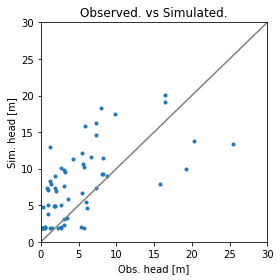

Error is - 8.532899351318514
Params are - [     6.91179096 130102.95596579      3.87347657      0.4307472
      0.35847329      1.19008244]


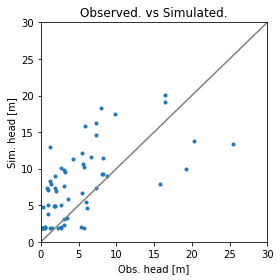

Error is - 8.532899992127238
Params are - [     6.91589801 139861.93197554      3.87205565      0.43022324
      0.35845739      1.19213722]


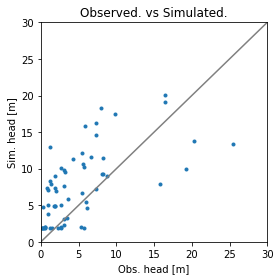

Error is - 8.532899079992026
Params are - [     6.91082388 130769.13723298      3.87529537      0.43074796
      0.35857746      1.18693111]


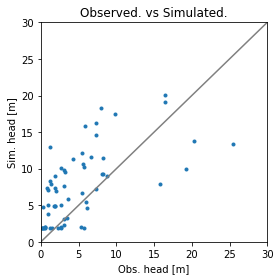

Error is - 8.532899286091634
Params are - [     6.91305798 138671.27784908      3.87582113      0.43035565
      0.35865669      1.18571478]


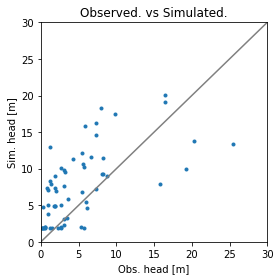

Error is - 8.532900724227831
Params are - [     6.91855504 131793.61786286      3.87938557      0.42955035
      0.35852298      1.18545287]


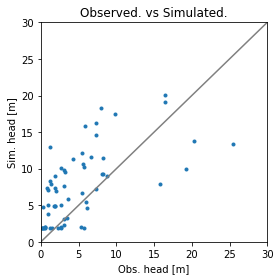

Error is - 8.532899415530272
Params are - [     6.90589454 121559.07884303      3.8734257       0.43156356
      0.35850535      1.18876143]


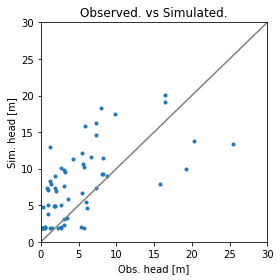

Error is - 8.532899318930603
Params are - [     6.90654364 133859.3396485       3.88502987      0.4309658
      0.3584719       1.19013775]


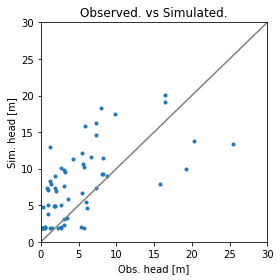

Error is - 8.532898867040355
Params are - [     6.90892768 125415.56499256      3.87488021      0.43075411
      0.35847484      1.18795595]


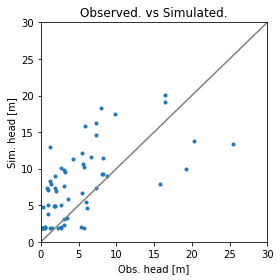

Error is - 8.532898637064068
Params are - [     6.90906585 124180.33225598      3.87249702      0.43055408
      0.35845215      1.18757043]


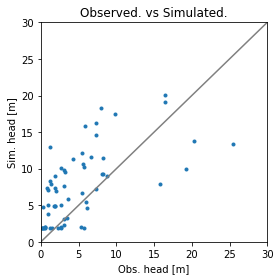

Error is - 8.532898988325632
Params are - [     6.91172813 136047.40542553      3.86627236      0.43154302
      0.35850273      1.1880578 ]


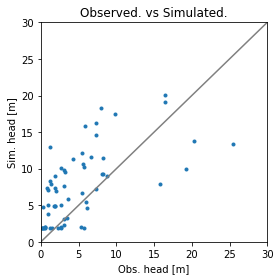

Error is - 8.5328989583003
Params are - [     6.90758624 134210.86736131      3.87662782      0.43075268
      0.35851941      1.19140574]


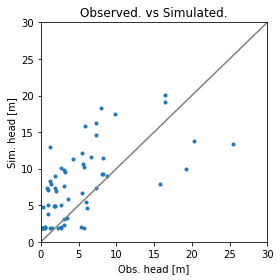

Error is - 8.532898797020257
Params are - [     6.91328503 141497.60045366      3.8763073       0.43020669
      0.35849363      1.18930033]


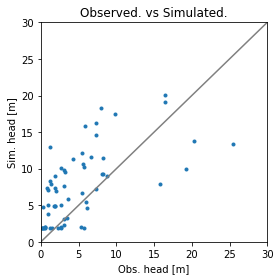

Error is - 8.532898343073645
Params are - [     6.90788663 136751.93816019      3.87720001      0.43084287
      0.35853248      1.18771862]


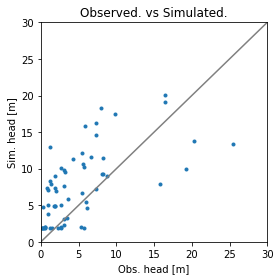

Error is - 8.532897927331991
Params are - [     6.90593447 140076.42925739      3.87906173      0.43089071
      0.35856207      1.1865367 ]


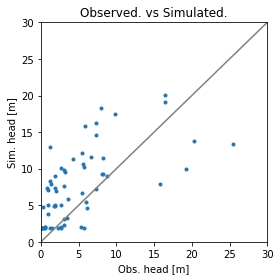

Error is - 8.532898417241885
Params are - [     6.91293089 135067.91768045      3.86365733      0.43059925
      0.35856392      1.18646296]


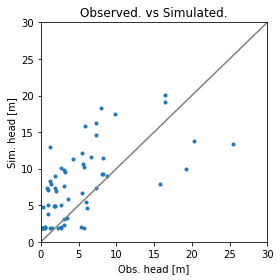

Error is - 8.532897870998983
Params are - [     6.90935298 139591.04691179      3.86951249      0.43076751
      0.35845385      1.18951354]


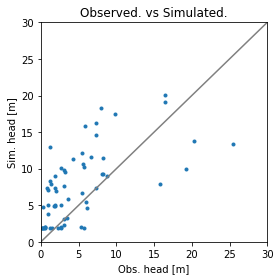

Error is - 8.53289786459173
Params are - [     6.90861753 144002.00175119      3.86662105      0.43077729
      0.35839204      1.19080476]


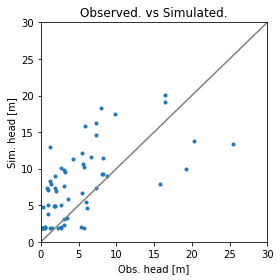

Error is - 8.532897890970819
Params are - [     6.90741187 136964.3108278       3.87865172      0.42971721
      0.35849168      1.1893025 ]


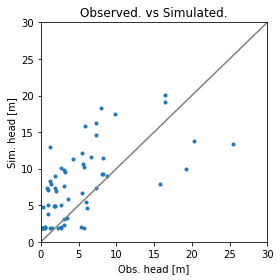

Error is - 8.53289790097606
Params are - [     6.91149564 139718.66338084      3.8689709       0.4301624
      0.35846575      1.18525349]


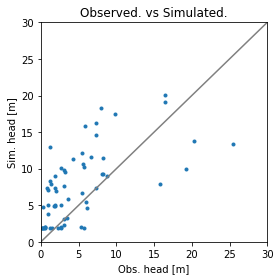

Error is - 8.532897649812131
Params are - [     6.90520039 131838.95126422      3.86684595      0.43069363
      0.35848224      1.18600995]


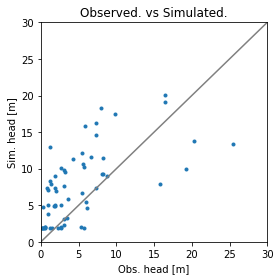

Error is - 8.532898465875919
Params are - [     6.90115807 127009.6266695       3.86211527      0.43093709
      0.35847655      1.18436476]


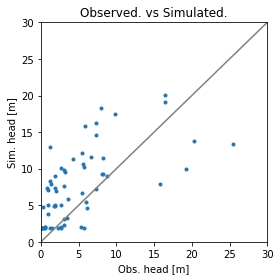

Error is - 8.532896751688387
Params are - [     6.90813108 151709.09246466      3.86877254      0.43039275
      0.35853375      1.18721969]


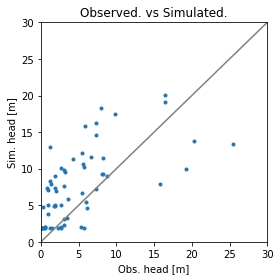

Error is - 8.532896126623374
Params are - [     6.9076637  165473.472569        3.8669103       0.43031208
      0.35857456      1.18704431]


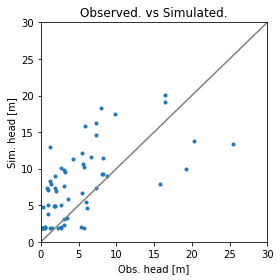

Error is - 8.532896518949837
Params are - [     6.90251031 150956.69200303      3.87869655      0.43025186
      0.35842552      1.18852095]


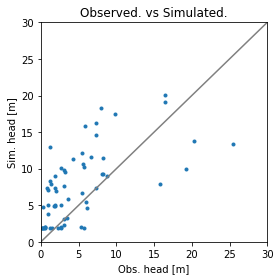

Error is - 8.532896962148541
Params are - [     6.90836535 149574.93467464      3.86317042      0.42974745
      0.35838186      1.18910862]


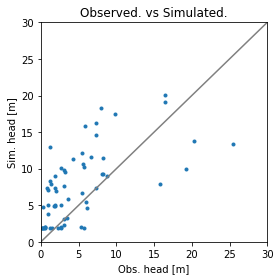

Error is - 8.532896701354582
Params are - [     6.90176074 153218.12431578      3.87132776      0.43033744
      0.35845022      1.19167688]


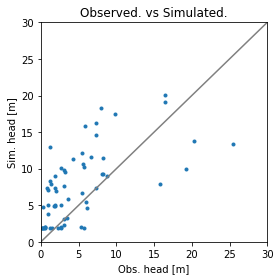

Error is - 8.532896598242584
Params are - [     6.9039608  161390.41469816      3.85920562      0.43098937
      0.35841047      1.18841932]


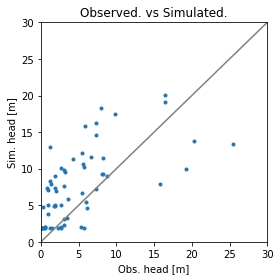

Error is - 8.53289609732813
Params are - [     6.90120289 160148.86142375      3.86876449      0.42999998
      0.35851625      1.18612192]


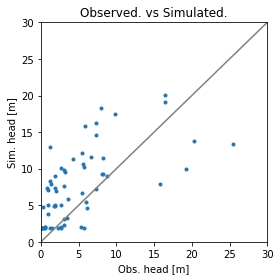

Error is - 8.532896499115475
Params are - [     6.89749557 168222.29126003      3.86983621      0.42961133
      0.35857835      1.1837805 ]


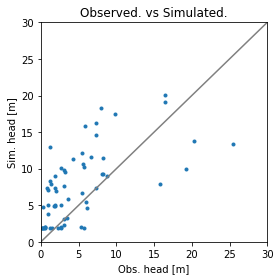

Error is - 8.532895523167115
Params are - [     6.90328754 181748.54863056      3.8691791       0.42985243
      0.35843738      1.19095405]


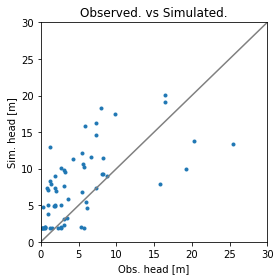

Error is - 8.532895421241566
Params are - [     6.90233111 206703.34731373      3.87034567      0.42943184
      0.35841495      1.1934261 ]


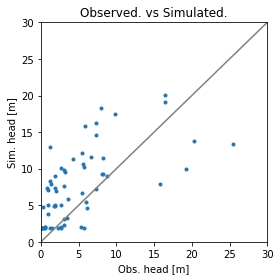

Error is - 8.532895180324704
Params are - [     6.89811117 183055.36943317      3.87524637      0.43069341
      0.35854879      1.18929454]


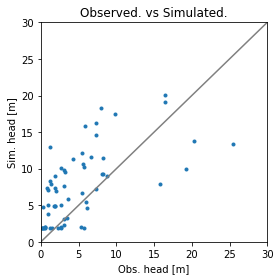

Error is - 8.532895057533917
Params are - [     6.89298408 199795.58681244      3.88128435      0.43116639
      0.35863226      1.1893875 ]


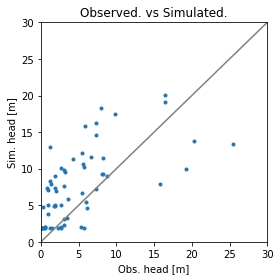

Error is - 8.532894725813165
Params are - [     6.90179022 194938.00062425      3.8704079       0.43037973
      0.35854112      1.18596315]


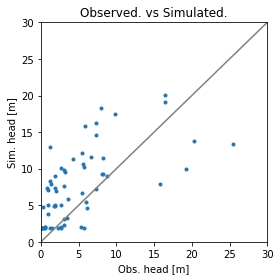

Error is - 8.532894671022259
Params are - [     6.90180497 215797.93877849      3.86994797      0.43040087
      0.35858657      1.18310629]


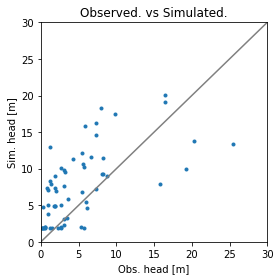

Error is - 8.532894844718015
Params are - [     6.89887155 204901.55160199      3.88611082      0.42953164
      0.35863957      1.1874497 ]


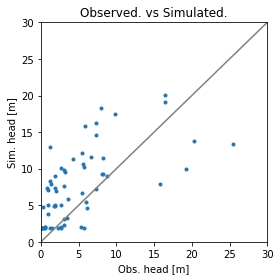

Error is - 8.532894341478384
Params are - [     6.89910912 233316.89416344      3.86909131      0.43002908
      0.35869586      1.18699099]


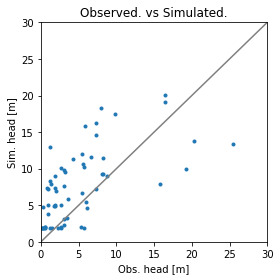

Error is - 8.532894993871817
Params are - [     6.89740853 274496.99524364      3.86428869      0.42991769
      0.35883102      1.18622601]


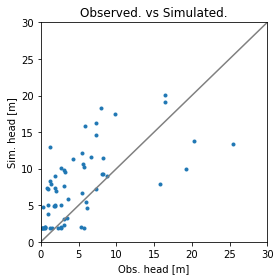

Error is - 8.532893871780395
Params are - [     6.89110421 241414.58746228      3.88160457      0.42987452
      0.35858726      1.18844986]


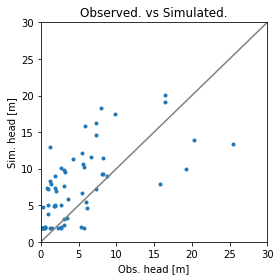

Error is - 8.532894234748916
Params are - [     6.88282447 279385.14490893      3.88895171      0.42965573
      0.35859361      1.18915263]


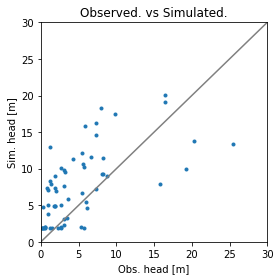

Error is - 8.532893649754042
Params are - [     6.89419879 273827.77395371      3.88403041      0.43014479
      0.35866924      1.19014823]


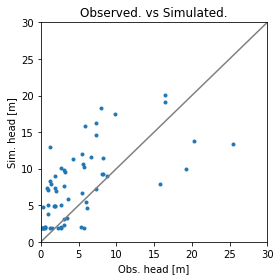

Error is - 8.532894195609193
Params are - [     6.89069674 330667.23021869      3.89166338      0.4302172
      0.35874573      1.19216139]


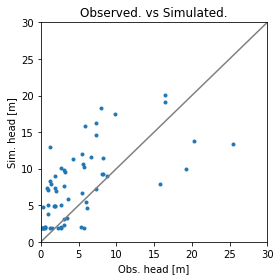

Error is - 8.53289593420938
Params are - [     6.8903598  249648.09694372      3.88701081      0.43095059
      0.3588553       1.18175143]


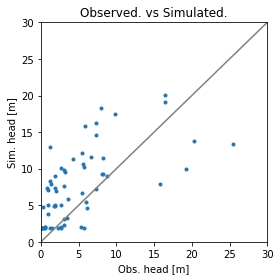

Error is - 8.532894318019073
Params are - [     6.89933828 217439.53472123      3.87451196      0.42981153
      0.35852504      1.19050743]


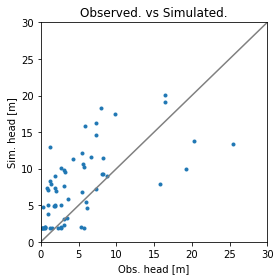

Error is - 8.53289390405231
Params are - [     6.9018249  262437.1734146       3.87381467      0.42876442
      0.35860225      1.18616333]


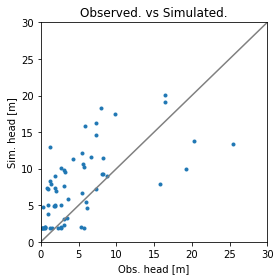

Error is - 8.532893516867901
Params are - [     6.89692187 276509.74922926      3.86488947      0.43014343
      0.3585825       1.18767234]


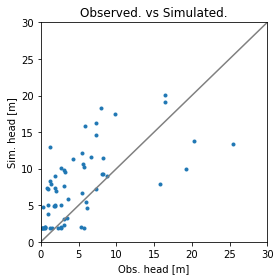

Error is - 8.532894269810452
Params are - [     6.89594703 312313.8480429       3.8542788       0.43044933
      0.35855397      1.18778366]


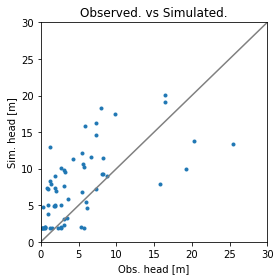

Error is - 8.532894299730682
Params are - [     6.89236076 285850.63220301      3.87936616      0.42918838
      0.35863414      1.19353777]


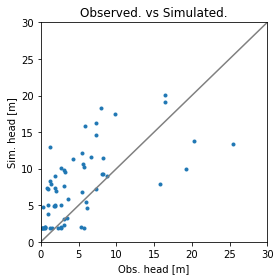

Error is - 8.532893624652319
Params are - [     6.89280715 285842.92283126      3.88364777      0.42927994
      0.35850429      1.19183533]


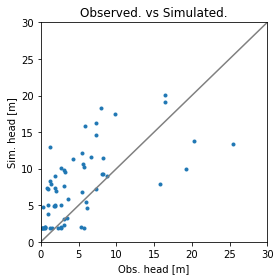

Error is - 8.532893301639128
Params are - [     6.89040095 324521.41164348      3.8812724       0.4293203
      0.35866819      1.18876152]


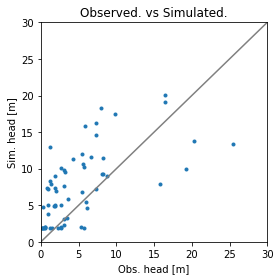

Error is - 8.53289384835639
Params are - [     6.88593228 378062.35010461      3.88465262      0.42907469
      0.35873977      1.18788857]


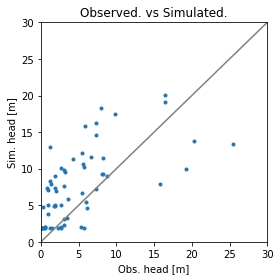

Error is - 8.532893560664885
Params are - [     6.8967252  269000.57397519      3.8770536       0.42998742
      0.35857043      1.1841391 ]


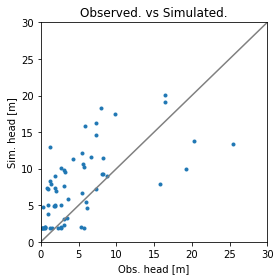

Error is - 8.532893713563974
Params are - [     6.88556116 294601.83295046      3.88368474      0.43081905
      0.35859172      1.19083879]


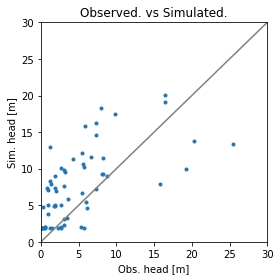

Error is - 8.532892507632637
Params are - [     6.89443416 333353.50073217      3.87658823      0.4300238
      0.3586082       1.18934858]


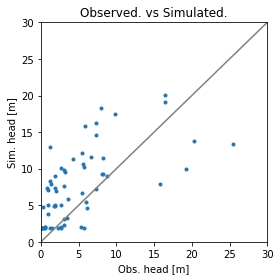

Error is - 8.532892253879007
Params are - [     6.89609913 379322.95736711      3.87408005      0.43009844
      0.35861867      1.18979794]


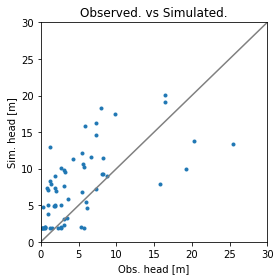

Error is - 8.532893233760847
Params are - [     6.90348987 308406.63004955      3.87130649      0.42883906
      0.35861272      1.1866127 ]


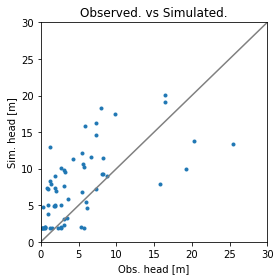

Error is - 8.53289345290427
Params are - [     6.89794927 340706.97441158      3.86671952      0.42907807
      0.35851636      1.18612474]


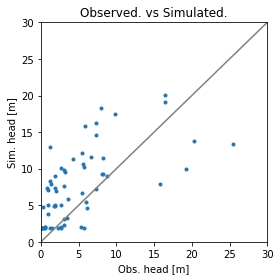

Error is - 8.53289385261343
Params are - [     6.90105494 346979.84272746      3.86145941      0.42987563
      0.35868534      1.18253412]


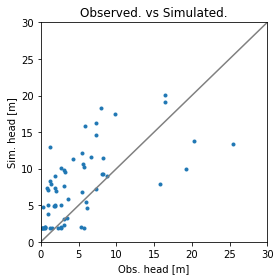

Error is - 8.532892931503376
Params are - [     6.8948691  301127.15280531      3.87810068      0.42942887
      0.35854955      1.18951003]


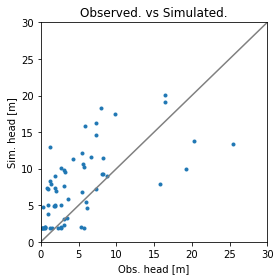

Error is - 8.532893337052252
Params are - [     6.8965182  374531.05119358      3.8684026       0.42898197
      0.35861223      1.19202066]


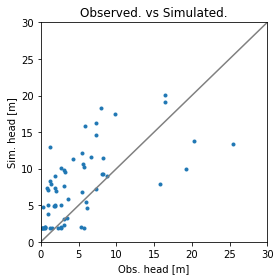

Error is - 8.53289271753925
Params are - [     6.89618696 399695.64326094      3.88173777      0.42843881
      0.35861007      1.18993686]


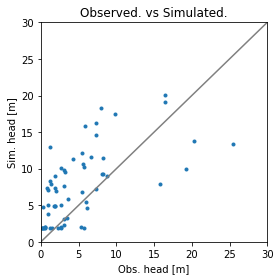

Error is - 8.532893596063358
Params are - [     6.89457214 355161.30769508      3.88491382      0.42929108
      0.35870745      1.19275516]


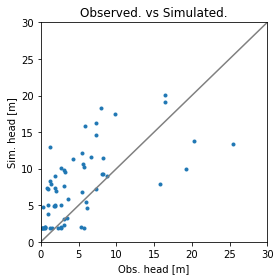

Error is - 8.532892883622566
Params are - [     6.89710498 344320.55773245      3.87126809      0.42913132
      0.35856413      1.18778235]


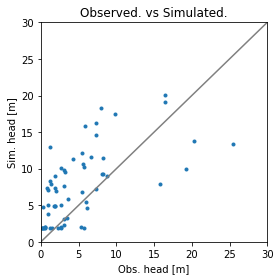

Error is - 8.532892831757193
Params are - [     6.8961988  311267.06642604      3.88418589      0.42943696
      0.35859555      1.18544647]


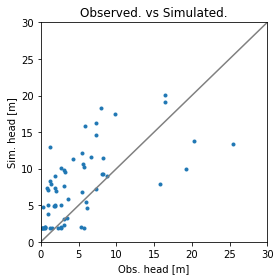

Error is - 8.532892482488542
Params are - [     6.90424867 356858.59090365      3.87228726      0.42913752
      0.35851537      1.18760059]


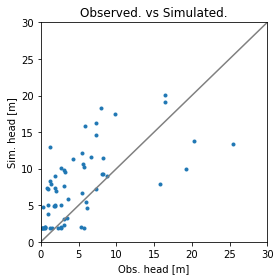

Error is - 8.532892139577196
Params are - [     6.89141267 389124.02611562      3.88258009      0.42971825
      0.3585384       1.19007872]


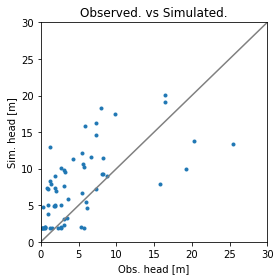

Error is - 8.532892565697296
Params are - [     6.88537407 429482.72414866      3.88821689      0.43015784
      0.35850123      1.19181173]


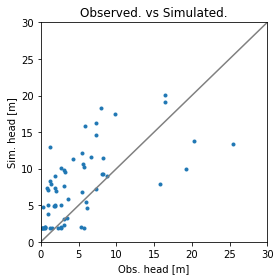

Error is - 8.532891851878988
Params are - [     6.89888131 425735.79446329      3.87727904      0.4292249
      0.35859785      1.18737095]


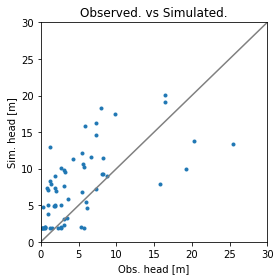

Error is - 8.532891740291353
Params are - [     6.90088741 488040.11529228      3.87686822      0.42912292
      0.35862199      1.18630141]


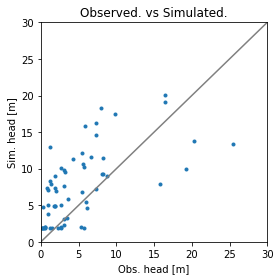

Error is - 8.532891871483775
Params are - [     6.89790623 430448.90872276      3.88597834      0.42951964
      0.35860255      1.18860498]


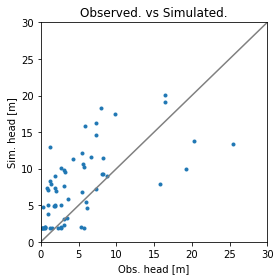

Error is - 8.532891857271311
Params are - [     6.89938156 503229.68079475      3.87365802      0.42924156
      0.35857347      1.1919937 ]


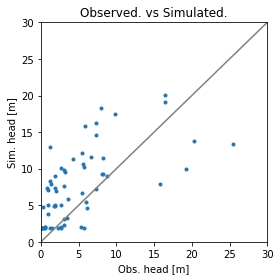

Error is - 8.532891523734211
Params are - [     6.90045826 449312.44980445      3.87341289      0.4305073
      0.35854675      1.18818893]


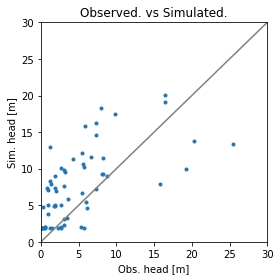

Error is - 8.53289197620827
Params are - [     6.90259391 474120.85307621      3.86925045      0.43154155
      0.35851508      1.18731496]


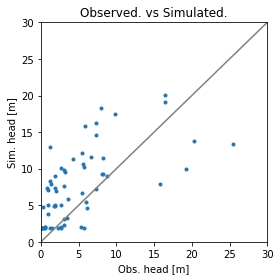

Error is - 8.532891757640622
Params are - [     6.89113309 522967.45512868      3.88323861      0.43026519
      0.3586519       1.1907213 ]


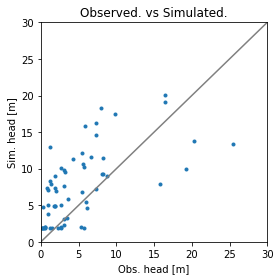

Error is - 8.532891265646636
Params are - [     6.89762728 548384.58791907      3.88449867      0.42935984
      0.35855968      1.18883174]


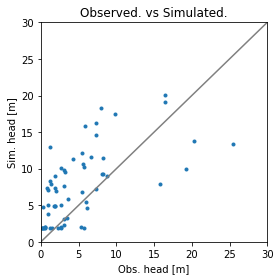

Error is - 8.532891209376125
Params are - [     6.89839136 632915.40319506      3.88970799      0.42899054
      0.35853019      1.18834863]


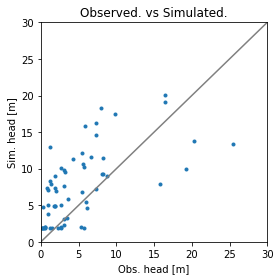

Error is - 8.532891403746698
Params are - [     6.90463996 619847.31153037      3.8783746       0.42949747
      0.35863722      1.18797427]


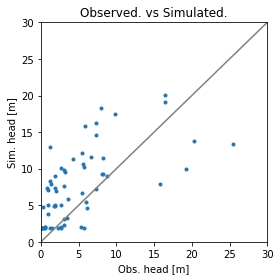

Error is - 8.5328909013096
Params are - [     6.90039098 641655.2298591       3.87244177      0.42968868
      0.35858463      1.18923776]


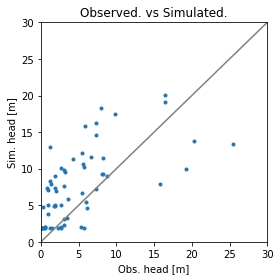

Error is - 8.532890990376798
Params are - [     6.90163336 747258.39042727      3.86567348      0.42977321
      0.35857567      1.18955415]


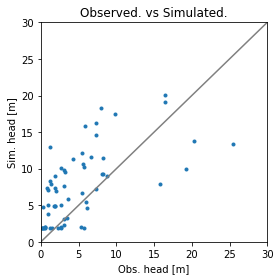

Error is - 8.532891137412657
Params are - [     6.89925213 615016.30747523      3.88435667      0.43011581
      0.35861742      1.1849304 ]


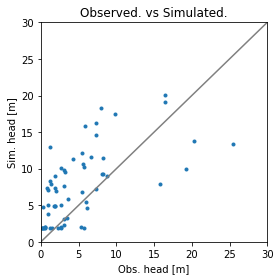

Error is - 8.532891859640259
Params are - [     6.91020695 625961.48392349      3.87514877      0.42904239
      0.3585275       1.1842725 ]


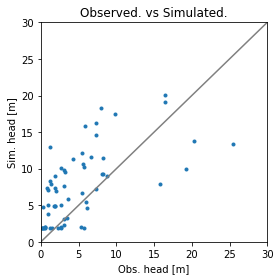

Error is - 8.53289122704285
Params are - [     6.89590155 548715.96232738      3.88121615      0.42995949
      0.3586208       1.1891091 ]


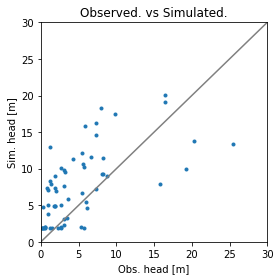

Error is - 8.532891055383718
Params are - [     6.89879067 681114.10610491      3.88296847      0.43046351
      0.35855701      1.18962829]


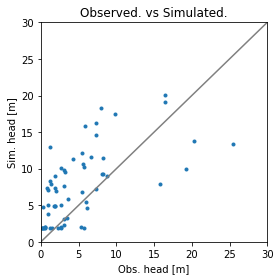

Error is - 8.53289107899959
Params are - [     6.89866395 797108.99035957      3.88960899      0.42906453
      0.35863568      1.18822056]


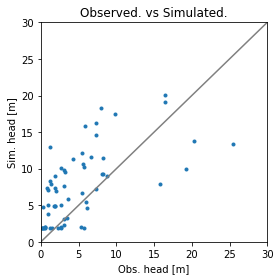

Error is - 8.532890763239442
Params are - [     6.89249025 685661.35491004      3.88839208      0.42993005
      0.35854469      1.18851731]


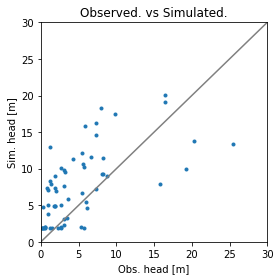

Error is - 8.532891146153329
Params are - [     6.88641539 718568.37659988      3.89340082      0.43014634
      0.35849842      1.18878883]


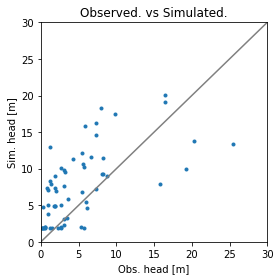

Error is - 8.532890802625896
Params are - [     6.90009156 802441.16830726      3.8879425       0.42945822
      0.35853574      1.18718522]


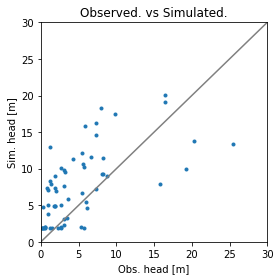

Error is - 8.532890756572131
Params are - [     6.89816849 774750.31581032      3.87886218      0.43058306
      0.3586282       1.18755788]


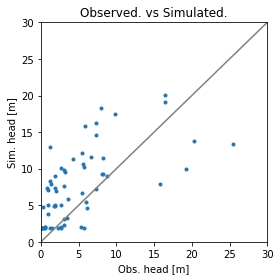

Error is - 8.53289108844258
Params are - [     6.89805706 845667.77211795      3.87343927      0.43137932
      0.3586772       1.1871625 ]


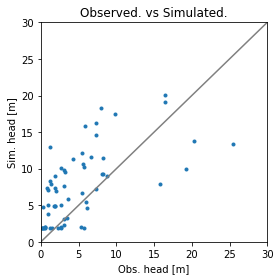

Error is - 8.532890815289175
Params are - [     6.89694651 845894.08097517      3.88238199      0.42961355
      0.35854456      1.19185193]


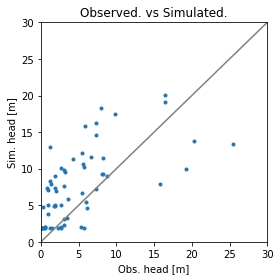

Error is - 8.532890834022671
Params are - [     6.8969622  680063.0949627       3.87472067      0.43084783
      0.35849592      1.18977224]


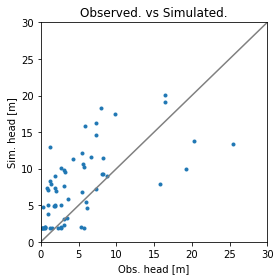

Error is - 8.532890516612113
Params are - [     6.896226   795707.64216995      3.87861193      0.42957695
      0.35855423      1.1884125 ]


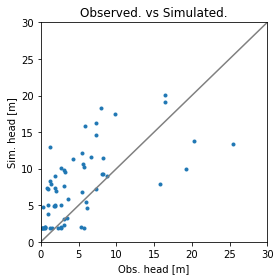

Error is - 8.532890838425741
Params are - [     6.89494366 853004.41020246      3.87643366      0.42913368
      0.35855285      1.1878046 ]


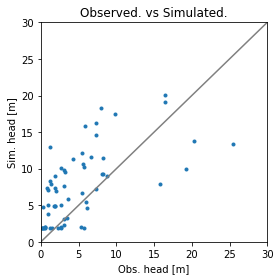

Error is - 8.53289040603195
Params are - [     6.89323735 886517.32251937      3.89119535      0.43031454
      0.35851648      1.18852793]


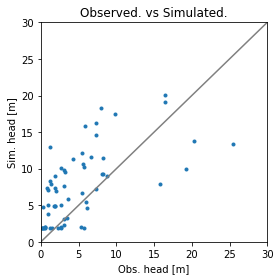

Error is - 8.532890779099771
Params are - [      6.88966054 1008948.36884951       3.90057213       0.43062747
       0.35848241       1.18817302]


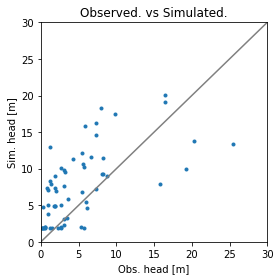

Error is - 8.532890997081084
Params are - [     6.89542452 916927.533268        3.894408        0.42897763
      0.35861204      1.18757868]


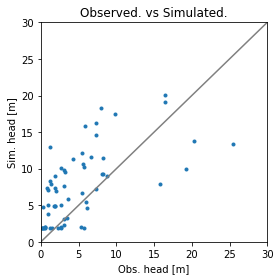

Error is - 8.532890469937731
Params are - [     6.89657778 739279.20453903      3.8796425       0.43038028
      0.35852495      1.18922385]


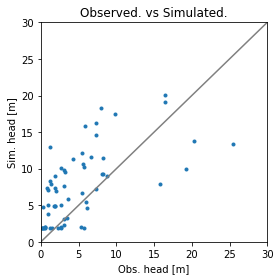

Error is - 8.53289082829115
Params are - [     6.8953173  715558.25511015      3.88583352      0.43046749
      0.35855687      1.18462296]


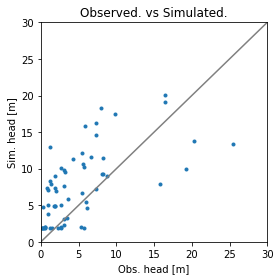

Error is - 8.532890583568896
Params are - [     6.89653921 813310.12450891      3.88324487      0.42982703
      0.35854763      1.19004469]


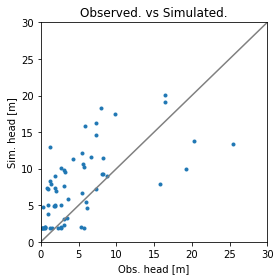

Error is - 8.5328908160698
Params are - [     6.89098813 762634.15317862      3.87870713      0.43074575
      0.35856966      1.19024284]


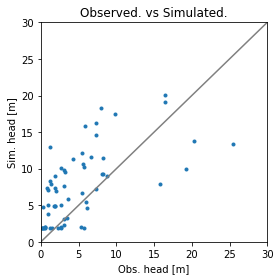

Error is - 8.532890600526622
Params are - [     6.8978157  792489.4145251       3.88563366      0.42978011
      0.35854422      1.18794962]


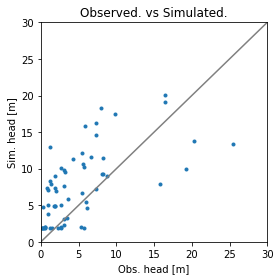

Error is - 8.532890350776583
Params are - [     6.90036459 915023.31978085      3.87733808      0.43022394
      0.35856055      1.18872151]


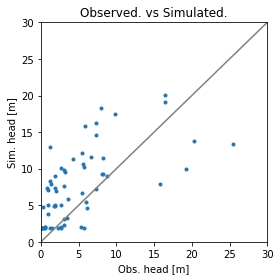

Error is - 8.532890470014566
Params are - [      6.90430176 1029704.30221625       3.87181109       0.43037088
       0.35856849       1.18882361]


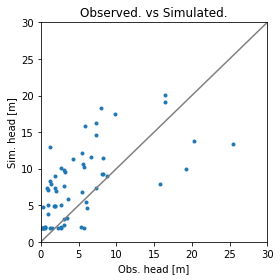

Error is - 8.532890620522872
Params are - [     6.89541839 872692.02687075      3.88635996      0.42945122
      0.3584545       1.19006882]


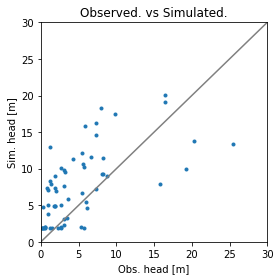

Error is - 8.532890385121245
Params are - [     6.89610591 848206.59910564      3.88448551      0.42973418
      0.35849792      1.18944109]


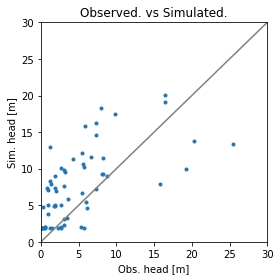

Error is - 8.532890434340615
Params are - [     6.89520124 873525.32301616      3.87920576      0.43023887
      0.35852304      1.19017423]


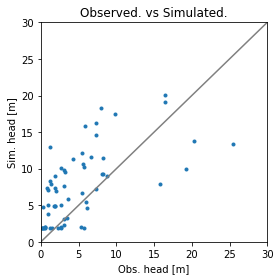

Error is - 8.53289025802116
Params are - [     6.89603175 872776.34586808      3.88024817      0.43032922
      0.35851143      1.18812235]


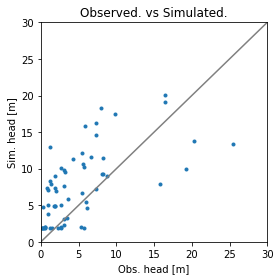

Error is - 8.532890153081153
Params are - [     6.89577802 902509.45654767      3.87874982      0.43058031
      0.35849332      1.18716117]


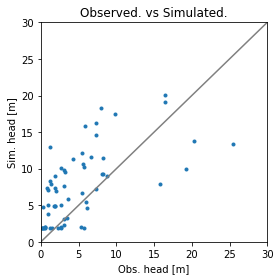

Error is - 8.53289064889107
Params are - [     6.89619564 925979.43299963      3.88492708      0.43091375
      0.35848453      1.18933743]


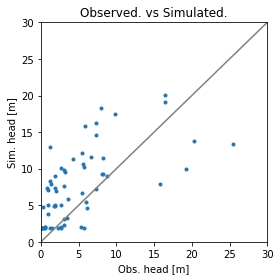

Error is - 8.532890363477392
Params are - [     6.89621841 828275.58987737      3.88019072      0.42991115
      0.35853681      1.18864373]


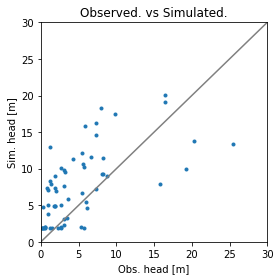

Error is - 8.532890067436675
Params are - [      6.89572406 1012073.33240999       3.88407924       0.42995405
       0.35851776       1.1883327 ]


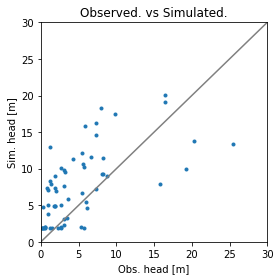

Error is - 8.532889996182732
Params are - [      6.89529721 1148470.39634548       3.88629761       0.42974094
       0.35851416       1.18788713]


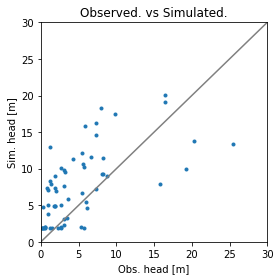

Error is - 8.532890192115023
Params are - [     6.89713259 969475.5717093       3.88687994      0.42992949
      0.35851671      1.18661995]


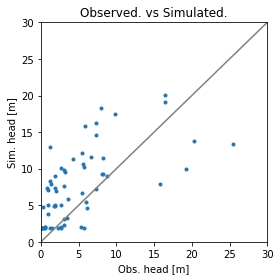

Error is - 8.53289016962409
Params are - [     6.90039489 984136.32193606      3.87345188      0.42972547
      0.35852334      1.18763026]


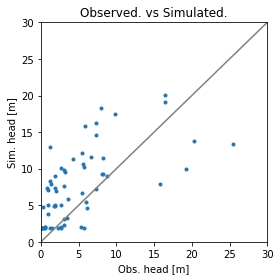

Error is - 8.532890060982497
Params are - [      6.89895599 1067756.95295993       3.87648384       0.43030292
       0.35855037       1.1861135 ]


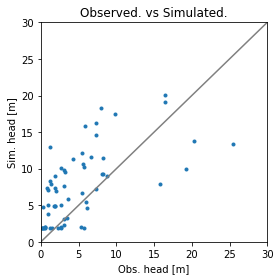

Error is - 8.532890062633427
Params are - [      6.89975603 1167515.08321573       3.87954301       0.43025653
       0.35851601       1.18606745]


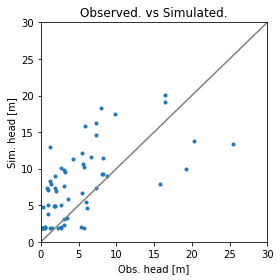

Error is - 8.532890262073145
Params are - [      6.89540698 1164931.27445721       3.88313061       0.42995461
       0.35847742       1.18510498]


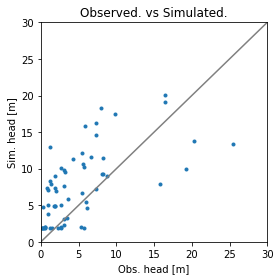

Error is - 8.532890082686732
Params are - [      6.89664639 1102454.28578812       3.88168248       0.43002194
       0.3584982        1.18600911]


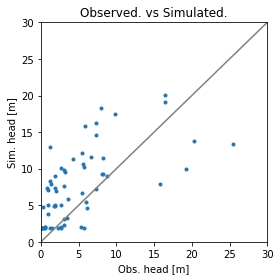

Error is - 8.532889995781613
Params are - [      6.89847692 1154805.26055503       3.87185627       0.43027989
       0.3585151        1.18700292]


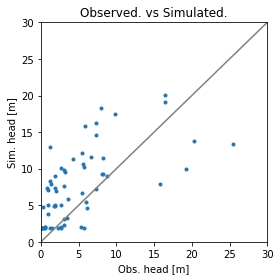

Error is - 8.532890300950196
Params are - [      6.89914908 1247470.10497789       3.86434444       0.43045509
       0.35851429       1.18719441]


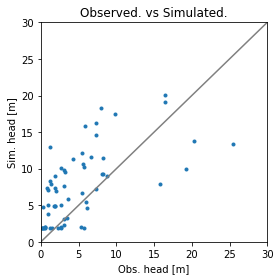

Error is - 8.532890072685534
Params are - [      6.89457529 1197034.15653459       3.88475246       0.43066871
       0.35850572       1.1857835 ]


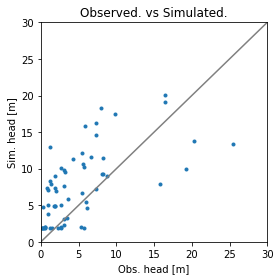

Error is - 8.532889843247117
Params are - [      6.89879125 1376835.92191862       3.8814554        0.42984333
       0.35853986       1.18579337]


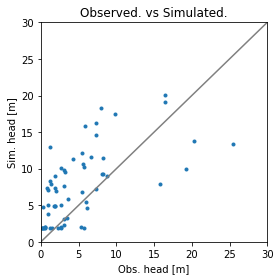

Error is - 8.53289004524574
Params are - [      6.90029786 1613999.1546041        3.88280819       0.42947484
       0.35856313       1.18510946]


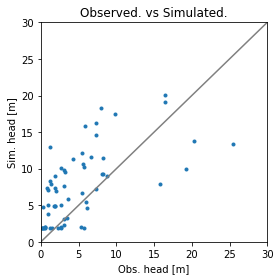

Error is - 8.532889857019565
Params are - [      6.89863784 1268351.63805501       3.87844705       0.43034216
       0.35854887       1.18687351]


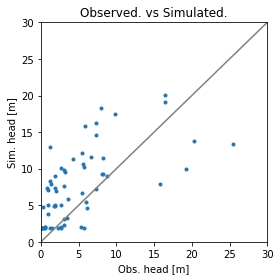

Error is - 8.532890091923347
Params are - [      6.90206312 1197544.26114868       3.87327526       0.42958654
       0.35855574       1.18746246]


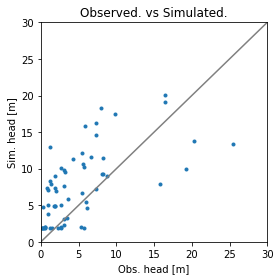

Error is - 8.532889916767626
Params are - [      6.89644725 1197161.68268811       3.88188316       0.43039817
       0.35851822       1.18620324]


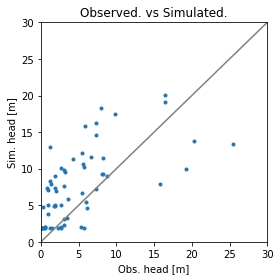

Error is - 8.532889891667706
Params are - [      6.89577946 1236945.53429166       3.87926477       0.43004594
       0.35854618       1.18722378]


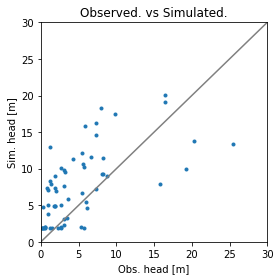

Error is - 8.532889772467133
Params are - [      6.89552065 1393099.8583247        3.88325091       0.42991389
       0.35851042       1.18754781]


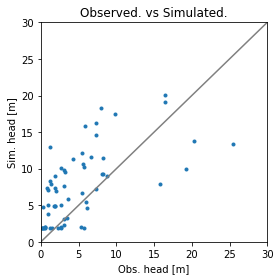

Error is - 8.532889875687031
Params are - [      6.89380298 1555771.31100709       3.88663445       0.42971938
       0.35849045       1.18826497]


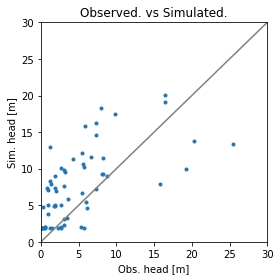

Error is - 8.532889981143873
Params are - [      6.89925392 1393929.56893223       3.87242158       0.43053352
       0.3585454        1.18566108]


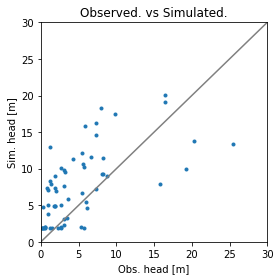

Error is - 8.53288981929655
Params are - [      6.89633321 1467302.80751509       3.88705135       0.43007912
       0.35855456       1.18609801]


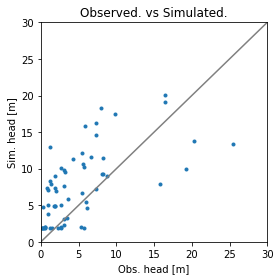

Error is - 8.532890143584057
Params are - [      6.89458264 1252636.24533216       3.89136263       0.42967402
       0.35852731       1.18758549]


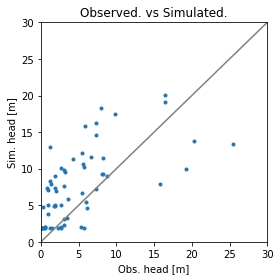

Error is - 8.53288979512755
Params are - [      6.8980861  1358606.23803222       3.87715684       0.43031864
       0.35854088       1.18614218]


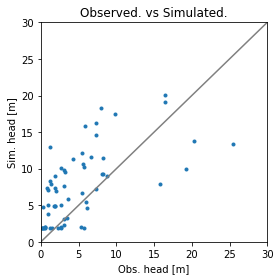

Error is - 8.532889678836169
Params are - [      6.89793559 1503218.98335765       3.88032562       0.42978286
       0.35856204       1.18702298]


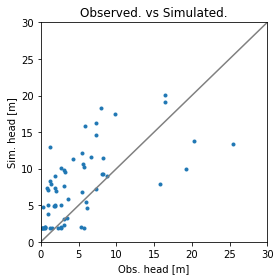

Error is - 8.532889706052583
Params are - [      6.89867975 1656247.63369243       3.87954684       0.4294752
       0.35858394       1.18743285]


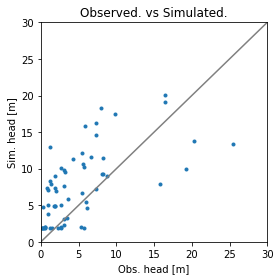

Error is - 8.532889772904918
Params are - [      6.89932208 1552192.94810944       3.88329762       0.4300474
       0.35853936       1.18593551]


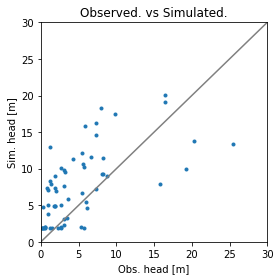

Error is - 8.532889846585787
Params are - [      6.89669178 1615400.61436423       3.8857322        0.42965292
       0.3585335        1.18597311]


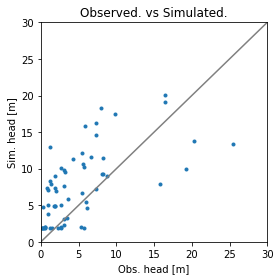

Error is - 8.53288987975433
Params are - [      6.8971783  1528638.37028693       3.88391091       0.42982523
       0.35853734       1.18619821]


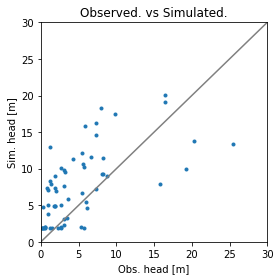

Error is - 8.532889711387693
Params are - [      6.89672812 1448159.42084118       3.88178826       0.42984837
       0.35853623       1.1872854 ]


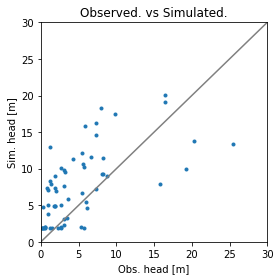

Error is - 8.532889756221207
Params are - [      6.89862883 1527705.96573355       3.88181162       0.42991513
       0.3585507        1.18647924]


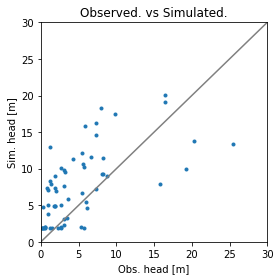

Error is - 8.532889815732403
Params are - [      6.89801084 1430912.61069494       3.87874123       0.43005075
       0.35855146       1.18658258]


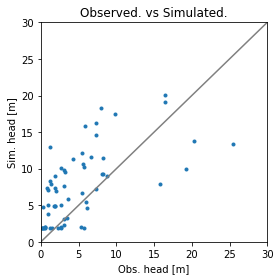

Error is - 8.532889833096274
Params are - [      6.8971344  1485260.89543637       3.88368848       0.42993099
       0.3585583        1.18656049]


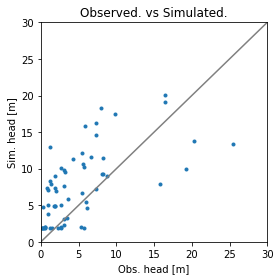

Error is - 8.532889792605355
Params are - [      6.89836342 1440027.45263814       3.88089051       0.42981309
       0.35855095       1.18640817]


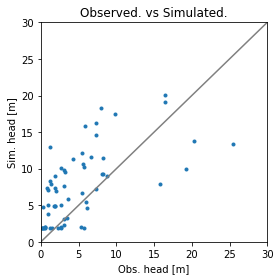

Error is - 8.532889836637805
Params are - [      6.89828671 1385785.31070633       3.87938633       0.43006251
       0.35855545       1.18694824]


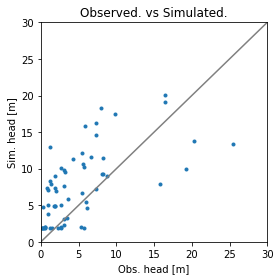

Error is - 8.53288972945557
Params are - [      6.89731368 1559309.79886094       3.88302891       0.42971789
       0.35854777       1.18649804]


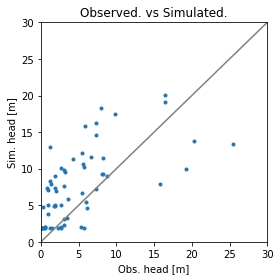

Error is - 8.532889823184902
Params are - [      6.89852577 1484517.18193909       3.8785069        0.42977838
       0.35854142       1.18686498]


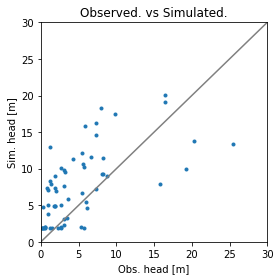

Error is - 8.532889897349905
Params are - [      6.89817792 1484703.11031341       3.87980229       0.42981653
       0.35854564       1.18678886]


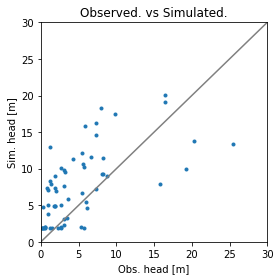

Error is - 8.53288975396102
Params are - [      6.89733185 1475689.20209942       3.88105694       0.42981562
       0.35854913       1.18715419]


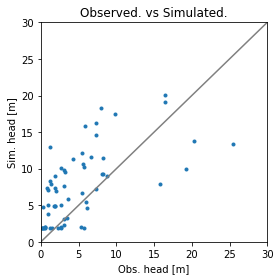

Error is - 8.532889758223584
Params are - [      6.89762464 1531264.3911093        3.88167726       0.42975037
       0.3585549        1.18676051]


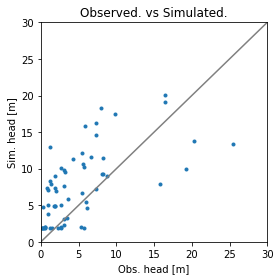

Error is - 8.532889731385687
Params are - [      6.89828221 1515462.4745456        3.88106862       0.42984899
       0.35855637       1.18675111]


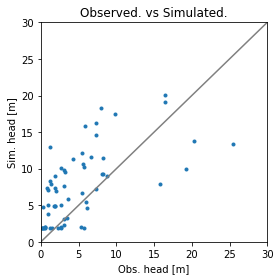

Error is - 8.532889831677414
Params are - [      6.8981495  1471623.2179979        3.88060806       0.42979798
       0.35855649       1.18671558]


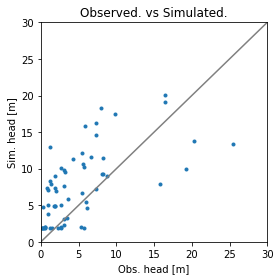

Error is - 8.532889791449367
Params are - [      6.89797321 1467065.79702629       3.87953342       0.4299168
       0.35855675       1.18680278]


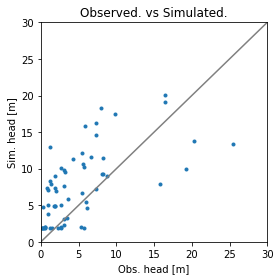

Error is - 8.53288978497707
Params are - [      6.89753499 1494239.93939701       3.88200705       0.42985692
       0.35856017       1.18679173]


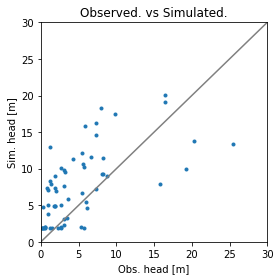

Error is - 8.532889686210332
Params are - [      6.89741133 1524023.71118053       3.88128157       0.42985921
       0.35855662       1.18704552]


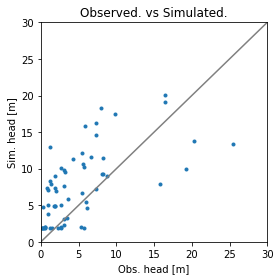

Error is - 8.532889814510948
Params are - [      6.89740032 1547567.10353688       3.88293893       0.42972119
       0.35855633       1.18703924]


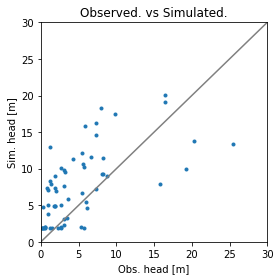

Error is - 8.532889754215008
Params are - [      6.89782999 1487191.12365394       3.8803848        0.4298679
       0.35855664       1.18686189]


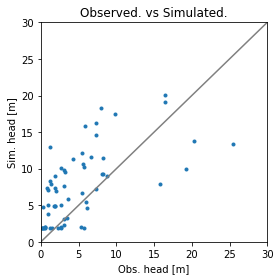

Error is - 8.532889786124812
Params are - [      6.89793688 1518043.35591847       3.87992455       0.42978473
       0.35855173       1.18707367]


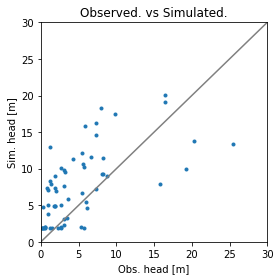

Error is - 8.532889777213851
Params are - [      6.89763546 1500190.79352738       3.88148643       0.42983887
       0.35855806       1.18686222]


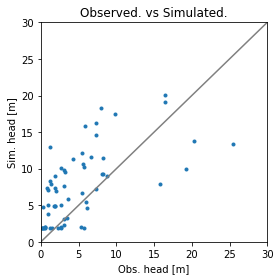

Error is - 8.532889746859905
Params are - [      6.89783641 1512092.5017881        3.88044518       0.42980278
       0.35855384       1.18700318]


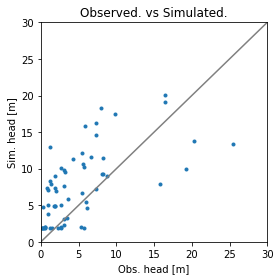

Error is - 8.532889694261677
Params are - [      6.89791782 1474628.27443245       3.87984365       0.42990875
       0.35855665       1.18718578]


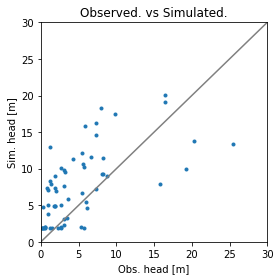

Error is - 8.532889819446321
Params are - [      6.89774174 1514513.92548064       3.88095572       0.42980483
       0.35855491       1.18719236]


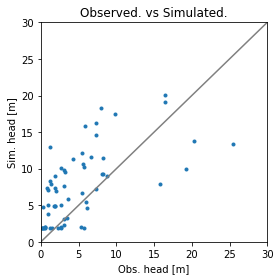

Error is - 8.53288970806482
Params are - [      6.89780793 1494021.82411062       3.88052753       0.42985213
       0.35855621       1.18694451]


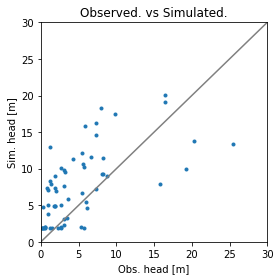

Error is - 8.532889714819085
Params are - [      6.89839857 1532126.7210389        3.88010711       0.42986929
       0.35856477       1.18683018]


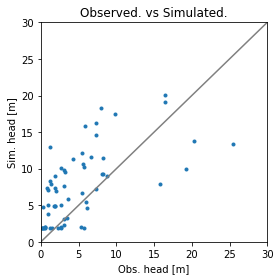

Error is - 8.53288980403735
Params are - [      6.89808141 1502401.49443381       3.88060619       0.4299043
       0.35856371       1.18692351]


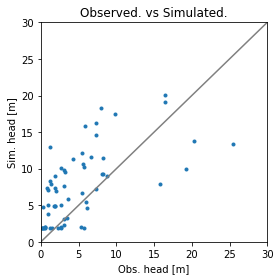

Error is - 8.532889720819101
Params are - [      6.89789766 1509669.74994953       3.88048543       0.42982816
       0.35855631       1.18698327]


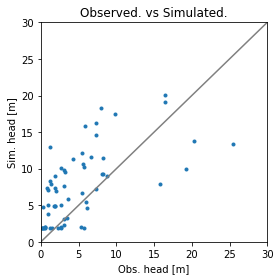

Error is - 8.53288971618124
Params are - [      6.89750742 1497100.61347763       3.87978835       0.42985114
       0.35856117       1.18725297]


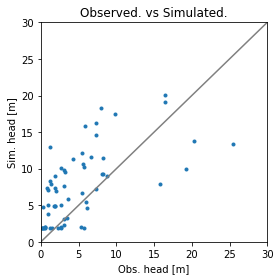

Error is - 8.532889821324053
Params are - [      6.8977619  1498703.62591639       3.88013918       0.42987963
       0.35856284       1.18711071]


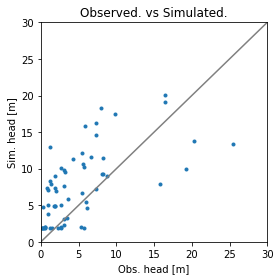

Error is - 8.532889801374106
Params are - [      6.89786372 1506928.21894125       3.88039887       0.42984103
       0.35855794       1.18701513]


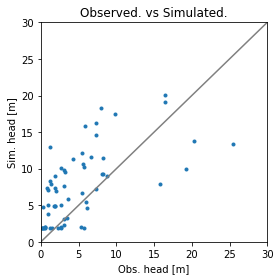

Error is - 8.532889835997903
Params are - [      6.89767346 1513621.34726909       3.88080359       0.42982103
       0.35855933       1.18703425]


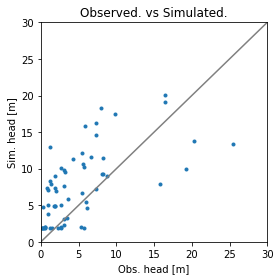

Error is - 8.532889745664598
Params are - [      6.8979267  1488923.62889505       3.88008463       0.4298458
       0.35855934       1.18710438]


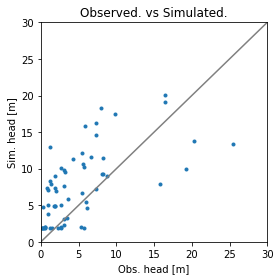

Error is - 8.532889663196952
Params are - [      6.89787176 1498620.40373414       3.88042657       0.42981749
       0.35855912       1.18698374]


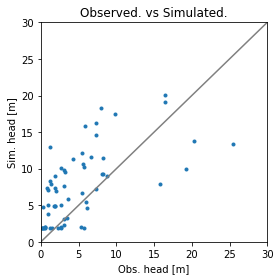

Error is - 8.532889678272598
Params are - [      6.89816708 1517672.85219828       3.88021636       0.42982607
       0.35856341       1.18692658]


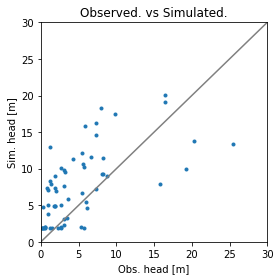

Error is - 8.532889736706258
Params are - [      6.8977215  1500159.79841764       3.88005698       0.429817
       0.3585616        1.18713797]


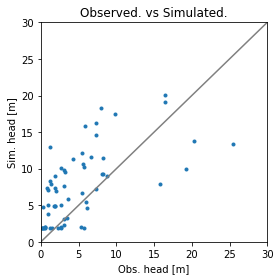

Error is - 8.532889755199422
Params are - [      6.89791662 1506444.36665359       3.88040552       0.42980551
       0.35855917       1.18700312]


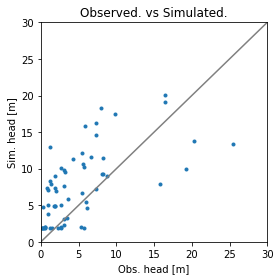

Error is - 8.532889753130052
Params are - [      6.89817296 1491391.99714969       3.87970163       0.42981054
       0.35856223       1.18702534]


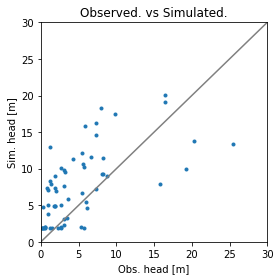

Error is - 8.53288982356614
Params are - [      6.89801524 1493551.52126389       3.87986508       0.42982775
       0.35856341       1.18706388]


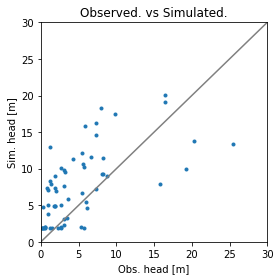

Error is - 8.532889748641695
Params are - [      6.89794128 1503221.15530617       3.88027041       0.42981107
       0.35856023       1.18701831]


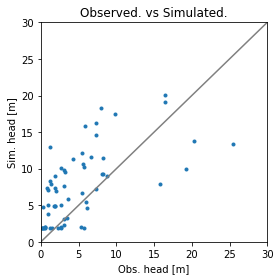

Error is - 8.532889814903779
Params are - [      6.89768168 1512546.94348662       3.88075856       0.42982289
       0.35855968       1.18703931]


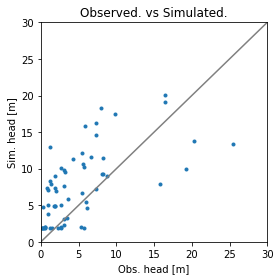

Error is - 8.532889793561582
Params are - [      6.89805014 1496680.73373392       3.87996587       0.42981363
       0.35856159       1.18702883]


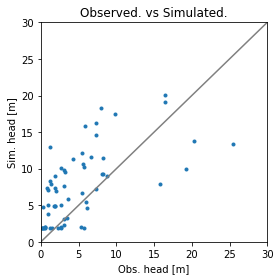

Error is - 8.532889764756684
Params are - [      6.89801942 1508146.62796621       3.88032147       0.42982178
       0.35856126       1.18695516]


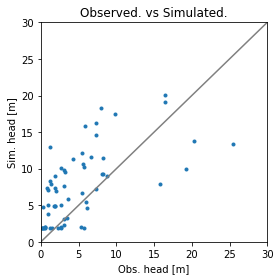

Error is - 8.532889746065981
Params are - [      6.89790367 1500919.69354589       3.88037609       0.42980018
       0.35856058       1.18700336]


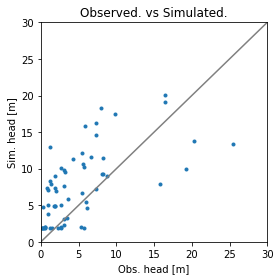

Error is - 8.532889786966008
Params are - [      6.89779663 1499390.10107589       3.88024178       0.42981725
       0.35856036       1.18706086]


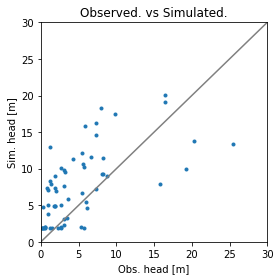

Error is - 8.532889792290554
Params are - [      6.89789923 1493772.01631459       3.8802556        0.42983165
       0.35855923       1.18704406]


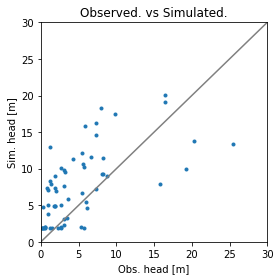

Error is - 8.532889806518916
Params are - [      6.89790652 1500920.77952015       3.88034849       0.42981428
       0.35855968       1.18700103]


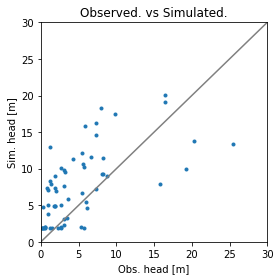

Error is - 8.532889840275132
Params are - [      6.89802236 1495006.20044191       3.8800641        0.42981402
       0.35856068       1.18700454]


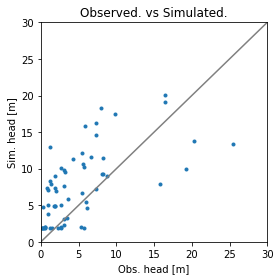

Error is - 8.532889768007136
Params are - [      6.89777672 1505583.67361038       3.88059256       0.42982019
       0.3585594        1.18701153]


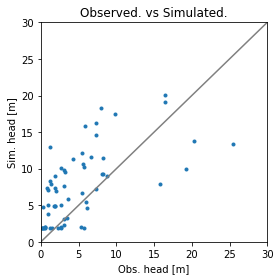

Error is - 8.53288975025394
Params are - [      6.89784929 1501223.39256221       3.88038953       0.4298219
       0.35856031       1.18701854]


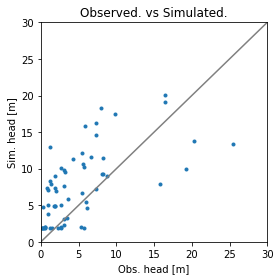

Error is - 8.532889779804492
Params are - [      6.89783993 1510855.94785031       3.88052707       0.42980128
       0.35856112       1.186967  ]


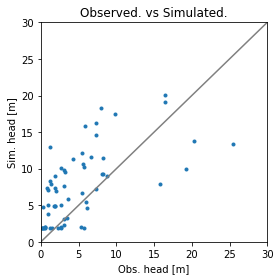

Error is - 8.53288971263034
Params are - [      6.89795697 1509059.81201382       3.88063599       0.42981036
       0.35856024       1.18691892]


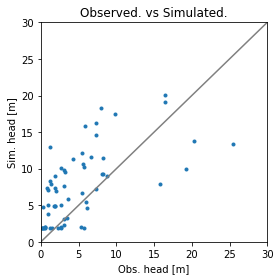

Error is - 8.532889773512997
Params are - [      6.89795268 1496995.25329391       3.88038701       0.42982935
       0.35855919       1.18699675]


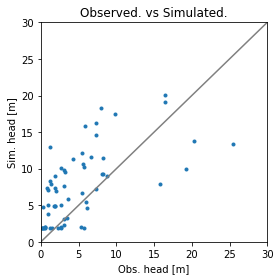

Error is - 8.532889762605285
Params are - [      6.89792449 1500460.42693301       3.88042202       0.42982234
       0.35855967       1.18698931]


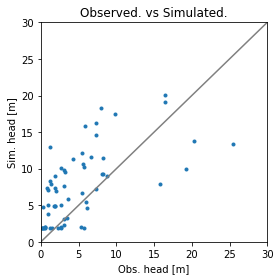

Error is - 8.532889709090895
Params are - [      6.89806515 1500559.77864138       3.88026466       0.42981116
       0.35856099       1.18694482]


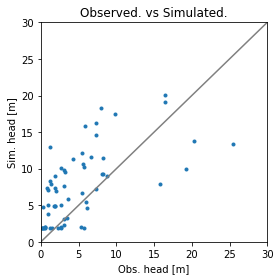

Error is - 8.53288970305385
Params are - [      6.89783769 1495467.87451061       3.88051682       0.42980603
       0.35855904       1.18699774]


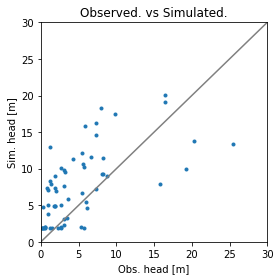

Error is - 8.532889730118384
Params are - [      6.89790369 1501489.89140301       3.88044787       0.42980004
       0.35856042       1.1869664 ]


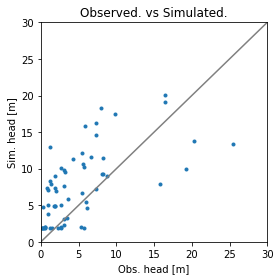

Error is - 8.532889694809864
Params are - [      6.89799701 1500815.75872074       3.8804998        0.42979319
       0.35855982       1.18691978]


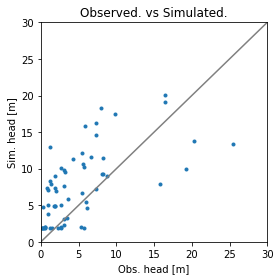

Error is - 8.532889854063917
Params are - [      6.89797375 1501084.81279534       3.88055448       0.42981258
       0.3585593        1.18690711]


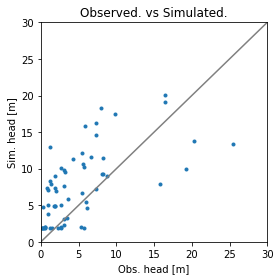

Error is - 8.532889837033725
Params are - [      6.89792119 1500960.97335826       3.88042069       0.42980328
       0.35856026       1.1869793 ]


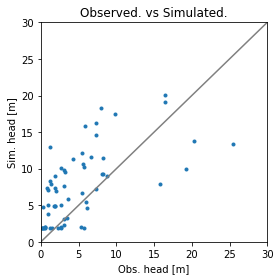

Error is - 8.532889797084257
Params are - [      6.89793439 1499718.08122744       3.88046319       0.42980534
       0.35855947       1.18695176]


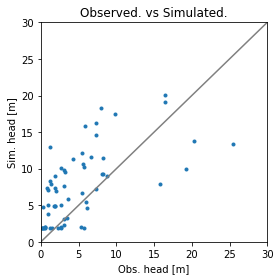

Error is - 8.532889707632188
Params are - [      6.89785472 1497044.13912237       3.8804717        0.42981176
       0.35855908       1.18699074]


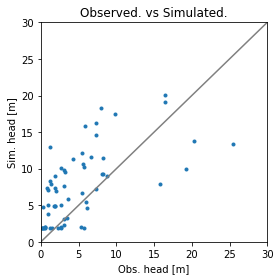

Error is - 8.532889732792142
Params are - [      6.89796845 1499590.09118776       3.88034562       0.42981433
       0.35856006       1.18696428]


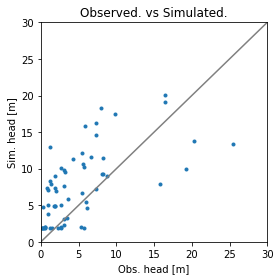

Error is - 8.532889725276888
Params are - [      6.89791436 1503840.10787398       3.88053128       0.42981393
       0.35855968       1.18695133]


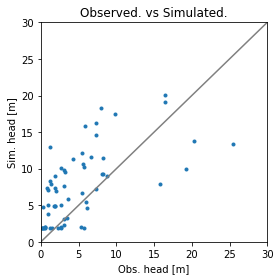

Error is - 8.532889738773504
Params are - [      6.89788772 1500055.14756857       3.88043722       0.42980877
       0.35855977       1.18697507]


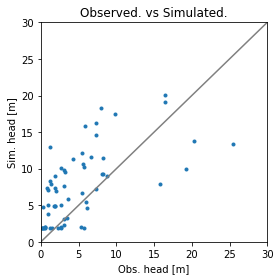

Error is - 8.532889796216645
Params are - [      6.89788772 1499770.04864002       3.88040133       0.42980884
       0.35855985       1.18699355]


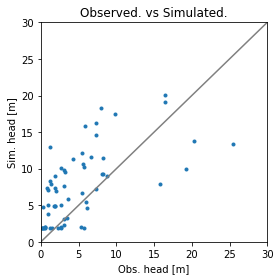

Error is - 8.532889709820083
Params are - [      6.89786052 1499921.89814817       3.88040805       0.4298197
       0.35855972       1.18700114]


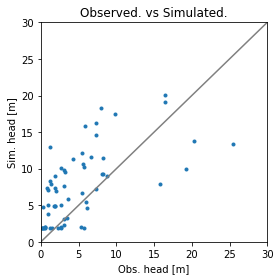

Error is - 8.532889792416755
Params are - [      6.89789813 1499920.54723832       3.88047215       0.42981982
       0.35855929       1.18696189]


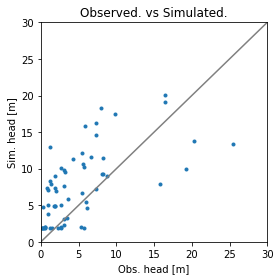

Error is - 8.532889702253764
Params are - [      6.89789553 1499882.92258874       3.88045444       0.42981708
       0.35855943       1.1869698 ]


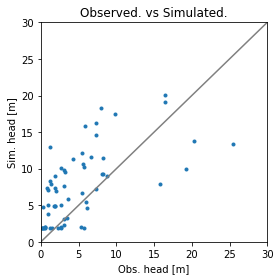

Error is - 8.532889789045905
Params are - [      6.89790073 1499578.03998315       3.880442         0.42982266
       0.35855926       1.18697861]


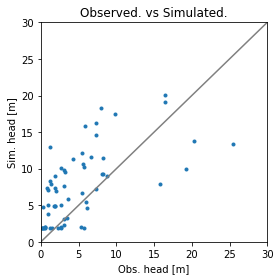

Error is - 8.532889810003567
Params are - [      6.89789097 1499935.87067222       3.88043842       0.42981224
       0.35855964       1.18697596]


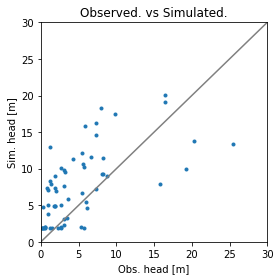

Error is - 8.53288978737767
Params are - [      6.89788364 1499251.66316144       3.88044051       0.42981729
       0.35855928       1.18697677]


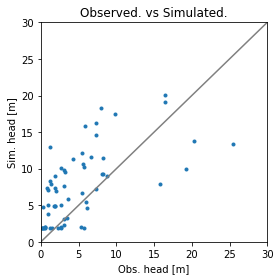

Error is - 8.532889704586859
Params are - [      6.89786324 1497832.27142825       3.88044914       0.42981463
       0.3585591        1.18698724]


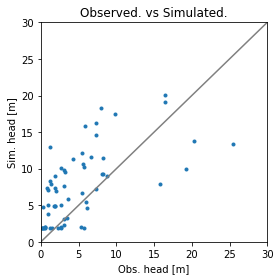

Error is - 8.53288972948446
Params are - [      6.89786614 1499271.15094115       3.88041731       0.4298186
       0.35855942       1.18699244]


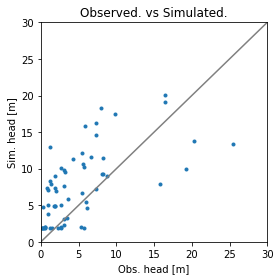

Error is - 8.532889722362098
Params are - [      6.89789306 1501230.25580406       3.88047893       0.42981571
       0.3585594        1.18696754]


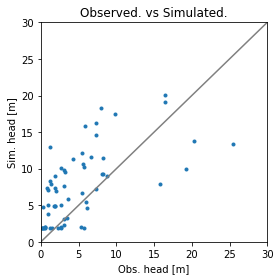

Error is - 8.532889865597515
Params are - [      6.89792011 1499105.24746095       3.88038609       0.42981591
       0.35855959       1.18697401]


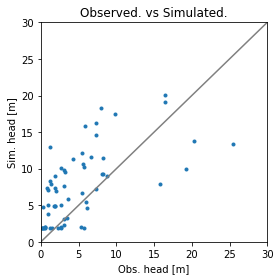

Error is - 8.532889865486034
Params are - [      6.89787974 1499337.77565135       3.8804319        0.42981313
       0.35855945       1.18697941]


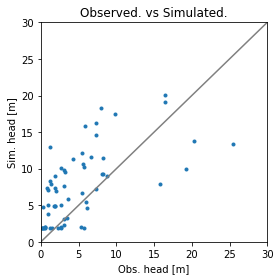

Error is - 8.532889713690494
Params are - [      6.89783242 1499409.25944585       3.88049536       0.42981637
       0.358559         1.18698837]


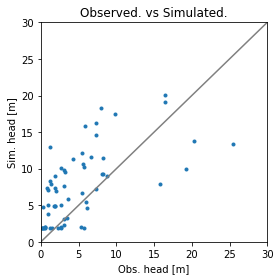

Error is - 8.53288977483007
Params are - [      6.89785702 1499200.55918694       3.88047071       0.42982023
       0.35855899       1.18698596]


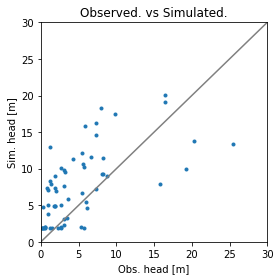

Error is - 8.53288972114566
Params are - [      6.89784424 1499269.63701869       3.88047216       0.42981706
       0.35855907       1.18699166]


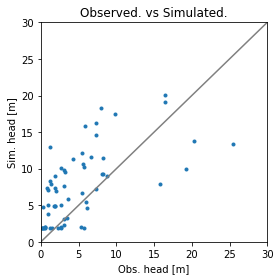

Error is - 8.532889716598289
Params are - [      6.8978666  1499343.76693711       3.88044245       0.42981305
       0.35855938       1.18698437]


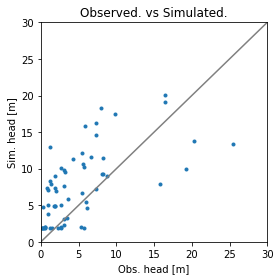

Error is - 8.532889802325213
Params are - [      6.89785763 1499297.38051488       3.88050422       0.42981284
       0.35855894       1.1869752 ]


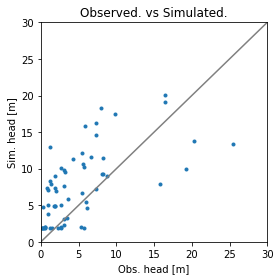

Error is - 8.532889846325135
Params are - [      6.89786401 1499277.70833459       3.88043904       0.42981716
       0.3585593        1.18698813]


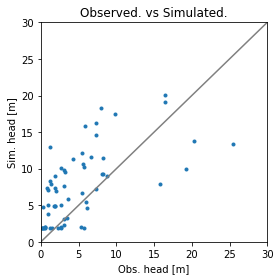

Error is - 8.532889717002453
Params are - [      6.8978675  1498226.33758119       3.88043785       0.42981606
       0.35855911       1.18698549]


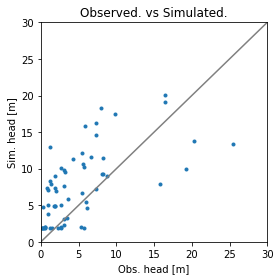

Error is - 8.532889751788405
Params are - [      6.89785209 1499014.83158999       3.88046096       0.42981693
       0.35855906       1.18698606]


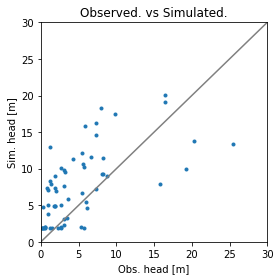

Error is - 8.532889752479758
Params are - [      6.89786918 1498982.08533562       3.88043451       0.42981527
       0.35855925       1.18698406]


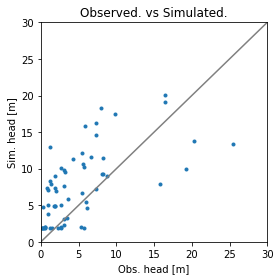

Error is - 8.532889705912053
Params are - [      6.897858   1498945.02037641       3.88044937       0.42981728
       0.3585591        1.1869877 ]


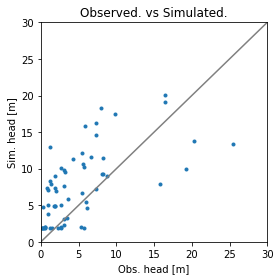

Error is - 8.532889882477146
Params are - [      6.89788241 1499925.3297691        3.88045275       0.4298166
       0.35855926       1.18697564]


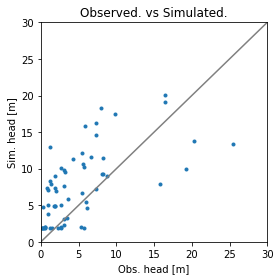

Error is - 8.532889788559041
Params are - [      6.89786895 1498945.77733764       3.88042194       0.42981805
       0.35855927       1.18698809]


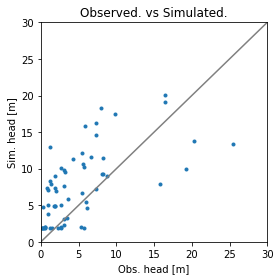

Error is - 8.532889783535875
Params are - [      6.89784675 1497652.8222159        3.88042432       0.42981709
       0.35855904       1.18699608]


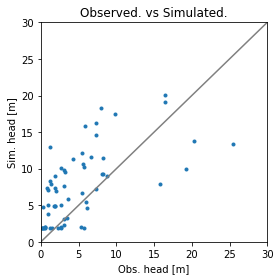

Error is - 8.532889847551115
Params are - [      6.89785281 1498201.38960678       3.88045592       0.42981533
       0.35855896       1.18698628]


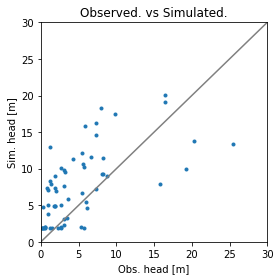

Error is - 8.532889759332845
Params are - [      6.89786491 1498759.68040493       3.88043044       0.42981737
       0.35855919       1.18698764]


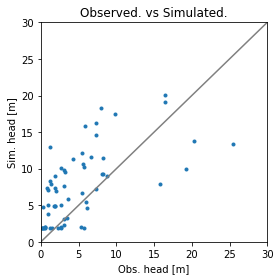

Error is - 8.5328897473293
Params are - [      6.89788106 1499863.29745819       3.88045558       0.42981638
       0.35855924       1.18697549]


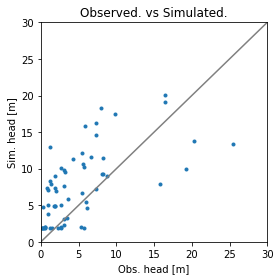

Error is - 8.532889713472809
Params are - [      6.89786828 1499124.31162026       3.88045785       0.42981577
       0.3585591        1.18697987]


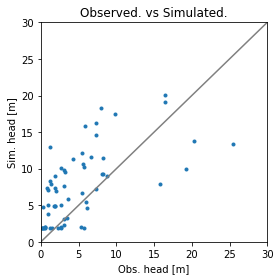

Error is - 8.532889755627483
Params are - [      6.89786372 1498949.31545111       3.88046155       0.42981803
       0.35855899       1.18698206]


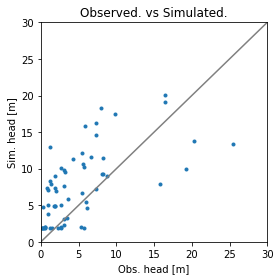

Error is - 8.532889784976991
Params are - [      6.89786781 1498973.89286449       3.88044127       0.42981596
       0.35855919       1.18698356]


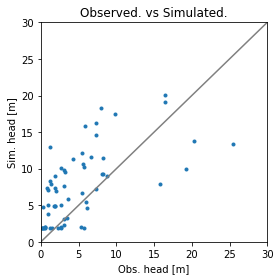

Error is - 8.532889740348548
Params are - [      6.89786488 1498782.71205527       3.88043797       0.42981739
       0.35855911       1.18698572]


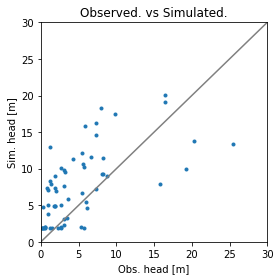

Error is - 8.53288967526306
Params are - [      6.89787002 1498872.3576772        3.88044221       0.42981663
       0.35855911       1.18698181]


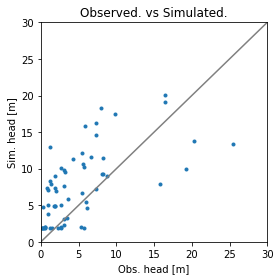

Error is - 8.532889677471573
Params are - [      6.89786963 1498423.37065767       3.88043221       0.42981678
       0.35855912       1.18698462]


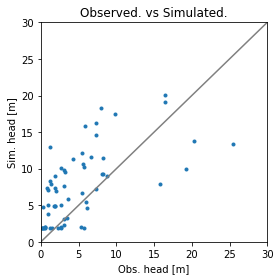

Error is - 8.532889770986149
Params are - [      6.89787641 1499241.85059616       3.88044108       0.42981694
       0.35855918       1.18697962]


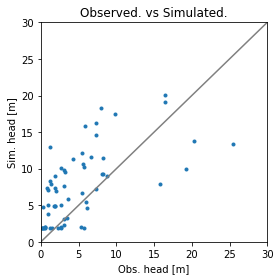

Error is - 8.532889626415928
Params are - [      6.89786192 1498817.61766206       3.88044377       0.42981721
       0.35855909       1.1869849 ]


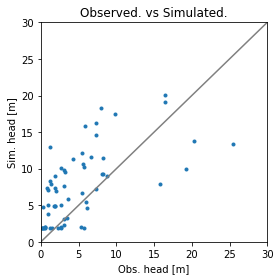

Error is - 8.532889760000746
Params are - [      6.89787047 1498801.24453488       3.88043054       0.42981638
       0.35855919       1.1869839 ]


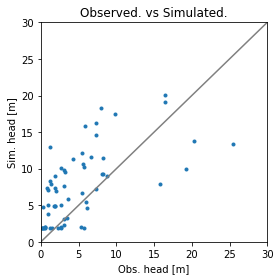

Error is - 8.532889727318127
Params are - [      6.89785981 1498197.38484424       3.88043001       0.42981703
       0.35855907       1.18698862]


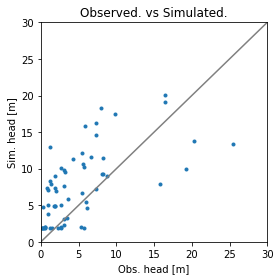

Error is - 8.532889807945962
Params are - [      6.8978622  1498436.70434198       3.88044037       0.42981779
       0.35855902       1.1869859 ]


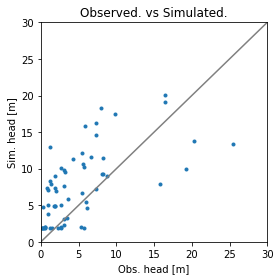

Error is - 8.532889710119333
Params are - [      6.8978684  1498710.10948665       3.880433         0.42981674
       0.35855914       1.1869844 ]


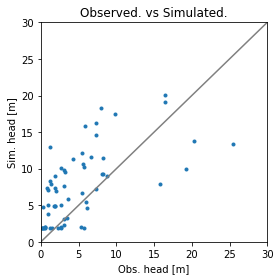

Error is - 8.532889688375127
Params are - [      6.89786897 1498431.03596538       3.88043129       0.42981658
       0.35855911       1.18698364]


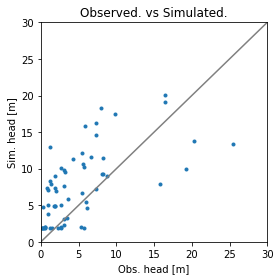

Error is - 8.532889791250177
Params are - [      6.89787709 1499094.24688346       3.88043967       0.42981678
       0.35855917       1.18697909]


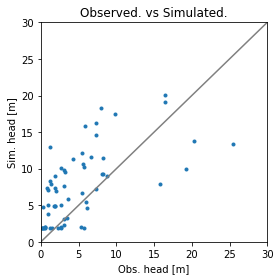

Error is - 8.53288972271694
Params are - [      6.89786413 1498421.60035405       3.88043243       0.42981697
       0.35855909       1.18698623]


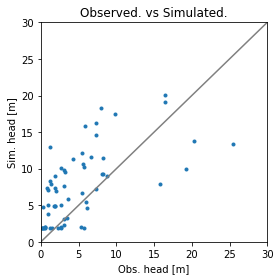

Error is - 8.532889713552262
Params are - [      6.89787277 1498870.03137365       3.88043726       0.42981684
       0.35855914       1.18698147]


KeyboardInterrupt: 

In [138]:
# run optimization 
optimized_flag = True
results = opt.minimize(calibrateo, x0= [   6.91181193, 10.0,    3.87141975,    0.43064608, 0.3584904 ,    1.19389606], method="Nelder-Mead",tol = 0.1)   # [100, 100, 10, .5, .5, .5]
results

# Utilities 

### Write a KML file from a projected shapefile 

In [ ]:
def poly_shp_to_kml(IN_SHP, OUT_KML, colorstring = "01ff0000"):
    
    tmp = geopandas.GeoDataFrame.from_file(IN_SHP)
    tmpWGS84 = tmp.to_crs({'proj':'longlat', 'ellps':'WGS84', 'datum':'WGS84'})
    tmpWGS84.to_file("{}_temp.shp".format(OUT_KML))   
    
    kml = simplekml.Kml(open=1)       # create the kml file
    pfol = kml.newfolder(name="folder")
    openShape = ogr.Open("{}_temp.shp".format(OUT_KML))

    layers = openShape.GetLayerByIndex(0)
    i = 0
    for element in layers:
        geom = loads(element.GetGeometryRef().ExportToWkb())
        i=i+1
        arrcoords = geom.to_wkt()
        pol = pfol.newpolygon() # the part that creates the kml
        pol.style.polystyle.color = colorstring     # 'hexadecimal color string'
        pol.style.polystyle.fill = 0
        pol.style.linestyle.color = "50696969"   
        pol.altitudemode = 'relativeToGround'
        pol.extrude = 1
        coords = arrcoords.replace('POLYGON','').replace('(','').replace(')','')
        coords = coords.replace('MULTI','')
        coords = coords.split(',')
        asize = 1
        pol.outerboundaryis = ([(float(coords[j].split()[0]),float(coords[j].split()[1]),asize) for j in range(len(coords))])

    kml.save(OUT_KML)  # save the kml
    
# from https://publicwiki.deltares.nl/display/OET/From+shape+to+KML

In [ ]:
# Implement     (long run time with small grids)
poly_shp_to_kml(os.path.join(workspace, 'Model_grid.shp'),  os.path.join(figurespace, 'Model_grid.kml') )

### Make Goog-earth point kmls of the Obs Sim and Residuals 

In [ ]:
out_obs_frame = pd.read_csv(os.path.join(workspace, '{}.hob.out'.format(modelname)), sep = "  ", names  = ['Sim_val', 'Obs_val', 'name', 'trash'], skiprows =1, engine='python')
del out_obs_frame['trash']
out_obs_frame = out_obs_frame.merge(Unique_WLs, on ='name', how='inner' )
out_obs_frame['residual'] = out_obs_frame['Sim_val'] - out_obs_frame['Obs_val']

paramaters_list = ['Obs_val', 'Sim_val', 'residual']
colors_list =     ['ff00ff00', 'ffff0000', 'ff0000ff']

def Point_to_kml(paramaters_list, colors_list):

    for idx, val in enumerate(paramaters_list):
        parameter =  val                                                                                     
        p_mean = out_obs_frame[parameter].mean()                                                                      # used for scaling the symbols
        kml = simplekml.Kml()
        for index, row in out_obs_frame.iterrows():                                                                   # iterate over each row
            pnt = kml.newpoint(name=str(round(row[parameter],2)), coords=[( row["Lon"],row["Lat"])])   # change name to row["Sample ID"]  to display just sample id names   
            pnt.iconstyle.icon.href = 'http://maps.google.com/mapfiles/kml/shapes/road_shield3.png'                 # see http://kml4earth.appspot.com/icons.html   for options of symbols
            pnt.iconstyle.color = '70ffffff'                                                                        # Hex color   note forst two digits are transparency last six are the normal hex color digits, see https://www.colorhexa.com/                                     
            pnt.iconstyle.scale = .5                                                                     # apply scaling
            pnt.style.labelstyle.color =  colors_list[idx]    
        kml.save(path = os.path.join(figurespace, "sim_v_obs_{}.kml".format(parameter)))                               # save the kml

In [ ]:
# Implement
Point_to_kml(paramaters_list, colors_list)

### Make Goog-earth overlay kmls of the array inputs

In [ ]:
###### Write a KML overlay from a numpy array input to the model  ######
    
def nparray_to_kml(input_array, out_name, ncol=ncol, nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr]), cmap = plt.cm.jet, **kw):
    
    from osgeo import gdal, osr
    from mpl_toolkits.basemap import Basemap
    from simplekml import (Kml, OverlayXY, ScreenXY, Units, RotationXY, AltitudeMode, Camera)

# turn the numpy array into an asc raster in UTM zone 2S
    the_asc = os.path.join(figurespace, "{}.asc".format(out_name))
    np.savetxt(the_asc, input_array)

    new_first = ('NCOLS {}\n'                        # these are the parameters for the .asc file
                 'NROWS {}\n'
                 'XLLCENTER {}\n'
                 'YLLCENTER {}\n'
                 'CELLSIZE {}\n'
                 'NODATA_value -999.0\n'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))  

    with open(the_asc, 'r+') as file:                # add in new first line and save file  
        file_data = file.read()
        file. seek(0, 0)
        file. write(new_first + '\n' + file_data)
        
        
# turn the new .asc file into a geo-tiff 
    the_tif = os.path.join(figurespace, "{}.tif".format(out_name))
    in_raster = gdal.Open(the_asc)
    gdal.Warp(the_tif ,in_raster, srcSRS='EPSG:{}'.format(model_epsg), dstSRS='EPSG:4326')
    
    
    
# plotting function to plot and format the tif into a Gearth image that doesnt look like crap
    # Note This plotting function is clunky and not very good, but it is the best example I could find so far, probably should do better
    # One of its main issues is that it reads the data upside down and it needs to be flipped with a command, obviously something is wrong
    # from https://gis.stackexchange.com/questions/184727/plotting-raster-maps-in-python
    
    the_png = os.path.join(figurespace, "{}.png".format(out_name))

    ds = gdal.Open(the_tif)              # tif file in
    data = ds.ReadAsArray()

    data = np.flipud(data)    # this is where that sketchy data flip happens

    gt = ds.GetGeoTransform()   
    proj = ds.GetProjection()

    xres = gt[1]
    yres = gt[5]
    xmin = gt[0] + xres * 0.5
    xmax = gt[0] + (xres * ds.RasterXSize) - xres * 0.5
    ymin = gt[3] + (yres * ds.RasterYSize) + yres * 0.5
    ymax = gt[3] - yres * 0.5
    x_center=(xmin+xmax)/2
    y_center=(ymin+ymax)/2  

    m = Basemap(llcrnrlon=xmin,llcrnrlat=ymin,urcrnrlon=xmax,urcrnrlat=ymax, projection='merc', lat_0 = y_center, lon_0 = x_center)
    x = np.linspace(0, m.urcrnrx, data.shape[1])
    y = np.linspace(0, m.urcrnry, data.shape[0])
    xx, yy = np.meshgrid(x, y)

    # create the igure object scaled for google earth   from https://ocefpaf.github.io/python4oceanographers/blog/2014/03/10/gearth/
    aspect = np.cos(np.mean([ymin, ymax]) * np.pi/180.0)
    xsize = np.ptp([xmax, xmin]) * aspect
    ysize = np.ptp([ymax, ymin])
    aspect = ysize / xsize

    if aspect > 1.0:
        figsize = (10.0 / aspect, 10.0)
    else:
        figsize = (10.0, 10.0 * aspect)

    if False:

        plt.ioff()  # Make `True` to prevent the KML components from poping-up.
    fig = plt.figure(figsize=figsize,
                     frameon=False,
                     dpi=1024//10)
    # KML friendly image.  If using basemap try: `fix_aspect=False`.
    ax = fig.add_axes([0, 0, 1, 1])
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    cs = m.pcolormesh(xx, yy, data, cmap=cmap) # alpha = .9)                              
    fig.savefig(the_png,  transparent=False, format='png', dpi=600)  
    

# this is the save KML overlay part, there are some options in here that can be changed for visualization stuff
    # from https://ocefpaf.github.io/python4oceanographers/blog/2014/03/10/gearth/
    
    the_kml = os.path.join(figurespace, "{}.kmz".format(out_name))
    
    kml = Kml()
    altitude = kw.pop('altitude', 2e4)
    roll = kw.pop('roll', 0)
    tilt = kw.pop('tilt', 0)
    altitudemode = kw.pop('altitudemode', AltitudeMode.relativetoground)
    camera = Camera(latitude=np.mean([ymax, ymin]),
                    longitude=np.mean([xmax, xmin]),
                    altitude=altitude, roll=roll, tilt=tilt,
                    altitudemode=altitudemode)

    kml.document.camera = camera
    draworder = 0
    for fig in [the_png]:  # NOTE: Overlays are limited to the same bbox.
        draworder += 1
        ground = kml.newgroundoverlay(name='GroundOverlay')
        ground.draworder = draworder
        ground.visibility = kw.pop('visibility', 1)
        ground.name = kw.pop('name', 'overlay')
        ground.color = kw.pop('color', '9effffff')
        ground.atomauthor = kw.pop('author', 'ocefpaf')
        ground.latlonbox.rotation = kw.pop('rotation', 0)
        ground.description = kw.pop('description', 'Matplotlib figure')
        ground.gxaltitudemode = kw.pop('gxaltitudemode',
                                       'clampToSeaFloor')
        ground.icon.href = fig
        ground.latlonbox.east = xmin
        ground.latlonbox.south = ymin
        ground.latlonbox.north = ymax
        ground.latlonbox.west = xmax

    # now make a legend for the kml file 
    the_ledg = os.path.join(figurespace, "legend_{}.png".format(out_name))
    
    fig = plt.figure(figsize=(1.5, 4.0), facecolor=None, frameon=False)
    ax = fig.add_axes([0.0, 0.05, 0.2, 0.9])
    cb = fig.colorbar(cs, cax=ax)
    cb.set_label(out_name, rotation=-90, color='k', labelpad=20)
    fig.savefig(the_ledg, transparent=True, format='png')  # Change transparent to True if your colorbar is not on space :)

    screen = kml.newscreenoverlay(name='ScreenOverlay')
    screen.icon.href = the_ledg
    screen.overlayxy = OverlayXY(x=0, y=0,
                                 xunits=Units.fraction,
                                 yunits=Units.fraction)
    screen.screenxy = ScreenXY(x=0.015, y=0.075,
                               xunits=Units.fraction,
                               yunits=Units.fraction)
    screen.rotationXY = RotationXY(x=0.5, y=0.5,
                                   xunits=Units.fraction,
                                   yunits=Units.fraction)
    screen.size.x = 0
    screen.size.y = 0
    screen.size.xunits = Units.fraction
    screen.size.yunits = Units.fraction
    screen.visibility = 1

    kmzfile = kw.pop('kmzfile', the_kml) 
    kml.savekmz(the_kml)   

    
# note here are soome mappings that might be useful for this function 
#   xmin,        ymin,        xmax,         ymax
# llcrnrlon,   llcrnrlat,   urcrnrlon,   urcrnrlat 

# reproject existing asc raster to a new coordinate system, not used currently but is part of the above function
#def asc_to_prj_tiff(input_asc, output_tiff, ncol=ncol, nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr])):
#    in_raster = gdal.Open(input_asc)
#    gdal.Warp(output_tiff ,in_raster, srcSRS='EPSG:{}'.format(model_epsg), dstSRS='EPSG:4326') 

In [ ]:
# Implement

# Inputs
nparray_to_kml(top, "topKML")
nparray_to_kml(final_ibound, "final_iboundKML")
nparray_to_kml(HK_raster, "HK_rasterKML")
nparray_to_kml(HK_raster, "HK_rasterKML")
nparray_to_kml(recharge_converted, "recharge_convertedKML")

# outputs
head_plot = head[0]
head_plot = np.where(head_plot < 0, .1, head_plot) # force top elevations to always be higher than bottom elevations
nparray_to_kml(head_plot, "GW_Head", cmap = 'gist_ncar')

## To GMS utilities

Note: to display model in GMS: 
- 1) open up .nam file in GMS. 
- 2) import into GMS with appropriate modflow version (2005 at the moment)
- 3) Open up a coastline shapefile (e.g. tut_poly.shp) in GMS to make sure that it projects correctly, it will prompt to set the display projection
- 4) select 'UTM,  Zone: -2 (174°W - 168°W - Southern Hemisphere), WGS84, meters'
- 5) go to edit -> Transform
- 6) use translate and input value from xll variable (515244.0) and value from yll  (8410178)

In [ ]:
# this is just a little code to export a observation value file for use in GMS. Note to use neeed to open a concept model and obs coverage in GMS then import the OBS_for_GMS_import.csv into that obs coverage.  (dont for get to check heading row)
OBS_4_GMS = Unique_WLs[['x_utm', 'y_utm', 'WL_m_MSL']]
OBS_4_GMS.to_csv(os.path.join(workspace, "OBS_for_GMS_import.csv"))

# Numpy array convert to .asc file

In [ ]:
# take a numpy array from this model and turn it into a .asc raster based on the model geometry dimensions
def nparray_to_asc(input_array, output_raster, ncol=ncol,nrow=nrow, xll=xll, yll=yll, cellsize = np.mean([delc, delr])):

    np.savetxt(output_raster, input_array)

    new_first = ('NCOLS {}\n'                        # these are the parameters for the .asc file
                 'NROWS {}\n'
                 'XLLCENTER {}\n'
                 'YLLCENTER {}\n'
                 'CELLSIZE {}\n'
                 'NODATA_value -999.0\n'.format(ncol,nrow, xll, yll, np.mean([delc, delr]) ))  

    with open(output_raster, 'r+') as file:                # add in new first line and save file  
        file_data = file.read()
        file. seek(0, 0)
        file. write(new_first + '\n' + file_data)

##  Save countour lines from head plot to a line shapefile 

In [ ]:
from shapely.geometry import mapping, LineString,MultiLineString

outshape_name = os.path.join(figurespace, "Head_contours")             # name the file
schema = {'geometry': 'LineString','properties': {'id': 'int', "hed_val": 'float'}}  # sets up parameters for the shapefile

lines = []  # Empty list for contour sections
for i in range(len(cs.collections)):                            
    p = cs.collections[i].get_paths()[0]                          # for each countour line, read the geometry 
    v = p.vertices 
    x = v[:,0]+xll                                                # need to convert grid based origin to UTM meters
    y = v[:,1]+yll
    line = LineString([(i[0], i[1]) for i in zip(x,y)])           #Defines Linestring of the countour
    lines.append(line)                                            #appends to list
    
with fiona.open(outshape_name+".shp", 'w', 'ESRI Shapefile', schema) as c:  # creates new file to be written to
    for j in range(len(lines)):
        contval = cs.cvalues[j]                                   # extract the head value to write to each feature
        l = (lines[j])                                            # write each line to the shapefile
        c.write({'geometry': mapping(l),'properties': {'id': j, "hed_val": contval},})
        
prj = open(outshape_name+".prj", "w"); prj.write(WGS84UTM2S_string) ; prj.close()     # write the .prj file manually

##  Save countour lines from Line shapefile to a KML

In [ ]:
def line_shp_to_kml(IN_SHP, OUT_KML):
    tmp = geopandas.GeoDataFrame.from_file(IN_SHP)
    tmpWGS84 = tmp.to_crs({'proj':'longlat', 'ellps':'WGS84', 'datum':'WGS84'})      # convert from UTM projection to WGS84 no projection
    tmpWGS84.to_file("{}_temp.shp".format(OUT_KML))    

    kml = simplekml.Kml(name='Head_contours', open=1)       # create the kml file
    pfol = kml.newfolder(name="folder")
    openShape = ogr.Open("{}_temp.shp".format(OUT_KML))

    layers = openShape.GetLayerByIndex(0)
    i = 0
    for element in layers:                 # cycle over each contour line
        i=i+1
        # write the geometry to kml format
        geom = loads(element.GetGeometryRef().ExportToWkb())
        arrcoords = geom.to_wkt()    
        arrcoords = geom.to_wkt()
        coords = arrcoords.replace('LINESTRING','').replace('(','').replace(')','')
        coords = coords.split(',')
        format_cords = ([(float(coords[j].split()[0]),float(coords[j].split()[1])) for j in range(len(coords))]) # this just formats the coordinates into what linestring wants
        
        hed_val = str(round(element.GetField("hed_val"),1)) +" m"    # get the head value and round it to 1 sig fig 
        lin = pfol.newlinestring(name = hed_val ,coords = format_cords) # the part that creates the kml

        # set the feature labels to show the GW head
        
        lin.style.linestyle.gxlabelvisibility =True    # not sure how to use this et
        lin.style.labelstyle.scale = 1.5  # Make the text twice as big

        # set line color to grade between two different colors    # modified from https://stackoverflow.com/questions/25668828/how-to-create-colour-gradient-in-python
        c2=np.array(mpl.colors.to_rgb('#ffffff'))  #blue
        c1=np.array(mpl.colors.to_rgb('#800000'))   #red
        hexcolor = mpl.colors.to_hex((1-(i/len(layers)))*c1 + (i/len(layers))*c2)
        hexcolor = hexcolor.replace("#", "ff")
        lin.style.linestyle.color = hexcolor     # 'hexadecimal color string'

        # other random display parameters
        lin.altitudemode = 'clampToGround'
        lin.extrude = 1   
        lin.visibility = 50
        lin.style.linestyle.width = 3  # number of pixels

    kml.save(OUT_KML)
    

In [ ]:
line_shp_to_kml(outshape_name+".shp", outshape_name+".kml")

In [ ]:
np.set_printoptions(suppress=True)

In [ ]:
# currently not used functions 

# sometimes Flopy is annoying and prints too much stuff. This function hides printouts   to use just so somenthing in an indented block under "with HiddenPrints():"
class HiddenPrints:
    def __enter__(self):
        self._original_stdout = sys.stdout
        sys.stdout = open(os.devnull, 'w')

    def __exit__(self, exc_type, exc_val, exc_tb):
        sys.stdout.close()
        sys.stdout = self._original_stdout
        
        
        
        
        
        

##  Save countour lines from head plot to a Polygon shapefile 
        
from shapely.geometry import mapping, Polygon

outshape_name = os.path.join(figurespace, "contours_poly")             # name the file
schema = {'geometry': 'Polygon','properties': {'id': 'int', "hed_val": 'float'}}  # sets up parameters for the shapefile

gons = []  # Empty list for contour sections
for i in range(len(cs.collections)):                            
    p = cs.collections[i].get_paths()[0]                          # for each countour line, read the geometry 
    v = p.vertices 
    x = v[:,0]+xll                                                # need to convert grid based origin to UTM meters
    y = v[:,1]+yll
    poly = Polygon([(i[0], i[1]) for i in zip(x,y)])              #Defines Ploygon of the countour
    line = LineString([(i[0], i[1]) for i in zip(x,y)])           
    gons.append(poly)                                            #appends to list
    
with fiona.open(outshape_name+".shp", 'w', 'ESRI Shapefile', schema) as c:  # creates new file to be written to
    for j in range(len(gons)):
        contval = cs.cvalues[j]                                   # extract the head value to write to each feature
        l = (gons[j])                                            # write each line to the shapefile
        c.write({'geometry': mapping(l),'properties': {'id': j, "hed_val": contval},})
        
prj = open(outshape_name+".prj", "w"); prj.write(WGS84UTM2S_string) ; prj.close()     # write the .prj file manually

In [ ]:
optimized_flag = True